# Preliminary settings
All output files will be appended with shelve_name to distinguish different runs of the notebook.

In [37]:
shelve_name='scipyGlobalOpt_'

If set to 'True', unnecessary evaluations & plots are skipped to facilitate codes development.  

In [38]:
development= True
inspectRate= False

Import libraries

In [39]:
# import resource

# # Convert 4GB to bytes
# memory_limit = 62 * 1024 * 1024 * 1024

# # Set the memory limit
# resource.setrlimit(resource.RLIMIT_DATA, (memory_limit, memory_limit))


In [40]:
from IPython.display import display
import pandas as pd
from KineticLearning.plot import *
import seaborn as sns
import math

# Empirical metabolomics & proteomics data files

Provide technical replicates for all 9 pathway enzymes & 10 metabolites

In [41]:
##### Metabolite replicates
metaboliteData_Rep1_path='data/14rep_50noiseLevel_MM_4strains_METABOLITE.csv.csv'
metaboliteData_Rep2_path='data/15rep_50noiseLevel_MM_4strains_METABOLITE.csv.csv'
metaboliteData_Rep3_path='data/16rep_50noiseLevel_MM_4strains_METABOLITE.csv.csv'

# Enzyme replicates
enzymeData_Rep1_path='data/14rep_50noiseLevel_MM_4strains_ENZYME.csv'
enzymeData_Rep2_path='data/15rep_50noiseLevel_MM_4strains_ENZYME.csv'
enzymeData_Rep3_path='data/16rep_50noiseLevel_MM_4strains_ENZYME.csv'

# no. datapoints required including augmented ones 

IMPORTANT:

no. datapoints should be in multiples of experimental data points

'hours' should be less than or equal to duration of experiment.


In [42]:
hours=24
datapointsPerhour = 4
numberDataPtsNeeded=hours*datapointsPerhour + 1 # include data for time=0

# Specify molecular participants

Participants must be in same order as their input into subsequent kinetic_model.
Names must be identical to imported empirical data

Machine learning of dynamics

Also required for preprocessing 

In [43]:
controls = ['AtoB', 'HMGS', 'HMGR', 'MK', 'PMK', 'PMD', 'GPPS', 'Idi','Limonene Synthase'] # 9 enzymes
states = ['Acetyl-CoA','Acetoacetyl-CoA','HMG-CoA', 'Mev', 'MevP','MevPP', 'IPP','DMAPP','GPP','Limonene']# 10 metabolites

Empirically measured

In [44]:
measured_enzymes = ['AtoB', 'HMGS', 'HMGR', 'MK', 'PMK', 'PMD', 'GPPS', 'Idi','Limonene Synthase'] # 9 enzymes
measured_substrates = ['Acetyl-CoA','Acetoacetyl-CoA','HMG-CoA', 'Mev', 'MevP','MevPP', 'IPP','DMAPP','GPP','Limonene']#10

# Read in raw enzymes & metabolites datasets
Row multi indices based on strain & time

Column multi indices based on controls (enzymes), states (metabolites), derivatives (rates of net production)

In [45]:
from KineticLearning import read_enzymeRawData,read_metaboliteRawData

# Enzyme replicate data
df_enzymeRaw_Rep1=read_enzymeRawData(enzymeData_Rep1_path,controls,time='Time/hours',strain='Strain')
df_enzymeRaw_Rep2=read_enzymeRawData(enzymeData_Rep2_path,controls,time='Time/hours',strain='Strain')
df_enzymeRaw_Rep3=read_enzymeRawData(enzymeData_Rep3_path,controls,time='Time/hours',strain='Strain')

# Metabolite replicate data
df_metaboliteRaw_Rep1=read_metaboliteRawData(metaboliteData_Rep1_path,states,time='Time/hours',strain='Strain')
df_metaboliteRaw_Rep2=read_metaboliteRawData(metaboliteData_Rep2_path,states,time='Time/hours',strain='Strain')
df_metaboliteRaw_Rep3=read_metaboliteRawData(metaboliteData_Rep3_path,states,time='Time/hours',strain='Strain')

In [46]:
df_metaboliteRaw_Rep1.head()

states                                                \
            Acetyl-CoA Acetoacetyl-CoA   HMG-CoA       Mev      MevP   
Strain Time                                                            
WT     0.00   0.323270        0.200792  0.050435  0.298915  0.017996   
       0.25   0.305502        0.200629  0.046934  0.296486  0.032889   
       0.50   0.294609        0.208617  0.050983  0.275905  0.057689   
       0.75   0.294515        0.197193  0.050202  0.215118  0.083055   
       1.00   0.312695        0.193857  0.045474  0.182078  0.113037   

                                                               
                MevPP       IPP     DMAPP       GPP  Limonene  
Strain Time                                                    
WT     0.00  0.201447  0.009249  0.040422  0.048604  0.000000  
       0.25  0.203876  0.007381  0.041601  0.052510  0.000276  
       0.50  0.185439  0.006387  0.040368  0.058537  0.001079  
       0.75  0.194460  0.006558  0.033028  0.063506  0.002167  
       1.00  0.197972  0.008147  0.035598  0.073752  0.003517

In [47]:
df_metaboliteRaw_Rep2.head()

states                                                \
            Acetyl-CoA Acetoacetyl-CoA   HMG-CoA       Mev      MevP   
Strain Time                                                            
WT     0.00   0.295315        0.203393  0.049610  0.292473  0.020236   
       0.25   0.305282        0.204042  0.051312  0.293158  0.032250   
       0.50   0.311576        0.190411  0.048829  0.244411  0.060353   
       0.75   0.287210        0.184339  0.043666  0.206352  0.086020   
       1.00   0.327270        0.187909  0.048222  0.185236  0.102804   

                                                               
                MevPP       IPP     DMAPP       GPP  Limonene  
Strain Time                                                    
WT     0.00  0.182364  0.009452  0.037824  0.049237  0.000000  
       0.25  0.203669  0.007036  0.043247  0.054952  0.000305  
       0.50  0.176889  0.005751  0.041435  0.062848  0.001149  
       0.75  0.191126  0.006666  0.035416  0.062553  0.002458  
       1.00  0.215404  0.007294  0.032755  0.072150  0.004060

In [48]:
df_metaboliteRaw_Rep3.head()

states                                                \
            Acetyl-CoA Acetoacetyl-CoA   HMG-CoA       Mev      MevP   
Strain Time                                                            
WT     0.00   0.301919        0.184715  0.048514  0.300995  0.018765   
       0.25   0.296705        0.205427  0.047520  0.272682  0.032619   
       0.50   0.309504        0.199349  0.049205  0.280040  0.061441   
       0.75   0.293635        0.174492  0.050077  0.237618  0.087811   
       1.00   0.307547        0.189453  0.042419  0.197187  0.107020   

                                                               
                MevPP       IPP     DMAPP       GPP  Limonene  
Strain Time                                                    
WT     0.00  0.193786  0.009556  0.040998  0.048033  0.000000  
       0.25  0.216375  0.006997  0.037137  0.050271  0.000344  
       0.50  0.201433  0.006172  0.037588  0.058882  0.001061  
       0.75  0.201374  0.006744  0.034348  0.061286  0.002151  
       1.00  0.216674  0.008227  0.032110  0.075290  0.003721

# Average of replicate values

Metabolites

In [49]:
#Stack replicate data on top of each other
df_metaboliteRaw_concat = pd.concat(
    (df_metaboliteRaw_Rep1, 
     df_metaboliteRaw_Rep2, 
     df_metaboliteRaw_Rep3)
)
#df_metaboliteRaw_concat.to_csv('df_metaboliteRaw_concat.csv')

# Create dataframe from average of 3 replicates
df_metaboliteRaw = df_metaboliteRaw_concat.groupby(['Strain','Time']).mean()
#df_metaboliteRaw.to_csv('metabolite_average.csv')

df_metaboliteRaw.head()

states                                                \
              Acetyl-CoA Acetoacetyl-CoA   HMG-CoA       Mev      MevP   
Strain   Time                                                            
Strain 1 0.00   0.306835        0.196300  0.049520  0.297461  0.018999   
         0.25   0.296536        0.204060  0.052427  0.265112  0.052612   
         0.50   0.288208        0.199639  0.062367  0.201692  0.113210   
         0.75   0.263392        0.183929  0.071053  0.125925  0.156434   
         1.00   0.271401        0.186543  0.078481  0.078417  0.176959   

                                                                 
                  MevPP       IPP     DMAPP       GPP  Limonene  
Strain   Time                                                    
Strain 1 0.00  0.192532  0.009419  0.039748  0.048625  0.000000  
         0.25  0.202496  0.011354  0.040776  0.053541  0.000134  
         0.50  0.174998  0.014409  0.039759  0.066693  0.000496  
         0.75  0.175672  0.017375  0.033703  0.077580  0.001088  
         1.00  0.180798  0.021516  0.032680  0.101446  0.001943

Enzymes

In [50]:
#Stack replicate data on top of each other
df_enzymeRaw_concat = pd.concat(
    (df_enzymeRaw_Rep1, 
     df_enzymeRaw_Rep2, 
     df_enzymeRaw_Rep3)
)

# Create dataframe from average of 3 replicates
df_enzymeRaw = df_enzymeRaw_concat.groupby(['Strain','Time']).mean()
df_enzymeRaw.head()

controls                                             \
                       AtoB          HMGS           HMGR            MK   
Strain   Time                                                            
Strain 1 0.00  6.082450e+01  3.899512e+01      36.613773  5.713511e+01   
         0.25  4.623589e+06  2.294647e+06  219616.822399  1.384614e+06   
         0.50  5.413871e+06  3.522874e+06  331075.210595  2.208463e+06   
         0.75  6.027501e+06  4.276124e+06  425326.578119  2.527476e+06   
         1.00  6.063303e+06  4.350573e+06  454508.664109  3.138185e+06   

                                                                         \
                         PMK           PMD          GPPS            Idi   
Strain   Time                                                             
Strain 1 0.00      25.267722  5.244708e+01  5.224924e+01      18.570128   
         0.25  473817.229448  2.259331e+06  2.735048e+06  431494.198134   
         0.50  741116.993421  3.872225e+06  3.293242e+06  616722.782670   
         0.75  817806.196468  4.862051e+06  3.478237e+06  770881.423191   
         1.00  978987.234359  5.304373e+06  3.736293e+06  833744.174216   

                                 
              Limonene Synthase  
Strain   Time                    
Strain 1 0.00         29.506563  
         0.25     186542.284533  
         0.50     286414.752383  
         0.75     351941.057897  
         1.00     411111.976360

In [51]:
# # Testing
# from KineticLearning import read_metaboliteRawData
# import pandas as pd
# states = ['Acetyl-CoA','Acetoacetyl-CoA','HMG-CoA', 'Mev', 'MevP','MevPP', 'IPP','DMAPP','GPP','Limonene']# 10 metabolites
# metaboliteData_Rep1_path='data/rep_1_TEST.csv'
# metaboliteData_Rep2_path='data/rep_2_TEST.csv'
# metaboliteData_Rep3_path='data/rep_3_TEST.csv'
# df_metaboliteRaw_Rep1=read_metaboliteRawData(metaboliteData_Rep1_path,states,time='Time/hours',strain='Strain')
# df_metaboliteRaw_Rep2=read_metaboliteRawData(metaboliteData_Rep2_path,states,time='Time/hours',strain='Strain')
# df_metaboliteRaw_Rep3=read_metaboliteRawData(metaboliteData_Rep3_path,states,time='Time/hours',strain='Strain')

# #Stack replicate data on top of each other
# df_metaboliteRaw_concat = pd.concat(
#     (df_metaboliteRaw_Rep1, 
#      df_metaboliteRaw_Rep2, 
#      df_metaboliteRaw_Rep3)
# )
# df_metaboliteRaw_concat.to_csv('df_TEST_concat.csv')

# # Create dataframe from average of 3 replicates
# df_metaboliteRaw = df_metaboliteRaw_concat.groupby(['Strain','Time']).mean()
# df_metaboliteRaw.to_csv('TEST_average.csv')

# Read strain list from enzyme data file

In [52]:
strainList=[]
for strain in df_enzymeRaw.index:
    if strain[0] not in strainList:
        strainList.append(strain[0])
print ('List of ' +str(len(strainList)) + ' strains read in.')

List of 4 strains read in.


# Assess missing data

In [53]:
from KineticLearning import NaN_table

if development==True:
    pass
else:
    # generate NaN summary table
    print('Enzymes:')
    df_NaN_enzymeRaw=NaN_table(df_enzymeRaw) # enzymes
    print('\nMetabolites:')
    df_NaN_metaboliteRaw=NaN_table(df_metaboliteRaw) # metabolites

    #display tables
    display(df_NaN_enzymeRaw) # enzymes
    df_enzymeRaw.head()
    display(df_NaN_metaboliteRaw) # metabolites
    df_metaboliteRaw.head()

# Impute missing data

In [54]:
df_metaboliteImputed = df_metaboliteRaw.groupby('Strain').apply(lambda group: group.interpolate()) # metabolites
df_enzymeImputed = df_enzymeRaw.groupby('Strain').apply(lambda group: group.interpolate()) # enzymes

# Assess effect of imputation on missing data

In [55]:
from KineticLearning import compareTimeSeriesAfterPreprocess

if development==True:
    pass
else:
    # generate NaN summary table
    print('Metabolites data:')
    df_NaN_metaboliteImputed=NaN_table(df_metaboliteImputed)
    print('\nEnzymes data:')
    df_NaN_enzymeImputed=NaN_table(df_enzymeImputed)
    
    # display(df_metaboliteImputed)
    
    #print ('\n----------------------------------------------------\nMetabolites plots before & after imputation:\n')
    #compareTimeSeriesAfterPreprocess(df_metaboliteRaw,df_metaboliteImputed,'states',
    #                             strainList,preprocessLabel='After Imputation')

    # display(df_enzymeImputed)

# Smoothen & augment data using non-parametric approach

M-spline method is used.

In [56]:
from KineticLearning import smoothenTimeSeries2

# Metabolites
df_metaboliteSmooth=smoothenTimeSeries2('states',df_metaboliteImputed,strainList,numberDataPtsNeeded,
                               cubicSpline=True)
# Enzymes
df_enzymeSmooth=smoothenTimeSeries2('controls',df_enzymeImputed,strainList,numberDataPtsNeeded,
                               cubicSpline=True)

# Inspect outcome of data smoothening & augmentation 

metabolites

In [57]:
if development==True:
    pass
else:
    compareTimeSeriesAfterPreprocess(df_metaboliteRaw,df_metaboliteSmooth,'states',
                                 strainList,preprocessLabel='After smoothening')

enzymes

In [58]:
if development==True:
    pass
else:
    compareTimeSeriesAfterPreprocess(df_enzymeRaw,df_enzymeSmooth,'controls',
                                 strainList,preprocessLabel='After smoothening')

# Combine metabolites & enzymes dataframes

In [59]:
df_allSmooth=pd.concat([df_metaboliteSmooth,df_enzymeSmooth],axis=1)

if development==True:
    pass
else:
    df_allSmooth.head()

# Compute rate of reaction

In [60]:
from KineticLearning import estimate_state_derivative

df_allSmooth=estimate_state_derivative(df_allSmooth,5,2)

if development==True:
    pass
else:
    display(df_allSmooth) #new
    df_allSmooth.to_csv(shelve_name + '_df_allSmooth.csv')

# Inspect quality of reaction rates

Check if derivatives are reliable enough to regenerate metabolite time profiles.

In [61]:
if inspectRate==True:
    from KineticLearning import check_derivative
    check_derivative(df_allSmooth)
    
#HC: synthetic data has sharp conc changes for HMG-CoA, Mev, IPP, DMAPP that are not well estimated by savgol filter 

# Prepare dataframes for model fitting (kr optimization)

enzymes, metabolites

Again:

measured_enzymes = ['AtoB', 'HMGS', 'HMGR', 'MK', 'PMK', 'PMD', 'GPPS', 'Idi','Limonene Synthase']

measured_substrates = ['Acetyl-CoA','Acetoacetyl-CoA','HMG-CoA', 'Mev', 'MevP','MevPP', 'IPP','DMAPP','GPP','Limonene']

In [62]:
# 9 enzymes conc measurement used for fitting model
x_controls = [('controls',control) for control in measured_enzymes]
controls_df = df_allSmooth[x_controls] # dataframe format

# 10 substrates conc measurement used for fitting model
x_states = [('states',state) for state in measured_substrates]
states_df = df_allSmooth[x_states] # dataframe format

# merge enzymes & substrates measurement as single feature dataframe
features_df = pd.merge(controls_df, states_df,left_index=True, right_index=True,how='left')
print('Enzyme & metabolite timepoint data to be used for model fitting')
display (features_df) # check total no. time-series datapoints (all strains)

Enzyme & metabolite timepoint data to be used for model fitting


controls                                            \
                        AtoB          HMGS          HMGR            MK   
Strain   Time                                                            
Strain 1 0.00   6.082450e+01  3.899512e+01  3.661377e+01  5.713511e+01   
         0.25   4.623589e+06  2.294647e+06  2.196168e+05  1.384614e+06   
         0.50   5.413871e+06  3.522874e+06  3.310752e+05  2.208463e+06   
         0.75   6.027501e+06  4.276124e+06  4.253266e+05  2.527476e+06   
         1.00   6.063303e+06  4.350573e+06  4.545087e+05  3.138185e+06   
...                      ...           ...           ...           ...   
WT       23.00  2.806058e+06  2.716837e+06  1.734610e+06  1.964429e+06   
         23.25  2.749613e+06  2.649696e+06  1.714084e+06  2.107597e+06   
         23.50  2.825958e+06  2.669877e+06  1.786594e+06  2.013892e+06   
         23.75  2.688194e+06  2.539673e+06  1.781730e+06  1.923510e+06   
         24.00  2.639673e+06  2.764951e+06  1.738019e+06  2.047623e+06   

                                                                        \
                         PMK           PMD          GPPS           Idi   
Strain   Time                                                            
Strain 1 0.00   2.526772e+01  5.244708e+01  5.224924e+01  1.857013e+01   
         0.25   4.738172e+05  2.259331e+06  2.735048e+06  4.314942e+05   
         0.50   7.411170e+05  3.872225e+06  3.293242e+06  6.167228e+05   
         0.75   8.178062e+05  4.862051e+06  3.478237e+06  7.708814e+05   
         1.00   9.789872e+05  5.304373e+06  3.736293e+06  8.337442e+05   
...                      ...           ...           ...           ...   
WT       23.00  1.469618e+06  4.061957e+06  4.347534e+06  1.241550e+06   
         23.25  1.450050e+06  3.943583e+06  4.490479e+06  1.240515e+06   
         23.50  1.585924e+06  3.959418e+06  4.406181e+06  1.200499e+06   
         23.75  1.532031e+06  3.876796e+06  4.207651e+06  1.300224e+06   
         24.00  1.431555e+06  4.049351e+06  4.386481e+06  1.244816e+06   

                                     states                            \
               Limonene Synthase Acetyl-CoA Acetoacetyl-CoA   HMG-CoA   
Strain   Time                                                           
Strain 1 0.00       2.950656e+01   0.306835        0.196300  0.049520   
         0.25       1.865423e+05   0.296536        0.204060  0.052427   
         0.50       2.864148e+05   0.288208        0.199639  0.062367   
         0.75       3.519411e+05   0.263392        0.183929  0.071053   
         1.00       4.111120e+05   0.271401        0.186543  0.078481   
...                          ...        ...             ...       ...   
WT       23.00      1.461482e+06   0.373784        0.095578  0.019542   
         23.25      1.515575e+06   0.350679        0.095016  0.018474   
         23.50      1.446927e+06   0.358562        0.091475  0.019525   
         23.75      1.460263e+06   0.357204        0.093649  0.020003   
         24.00      1.483635e+06   0.390160        0.091874  0.020269   

                                                                            \
                     Mev      MevP     MevPP       IPP     DMAPP       GPP   
Strain   Time                                                                
Strain 1 0.00   0.297461  0.018999  0.192532  0.009419  0.039748  0.048625   
         0.25   0.265112  0.052612  0.202496  0.011354  0.040776  0.053541   
         0.50   0.201692  0.113210  0.174998  0.014409  0.039759  0.066693   
         0.75   0.125925  0.156434  0.175672  0.017375  0.033703  0.077580   
         1.00   0.078417  0.176959  0.180798  0.021516  0.032680  0.101446   
...                  ...       ...       ...       ...       ...       ...   
WT       23.00  0.013660  0.015177  0.007996  0.002632  0.007420  0.099312   
         23.25  0.013185  0.015130  0.008145  0.002737  0.006669  0.103415   
         23.50  0.013423  0.015344  0.008058  0.002652  0.006479 

rate of reaction

In [63]:
# get rate of reaction for selected metabolites
y_derivatives = [('derivatives',derivative) for derivative in measured_substrates]
y_derivatives_df=df_allSmooth[y_derivatives]

# print ('Sample size of X & y should match:')
# print ('Sample size of X:'+ str(features_df.shape[0])) # df is 'array-like' NOT list
# print ('Sample size of y:'+ str(y_derivatives_df.shape[0])+'\n----------------\n')

print('Rate of reaction time datapoints to be used for model fitting')
display (y_derivatives_df) # check total no. time-series datapoints (all strains), sld be SAME as features_df

Rate of reaction time datapoints to be used for model fitting


derivatives                                                \
                Acetyl-CoA Acetoacetyl-CoA   HMG-CoA       Mev      MevP   
Strain   Time                                                              
Strain 1 0.00    -0.064608        0.008806  0.021721 -0.182148  0.217668   
         0.25    -0.053106       -0.003526  0.026170 -0.206529  0.192783   
         0.50    -0.041605       -0.015858  0.030619 -0.230911  0.167897   
         0.75    -0.035376       -0.015565  0.037936 -0.222820  0.116001   
         1.00    -0.039339       -0.020674  0.033488 -0.168379  0.035841   
...                    ...             ...       ...       ...       ...   
WT       23.00   -0.017770       -0.000124 -0.000686 -0.000171  0.000144   
         23.25   -0.019574        0.002385  0.000098  0.000247  0.000242   
         23.50    0.015711       -0.003510  0.001193  0.000189  0.000448   
         23.75    0.074500       -0.001631  0.002390  0.001204  0.000724   
         24.00    0.133290        0.000247  0.003587  0.002219  0.001000   

                                                                  
                   MevPP       IPP     DMAPP       GPP  Limonene  
Strain   Time                                                     
Strain 1 0.00  -0.041255  0.007145  0.001963  0.011146  0.000024  
         0.25  -0.030686  0.009615 -0.003260  0.031509  0.000980  
         0.50  -0.020117  0.012086 -0.008483  0.051873  0.001936  
         0.75  -0.022586  0.013995 -0.011567  0.067273  0.003063  
         1.00  -0.016799  0.012640 -0.011110  0.088706  0.004138  
...                  ...       ...       ...       ...       ...  
WT       23.00  0.000149  0.000065 -0.000576 -0.009100  0.021258  
         23.25  0.000731 -0.000017 -0.000191 -0.008035  0.002207  
         23.50  0.000225 -0.000055 -0.000239  0.002690  0.034894  
         23.75 -0.000173 -0.000078  0.000991  0.005067  0.025971  
         24.00 -0.000570 -0.000101  0.002220  0.007445  0.017049  

[388 rows x 10 columns]

# Prepare X, y for fitting

In [64]:
import random
random.seed(a='anyString')

# Get X,y for fitting
X=features_df.to_numpy() # dataframe to array
y=y_derivatives_df.to_numpy()


# Evaluate rate constants

In [65]:
from pymoo.core.problem import Problem
from pymoo.core.problem import ElementwiseProblem

# problem definition (object oriented to use population-based approach)
class MyProblem(ElementwiseProblem):
    
    def __init__(self, **kwargs):
        super().__init__(n_var=34, # no. of free parameters
                         n_obj=1, # weighted squared error
                         n_ieq_constr=0, # no inequality
                         xl=np.array([
                         0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,
                         0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,
                         0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,
                         0.0,0.0,-1.30103,0.0                         
                         ]), # lower bounds
                         xu=np.array([
                         9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,
                         9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,
                         9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,
                         9.0,9.0,-1.301029,9.0
                         ]) # upper bounds
                        )
        
    def _kinetic_model(self, e1,e2,e3,e4,e5,e6,e7,e8,e9, #HC: 9
                      s1,s2,s3,s4,s5,s6,s7,s8,s9,s10, #HC: 10
                      k11,k12,k13,k21,k22,k23,k24,k31,k32,k33,k34,k35, #HC: 12 
                      k41,k42,k43,k44,k45,k51,k52,k61,k62,k63,k64,k65, #HC: 12
                      k71,k72,k81,k82,k83,k84,k91,k92,Vin,ks3): #HC: 10
        #HC: 53 parameters (9+10+12+12+10)
        r1 = 10**Vin - ((10**k11) *e1*s1)/((10**k12) + (10**k13)*s1) - (10**k21)*e2*s1*s2*(10**ks3) / ((10**k22)*s2 + (10**k23)*s1 + (10**k24)*s1*s2)     
        r2 = ((10**k11)*e1*s1)/((10**k12) + (10**k13)*s1) - (10**k21)*e2*s1*s2*(10**ks3) / ((10**k22)*s2 + (10**k23)*s1 + (10**k24)*s1*s2)
        r3 = (10**k21)*e2*s1*s2*(10**ks3) / ((10**k22)*s2 + (10**k23)*s1 + (10**k24)*s1*s2) - (10**k31)*e3*s3 / ((10**k32)*s1 + (10**k33)*s2 + (10**k34)*s3 + 10**k35)
        r4 = (10**k31)*e3*s3 / ((10**k32)*s1 + (10**k33)*s2 + (10**k34)*s3 + 10**k35) - (10**k41)*e4*s4 / ((10**k42)*s9 + (10**k43)*s6 + (10**k44)*s4 + 10**k45) # k43*s6 NOT s5
        r5 = (10**k41)*e4*s4 / ((10**k42)*s9 + (10**k43)*s6 + (10**k44)*s4 + 10**k45) - (10**k51)*e5*s5 / ((10**k52) + s5) # k43*s6 NOT s5
        r6 = (10**k51)*e5*s5 / ((10**k52) + s5) - (10**k61)*e6*s6 / ((10**k62)*s5 + (10**k63)*s4 + (10**k64)*s6 + 10**k65)
        r7 = (10**k61)*e6*s6 / ((10**k62)*s5 + (10**k63)*s4 + (10**k64)*s6 + 10**k65) - (10**k71)*e7*s7 / ((10**k72) + s7) - (10**k81)*e8*s7*s8 / ((10**k82) + (10**k83)*s7 + (10**k84)*s8 + s7*s8)
        r8 = (10**k71)*e7*s7 / ((10**k72) + s7) - (10**k81)*e8*s7*s8 / ((10**k82) + (10**k83)*s7 + (10**k84)*s8 + s7*s8)
        r9 = (10**k81)*e8*s7*s8 / ((10**k82) + (10**k83)*s7 + (10**k84)*s8 + s7*s8) - (10**k91)*e9*s9 / ((10**k92) + s9)
        r10 = (10**k91)*e9*s9 / ((10**k92) + s9)
        
        return [r1,r2,r3,r4,r5,r6,r7,r8,r9,r10]
     
    def _derivatives_error_fcn_gen(self, X, y):
        """
        Returns a defined function (NOT numerical value) 
        that reports the error score for given set of model parameters as argument
        X, y: for defining the function
        """

        # Convert array-like data to list for defining error function
        XX = X.tolist() # order according to measured_enzymes, then measured_substrates
        yy = y.tolist()
        #print(str(len(X)))
        #print(str(len(y)))        
        #print ('Sample size of XX & yy should match:')
        #print ('Sample size of XX:'+ str(len(XX))) # df is 'array-like' NOT list
        #print ('Sample size of yy:'+ str(len(yy))+'\n----------------\n')


        # THE FUNCTION BEING DEFINED & TO BE RETURNED
        def _derivatives_error_fcn(free_params):
            # Error evaluation
            derivatives_error = 0 # initialize
            count = 0
            for x_val,y_vals in zip(XX,yy): # FOR EACH PAIR of X & y according to timepoint/strain

                # Prepare argument for 'model' function in the same order
                params = []
                params.extend(x_val[0:9])     # 9 enzymes conc already in same order (index 0 to 8)
                params.extend(x_val[9:19])    # 10 metabolites already in same order (index 9 to 18)
                params.extend(free_params)    # take in SAME argument values for free kinetic parameters

                # Print the instances for each function call
                '''
                print('len x_val:' + str(len(x_val))+'\n')
                print(x_val) # 9 enzyme + 10 metabolite conc at each time point & strain
                print('len y_vals:' + str(len(y_vals))+'\n')
                print(y_vals) # rate of reaction (10 metabolites) at each time point & strain
                print ('len free_params:' + str(len(free_params))+'\n')
                #print (free_params)
                print ('len params:' + str(len(params))+'\n')
                #print (params)
                '''

                #print ('free_params length OUTSIDE _metaboliteProductionRates:' + str( len (free_params) ) )                
                #print (free_params)

                ### Get list of predicted metabolite production rates for THE timepoint/strain  
                mp = self._kinetic_model(*params)
                prediction = [ mp[0], mp[1], mp[2], mp[3], mp[4], mp[5], mp[6], mp[7], mp[8], mp[9] ]            
                
                # Update total error between predicted & measured reaction rates
                # by including error for current timepoint/strain
                # Again, same free params value is used
                derivatives_error += sum([(fx_val - y_val)**2  for fx_val,y_val in zip(prediction,y_vals)])
                count = count + 1
                #derivatives_error += sum([  ( (fx_val - y_val)/y_val )**2  for fx_val,y_val in zip(prediction,y_vals)])
            MSE = (10**5)*derivatives_error/( count*len(prediction) )
            #print ('count: ' + str(count))
            return MSE #derivatives_error # return numerical value

        return _derivatives_error_fcn

    def _evaluate(self, x, out, *args, **kwargs):
        '''
        x: one-dimensional NumPy array of length n_var, i.e., 34 kr parameter values
        '''
        
        #print ('no. x' + str( len(x) ) )
        #print (x)

        #print (len(X))
        #print (X)
        #print (len(y))
        #print (y)
        self._derivatives_error_fcn = self._derivatives_error_fcn_gen(X, y)
        f = self._derivatives_error_fcn(x) # objective error func
        out["F"] = [f] 


In [66]:
problemInstance = MyProblem()
problemInstance._derivatives_error_fcn_gen(X,y)

kr = [1e+01, 10**8.5,10**8.5, # AtoB
      1e+02, 10**9, 10**9, 10**9, # HMGS
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # HMGR
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # MK        
      1e+02, 1e+08, # PMK
      1e+01, 1e+08, 1e+08, 1e+08, 1e+07, # PMD
      1e+01, 1e+07, # IDI 
      1e+03, 1e+06, 1e+08, 1e+08, # GPPS
      1e+01, 1e+08, # LS
      0.05,10**0.1] # Vin set to 0.05, ks3
import numpy as np
logkr=np.log10(kr)

OUT = {}
problemInstance._evaluate(logkr,OUT)
OUT["F"]

[12.012184460196815]

In [67]:
import multiprocessing
from pymoo.core.problem import StarmapParallelization

n_cores = 8
pool = multiprocessing.Pool(n_cores)
runner = StarmapParallelization(pool.starmap)
problem=MyProblem(elementwise_runner=runner)


# --- Optimization algorithm

In [68]:
algo = 'G3PCX'

from pymoo.operators.sampling.lhs import LHS
if algo == 'SRES':
    from pymoo.algorithms.soo.nonconvex.sres import SRES
    algorithm = SRES(n_offsprings=64, sampling=LHS(), rule=1.0 / 7.0, gamma=0.85, alpha=0.2)
elif algo == 'CMAES':
    from pymoo.algorithms.soo.nonconvex.cmaes import CMAES
    algorithm = CMAES(popsize=64)
elif algo == 'DE':
    from pymoo.algorithms.soo.nonconvex.de import DE
    algorithm = DE(pop_size=64, sampling=LHS(),
    variant="DE/rand/1/bin", CR=0.3, 
    dither="vector", jitter=False)
elif algo == 'ISRES':
    from pymoo.algorithms.soo.nonconvex.isres import ISRES
    algorithm = ISRES(n_offsprings=64, sampling=LHS(), rule=1.0 / 7.0, gamma=0.85, alpha=0.2)
elif algo == 'G3PCX':
    from pymoo.algorithms.soo.nonconvex.g3pcx import G3PCX
    algorithm = G3PCX(pop_size=64,sampling=LHS())
else:
    print ('No such algo: ' + algo + '\n')

from pymoo.termination import get_termination
termination = get_termination("n_gen", 2000)#1e4

## New Functions defined for the loop

In [69]:
def computeR2(estimatedKrList,actualKrList):    
    ''' 
    R2 of fitting actualKr =  estimatedKr
    '''
    # mean of all actual parameter values
    actualKr_mean = np.mean(actualKrList)
    
    RSS = 0 # initiate residual sum of square
    TSS = 0 # intiate total sum of square
    for y,y_hat in zip(actualKrList,estimatedKrList):
        #print( str(y) + ': ' + str (y_hat) ) 
        RSS = RSS + (y - y_hat)**2
        TSS = TSS + (y - actualKr_mean)**2
        
    R2 = 1 -(RSS/TSS)
    if R2 > 0:
        R = R2**(0.5)
    else:
        R=float("NaN")
    neglog = -math.log(1-R2,10)
    
    print ('R2: ' +str(R2) )
    print ('R: ' + str(R) )
    print ('-log10(1-R2): ' + str(neglog) )
    
    return R2, R, neglog

def plot_neglog(R_list, title):
    plt.plot(R_list)
    plt.xlabel('No. of seeds ')
    plt.ylabel('Metric')
    plt.title(title +' metric vs. no. of seeds: ' + str(len(R_list)))

    # Save the plot as a PDF file, create a folder called whatever the title is before running 
    plt.savefig(title + '/seednumber_' + str(len(R_list)) +'_R_check.pdf',transparent=False)
    
    # Show the plot (optional)
    plt.show()


In [70]:
# Use stored solution (CHANGE FOR GMA)
kr = [1e+01, 10**8.5,10**8.5, # AtoB
      1e+02, 10**9, 10**9, 10**9, # HMGS
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # HMGR
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # MK        
      1e+02, 1e+08, # PMK
      1e+01, 1e+08, 1e+08, 1e+08, 1e+07, # PMD
      1e+01, 1e+07, # IDI 
      1e+03, 1e+06, 1e+08, 1e+08, # GPPS
      1e+01, 1e+08, # LS
      10**0.1] # Vin set to 0.05, ks3
import numpy as np
logkr=np.log10(kr)
logkr=np.ndarray.tolist(logkr)
logkr

[1.0,
 8.5,
 8.5,
 2.0,
 9.0,
 9.0,
 9.0,
 2.0,
 8.0,
 8.0,
 8.0,
 8.0,
 2.0,
 8.0,
 8.0,
 8.0,
 8.0,
 2.0,
 8.0,
 1.0,
 8.0,
 8.0,
 8.0,
 7.0,
 1.0,
 7.0,
 3.0,
 6.0,
 8.0,
 8.0,
 1.0,
 8.0,
 0.10000000000000002]

In [71]:
problemInstance = MyProblem()
problemInstance._derivatives_error_fcn_gen(X,y)

krALL = [1e+01, 10**8.5,10**8.5, # AtoB
      1e+02, 10**9, 10**9, 10**9, # HMGS
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # HMGR
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # MK        
      1e+02, 1e+08, # PMK
      1e+01, 1e+08, 1e+08, 1e+08, 1e+07, # PMD
      1e+01, 1e+07, # IDI 
      1e+03, 1e+06, 1e+08, 1e+08, # GPPS
      1e+01, 1e+08, # LS
      0.05,10**0.1] # Vin set to 0.05, ks3
import numpy as np
logkrALL=np.log10(krALL)

# OUT = {}
# problemInstance._evaluate(logkrALL,OUT)
# kkk=OUT["F"]
# kk=kkk[0]
# kk

## Run optimization using different initial seed solutions & evaluate quality of their mean/median

Algorithm in use: G3PCX

Time required: 2293.060460090637
Best solution found: 
X = [ 1.10624157e+00  8.56845763e+00  8.77085610e+00  1.11471781e-06
  8.39183882e+00  8.58733460e+00  8.77824034e+00  2.13523380e+00
  8.26877979e+00  8.14094033e+00  8.16976168e+00  8.12668652e+00
  1.86458060e+00  7.79951056e+00  7.36161243e+00  8.08990366e+00
  7.90712324e+00  1.86851693e+00  7.89150212e+00  1.16862346e+00
  8.21405926e+00  8.20712364e+00  8.17583940e+00  7.17457773e+00
  1.04841063e+00  7.07261954e+00  3.19045149e+00  6.20403783e+00
  8.22893677e+00  8.19235545e+00  1.82873289e+00  8.83827203e+00
 -1.30102998e+00  1.64045262e+00]
F = [11.79419941]
CV = [0.]
R2: 0.9694065277926176
R: 0.9845844442162478
-log10(1-R2): 1.5143712299479808
Mean solution thus far: 
 [1.1062415705663957, 8.568457628076196, 8.770856098204721, 1.1147178133904585e-06, 8.391838820270985, 8.587334597859689, 8.778240339110283, 2.135233795983942, 8.268779793100826, 8.140940325950416, 8.16976168456642, 8.1266865172344

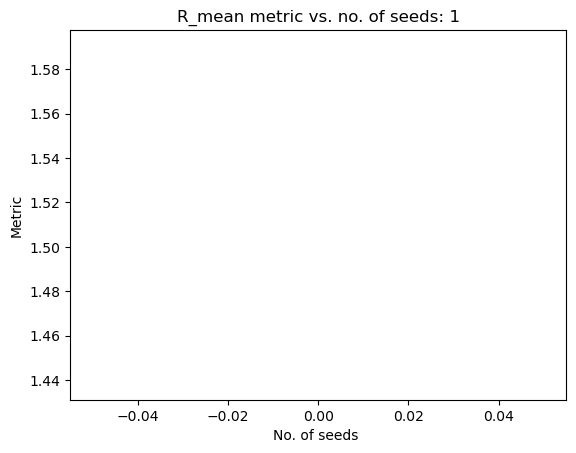

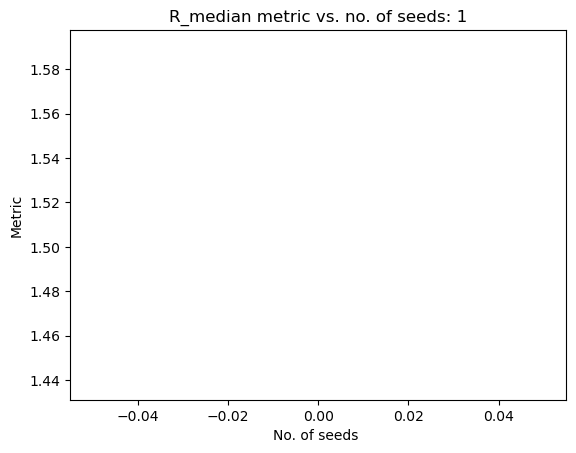

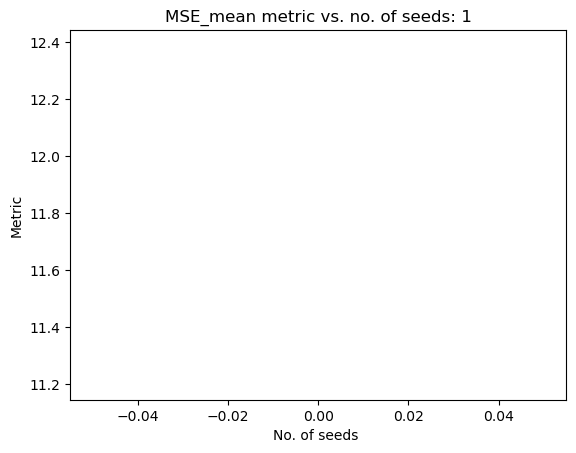

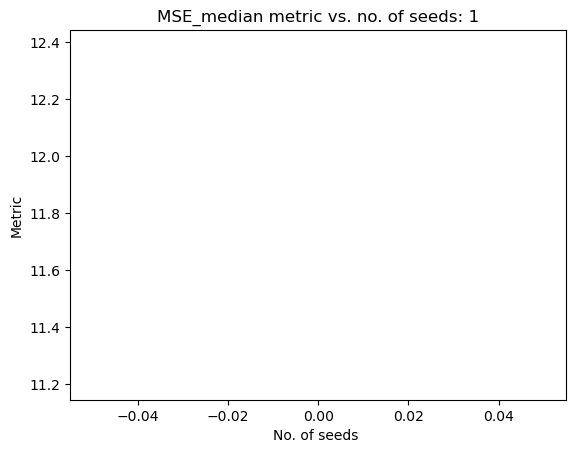

Time required: 2243.831713438034
Best solution found: 
X = [ 0.32001501  7.78319707  7.98290968  0.20130162  8.63271864  8.75240556
  8.87831795  0.67528969  6.69618767  6.77993697  6.53829595  6.69516369
  0.93774424  6.93691956  6.56026204  7.16691036  6.96693882  2.90439669
  8.92797342  0.19487698  7.24054288  7.23344399  7.20253502  6.2013017
  0.51002225  6.53456814  3.48125312  6.4984969   8.52125151  8.48051451
  1.96516395  8.97506254 -1.30103     1.61321642]
F = [11.79459187]
CV = [0.]
R2: 0.9031856644208411
R: 0.9503608074941018
-log10(1-R2): 1.0140603306878868
Mean solution thus far: 
 [0.7131282878508413, 8.175827350181622, 8.376882890766955, 0.10065136934864614, 8.512278730130866, 8.669870080939102, 8.82827914569356, 1.4052617406353503, 7.482483730382007, 7.460438645932493, 7.354028818369221, 7.4109251057283885, 1.4011624204720543, 7.368215063112551, 6.9609372392617, 7.628407012248385, 7.437031031514694, 2.3864568100487804, 8.409737766691174, 0.681750223608518, 7.72730106

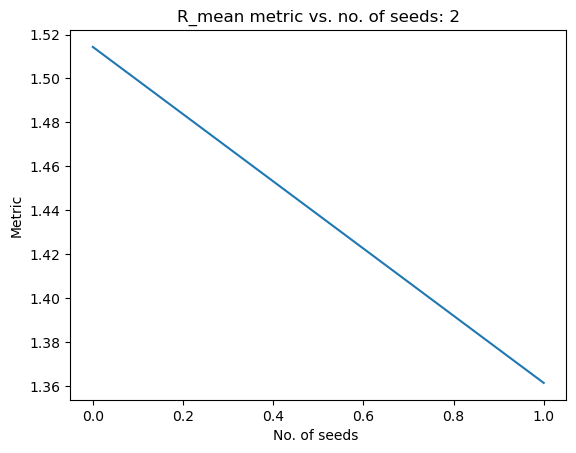

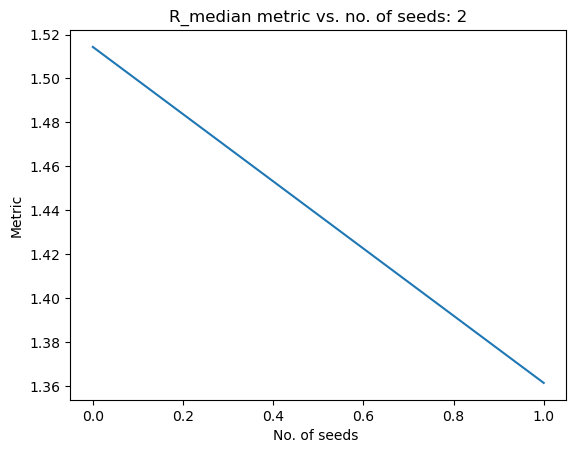

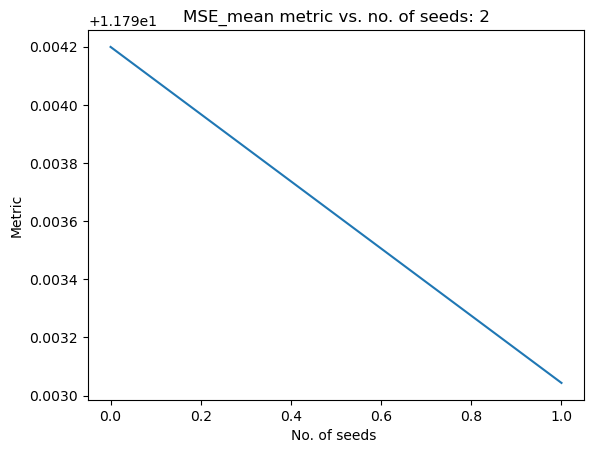

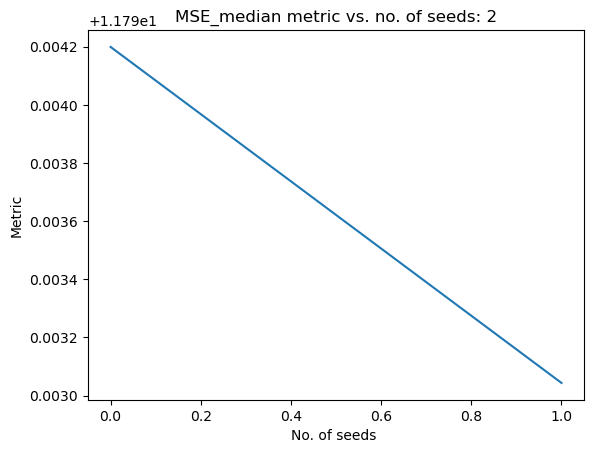

Time required: 2224.8408246040344
Best solution found: 
X = [ 0.67585329  8.13763772  8.34165329  0.55299097  8.13458164  8.30132546
  8.49524314  0.33189995  6.46195609  6.38315654  6.42280658  6.31475441
  1.04085153  6.95717863  6.4567614   7.27164353  7.08710284  0.29689556
  6.3195375   1.68350589  8.73198005  8.72332149  8.6887999   7.68780237
  0.1665637   6.1903897   3.66645446  6.67385201  8.69863391  8.67675217
  1.4079682   8.41708351 -1.30103     0.80784887]
F = [11.79408265]
CV = [0.]
R2: 0.8870770984953622
R: 0.9418477045124451
-log10(1-R2): 0.947217971374708
Mean solution thus far: 
 [0.7007032895306994, 8.163097474071579, 8.365139691591619, 0.25143123520839883, 8.386379701510037, 8.547021875377334, 8.717267143798402, 1.0474744777259808, 7.142307850495189, 7.101344609149032, 7.043621406848697, 7.0455348732464715, 1.2810587912524543, 7.231202918271408, 6.792878627605905, 7.5094858531454385, 7.320388300278688, 1.6899363940052747, 7.713004345026881, 1.0156687798622066, 8.06

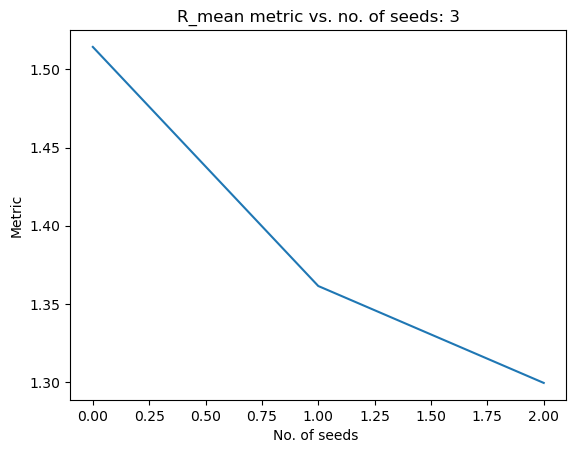

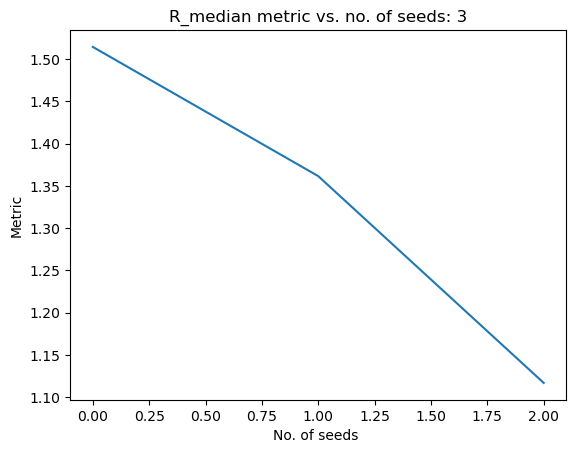

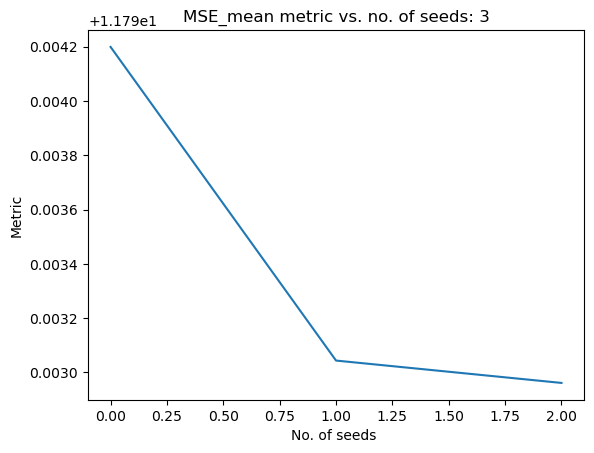

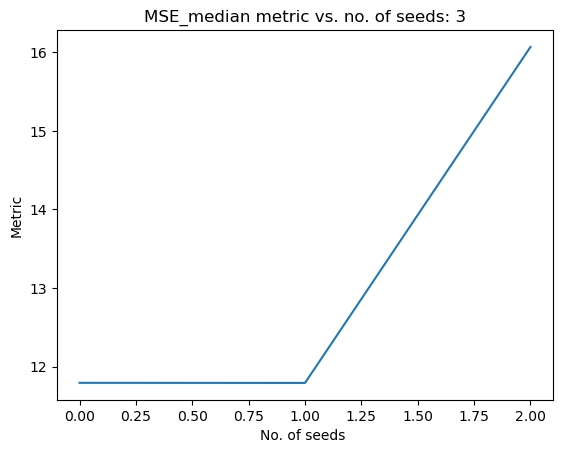

Time required: 2228.319821834564
Best solution found: 
X = [ 7.35747723e-01  8.19837259e+00  8.39996393e+00  1.77699803e-01
  6.97934979e+00  7.12374212e+00  7.25739913e+00  1.80821180e+00
  7.97592621e+00  7.73002935e+00  8.02584441e+00  7.78488321e+00
  1.65860753e+00  7.61746633e+00  7.09399934e+00  7.89842934e+00
  7.69833431e+00  5.33754316e-01  6.55657909e+00  1.66536547e+00
  8.71013184e+00  8.70354509e+00  8.67275144e+00  7.67126576e+00
  2.69038661e-01  6.29307524e+00  3.96385417e+00  6.97699473e+00
  9.00000000e+00  8.96786049e+00  1.60453116e+00  8.61409339e+00
 -1.30103000e+00  2.99166240e-03]
F = [11.79504534]
CV = [0.]
R2: 0.9105688521142707
R: 0.9542373143585775
-log10(1-R2): 1.0485111948628392
Mean solution thus far: 
 [0.7094643978083681, 8.17191625418518, 8.373845750563952, 0.2329983770566286, 8.034622223923883, 8.191201937144225, 8.352300139167138, 1.2376588085163833, 7.350712440640761, 7.2585157955591795, 7.289177157608446, 7.230371957189115, 1.3754459771808913, 7.3

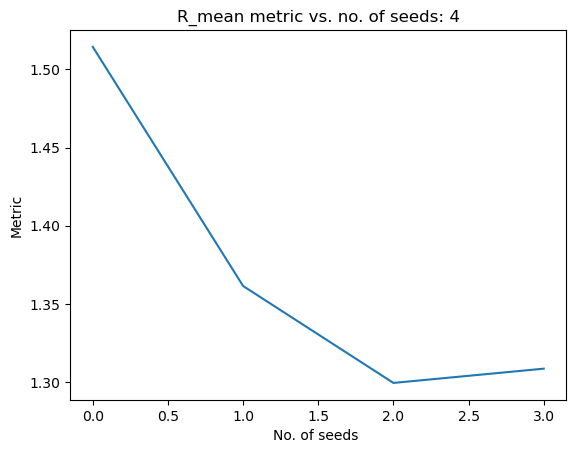

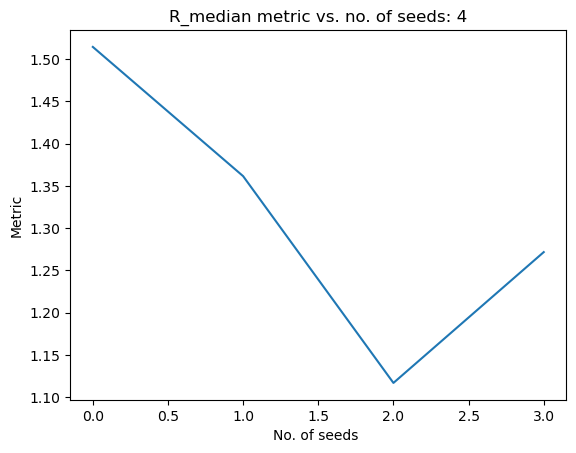

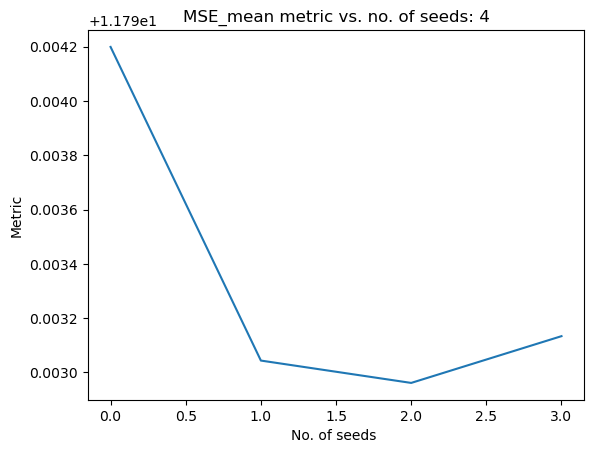

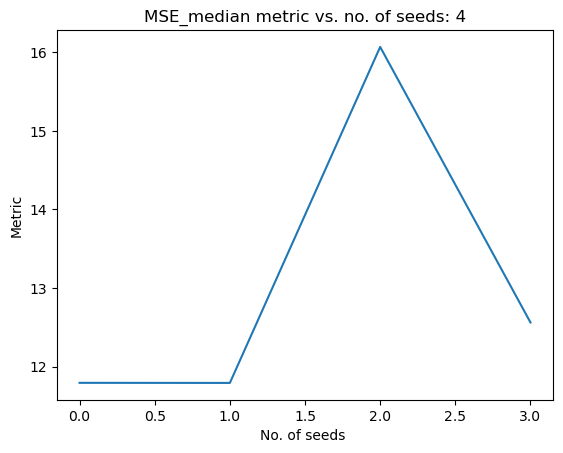

Time required: 2229.583839893341
Best solution found: 
X = [ 0.78780022  8.24868026  8.45526013  0.33251949  8.15453704  8.27305451
  8.39120564  1.52219542  7.56059773  7.57253988  7.40644183  7.54430361
  1.0578726   7.0364179   6.54051282  7.30242617  7.09268967  2.27431986
  8.29718453  0.76446107  7.81302928  7.8064705   7.76919945  6.76885084
  2.62325466  8.64728475  3.46868737  6.48170353  8.50458836  8.47320679
  0.30303951  7.31252818 -1.30103     1.00210876]
F = [11.79393254]
CV = [0.]
R2: 0.9373572639382374
R: 0.9681721251607265
-log10(1-R2): 1.2031292817519106
Mean solution thus far: 
 [0.7251315623716087, 8.187269054542664, 8.390128626093908, 0.25290259941919147, 8.058605186210638, 8.20757245199223, 8.360081239993836, 1.294566131133446, 7.392689498891565, 7.321320613386551, 7.312630091291444, 7.293158288604433, 1.3119313015006833, 7.269498596920188, 6.802629607625478, 7.5458626139842835, 7.3504377746547505, 1.5755766709145902, 7.598555329192227, 1.0953665755759427, 8.1419

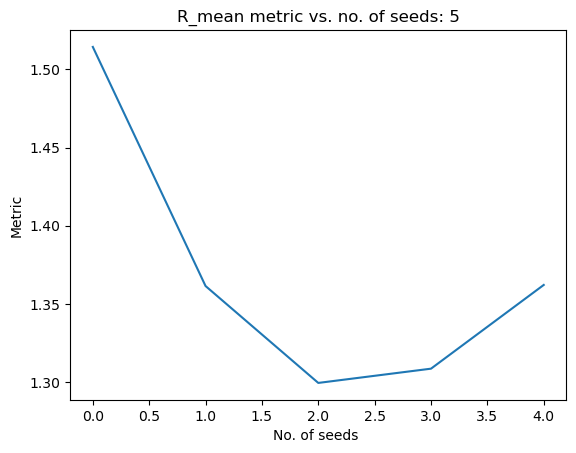

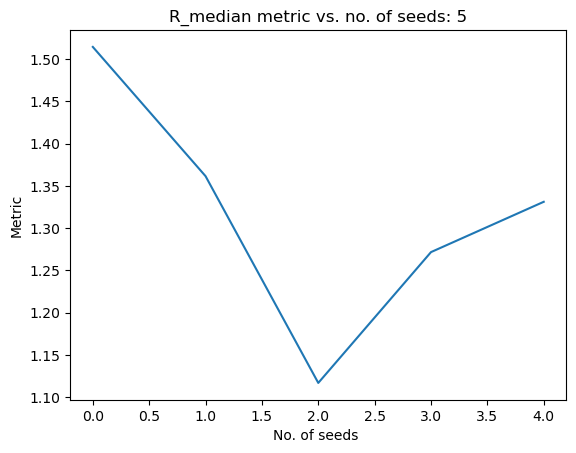

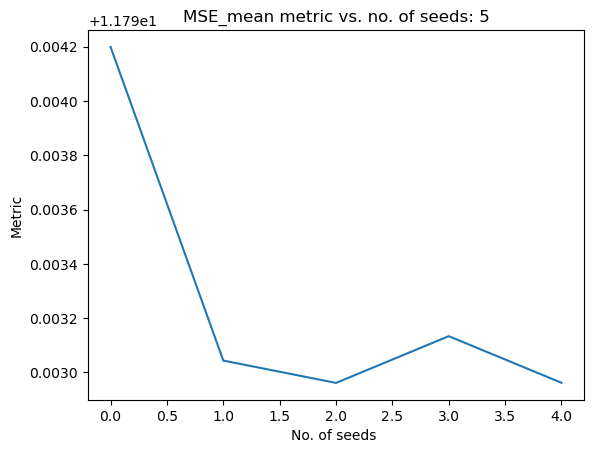

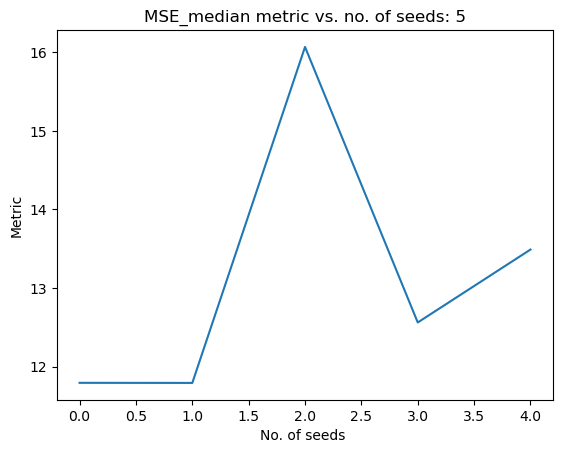

Time required: 2226.265684366226
Best solution found: 
X = [ 0.26741668  7.727415    7.93721647  1.79912152  8.76966348  8.89952287
  8.99999982  2.372252    8.433691    8.40971891  8.25794557  8.38928659
  1.34157237  7.27813279  6.74988961  7.578718    7.38485997  2.81379392
  8.83647589  1.54818469  8.59373364  8.58682766  8.55503965  7.55365722
  2.39597829  8.41992611  2.2860972   5.29929021  7.32317783  7.28928266
  1.42478951  8.43426676 -1.30103     0.1574431 ]
F = [11.7940497]
CV = [0.]
R2: 0.9527448353845904
R: 0.9760864897049802
-log10(1-R2): 1.3255507196118619
Mean solution thus far: 
 [0.6488457494153888, 8.110626712079052, 8.31464326743927, 0.510605752901697, 8.177114901119722, 8.322897521934948, 8.466734337370555, 1.4741804418132576, 7.566189749537468, 7.50272032916824, 7.4701826718705675, 7.475846339030537, 1.3168714792294696, 7.270937628682393, 6.793839607901533, 7.551338511850851, 7.356174806435796, 1.781946212893039, 7.804875421898387, 1.1708362611058574, 8.217246157

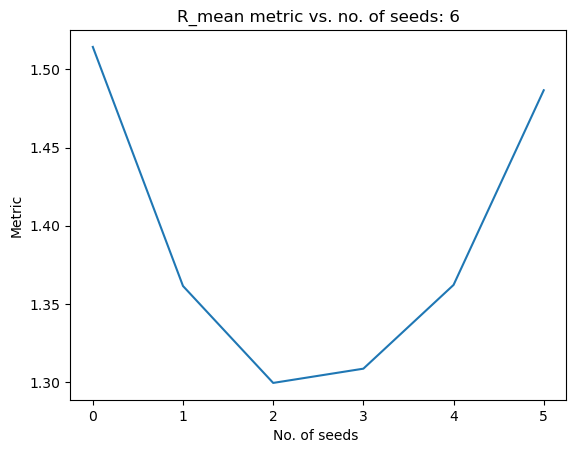

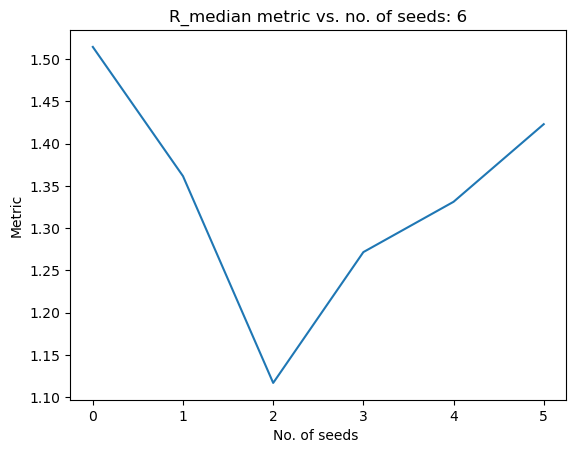

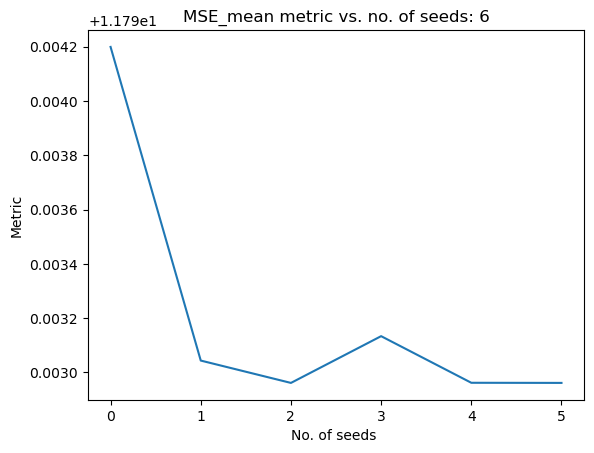

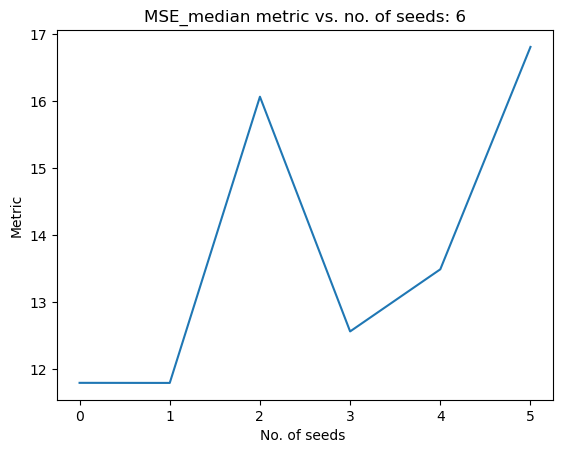

Time required: 2233.4904029369354
Best solution found: 
X = [ 0.04405754  7.50560848  7.7105885   1.78694148  8.69391282  8.84895272
  8.99997667  2.19303686  8.2228541   8.28026272  0.38508212  8.22754377
  2.41493014  8.32744365  7.79033674  8.64680264  8.46278906  1.95509315
  7.97782726  1.07336523  8.11928444  8.11210745  8.07998544  7.0788367
  0.71900272  6.74294199  3.88042965  6.89427418  8.91794118  8.88277748
  0.71418173  7.72369198 -1.30103     0.11885035]
F = [11.79667839]
CV = [0.]
R2: 0.7885516568313712
R: 0.8880043112684596
-log10(1-R2): 0.6747957134754209
Mean solution thus far: 
 [0.5624474342633646, 8.02419553650159, 8.228349728600573, 0.6929394276569353, 8.250943174541499, 8.398048265112324, 8.542911813607136, 1.5768742160301794, 7.659998942538164, 7.613797813267395, 6.458025450103464, 7.58323168633882, 1.4737370015816482, 7.42186706028896, 6.936196340607104, 7.7078333868098765, 7.514262556969123, 1.8066814896992978, 7.829582826986202, 1.1569118280031696, 8.2032516

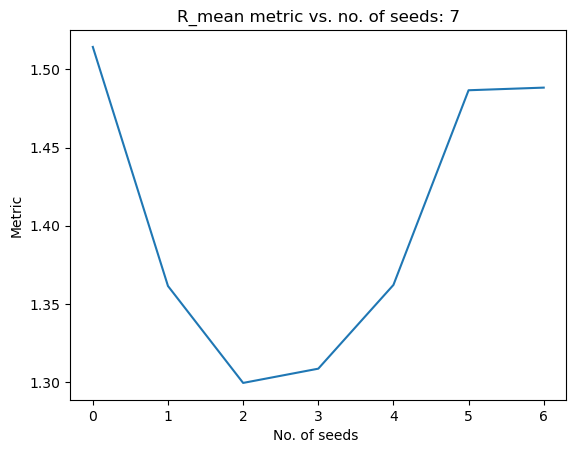

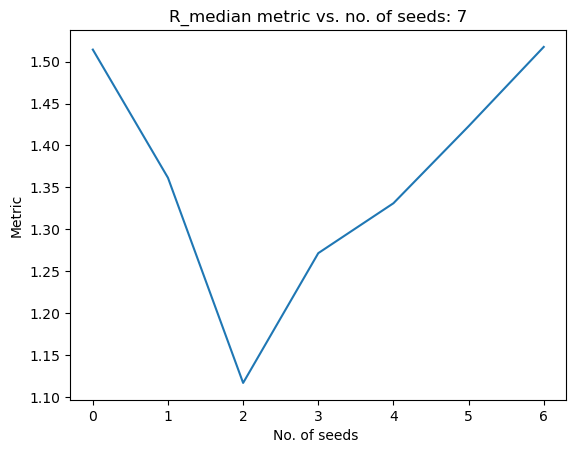

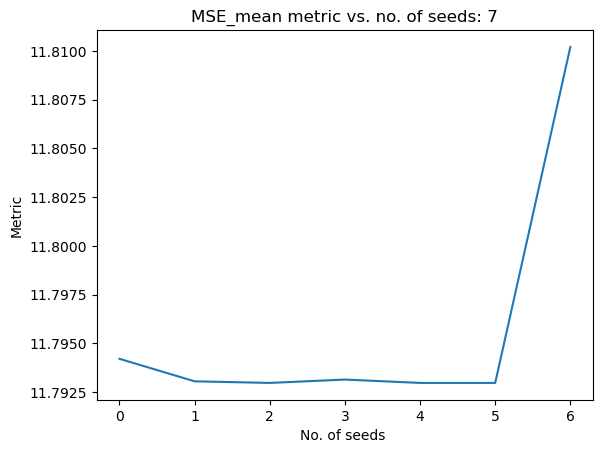

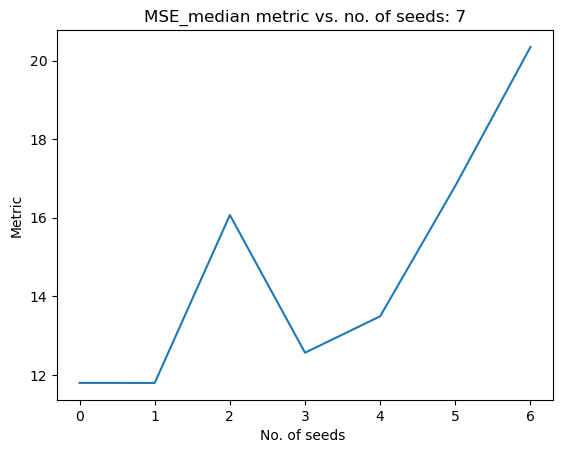

Time required: 2233.5989871025085
Best solution found: 
X = [ 0.09954841  7.561092    7.7658404   1.28109192  8.09363592  8.26699066
  8.47546992  2.45600303  8.53561621  8.55302843  8.27985123  8.46014108
  2.13642504  8.02690753  7.538481    8.36401877  8.18584737  2.10564774
  8.12801682  0.61290406  7.65878796  7.65168073  7.61922775  6.61798034
  1.2407936   7.26453116  0.81005224  3.8231003   5.84835244  5.81188129
  1.16536161  8.17474819 -1.30103     0.04614825]
F = [11.79449872]
CV = [0.]
R2: 0.9168398034630435
R: 0.9575175212303133
-log10(1-R2): 1.0800844929478934
Mean solution thus far: 
 [0.5045850557398079, 7.966307594347677, 8.170536061973014, 0.7664584891445871, 8.231279767688209, 8.381666064862879, 8.53448157686704, 1.6867653171906343, 7.76945110098155, 7.731201640204642, 6.685753672173974, 7.692845360462491, 1.5565730064625898, 7.497497118511985, 7.0114819236395896, 7.789856559254402, 7.598210658713471, 1.8440522713109628, 7.866887076187277, 1.0889108573860957, 8.13519

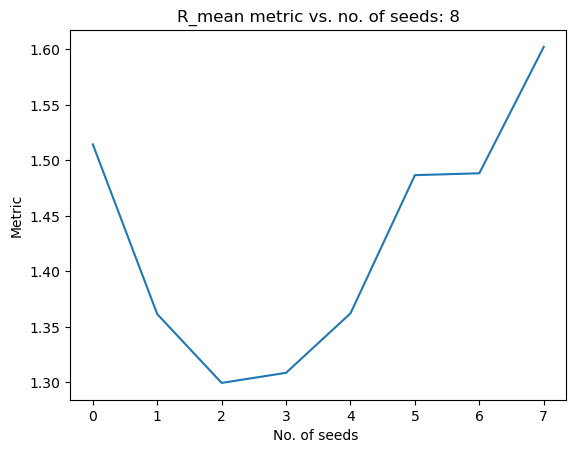

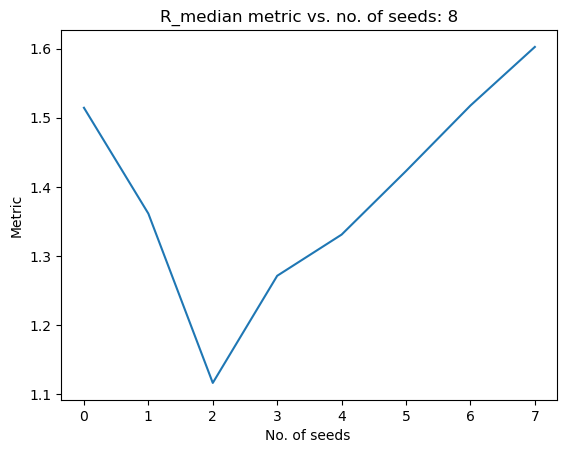

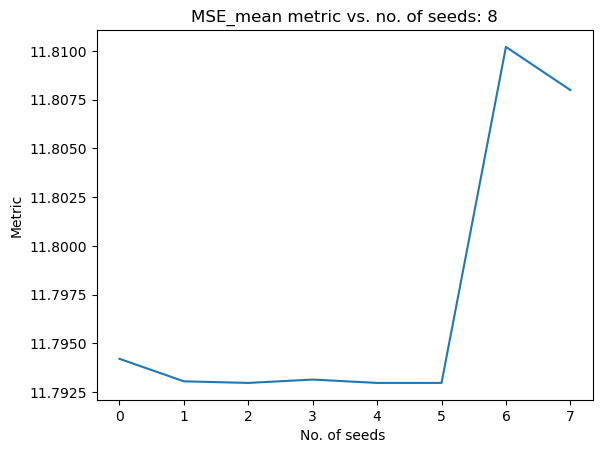

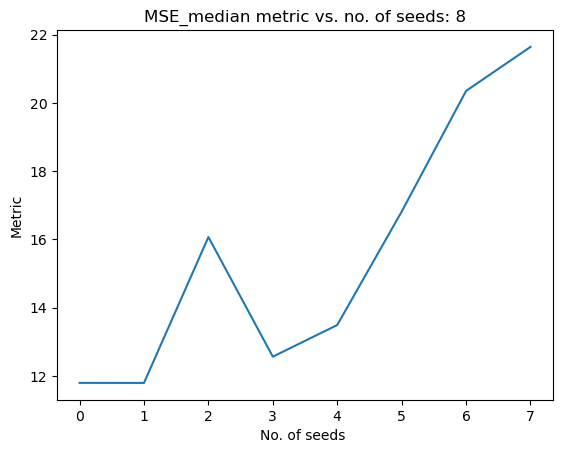

Time required: 2228.756757736206
Best solution found: 
X = [ 0.18343981  7.64451865  7.85085347  1.25447434  8.28490245  8.39141303
  8.4748767   1.0198918   7.06800196  7.05621593  6.9934807   7.03752822
  1.75420985  7.74613079  7.28639229  7.99598848  7.7858507   0.19537665
  6.21829436  0.86351522  7.90948839  7.90272401  7.87032962  6.86882634
  1.51394616  7.53802274  0.86006295  3.87307281  5.89772738  5.86277826
  1.48800746  8.49739339 -1.30103     0.19781508]
F = [11.79425266]
CV = [0.]
R2: 0.8884052722342108
R: 0.9425525302253508
-log10(1-R2): 0.9523563229281183
Mean solution thus far: 
 [0.46890225029919186, 7.930553267465377, 8.135015774034423, 0.8206824725552968, 8.237237843269696, 8.382749060704791, 8.527858812733589, 1.6126682592771875, 7.691512307717506, 7.656203227979508, 6.719945564400038, 7.62003234522579, 1.5785326558528394, 7.525123081631587, 7.042027520390513, 7.81276010616127, 7.619059551836888, 1.6608660910655622, 7.683710108184521, 1.0638668976949952, 8.110115

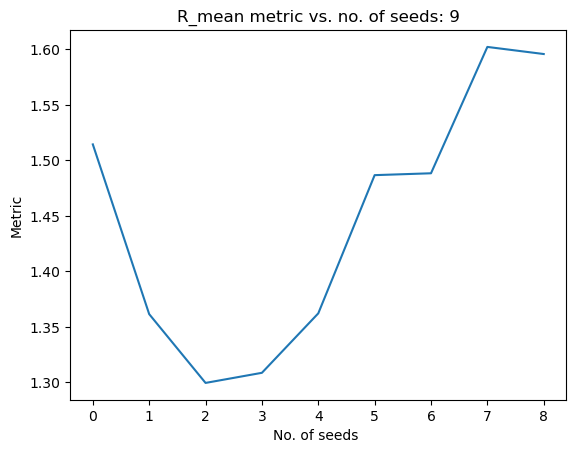

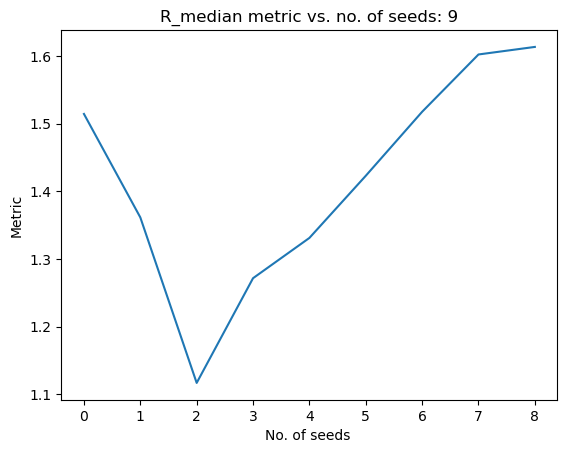

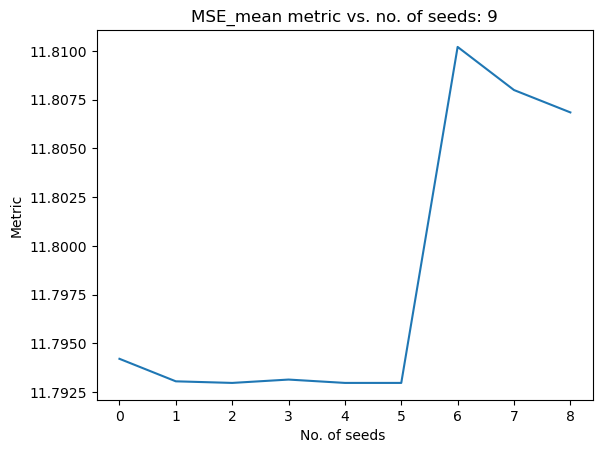

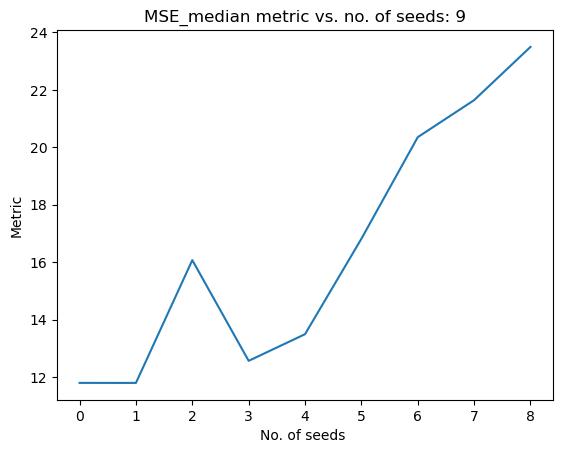

Time required: 2220.1301119327545
Best solution found: 
X = [ 1.00911327  8.46994449  8.67713784  0.12422591  8.39126146  8.57646301
  8.77801741  0.13246229  6.26071627  6.14736795  6.07817705  6.12690051
  1.76261025  7.6102089   6.94168383  7.99825006  7.81909397  2.81681376
  8.83834732  1.66890149  8.71264318  8.70570086  8.67595235  7.67400225
  0.38094779  6.40412118  3.79669352  6.80947592  8.83418313  8.7983463
  0.11355094  7.1226967  -1.30103     1.5090673 ]
F = [11.79662014]
CV = [0.]
R2: 0.8923442887714009
R: 0.944639766668438
-log10(1-R2): 0.9679629255314199
Mean solution thus far: 
 [0.5229233519840769, 7.98449238934724, 8.189227980260469, 0.7510368161490591, 8.25264020460182, 8.402120455994165, 8.55287467236616, 1.4646476626898377, 7.548432703737714, 7.505319700240688, 6.655768713047481, 7.470719161763173, 1.5969404148432287, 7.53363166378003, 7.0319931510037605, 7.8313091018019545, 7.639062993949001, 1.7764608578639867, 7.7991738295281525, 1.1243703567692809, 8.1703680

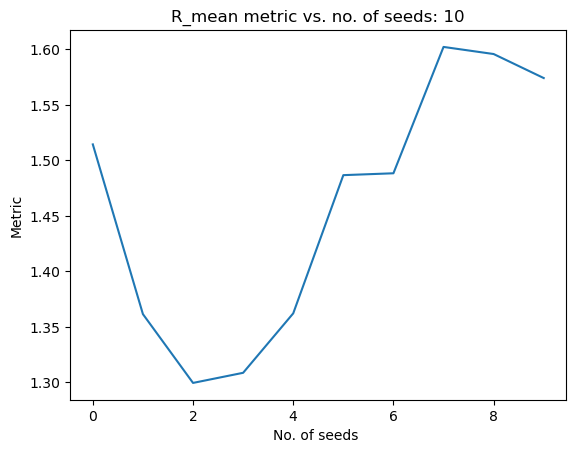

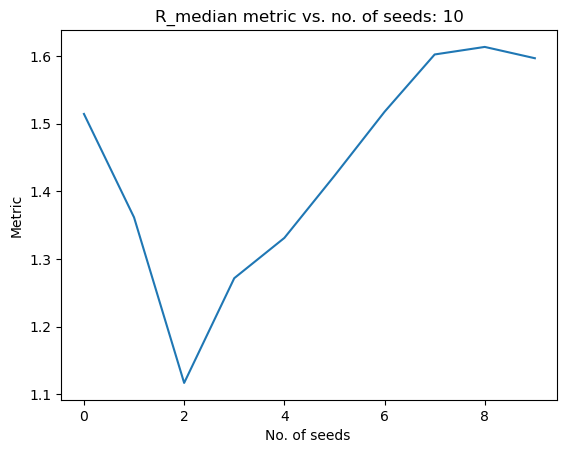

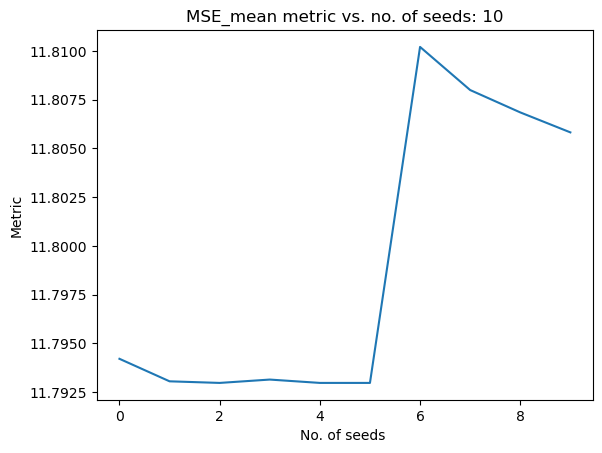

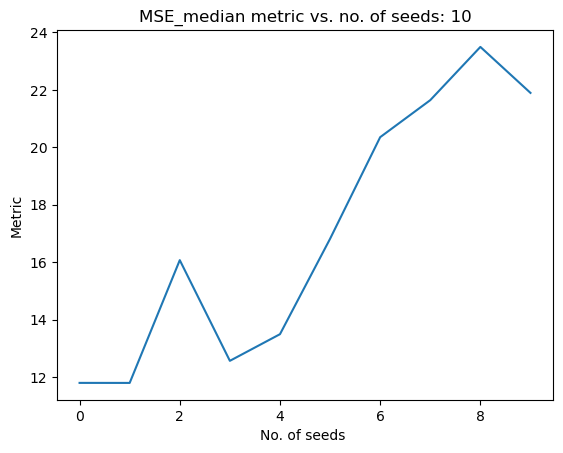

Time required: 2224.64044547081
Best solution found: 
X = [ 0.22236779  7.68304787  7.89071702  0.23661044  7.35994559  7.49852233
  7.61285178  0.68418447  6.79795163  6.65254696  6.73940258  6.68594059
  1.53531063  7.49356387  6.97319826  7.77527523  7.57476991  2.42318593
  8.4458797   1.6824623   8.72811478  8.72077558  8.68954575  7.68789605
  2.19742211  8.22140458  3.00941981  6.02309033  8.04771655  8.01130637
  1.67786497  8.68732848 -1.30103     0.31827161]
F = [11.79349221]
CV = [0.]
R2: 0.9080510674075949
R: 0.9529171356459044
-log10(1-R2): 1.0364533079910925
Mean solution thus far: 
 [0.49560011891963535, 7.957088341769981, 8.162090620524873, 0.7042707815506645, 8.171486149002511, 8.31997517226079, 8.467418046127525, 1.3936964635062379, 7.48020715170415, 7.427794905724198, 6.66337179170491, 7.399375655132574, 1.5913377068851728, 7.529989136776743, 7.026648160916901, 7.826215113126258, 7.633218168560518, 1.8352540459212248, 7.857965271848872, 1.175105987664827, 8.221072336

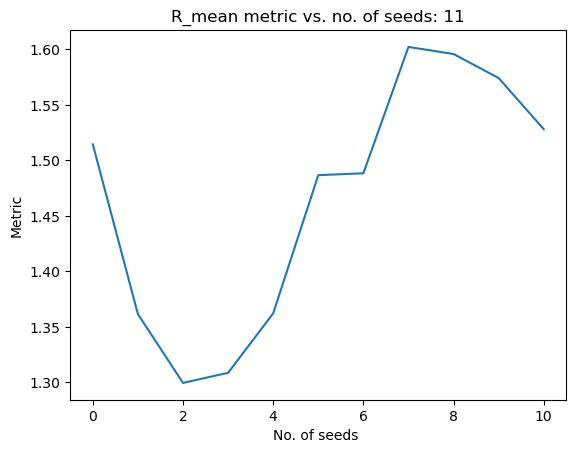

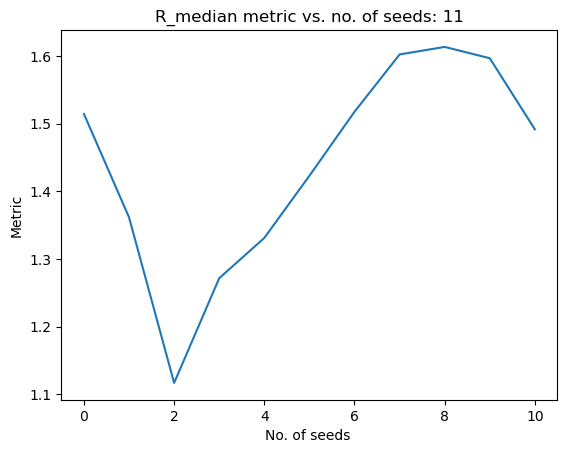

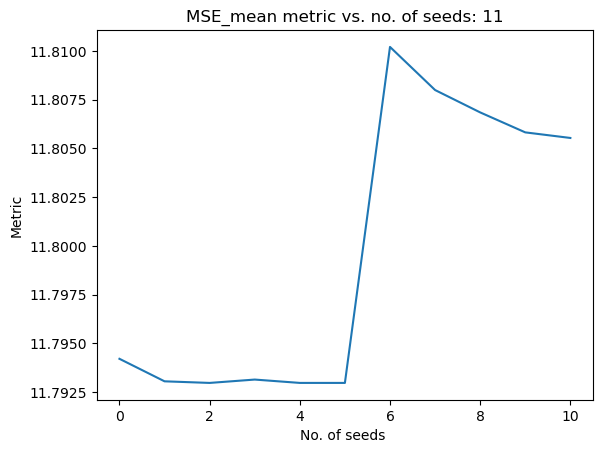

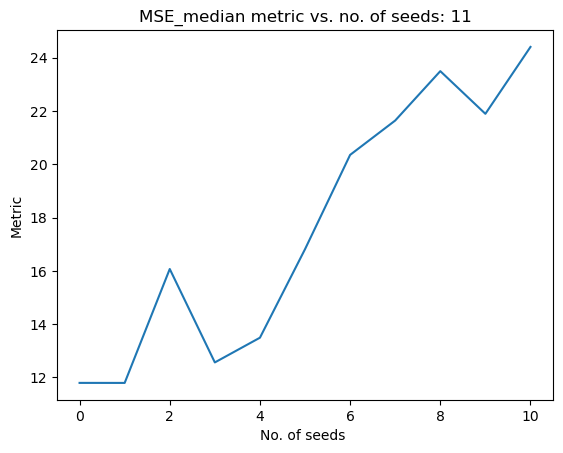

Time required: 2223.34881401062
Best solution found: 
X = [ 0.85906707  8.31999124  8.52681445  0.92774898  7.77982086  7.97080005
  8.20473234  0.07297986  6.13150213  6.21936129  5.86229961  6.07735053
  1.98108618  7.90992079  7.44658825  8.2131845   8.02430624  1.8567548
  7.87954587  1.73311485  8.77691493  8.77033073  8.74127563  7.73939412
  1.28986903  7.31390879  3.71403514  6.73085429  8.75503614  8.71188595
  0.27465962  7.28428756 -1.30103     0.10294111]
F = [11.79537862]
CV = [0.]
R2: 0.9043137488036876
R: 0.950954125499063
-log10(1-R2): 1.0191504599089594
Mean solution thus far: 
 [0.5258890316224155, 7.987330249643978, 8.192484273129116, 0.7228939644795463, 8.138847375240369, 8.29087724547654, 8.44552757021428, 1.2836367464402496, 7.367815066343642, 7.3270921047757165, 6.596615776521926, 7.2892068950732956, 1.6238167465538398, 7.561650108085544, 7.0616431679697245, 7.858462562373938, 7.665808841516475, 1.8370457752651068, 7.859763654976368, 1.2216067259183103, 8.2673925

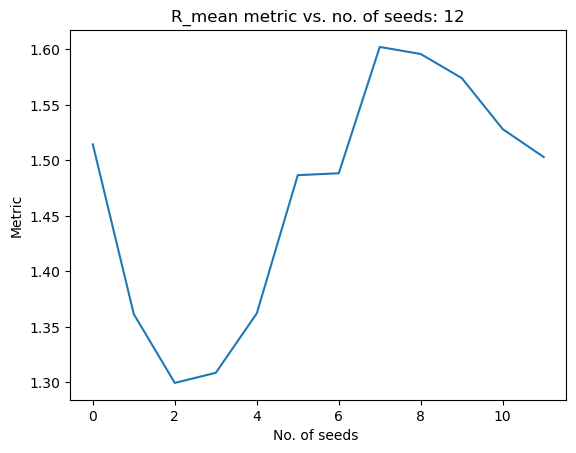

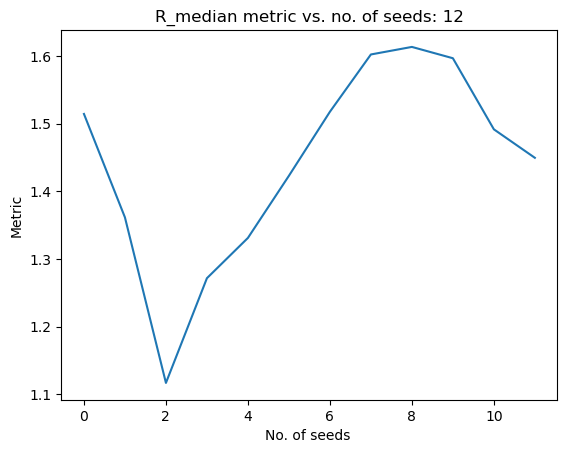

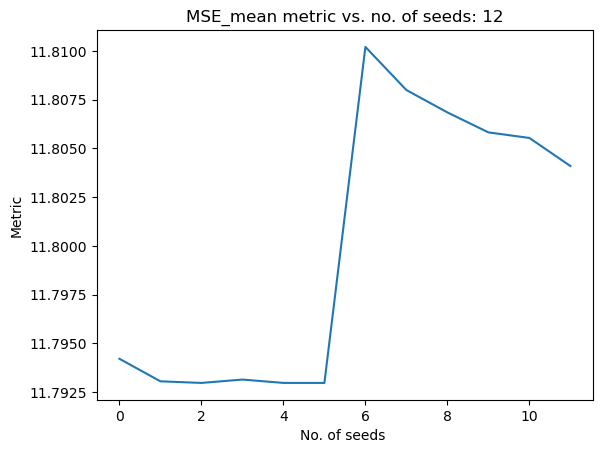

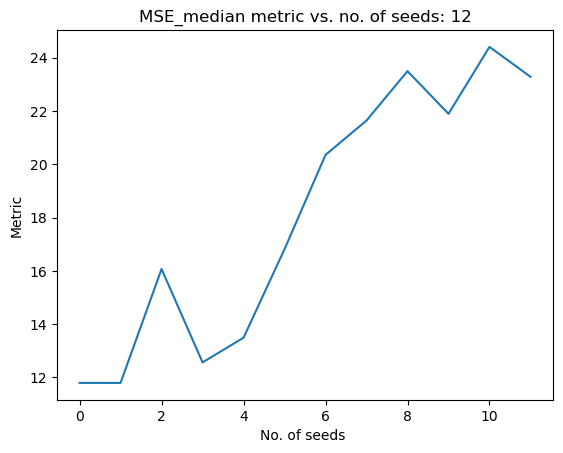

Time required: 2227.125211954117
Best solution found: 
X = [ 0.47081206  7.93293474  8.13566483  0.77136289  7.73760791  7.91014998
  8.0895791   0.82377774  6.96322658  6.80478986  6.87765698  6.81559158
  1.67034299  7.5798318   6.98267861  7.90670933  7.71918501  2.72955401
  8.75189059  0.51306481  7.55975391  7.55226614  7.51901041  6.51776183
  1.25066786  7.2744241   2.89361937  5.90677832  7.93143713  7.89567025
  1.56095281  8.57037889 -1.30103     0.19526605]
F = [11.79450563]
CV = [0.]
R2: 0.9455918874889822
R: 0.9724154911811012
-log10(1-R2): 1.2643363400795415
Mean solution thus far: 
 [0.5216523416864635, 7.98314597981071, 8.188113547104788, 0.7266223431551323, 8.107982800628436, 8.261590532969274, 8.418146918992715, 1.2482629770427118, 7.336692875417187, 7.286915008902046, 6.618234330252372, 7.252774948016242, 1.6273956885826608, 7.563048700056072, 7.055568971121881, 7.862173851834219, 7.669914700366851, 1.9057002549696938, 7.9283888036949275, 1.1671035016064182, 8.21295

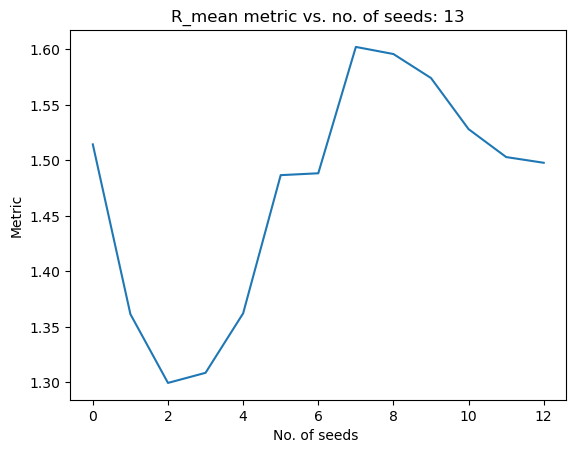

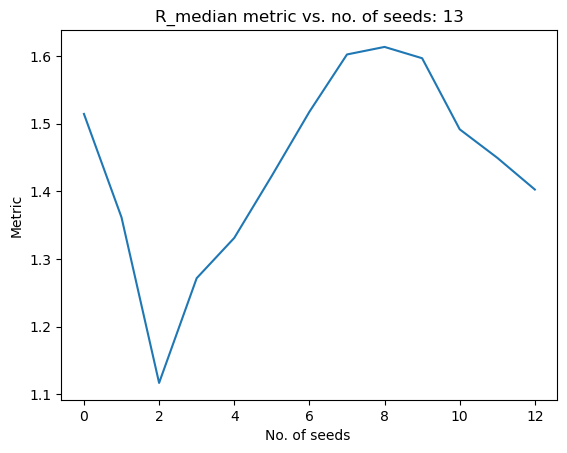

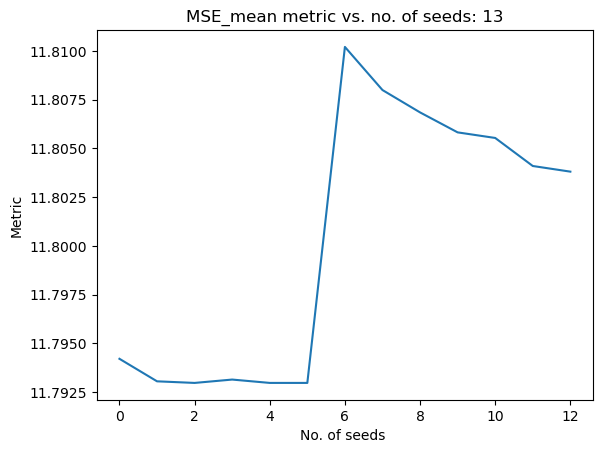

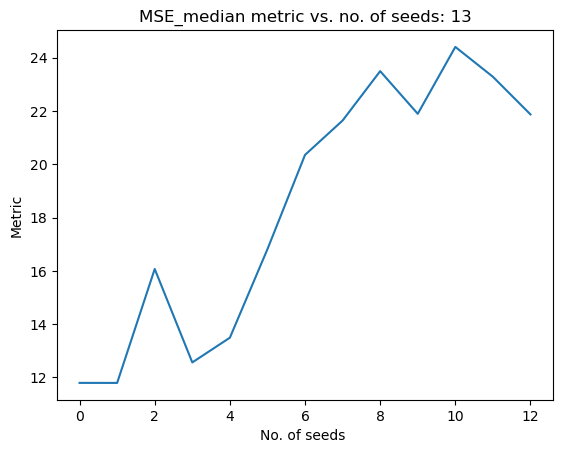

Time required: 2233.4130432605743
Best solution found: 
X = [ 0.07545874  7.53712446  7.74157434  0.24919059  8.09007468  8.23878539
  8.4145728   1.61909484  7.66452788  7.72794163  7.43738214  7.63289752
  2.75733642  8.69473323  8.19610344  8.99168967  8.80021107  0.20348676
  6.22630807  0.92664256  7.97269906  7.96568076  7.93324982  6.93213715
  1.42686829  7.45090996  2.67814961  5.69131035  7.7154212   7.68124325
  1.6441927   8.65375064 -1.30103     1.05085203]
F = [11.79363486]
CV = [0.]
R2: 0.9366990477709151
R: 0.9678321382196993
-log10(1-R2): 1.1985897568905974
Mean solution thus far: 
 [0.48978137036978453, 7.951287299928007, 8.15621788933426, 0.6925200754241246, 8.106703649195216, 8.25996159385509, 8.417891624528778, 1.2747509671144344, 7.360109661477525, 7.318416910423091, 6.676744888306534, 7.279926560166637, 1.708105740784547, 7.643883309352247, 7.137035718564634, 7.942853553383751, 7.750650155122495, 1.784113576952323, 7.806811608444299, 1.1499277198089197, 8.1957973

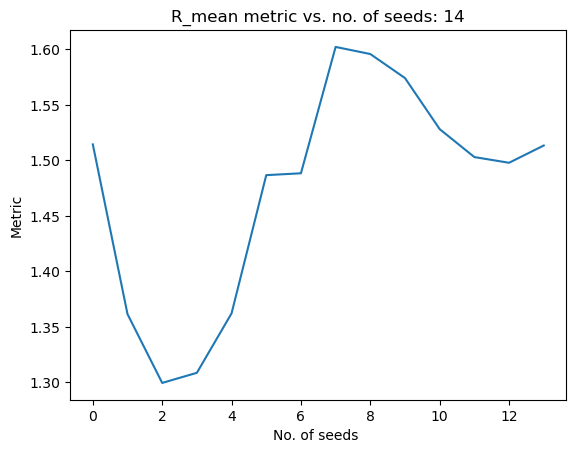

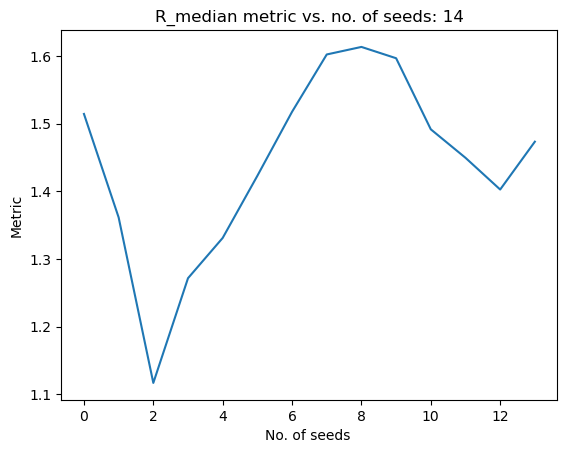

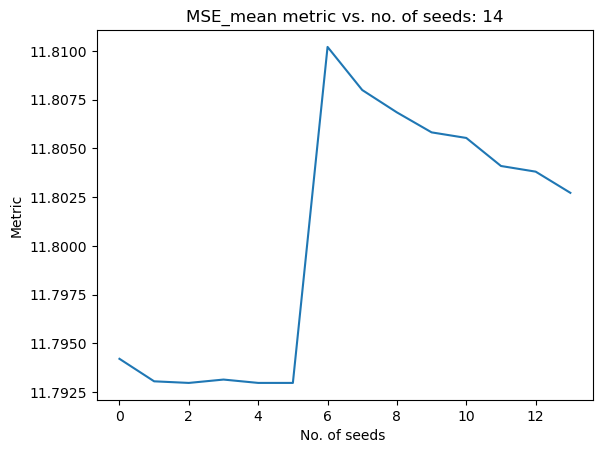

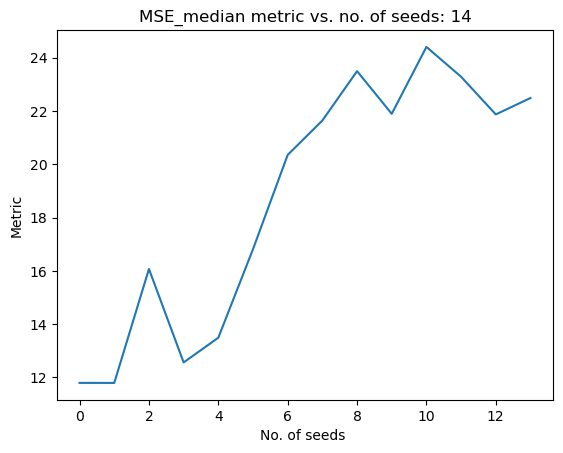

Time required: 2230.237428665161
Best solution found: 
X = [ 1.21315036  8.67476005  8.8795318   0.85220979  8.4058857   8.5825113
  8.75123014  1.7455892   7.91609369  7.66436263  7.89683634  7.72694766
  2.53040318  8.45555057  7.94336063  8.76492699  8.57508219  2.13631392
  8.15876392  0.89571414  7.94095105  7.93430256  7.90246634  6.90111976
  1.76936189  7.79319356  3.84346765  6.85716278  8.88111553  8.84559945
  1.63018197  8.63960813 -1.30103     0.78451838]
F = [11.79530312]
CV = [0.]
R2: 0.9698671067472834
R: 0.984818311541415
-log10(1-R2): 1.5209591669205957
Mean solution thus far: 
 [0.5380059693553153, 7.999518816648604, 8.204438817021373, 0.7031660564195487, 8.126649119427144, 8.28146490750018, 8.44011419241695, 1.3061401829716288, 7.397175263512305, 7.3414799584839505, 6.758084318391322, 7.309727966705771, 1.7629255701541855, 7.697994459878038, 7.19079071261937, 7.997658449252081, 7.805612290506123, 1.8075935997792805, 7.830275095867417, 1.1329801480121462, 8.178807642

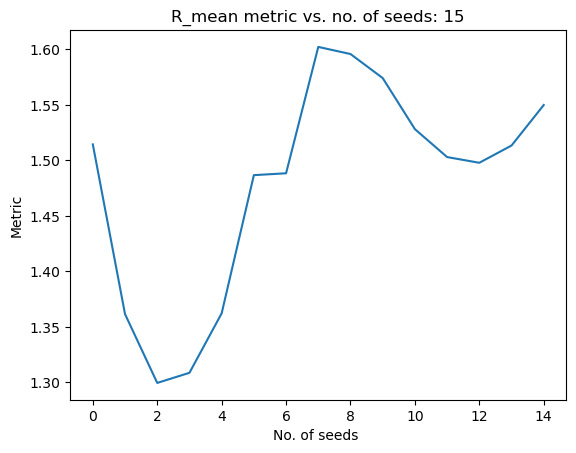

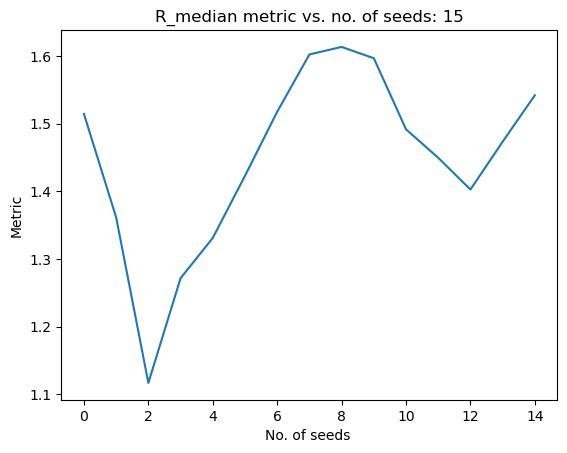

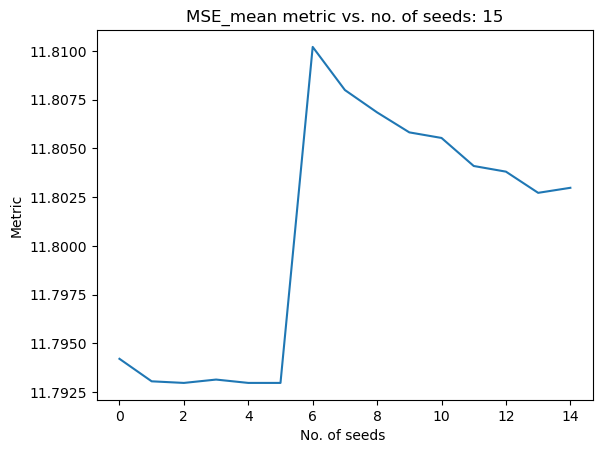

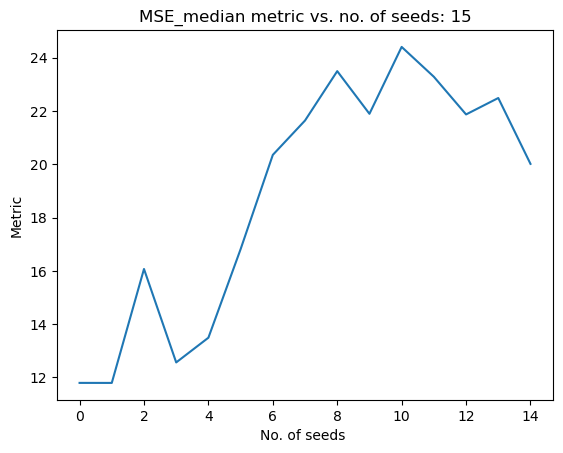

Time required: 2226.8563108444214
Best solution found: 
X = [ 0.25635204  7.71808486  7.92206709  0.31049872  8.30063229  8.50518293
  8.72955756  1.1721485   7.25288898  7.23940086  6.95815862  7.18203511
  0.19043938  6.12797131  5.69193412  6.41829625  6.23192206  0.24760795
  6.27041532  0.78914208  7.8353204   7.8283634   7.79560028  6.79454965
  2.8558386   8.87990188  1.12081751  4.13393767  6.15823312  6.12375684
  1.08299113  8.09234849 -1.30103     1.25046212]
F = [11.79470823]
CV = [0.]
R2: 0.82229011611951
R: 0.9068021372490859
-log10(1-R2): 0.7502884169027247
Mean solution thus far: 
 [0.5204025989554251, 7.981929194125513, 8.186790584009888, 0.6786243478625248, 8.137523067453328, 8.29544728373773, 8.4582044026288, 1.297765702924798, 7.38815737061116, 7.335100014985138, 6.770588962329088, 7.301747162999484, 1.6646451830277127, 7.599868012742256, 7.097112175276018, 7.898948311582033, 7.707256651067497, 1.7100944966471257, 7.732783859732305, 1.1114902685331198, 8.15733969010

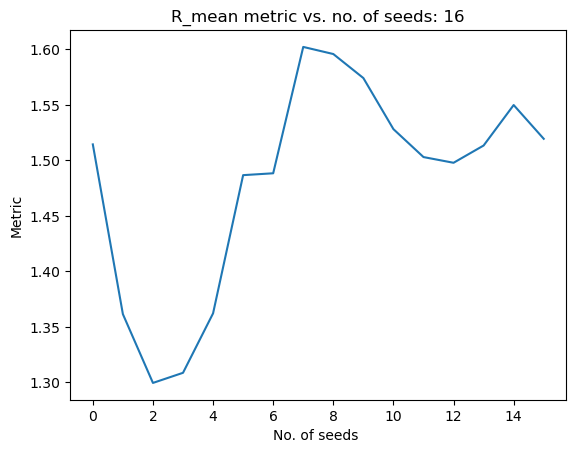

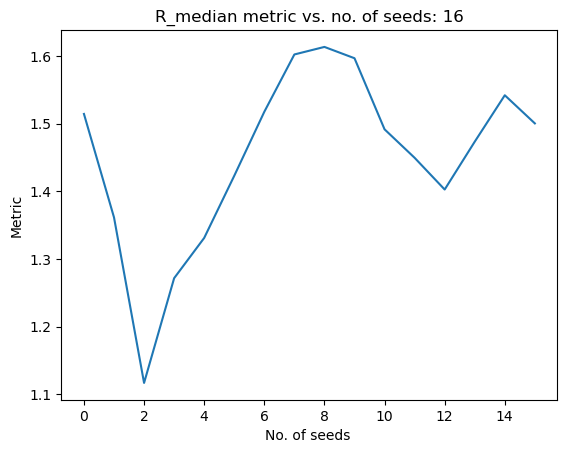

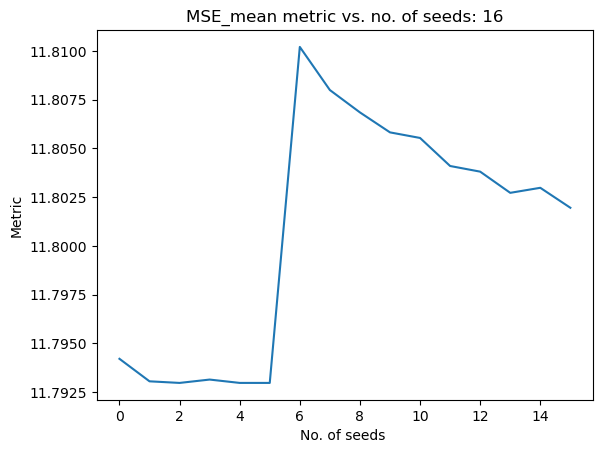

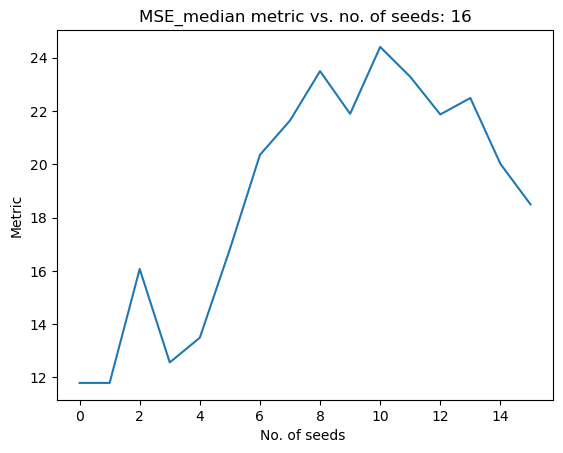

Time required: 2223.56512260437
Best solution found: 
X = [ 0.72102081  8.18101391  8.39101855  0.40959914  7.81875496  7.92605168
  7.99878268  0.44944644  6.55388372  6.43466285  6.57269467  6.44897684
  0.31933328  6.2888722   5.75471468  6.5622167   6.35740449  0.42739211
  6.45036401  1.33830054  8.38574949  8.37865985  8.34389546  7.34345294
  2.5915844   8.61557266  3.95768648  6.96954412  8.99496058  8.96165335
  0.07420508  7.0836928  -1.30103     0.57584023]
F = [11.79449438]
CV = [0.]
R2: 0.8397035252637426
R: 0.9163533844886167
-log10(1-R2): 0.7950760286092085
Mean solution thus far: 
 [0.5322036702846704, 7.9936400595960055, 8.198803993999242, 0.662799335891061, 8.118772002134177, 8.273718130864575, 8.431179595287054, 1.2478645700445943, 7.339082450107427, 7.282133123188175, 6.758948121649111, 7.251584202779881, 1.585509188879573, 7.522750611705339, 7.018147616558643, 7.8203170400732365, 7.627853582541792, 1.6346414149037565, 7.657347397830083, 1.124832049239784, 8.1707755

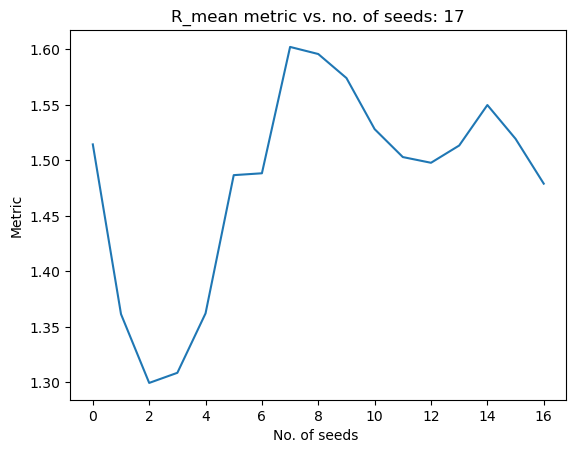

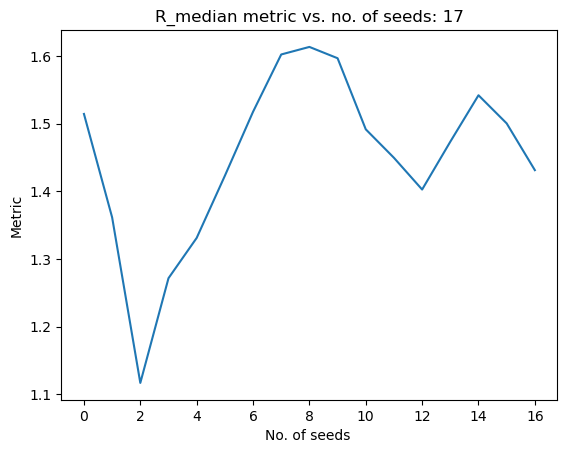

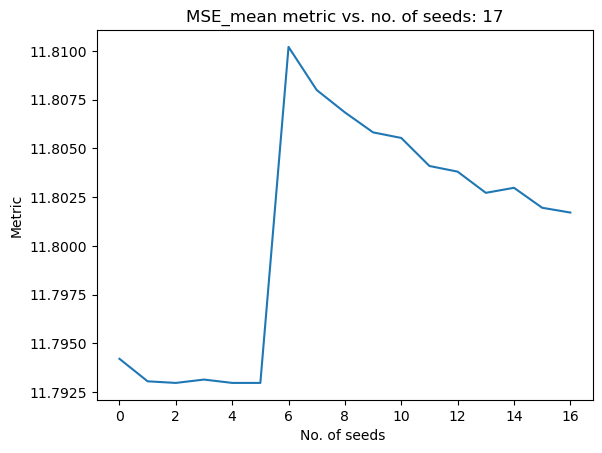

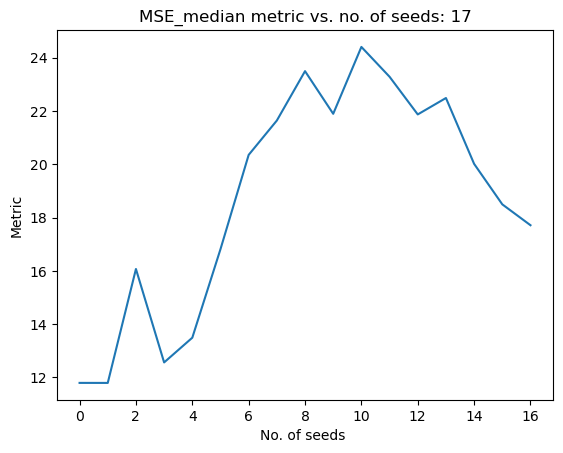

Time required: 2227.6338319778442
Best solution found: 
X = [ 0.78295248  8.24515618  8.44808427  0.64633637  7.70564619  7.86403865
  8.09473135  0.27041721  6.31409268  6.43270082  6.1514483   6.27368897
  1.25215173  7.21223926  6.79017703  7.48522085  7.28916855  2.83124242
  8.85438523  1.59027339  8.63731347  8.63027545  8.59664562  7.5954348
  0.34684798  6.37106546  0.23449957  3.24502617  5.26803159  5.24254268
  1.93659362  8.94613413 -1.30103     0.28400468]
F = [11.79509466]
CV = [0.]
R2: 0.8058336209014977
R: 0.8976823608055902
-log10(1-R2): 0.7118259682286072
Mean solution thus far: 
 [0.5461341599398373, 8.007613177363645, 8.212652898389292, 0.6618847268206809, 8.095820568269978, 8.250958159519472, 8.412488026141402, 1.1935619392038668, 7.282138574161073, 7.234942439785131, 6.725198131324122, 7.197256689872177, 1.5669893300061626, 7.505499980945582, 7.005482584209444, 7.801700584983586, 7.6090377474182525, 1.7011192483946467, 7.723849499657315, 1.1506899013328984, 8.1966

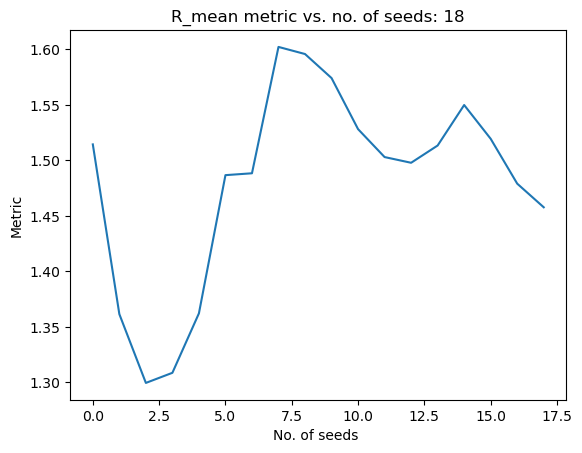

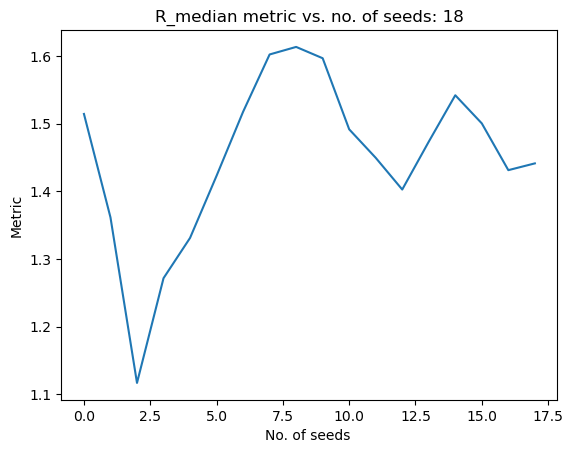

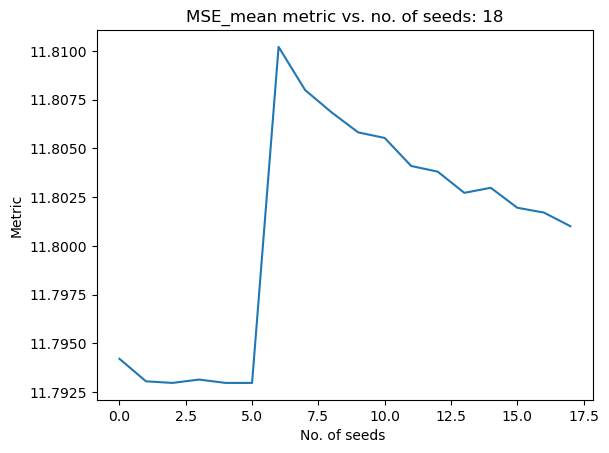

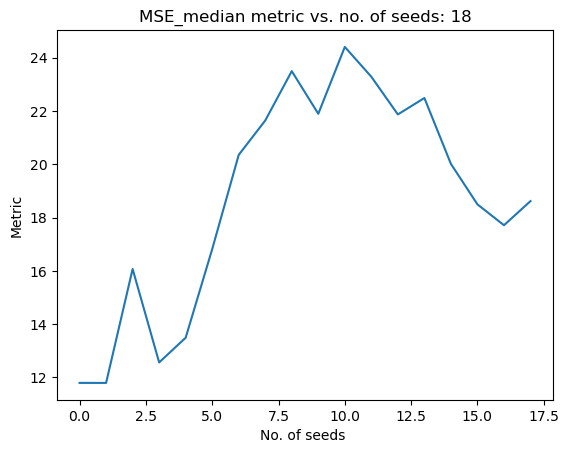

Time required: 2232.4968457221985
Best solution found: 
X = [ 0.76988812  8.23151005  8.43599177  0.27358556  8.06393585  8.21224542
  8.39773188  2.17744096  8.20938078  8.3092081   7.90798091  8.19347659
  2.04699354  7.972944    7.48222451  8.27931703  8.0914862   0.2072354
  6.23002026  1.40543822  8.45148391  8.44473245  8.41182529  7.41090285
  1.64751375  7.67154835  0.63092126  3.64411935  5.66868064  5.63347863
  1.35308169  8.36256323 -1.30103     1.00124775]
F = [11.79431466]
CV = [0.]
R2: 0.8805862910244184
R: 0.9383955940990018
-log10(1-R2): 0.9229458123131549
Mean solution thus far: 
 [0.5579106842452081, 8.019397223360926, 8.224407575647504, 0.6414479287681987, 8.094142425066112, 8.248920647152838, 8.411711386929992, 1.2453450454408481, 7.330940795679018, 7.291482737482161, 6.787449856629374, 7.249689316432473, 1.5922527096029087, 7.53010229771242, 7.030574264602916, 7.8268382925767375, 7.634429771132946, 1.622493782867955, 7.645226908080727, 1.1640977073196153, 8.210104

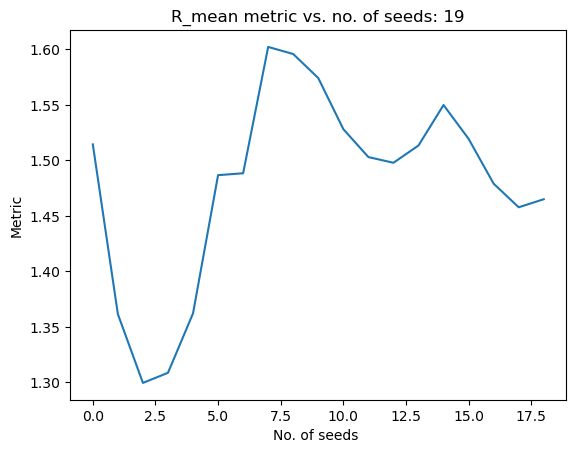

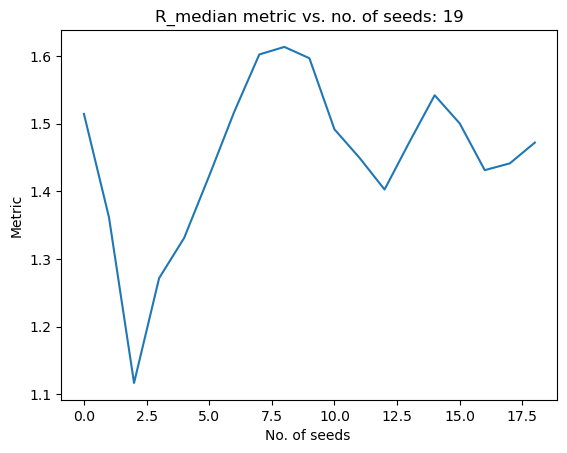

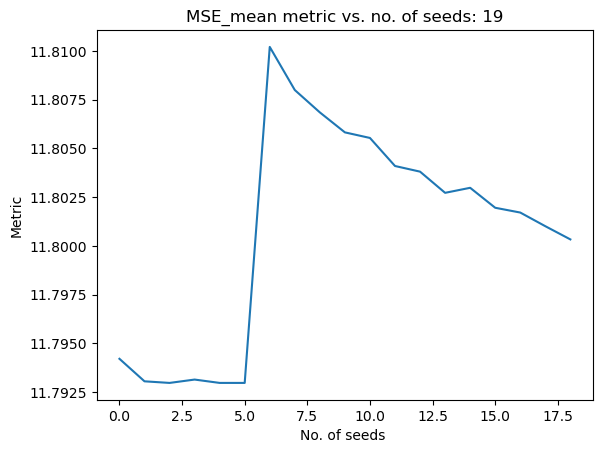

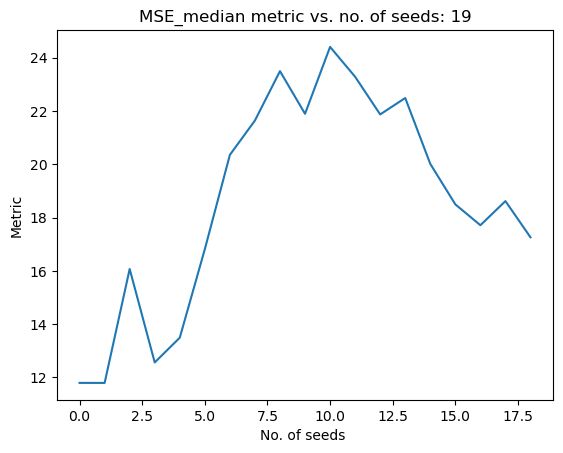

Time required: 2225.4972903728485
Best solution found: 
X = [ 0.71799179  8.17975058  8.38375064  0.97161215  7.89833304  8.09202929
  8.30161455  0.37062387  6.47143534  6.40291311  6.29614318  6.37452043
  2.2100435   8.15814242  7.669623    8.44615539  8.25068692  0.70267308
  6.72555724  0.63193361  7.67876479  7.67146854  7.63833449  6.63702118
  0.8712089   6.89526324  3.61996351  6.63118077  8.65651525  8.62498726
  1.85454674  8.86404404 -1.30103     0.17628661]
F = [11.79394122]
CV = [0.]
R2: 0.9213073581965551
R: 0.9598475702925726
-log10(1-R2): 1.1040658746747374
Mean solution thus far: 
 [0.5659147397568222, 8.027414891337529, 8.232374729086075, 0.6579561400410867, 8.08435195581809, 8.241076079394437, 8.406206545004938, 1.2016089867935869, 7.28796552290062, 7.247054255912064, 6.762884522933194, 7.205930872304282, 1.6231422489758263, 7.561504303620774, 7.062526701443626, 7.857804147600734, 7.665242628535212, 1.5765027476972675, 7.599243424627981, 1.1374895023183709, 8.183537

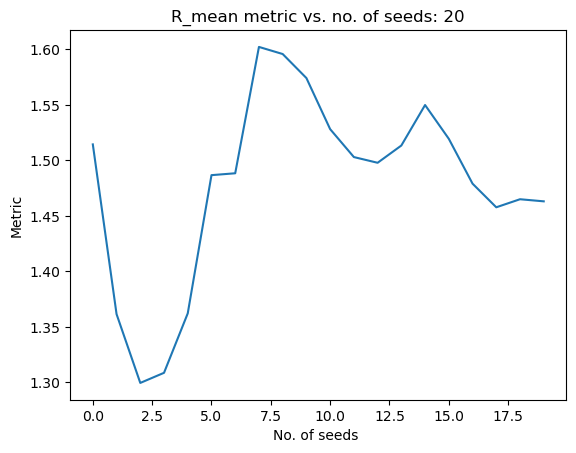

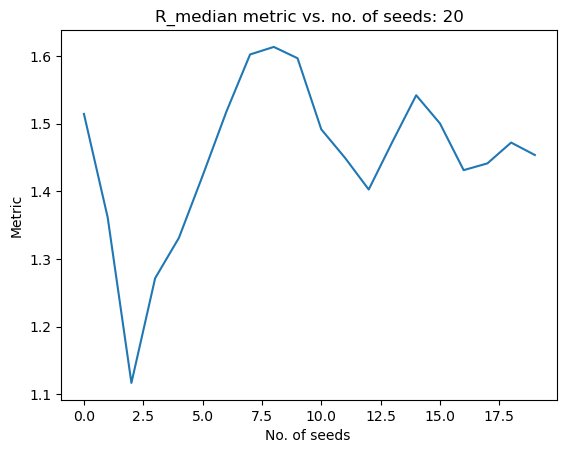

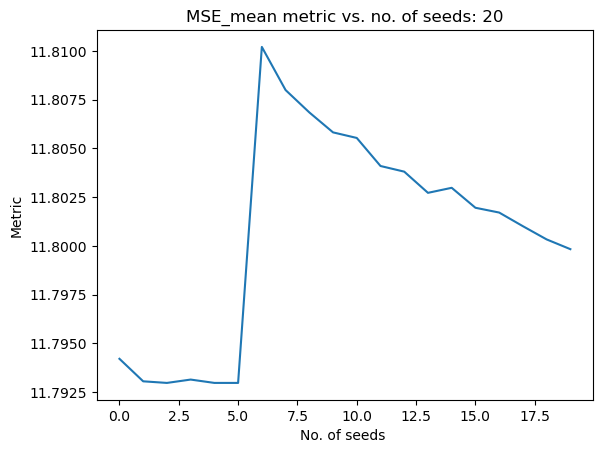

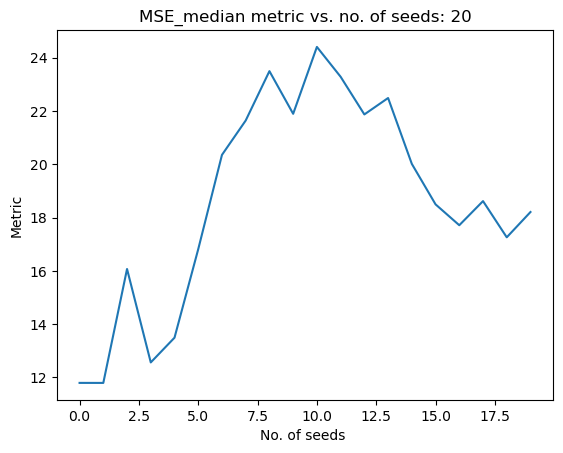

Time required: 2225.1597652435303
Best solution found: 
X = [ 1.05221677  8.51535422  8.7152557   0.36072783  7.52124874  7.65271261
  7.75651653  2.16709997  8.27698775  8.11705432  8.25384111  8.17029234
  2.40383467  8.38592249  7.90593796  8.64390557  8.43811947  2.70551538
  8.72833458  0.55743581  7.60364143  7.5964943   7.56407561  6.5627088
  2.78627088  8.81026601  3.66398562  6.67711586  8.70105299  8.66724223
  1.52379206  8.53328072 -1.30103     0.34893608]
F = [11.79371392]
CV = [0.]
R2: 0.9344472732412982
R: 0.9666681298363458
-log10(1-R2): 1.18340923850284
Mean solution thus far: 
 [0.5890719793838853, 8.050650097246196, 8.255369060958397, 0.643802410754389, 8.057537517149603, 8.213058771197582, 8.375268925153197, 1.2475847479602227, 7.335061819261988, 7.288482830254937, 6.83388245570906, 7.251852847145531, 1.6603180786108989, 7.600762312344182, 7.102689142264571, 7.895237548501357, 7.702046287762425, 1.6302652539379088, 7.653009670216813, 1.1098678976903125, 8.155923244

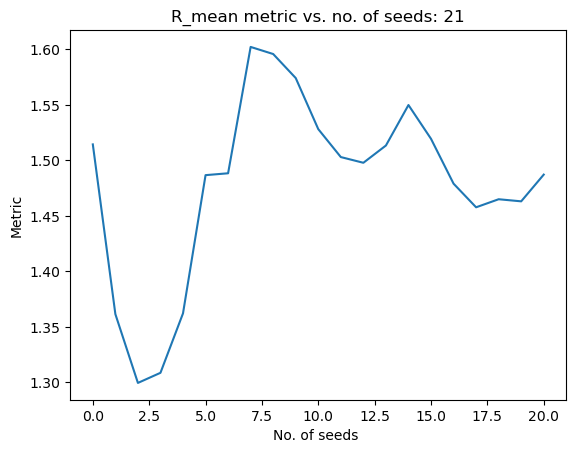

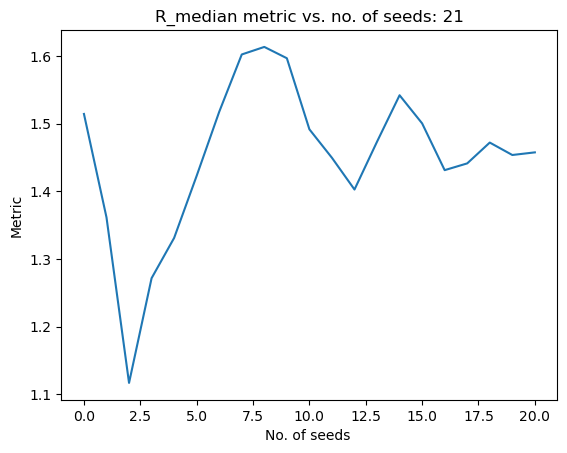

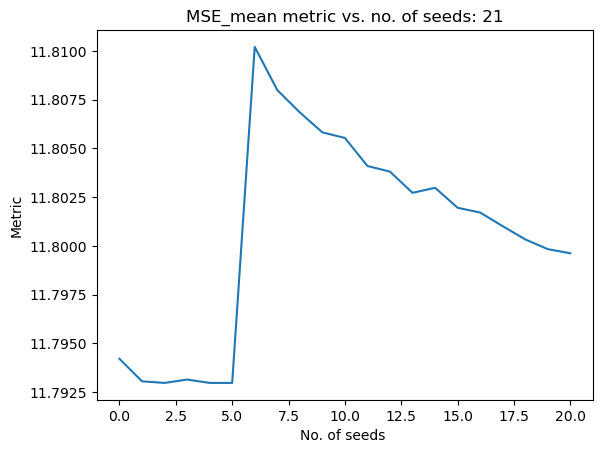

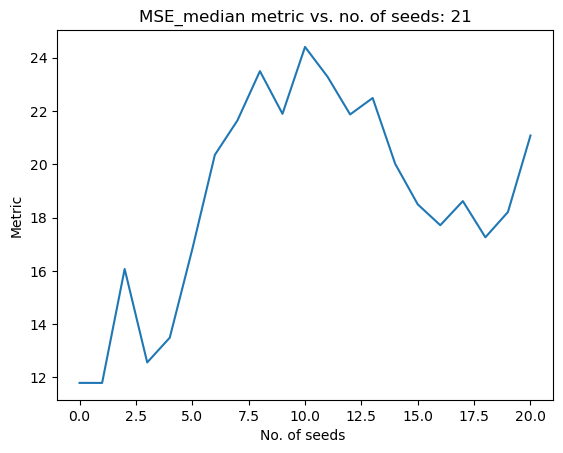

Time required: 2224.5729537010193
Best solution found: 
X = [ 0.34499675  7.80584547  8.01282949  0.0401317   7.22151338  7.37364151
  7.50923688  2.70842036  8.86553202  8.63813278  8.87269339  8.69177871
  1.27032835  7.21219379  6.65099545  7.51272734  7.3127236   2.65301877
  8.67530849  1.70481543  8.75006449  8.74261766  8.71158963  7.71006026
  0.7846201   6.80825234  3.96576395  6.97892613  8.99999662  8.97072244
  0.60442443  7.61380142 -1.30103     0.38914421]
F = [11.79468121]
CV = [0.]
R2: 0.911371925105282
R: 0.9546580147389336
-log10(1-R2): 1.0524286839765205
Mean solution thus far: 
 [0.5779776509417421, 8.039522613978503, 8.244344535157095, 0.6163628328099875, 8.019536420133196, 8.174903441148293, 8.33590383202784, 1.3139863665206486, 7.404628646743359, 7.349830555316064, 6.926555679904993, 7.3173040227648185, 1.642591272727443, 7.583100106575933, 7.0821576109659, 7.8778507207979205, 7.68434980195626, 1.6767540501599782, 7.699477798371908, 1.1369109674944122, 8.18292966

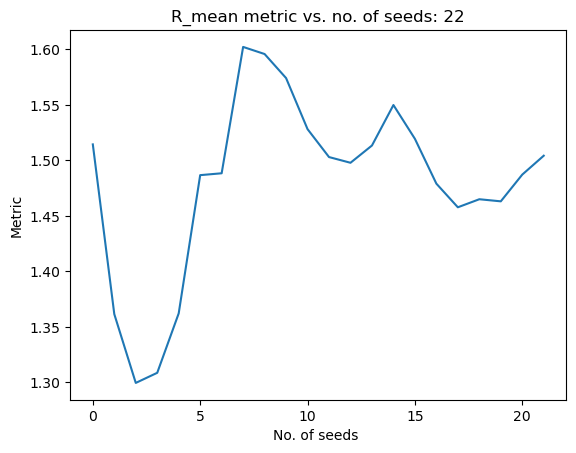

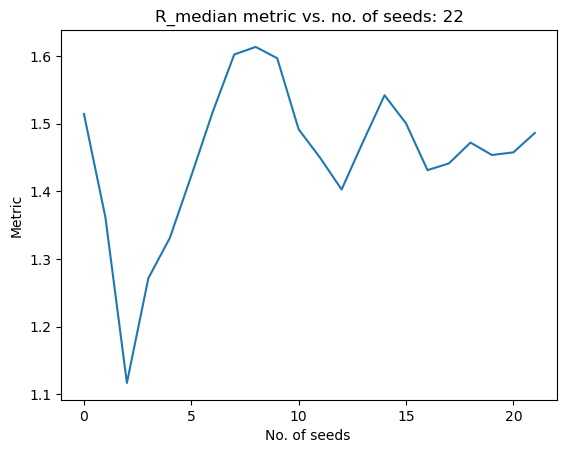

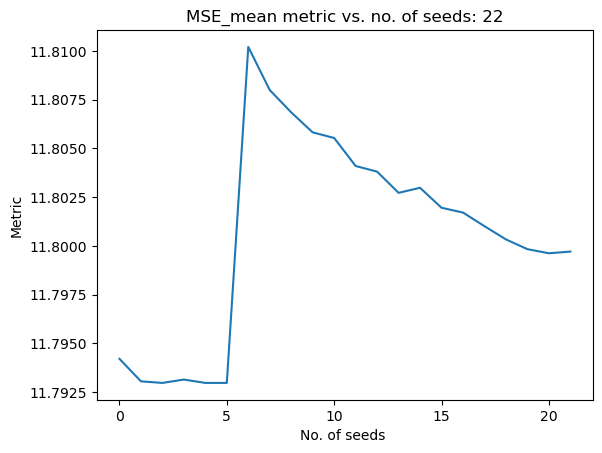

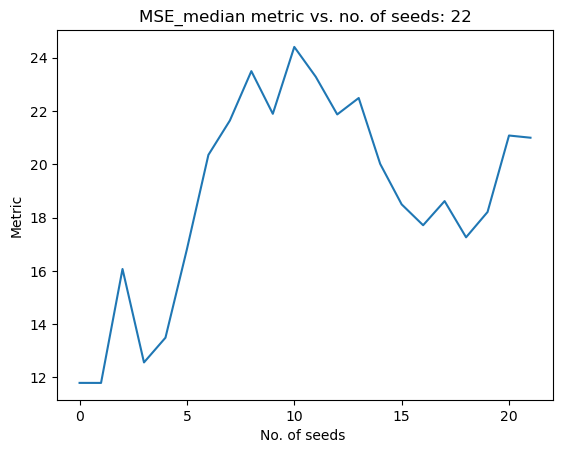

Time required: 2233.0291249752045
Best solution found: 
X = [ 1.00194388  8.46325989  8.66869179  0.54533527  7.98599358  8.17008158
  8.3847466   2.44215087  8.55006777  8.50639646  8.3989582   8.43796652
  1.04936731  6.95512042  6.46111854  7.27666413  7.09737836  2.47186243
  8.49446835  0.35969324  7.40572043  7.39815227  7.36626143  6.36508129
  1.12134153  7.14526107  3.54862786  6.56225416  8.58654488  8.55051359
  0.04539251  7.05480601 -1.30103     0.68331102]
F = [11.7942286]
CV = [0.]
R2: 0.9453859105461707
R: 0.9723095754676957
-log10(1-R2): 1.2626953026672263
Mean solution thus far: 
 [0.5964109653727176, 8.057945973900848, 8.262794415670852, 0.6132746778673789, 8.018078035598537, 8.174693794885973, 8.3380274306445, 1.3630369971145375, 7.454430347624022, 7.400116029618452, 6.990573180579077, 7.36602847922874, 1.6167989265348048, 7.555796642137257, 7.055155912225545, 7.851712173448512, 7.658829304551427, 1.7113239797080413, 7.734042605100437, 1.103118892573713, 8.149137958

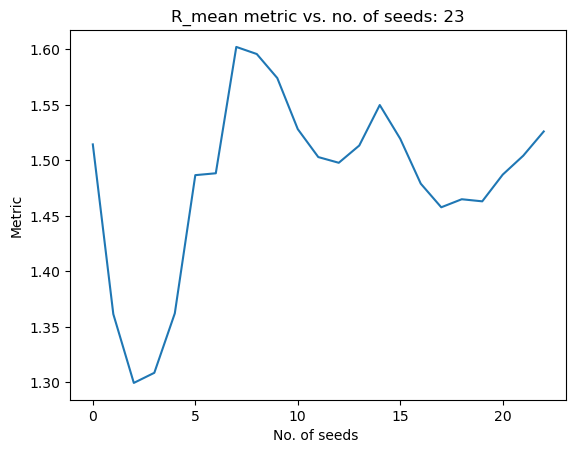

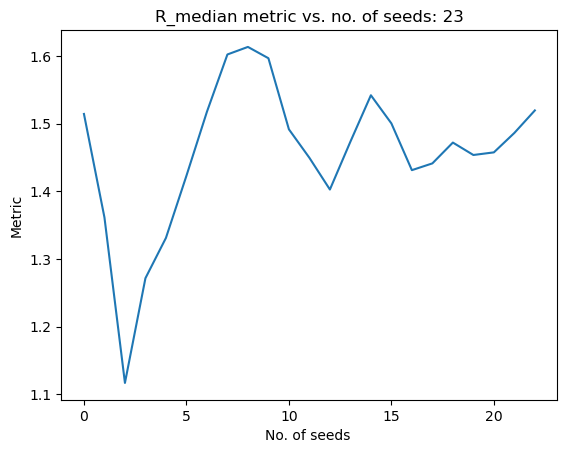

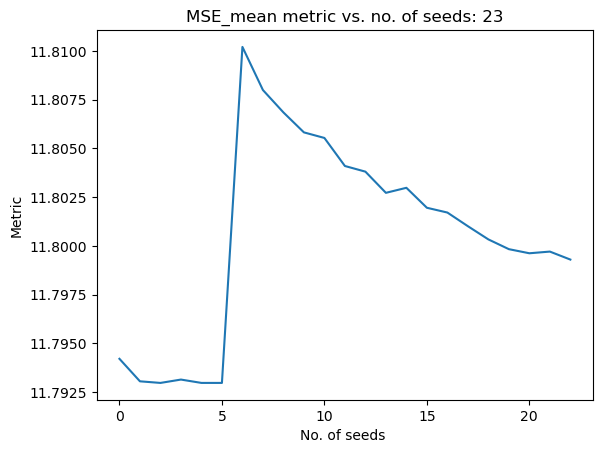

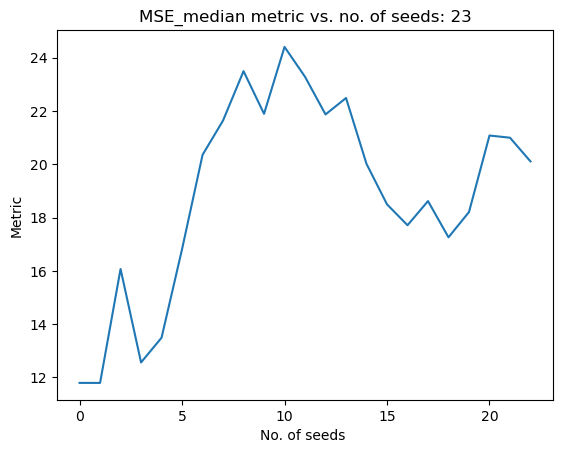

Time required: 2227.7846455574036
Best solution found: 
X = [ 1.30880543  8.77000013  8.97576204  0.3945869   8.1008571   8.25942745
  8.43896015  1.60862766  7.74740557  7.61840441  7.75213698  7.591051
  2.17483493  8.13648353  7.73004483  8.40013873  8.21232715  2.28688267
  8.31026488  1.42915137  8.47645764  8.47002542  8.43544887  7.43428051
  1.02468968  7.04906182  3.55522058  6.56474575  8.58911871  8.56392772
  0.29921339  7.30868802 -1.30103     0.92411171]
F = [11.79387288]
CV = [0.]
R2: 0.9686538567875836
R: 0.9842021422388714
-log10(1-R2): 1.503815886559101
Mean solution thus far: 
 [0.6260940681307291, 8.087614897181558, 8.292501400126554, 0.6041626871747844, 8.021527163293197, 8.178224363793985, 8.342232960606589, 1.3732699414415779, 7.4666376486160635, 7.409211378943557, 7.02230500568269, 7.375404417634397, 1.6400504268812945, 7.579991929045344, 7.083276283947271, 7.87456327990972, 7.681891714795814, 1.7353055919910767, 7.7580518665050535, 1.1167035791116324, 8.1627762

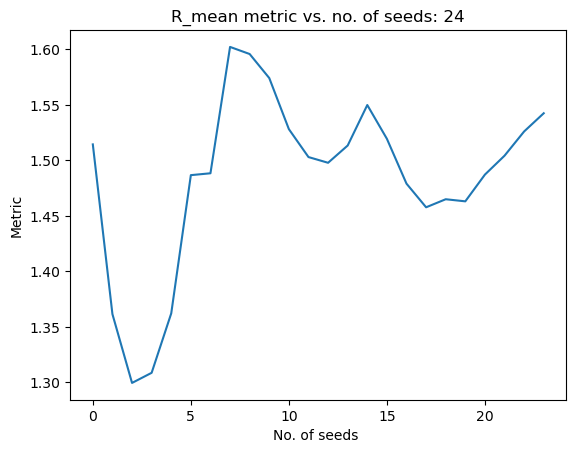

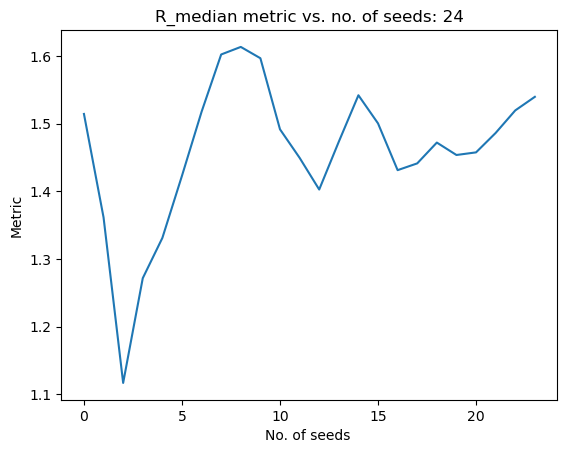

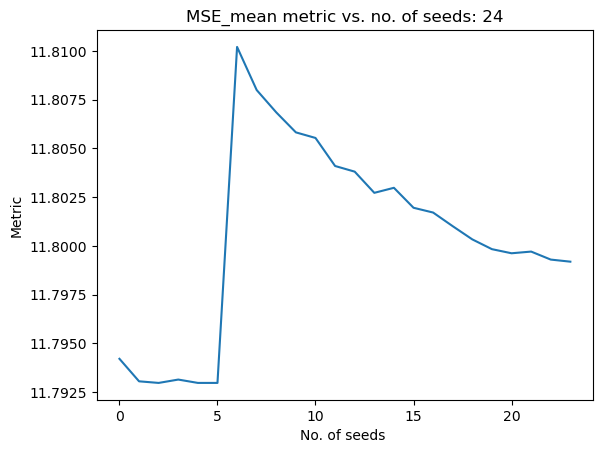

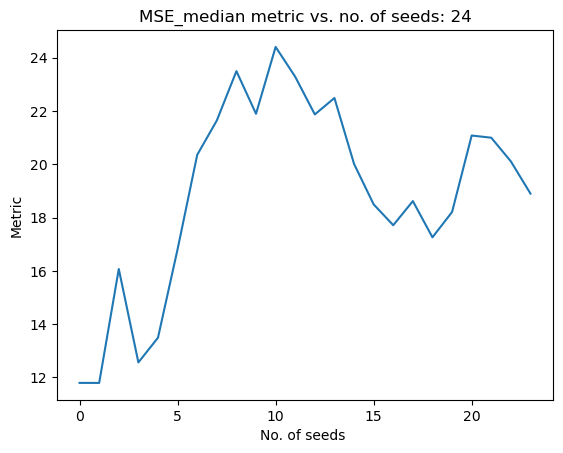

Time required: 2230.144534111023
Best solution found: 
X = [ 7.69749656e-03  7.46905186e+00  7.67465556e+00  4.75493783e-01
  7.54730018e+00  7.71863211e+00  7.93610818e+00  2.06558505e+00
  8.15433879e+00  8.15335572e+00  7.94221136e+00  8.06707618e+00
  6.14324063e-01  6.51127979e+00  5.97494083e+00  6.84592913e+00
  6.66395229e+00  7.07531142e-01  6.73010435e+00  3.51980707e-01
  7.39985350e+00  7.39202426e+00  7.35774053e+00  6.35631251e+00
  1.67208261e+00  7.69601637e+00  3.07329942e-01  3.31803370e+00
  5.34464131e+00  5.31183160e+00  7.50034896e-01  7.75937051e+00
 -1.30102999e+00  3.04864201e-01]
F = [11.7944967]
CV = [0.]
R2: 0.8175421979002329
R: 0.9041804011922803
-log10(1-R2): 0.738837560984293
Mean solution thus far: 
 [0.6013582052680259, 8.062872375622918, 8.267787566709702, 0.5990159310080558, 8.002558084084368, 8.159840673791647, 8.32598796930242, 1.4009625456156298, 7.494145694107979, 7.438977152412909, 7.059101259758604, 7.403071288163086, 1.5990213723287252, 7.5372

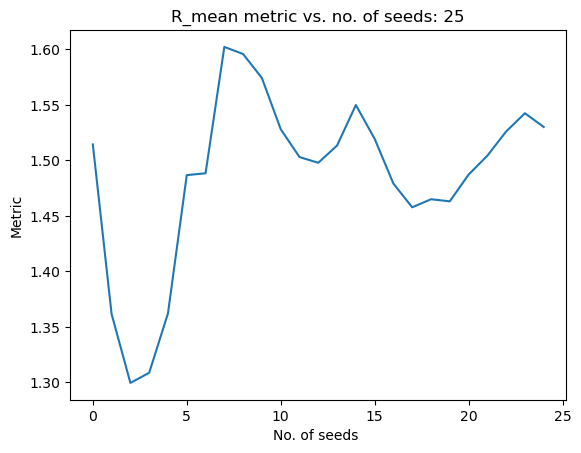

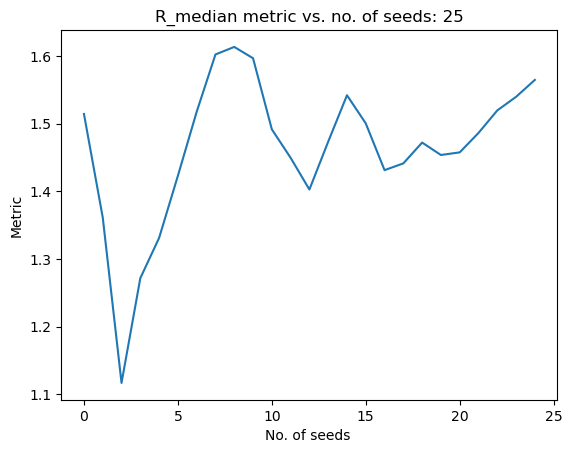

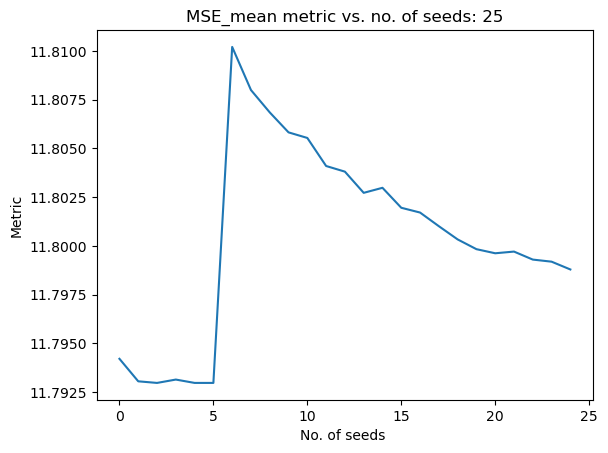

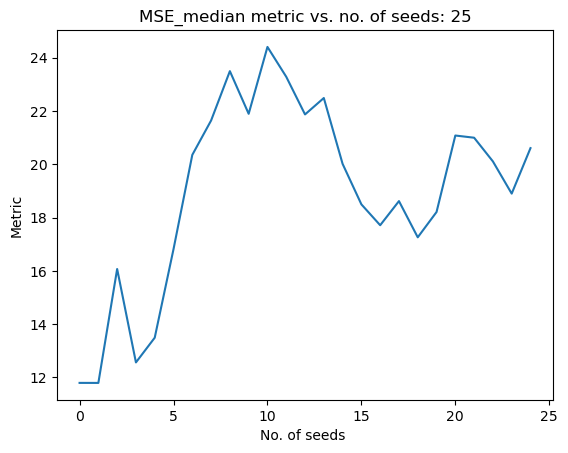

Time required: 2221.786703109741
Best solution found: 
X = [ 0.79228205  8.25387638  8.4584824   0.4768274   7.73672612  7.89533792
  8.05523791  2.53863702  8.60884474  8.58769414  8.41603868  8.55184948
  0.89223854  6.8395697   6.32625555  7.1313956   6.93321566  1.37313043
  7.39574376  1.13622858  8.18225966  8.17511945  8.14273385  7.1415559
  0.58196418  6.60591095  3.81533927  6.82970606  8.8548828   8.81565207
  1.21353636  8.22301254 -1.30103     0.47556159]
F = [11.79316392]
CV = [0.]
R2: 0.9382992598214297
R: 0.9686584846174784
-log10(1-R2): 1.2097096260228268
Mean solution thus far: 
 [0.6087014298933738, 8.070218683370364, 8.275121983358066, 0.5943163722281539, 7.992333777672058, 8.149667490918018, 8.31557450540906, 1.4447192559938347, 7.537018734288927, 7.483158575113653, 7.111291160354435, 7.447255064775547, 1.5718374172777314, 7.510409838045044, 7.011531815197251, 7.806417056037167, 7.613944965328996, 1.6818459914975834, 7.704580496525701, 1.0880421226273036, 8.1341824

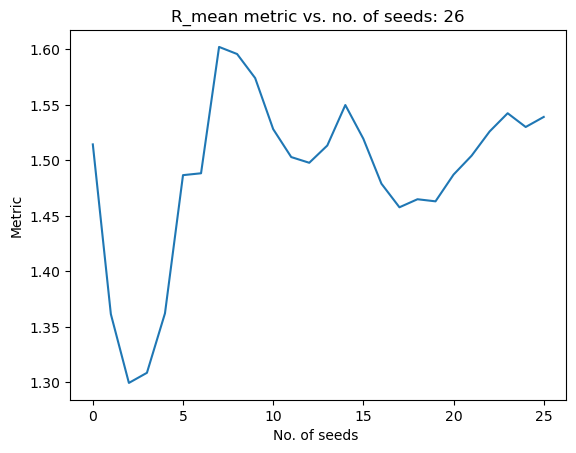

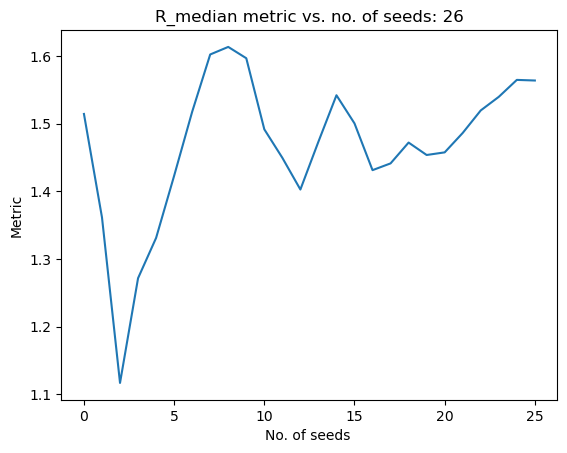

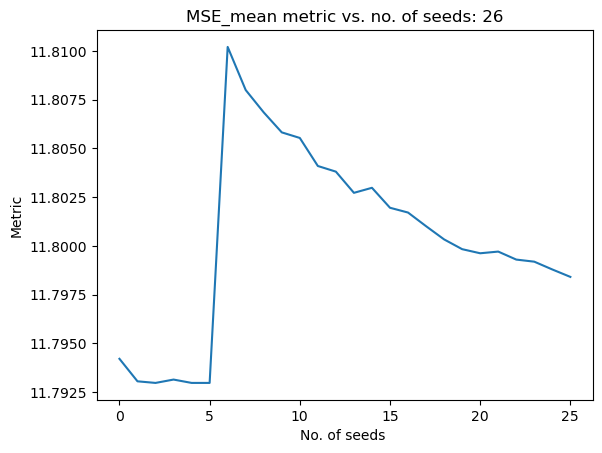

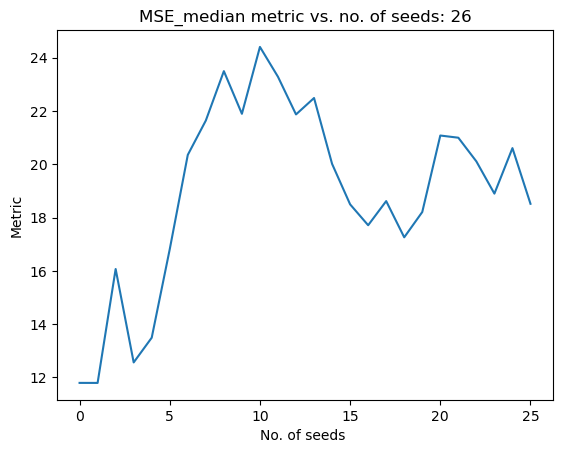

Time required: 2225.818079471588
Best solution found: 
X = [ 0.73685841  8.19878142  8.40230458  1.62362058  8.6673805   8.81933035
  8.96915239  1.79592627  7.93255188  7.7677711   7.93354749  7.78457235
  1.23479762  7.22265622  6.83122262  7.46181614  7.26699207  2.41759441
  8.44114147  1.68486412  8.73161991  8.72434654  8.69182082  7.69079497
  0.34535757  6.3698916   3.14561968  6.16148108  8.18542212  8.14580817
  0.57914171  7.58888547 -1.30103     0.25292868]
F = [11.79405644]
CV = [0.]
R2: 0.9736770982542313
R: 0.9867507781878012
-log10(1-R2): 1.5796662372954697
Mean solution thus far: 
 [0.6134479845713128, 8.07498026637883, 8.279832449871046, 0.6324387501792484, 8.01733550799339, 8.174469819070795, 8.33978109387889, 1.4577269230943142, 7.551668110113674, 7.493699779653434, 7.1417450984620325, 7.459748297466632, 1.5593544618582416, 7.499752296689555, 7.004853696889563, 7.793654059087163, 7.601094858007042, 1.7090959329655373, 7.731860532438083, 1.1101466410979535, 8.1563097

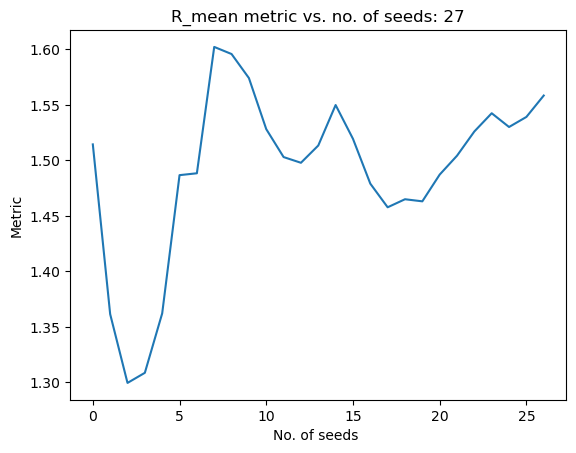

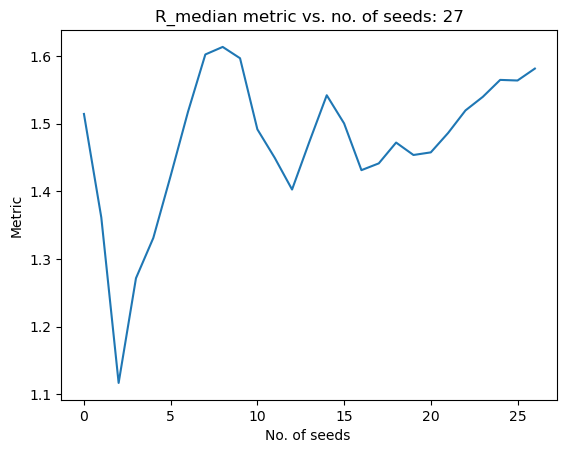

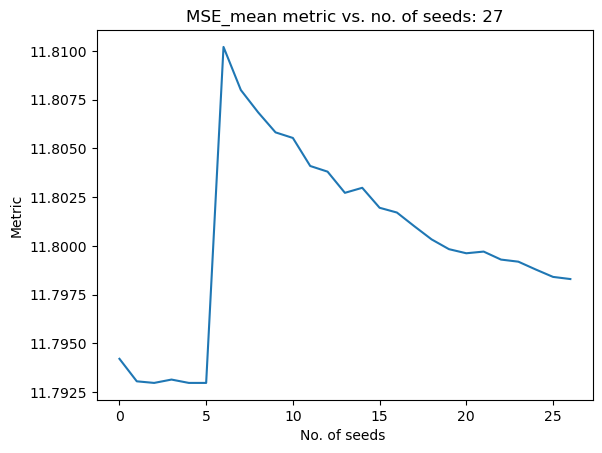

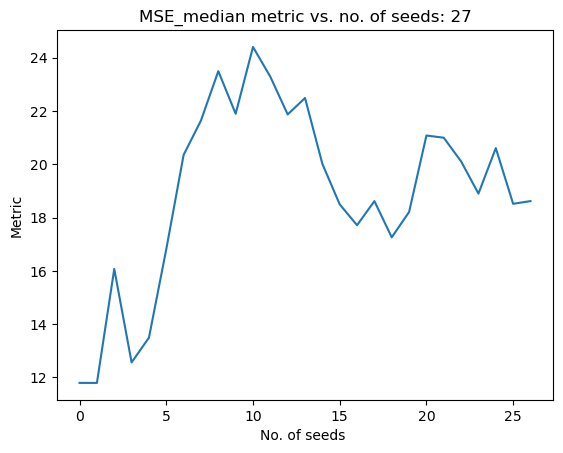

Time required: 2223.040828704834
Best solution found: 
X = [ 1.18432975e+00  8.64739569e+00  8.84729517e+00  2.50104640e-01
  7.41489426e+00  7.62804247e+00  7.88487414e+00  1.51328470e+00
  7.60800952e+00  7.64287743e+00  4.26278567e+00  7.52420887e+00
  2.38909362e+00  8.03827336e+00  9.78667659e-04  8.58929066e+00
  8.47367918e+00  5.47184274e-01  6.57005471e+00  6.96039638e-01
  7.74219880e+00  7.73577382e+00  7.70264107e+00  6.70121413e+00
  9.10233169e-01  6.93417987e+00  3.93058899e+00  6.94498448e+00
  8.97108828e+00  8.93056589e+00  1.31997766e+00  8.32959006e+00
 -1.30102998e+00  4.36272202e-01]
F = [11.80999296]
CV = [0.]
R2: 0.6871276446543799
R: 0.8289316284557973
-log10(1-R2): 0.5046328083822278
Mean solution thus far: 
 [0.6338366191495487, 8.09542367431339, 8.300098975580424, 0.6187839605360631, 7.995819749164405, 8.154954556642398, 8.323534416838072, 1.459711129483978, 7.553680303188012, 7.499027552798245, 7.038925118748267, 7.46205046065264, 1.5889880033471133, 7.5189

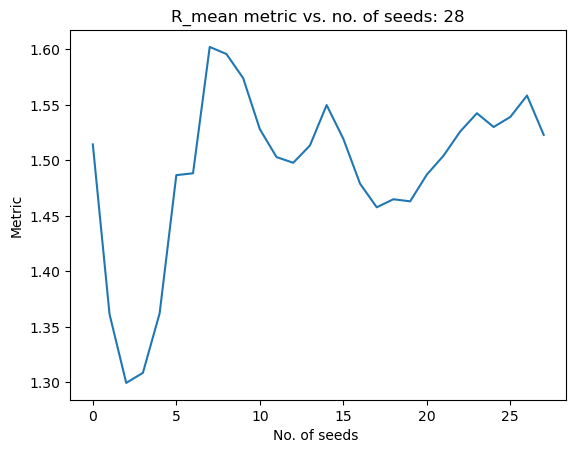

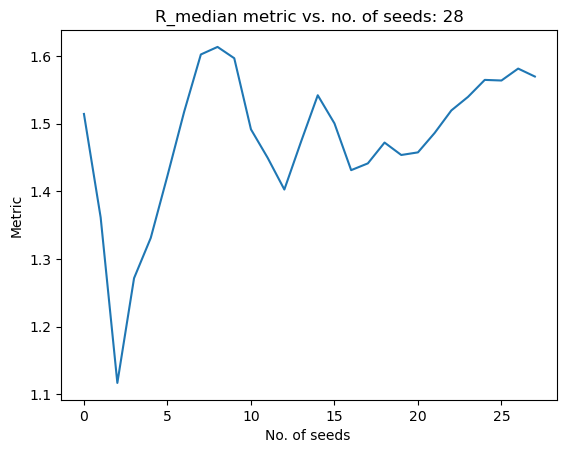

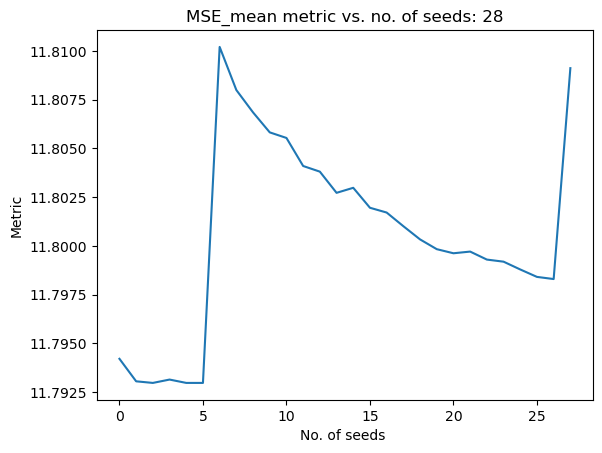

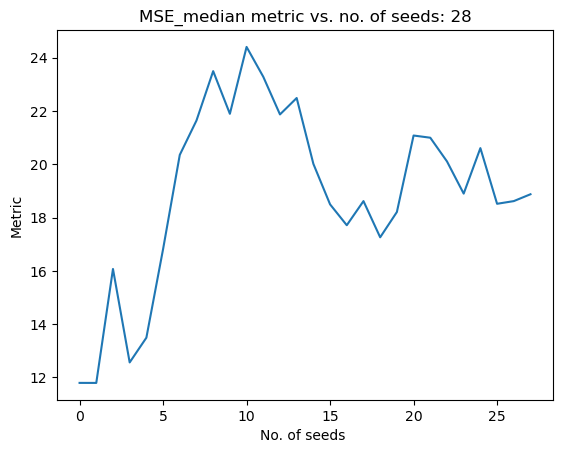

Time required: 2225.489876270294
Best solution found: 
X = [ 0.71771846  8.1785044   8.38539331  0.8198803   7.77571572  7.95236777
  8.13114622  2.06269898  8.16490304  8.06460246  7.93744518  8.07092875
  1.44802453  7.34400314  6.78181125  7.68316427  7.49725991  2.69356557
  8.71560448  0.73173609  7.77662887  7.76978433  7.73849694  6.736731
  0.2224106   6.24593375  3.58711869  6.60049806  8.62559921  8.58820767
  1.1601011   8.1693468  -1.30103     0.18816685]
F = [11.79456548]
CV = [0.]
R2: 0.9626859861226419
R: 0.9811656262439292
-log10(1-R2): 1.4281280312854687
Mean solution thus far: 
 [0.6367290962790724, 8.098288526905163, 8.303040159444027, 0.6257183169096087, 7.988229955165884, 8.14796880533877, 8.316900340943944, 1.480503813951393, 7.574756949144314, 7.5185301359681675, 7.069908568971214, 7.483046263681811, 1.5841271938914303, 7.512951327859043, 6.755649645963085, 7.817279811471097, 7.627603457275132, 1.7029772426125231, 7.7257204675461955, 1.082818449664807, 8.12893763

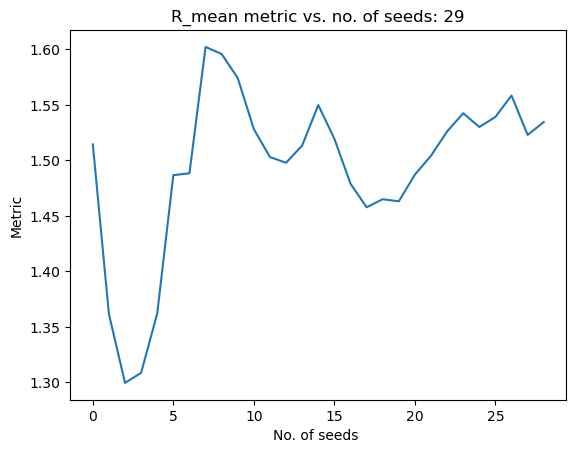

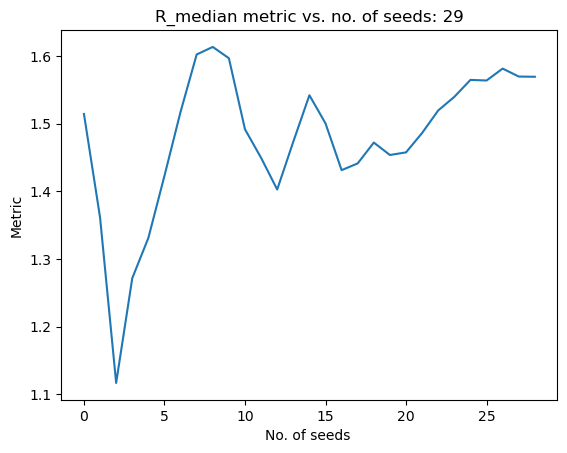

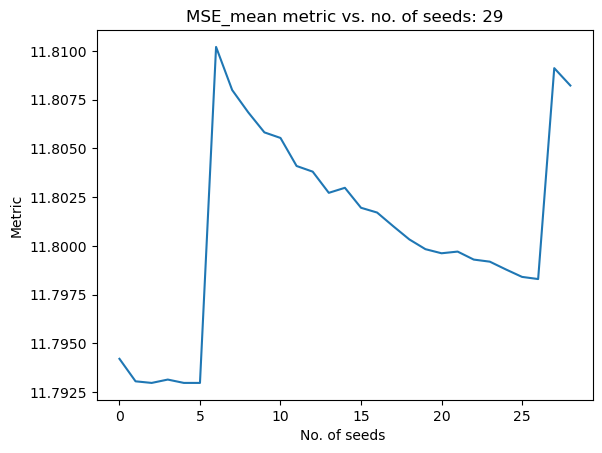

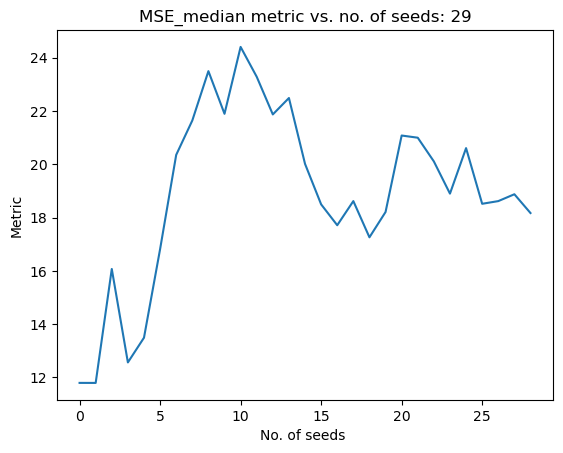

Time required: 2230.4244406223297
Best solution found: 
X = [ 1.01990128  8.48194225  8.68512082  0.32327682  8.32739705  8.49941445
  8.70510335  2.16730537  8.2285417   8.26809285  7.93151294  8.17869738
  1.91699215  7.81749804  7.31266906  8.14639906  7.96559904  1.14151087
  7.16403695  1.35921801  8.40472104  8.3979365   8.36597485  7.36451696
  1.12197252  7.14583525  3.4675867   6.48018535  8.50462491  8.47092451
  0.31662876  7.32605149 -1.30103     1.23622228]
F = [11.79448904]
CV = [0.]
R2: 0.9686745946349357
R: 0.9842126775422757
-log10(1-R2): 1.5041033003283366
Mean solution thus far: 
 [0.6495015025638982, 8.111076984452321, 8.315776181438471, 0.6156369335899824, 7.999535525019478, 8.15968366005253, 8.329840441266127, 1.5033971992413633, 7.596549774127209, 7.543515559787564, 7.098628714825911, 7.5062346342011805, 1.595222692506002, 7.523102884998585, 6.7742169599096576, 7.828250453016973, 7.638869976604036, 1.6842616969990551, 7.706997683507115, 1.0920317682057776, 8.1381

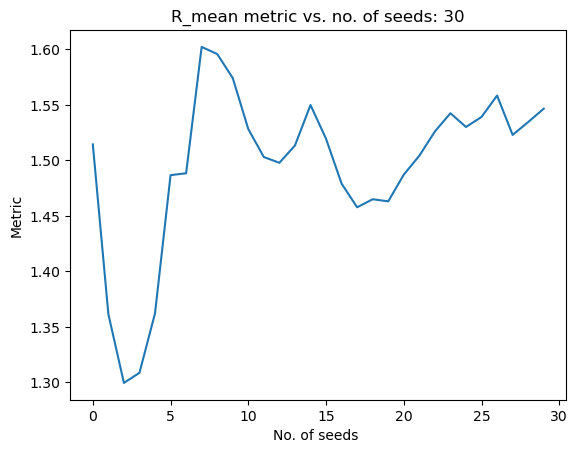

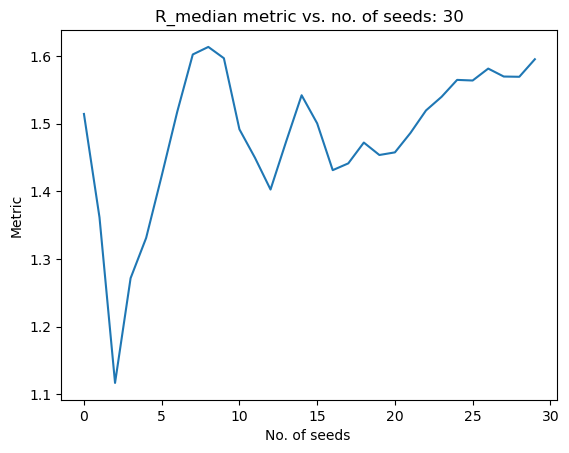

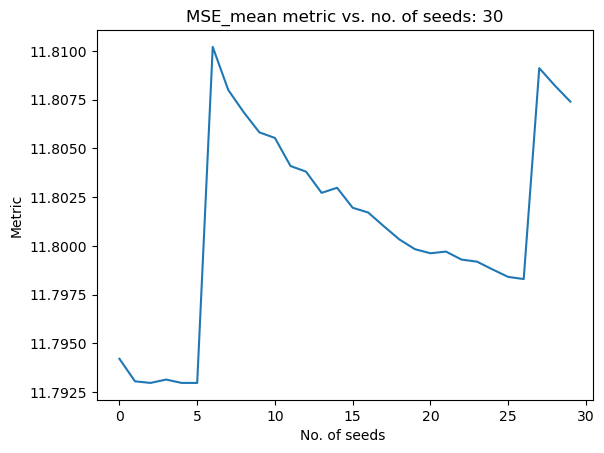

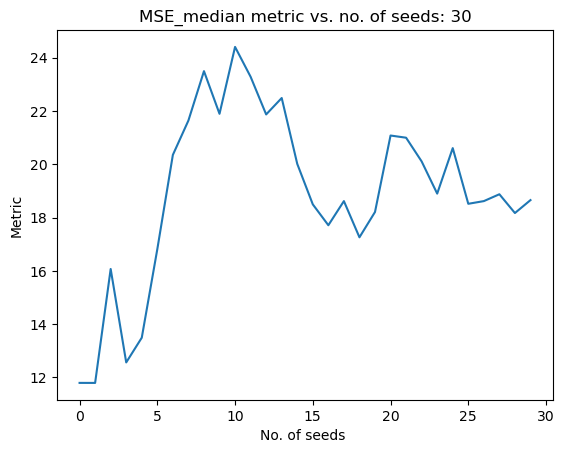

Time required: 2228.036001443863
Best solution found: 
X = [ 0.42486918  7.88783662  8.08805912  0.45897124  7.95717854  8.11801525
  8.31433017  0.69184622  6.72542293  6.81166665  6.4354169   6.70900355
  2.12087833  8.08197755  7.69798188  8.3463472   8.15717241  2.16452553
  8.18769411  0.76825194  7.81364172  7.80641014  7.77569502  6.77441872
  2.54282536  8.56710991  3.21255582  6.22873706  8.25119425  8.21309945
  1.77463747  8.78433455 -1.30103     0.72026064]
F = [11.79418943]
CV = [0.]
R2: 0.9300399394347899
R: 0.9643857835092707
-log10(1-R2): 1.155149823219588
Mean solution thus far: 
 [0.6422552986019102, 8.103875682261407, 8.308430469683996, 0.6105832015812434, 7.998169170640813, 8.158339517674815, 8.32934011006546, 1.4772181353230758, 7.568448908103013, 7.519907530290523, 7.077234785413382, 7.480517502457227, 1.6121793260188308, 7.541131099994244, 6.804015828434558, 7.844963251241158, 7.655589409884457, 1.699754078776984, 7.7225040198408985, 1.0815872574600778, 8.1276630

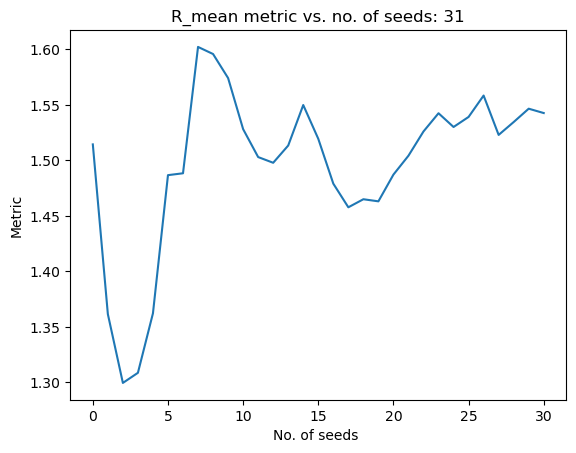

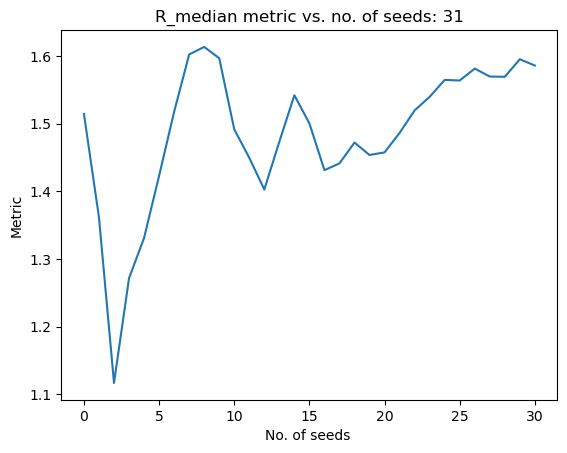

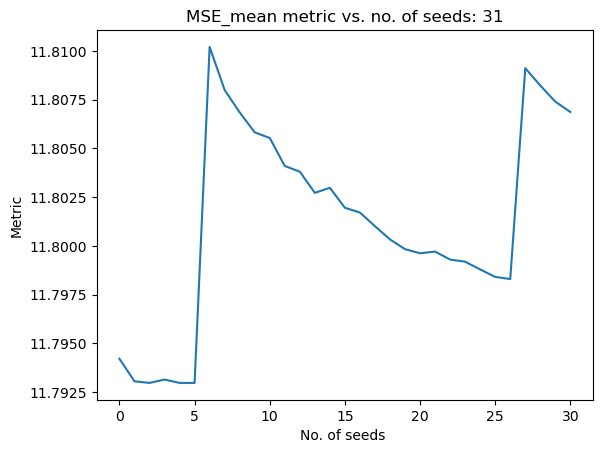

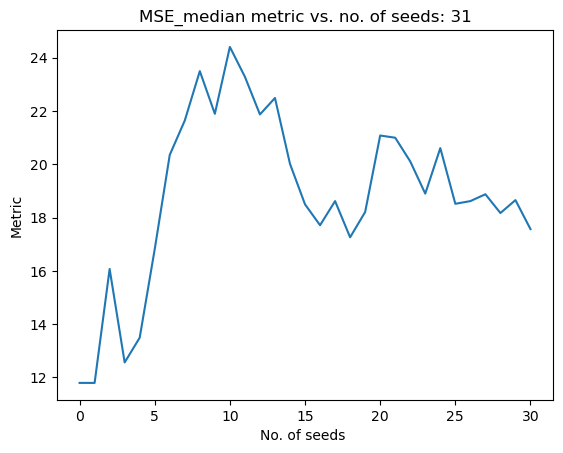

Time required: 2227.4239933490753
Best solution found: 
X = [ 1.25828059  8.72067541  8.92306934  1.5103105   8.40802755  8.59231725
  8.77553465  0.29770745  6.40587205  6.3115501   6.25060127  6.30091368
  2.09592941  8.03089044  7.53052944  8.33027312  8.13911494  2.80927592
  8.83189107  0.0112466   7.05938092  7.05132228  7.01700257  6.01527566
  1.86689214  7.89070451  3.58555485  6.59004072  8.61480948  8.59998721
  1.94303807  8.95214073 -1.30103     0.13627147]
F = [11.79384095]
CV = [0.]
R2: 0.9142706979628896
R: 0.9561750352121151
-log10(1-R2): 1.0668707120561358
Mean solution thus far: 
 [0.6615060890037825, 8.123150673678914, 8.327637934520254, 0.6386996797159981, 8.010977244938488, 8.171901321913646, 8.343283689319014, 1.4403584264464415, 7.532118381408712, 7.482146360465286, 7.0514024879367545, 7.443654882913088, 1.6272965160773976, 7.5564360792572325, 6.826719378729015, 7.860129184749633, 7.670699582659612, 1.7344266362341723, 7.757172365286753, 1.0481391119118955, 8.09

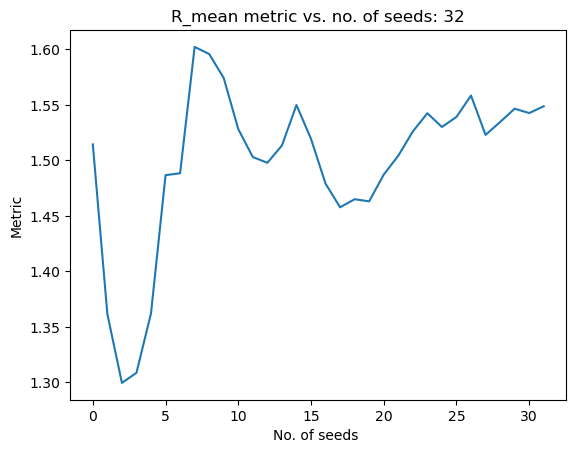

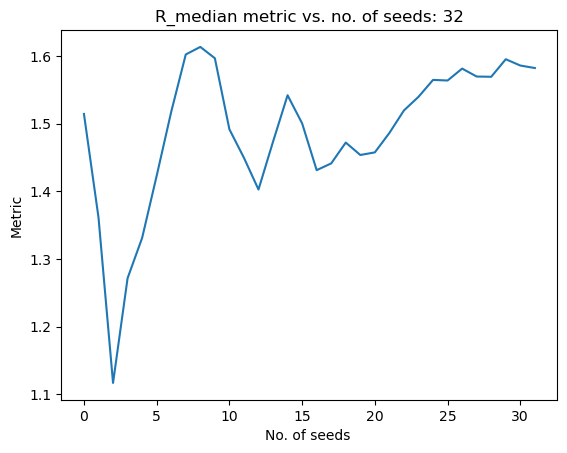

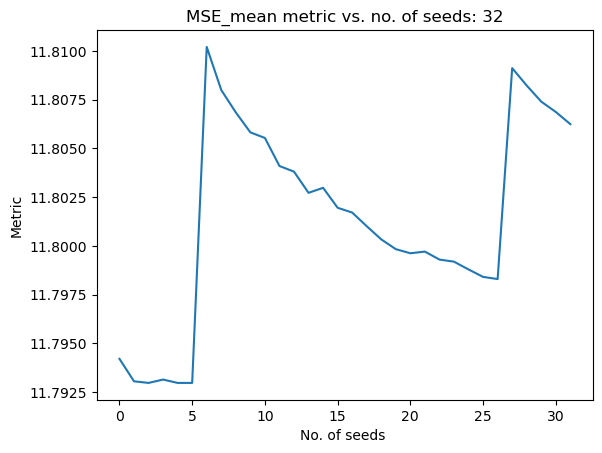

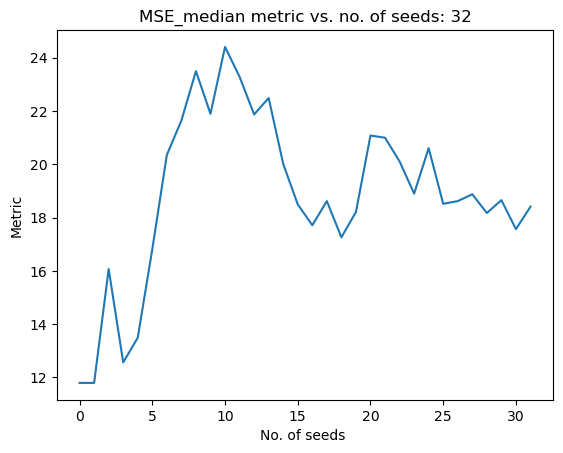

Time required: 2222.965713262558
Best solution found: 
X = [ 0.67613601  8.13796649  8.34223607  0.10822032  7.93190603  8.09377491
  8.30738347  1.30288437  7.32856861  7.46120176  6.95437986  7.3178915
  2.07177628  8.00084697  7.60347119  8.2917259   8.11447692  2.81129792
  8.83452585  0.97086311  8.01789288  8.01015659  7.97743831  6.97647802
  0.01987211  6.04426167  2.25559564  5.26854102  7.2928484   7.25932506
  0.8071442   7.81675706 -1.30103     1.04885914]
F = [11.79518089]
CV = [0.]
R2: 0.9493401432048122
R: 0.9743408762875609
-log10(1-R2): 1.2953360422033393
Mean solution thus far: 
 [0.6619494200429048, 8.123599637930235, 8.328080302127505, 0.622624547722266, 8.008581147385426, 8.169533854978653, 8.342195803799155, 1.4361925459763198, 7.525950206522249, 7.48151167556937, 7.048462408275081, 7.43984387133382, 1.6407655998451016, 7.569903076035197, 6.850257312486307, 7.87320787323398, 7.684147380849499, 1.7670590993492754, 7.789819440454847, 1.0457974147890214, 8.0919644846

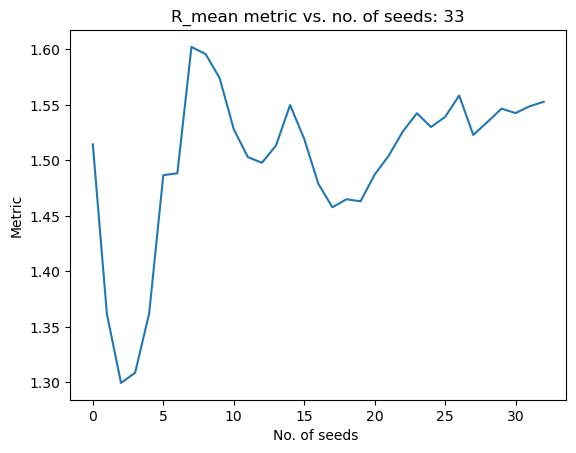

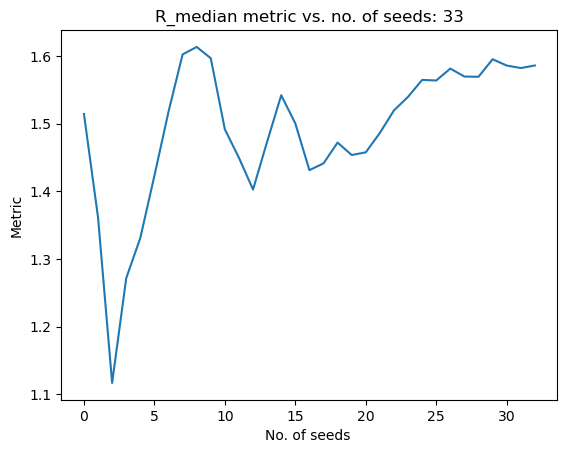

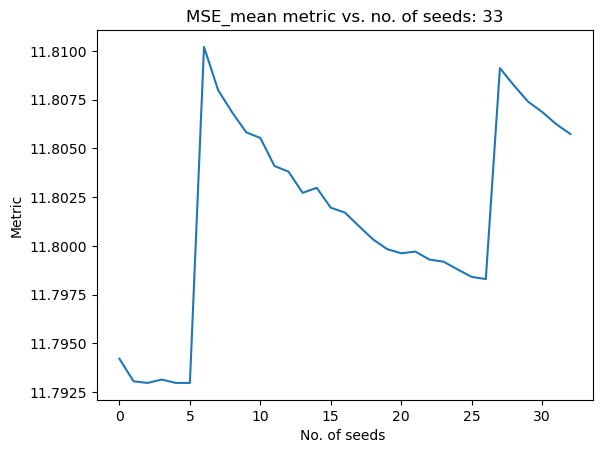

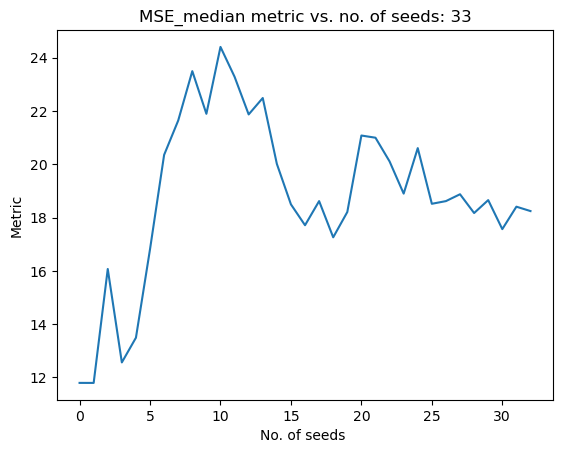

Time required: 2226.372936487198
Best solution found: 
X = [ 0.04658128  7.50594635  7.71760381  0.79624483  8.1836172   8.34496842
  8.52910831  1.03441836  7.14692815  7.07237988  7.01596613  7.03117015
  2.25142964  8.1444999   7.60497548  8.4822443   8.30181707  2.73790084
  8.76030057  1.79330525  8.83804062  8.83158088  8.80045991  7.79865648
  0.19749378  6.22131637  0.08656914  3.10076965  5.12398837  5.08835823
  0.96633036  7.97577074 -1.30103     0.60828708]
F = [11.79409764]
CV = [0.]
R2: 0.8388338708354675
R: 0.9158787424301688
-log10(1-R2): 0.7927262247056064
Mean solution thus far: 
 [0.6438503571252939, 8.105433364771944, 8.310125111194656, 0.6277310265203145, 8.013729266561416, 8.174693695115936, 8.34769323047822, 1.4243756581654747, 7.514802498877095, 7.46947838750062, 7.047506635277444, 7.427824055903189, 1.6587263069695357, 7.586802982664195, 6.8724549056975075, 7.891120709402753, 7.702314136308592, 1.7956132680477923, 7.818363003140653, 1.0677829393696325, 8.113907

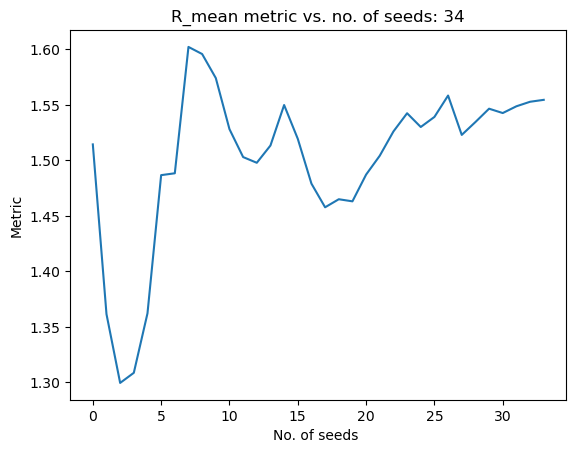

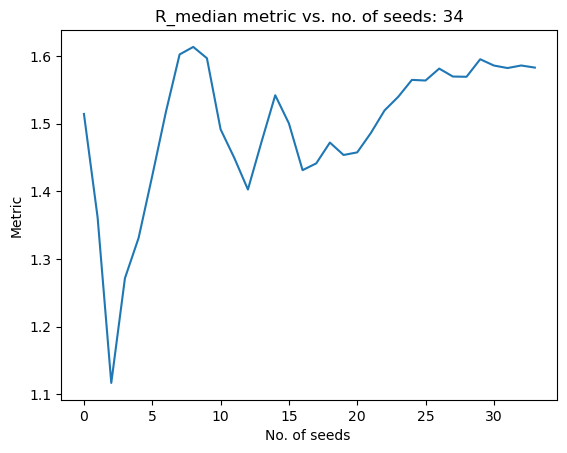

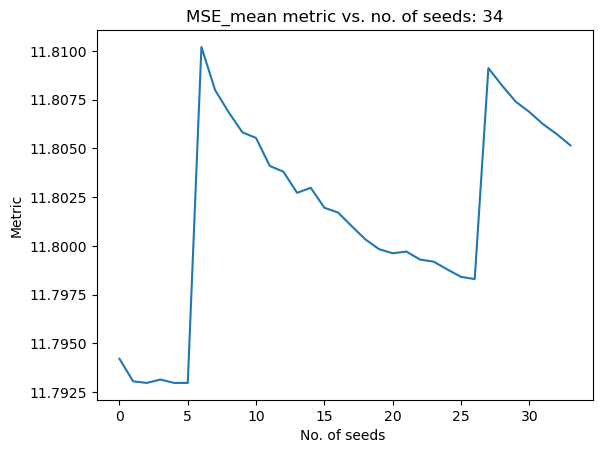

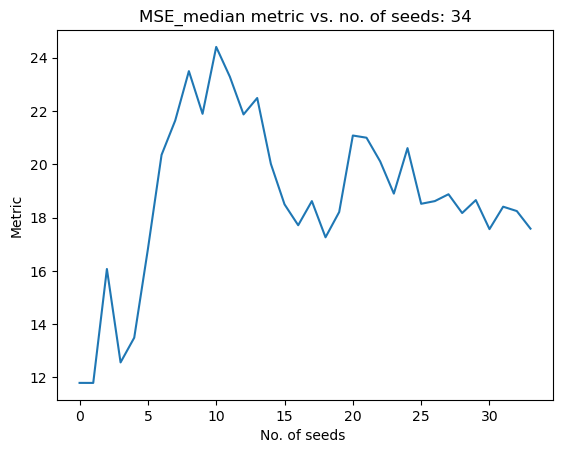

Time required: 2220.8828613758087
Best solution found: 
X = [ 3.53822426e-03  7.46453772e+00  7.67096679e+00  1.24736571e+00
  8.45117073e+00  8.56764304e+00  8.69601314e+00  2.45420368e+00
  8.44878773e+00  8.57413424e+00  8.19975342e+00  8.48071129e+00
  1.78925516e+00  7.78072019e+00  7.38808737e+00  8.02304509e+00
  7.81930714e+00  2.74984253e+00  8.77294750e+00  1.78763930e+00
  8.83391272e+00  8.82694031e+00  8.79418824e+00  7.79346697e+00
  2.25648129e+00  8.28077026e+00  1.32633998e+00  4.33941272e+00
  6.36436325e+00  6.32930570e+00  7.41810469e-01  7.75136650e+00
 -1.30102999e+00  3.83792717e-01]
F = [11.79518018]
CV = [0.]
R2: 0.9214905723713079
R: 0.9599430047514842
-log10(1-R2): 1.1050781888435741
Mean solution thus far: 
 [0.6255557247577558, 8.087122060735393, 8.291863445005752, 0.6454348747115248, 8.026227594027025, 8.18592081919942, 8.357645227907227, 1.4537993157983726, 7.541487791288389, 7.5010399833153105, 7.0804279719429415, 7.457906548191428, 1.6624557028964784, 7

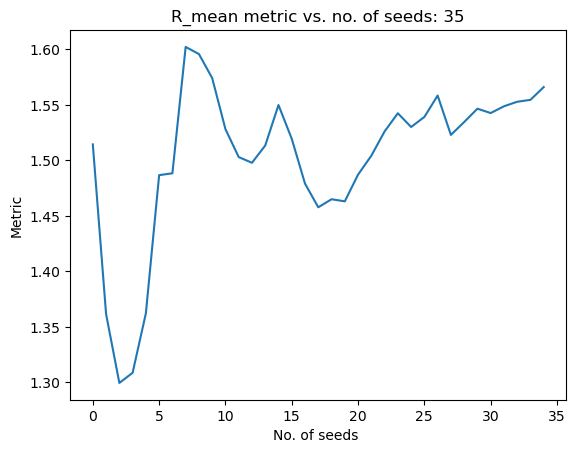

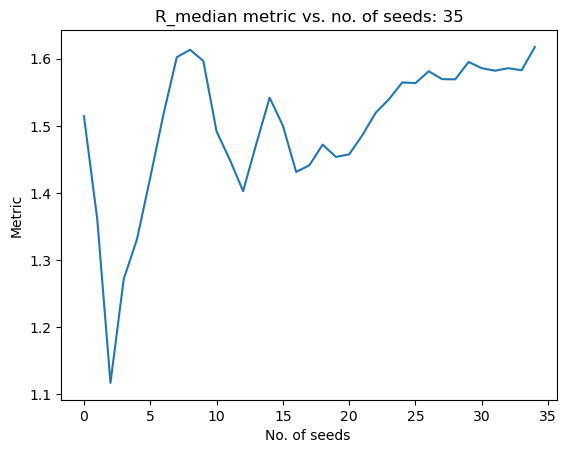

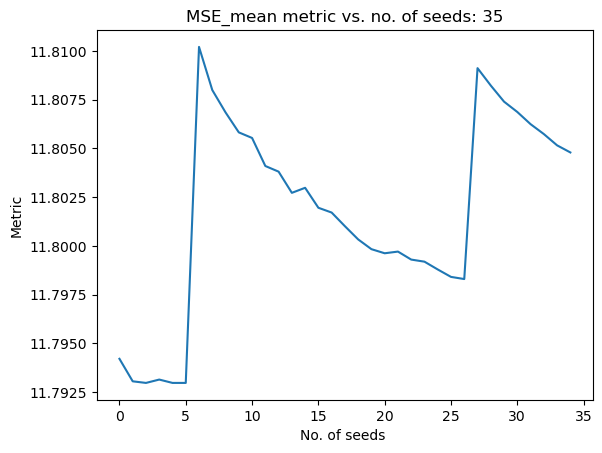

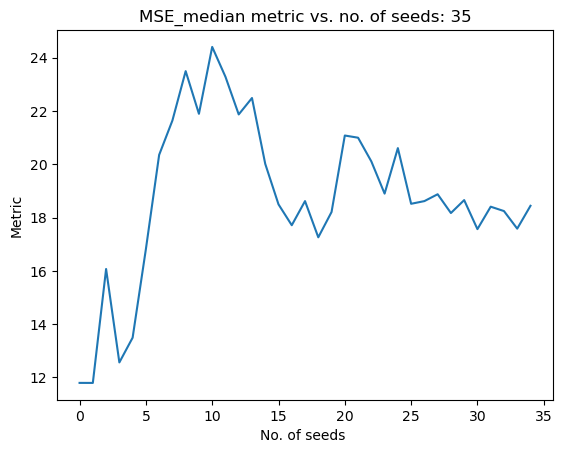

Time required: 2241.80557513237
Best solution found: 
X = [ 0.04420907  7.50471697  7.71295893  1.82890294  8.69638082  8.80892902
  8.91712124  1.50514721  7.60558252  7.49364487  7.6417359   7.50441868
  0.54535504  6.55204333  6.13456466  6.77978396  6.57422844  0.73933903
  6.76277819  1.6895754   8.73543801  8.72865924  8.69690118  7.69571339
  0.18007737  6.20449322  3.96106746  6.97563345  8.99993371  8.9626894
  1.65702246  8.66660525 -1.30103     0.04185703]
F = [11.7941508]
CV = [0.]
R2: 0.9141308622892363
R: 0.9561019099914173
-log10(1-R2): 1.0661628982208482
Mean solution thus far: 
 [0.6094072066824124, 8.070944141474381, 8.27578276399183, 0.6783089875389627, 8.044842961517787, 8.20322660262537, 8.37318622823849, 1.4552256462564168, 7.543268200300805, 7.500834563374474, 7.096019858817412, 7.459198551853898, 1.631425129028163, 7.563446248228303, 6.866281078462233, 7.863914810048609, 7.674228228276814, 1.7927786854730199, 7.815557438729057, 1.1050509619280324, 8.151172759483

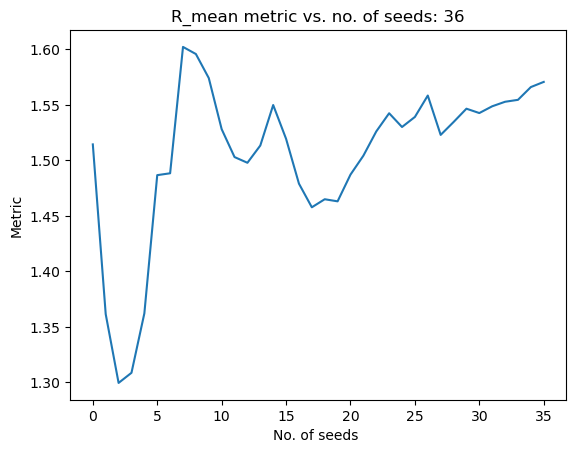

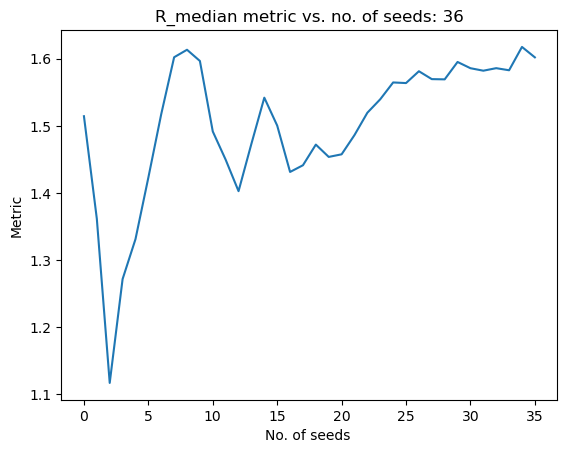

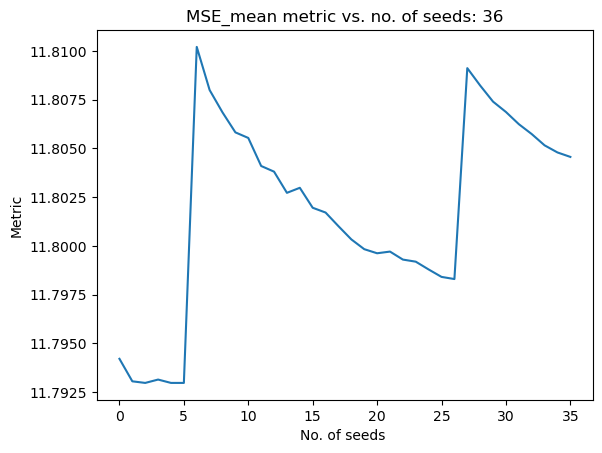

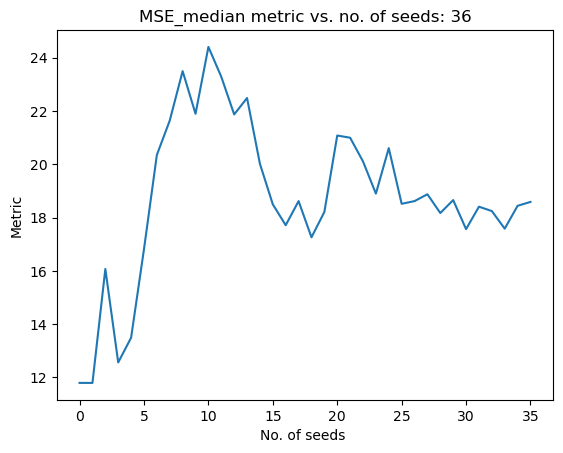

Time required: 2249.0368824005127
Best solution found: 
X = [ 0.59205922  8.05353909  8.25839891  0.68256782  7.66394663  7.8157413
  7.96691637  1.56664455  7.62195937  7.61648639  7.35098288  7.5864808
  1.35400703  7.28825546  6.76384743  7.59075367  7.39740706  1.06698352
  7.08947435  1.15596301  8.2016979   8.19408316  8.16269078  7.16133191
  2.26145931  8.28525294  3.82796565  6.84155274  8.86523666  8.83035985
  0.25761025  7.26702917 -1.30103     0.19089041]
F = [11.79368361]
CV = [0.]
R2: 0.9369699616945024
R: 0.9679720872496802
-log10(1-R2): 1.2004524289387801
Mean solution thus far: 
 [0.6089383421323553, 8.070473734677165, 8.275312930234776, 0.6784240911036928, 8.034548465968475, 8.192754026862605, 8.36220596172057, 1.4582369679459755, 7.545394988780526, 7.503960288411297, 7.102910751341093, 7.462638612492709, 1.6239273426522474, 7.556008659414125, 6.863512601440989, 7.856532076570682, 7.6667465749868, 1.7731625999428928, 7.795933571445712, 1.1064269633106711, 8.152538303

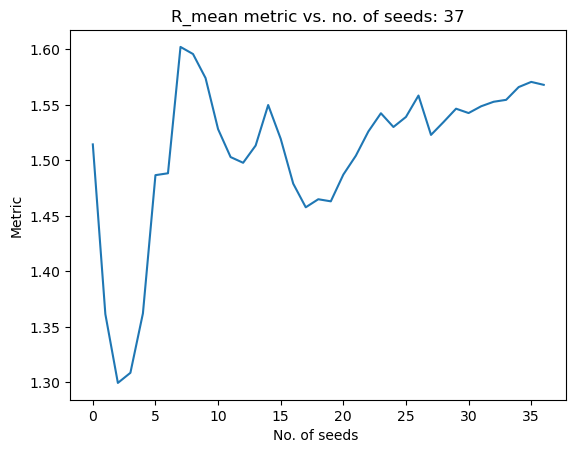

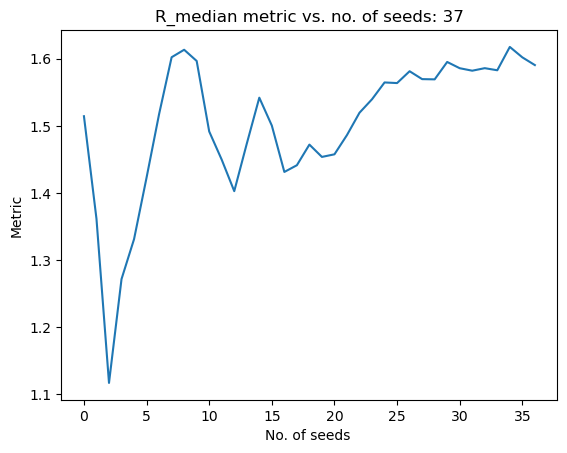

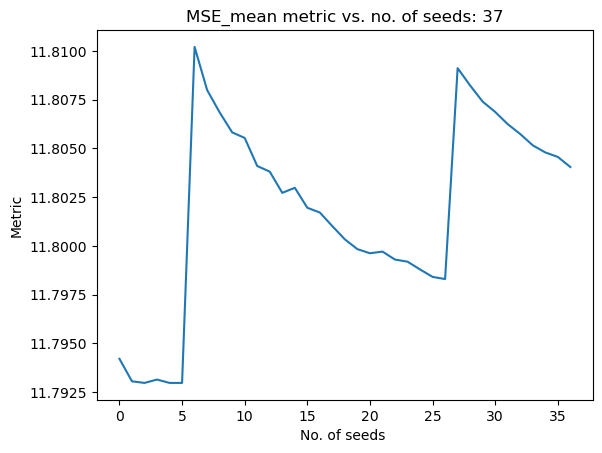

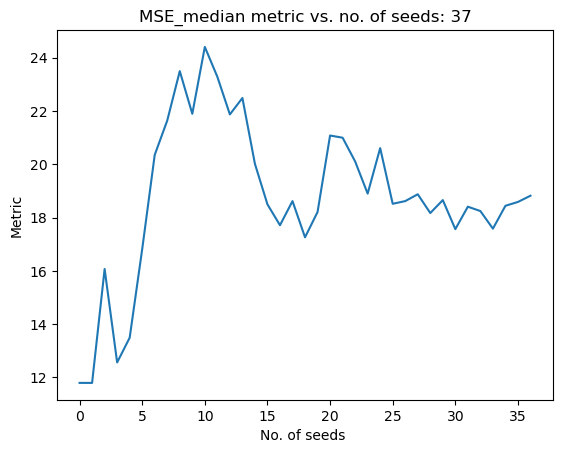

Time required: 2241.35866189003
Best solution found: 
X = [ 1.248424    8.71103622  8.91250905  0.2200687   8.41640458  8.5869568
  8.78594062  0.94794454  6.98830208  7.04703263  6.60699919  6.96829965
  2.54931009  8.49652434  8.02687796  8.7833021   8.58972197  0.47829888
  6.50110614  1.11003372  8.15477153  8.14813997  8.11749209  7.11589575
  2.48466142  8.50865173  0.71818868  3.73257847  5.756755    5.71952084
  1.34813241  8.35773715 -1.30103     1.4263124 ]
F = [11.794144]
CV = [0.]
R2: 0.860085271301535
R: 0.9274078236145816
-log10(1-R2): 0.854136565309635
Mean solution thus far: 
 [0.6257669121271334, 8.087330642085144, 8.292081249140992, 0.6663621070395902, 8.04459731116673, 8.203127784096573, 8.373356873848927, 1.4448082198886658, 7.530734649027382, 7.491935876230923, 7.08986044702259, 7.44962969230469, 1.6482795201851623, 7.580759071975439, 6.894127479410541, 7.880920761475503, 7.6910354012127415, 1.7390872390219358, 7.761859165455733, 1.1065218779246138, 8.1525970729518

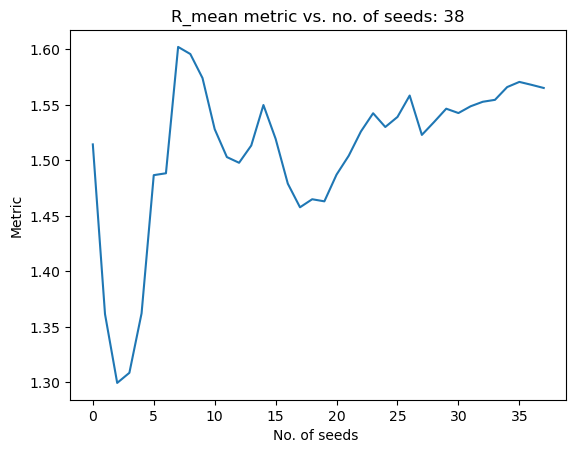

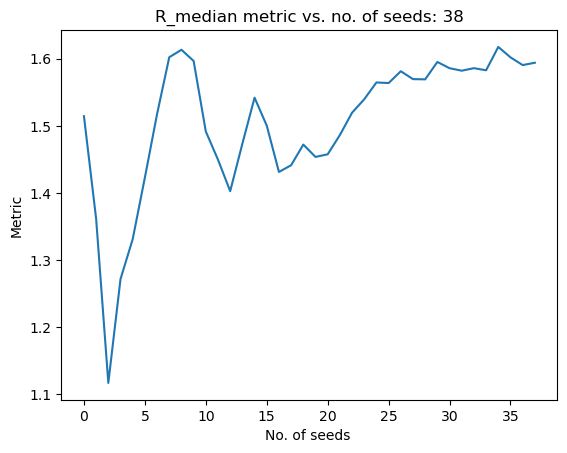

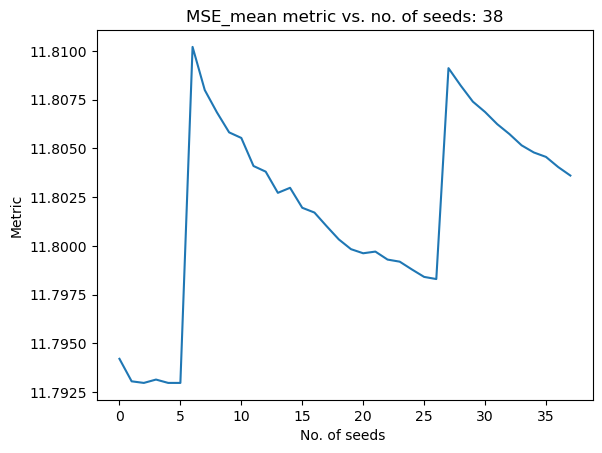

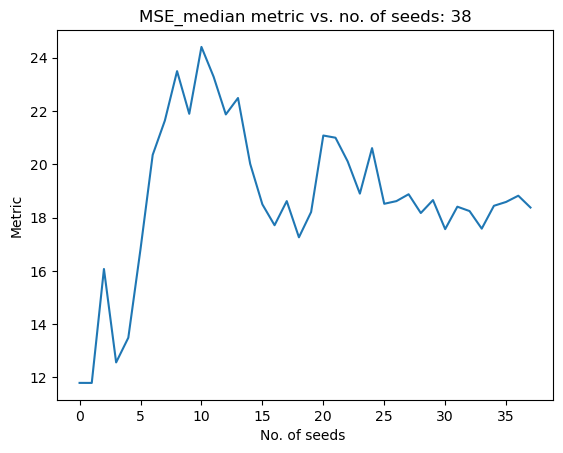

Time required: 2243.6890473365784
Best solution found: 
X = [ 0.23671504  7.6973017   7.90518213  0.69233363  8.16804036  8.2958502
  8.40894781  0.14607297  6.22167815  6.14227855  6.14115134  6.1594834
  2.41140904  8.40765202  7.99632793  8.64490599  8.44164329  2.79220968
  8.81539547  0.83643771  7.88169883  7.87470491  7.84402161  6.84261084
  1.54354453  7.56784332  3.90150455  6.91721191  8.94057677  8.9020016
  0.35877482  7.3685136  -1.30103     0.66239121]
F = [11.79366046]
CV = [0.]
R2: 0.905707068795649
R: 0.9516864340714587
-log10(1-R2): 1.0255208635088244
Mean solution thus far: 
 [0.615791223212535, 8.077329899916533, 8.282160758892427, 0.6670280434088566, 8.04776251763329, 8.2055052820307, 8.374269461875235, 1.4115073160079796, 7.497169097860614, 7.457329278222662, 7.065534572585106, 7.416549018097412, 1.6678469436463081, 7.6019614552780554, 6.922389029526975, 7.900510126355086, 7.71028175736767, 1.7660903786075801, 7.788872916980062, 1.0995966429404462, 8.145650964102

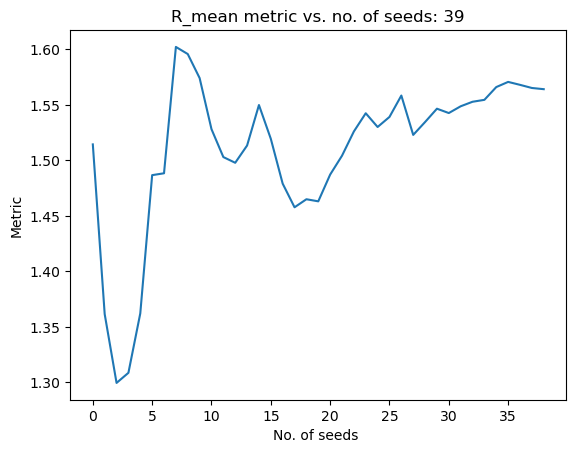

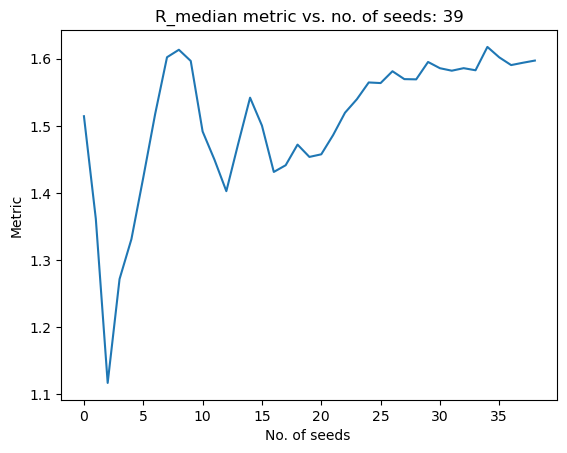

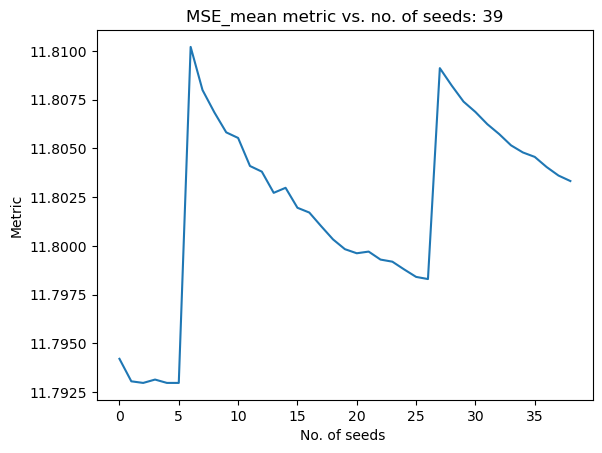

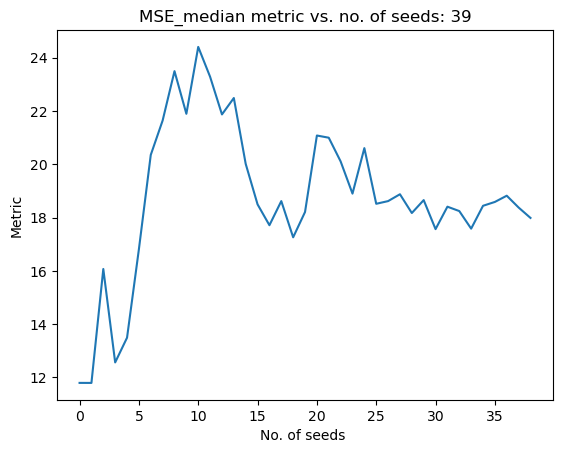

Time required: 2242.1290407180786
Best solution found: 
X = [ 4.91237502e-03  7.46616973e+00  7.67220523e+00  1.17864743e+00
  8.24681744e+00  8.43923067e+00  8.64821037e+00  9.07415430e-02
  6.21853346e+00  6.11112679e+00  6.10826476e+00  6.08294093e+00
  2.17416290e-01  6.16003097e+00  5.70994813e+00  6.44766349e+00
  6.25843549e+00  1.65455935e+00  7.67741042e+00  1.83765829e+00
  8.88265927e+00  8.87594857e+00  8.84488807e+00  7.84372947e+00
  1.71834644e+00  7.74247176e+00  3.96326651e+00  6.97775479e+00
  8.99997938e+00  8.96615062e+00  2.74422830e-01  7.28411853e+00
 -1.30103000e+00  3.16595019e-01]
F = [11.79409704]
CV = [0.]
R2: 0.8409733605348374
R: 0.9170459969569887
-log10(1-R2): 0.7985301184239456
Mean solution thus far: 
 [0.6005192520076083, 8.062050895591257, 8.266911870633617, 0.6798185279519703, 8.052738890617873, 8.211348416834827, 8.381117984534011, 1.378488171681841, 7.465203206987878, 7.4236742161078055, 7.041602827238537, 7.383208815937074, 1.6315861773023492, 7.

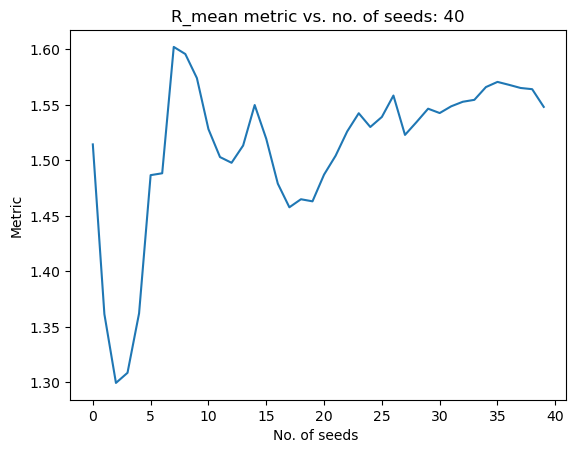

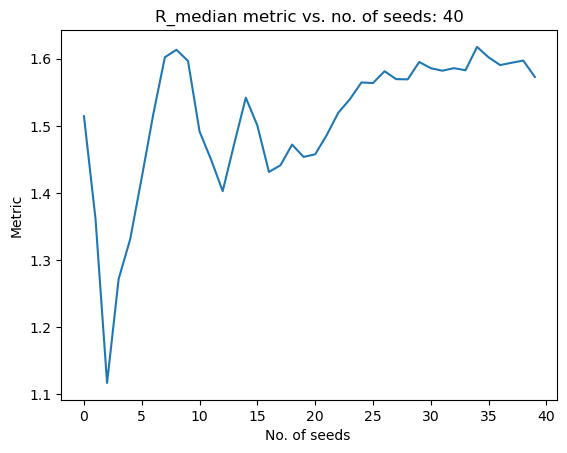

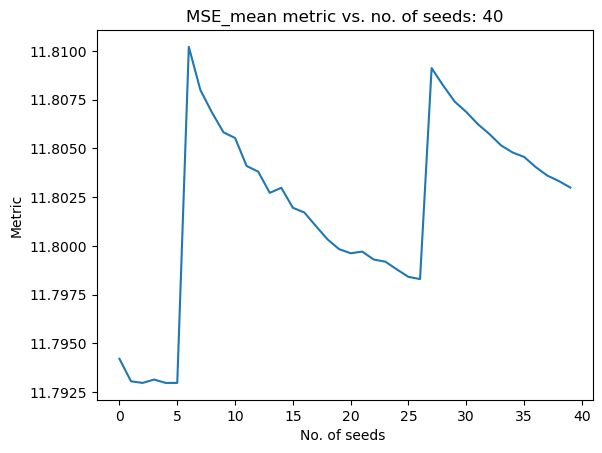

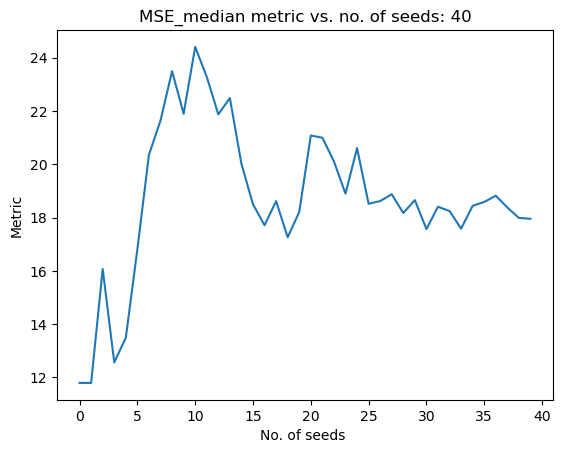

Time required: 2236.063886165619
Best solution found: 
X = [ 0.79773668  8.25943819  8.46396018  0.41698569  7.71754471  7.85140602
  7.96200743  1.78260213  7.95664277  7.71331332  8.02997318  7.75305315
  2.37117991  8.30614203  7.74589103  8.60845458  8.41572476  2.42101057
  8.4436129   0.77680492  7.82277284  7.8162427   7.78315023  6.78184115
  0.8182521   6.84204248  3.2404476   6.25317946  8.27796011  8.24323721
  1.93270538  8.94209125 -1.30103     0.49122743]
F = [11.79606563]
CV = [0.]
R2: 0.9660810181882435
R: 0.982894204982532
-log10(1-R2): 1.4695571929770153
Mean solution thus far: 
 [0.6053294331662035, 8.066865219920185, 8.271717927038376, 0.6734079710247394, 8.044563422914477, 8.202569333953612, 8.370895775937605, 1.3883446097787406, 7.477189537724714, 7.430738584567984, 7.065709421226654, 7.392229409475089, 1.6496250487459476, 7.583967555147465, 6.912902715072189, 7.882341780532052, 7.692076799562375, 1.7793437728401542, 7.802123587175607, 1.1097251776778505, 8.155751

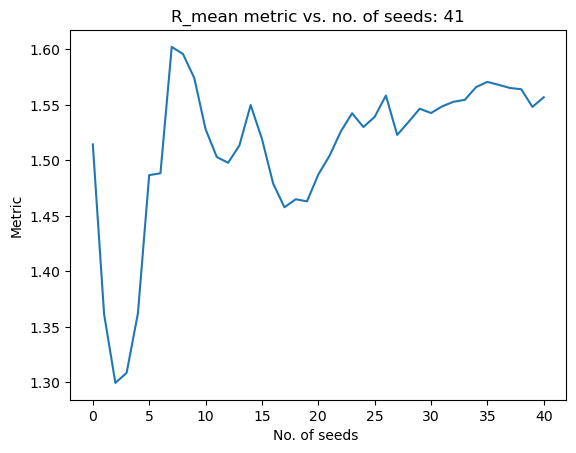

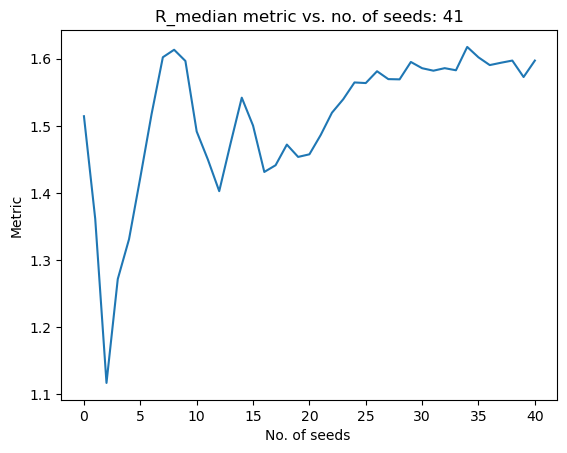

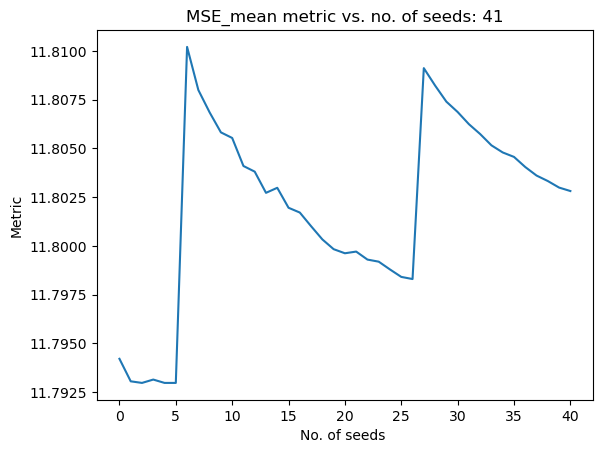

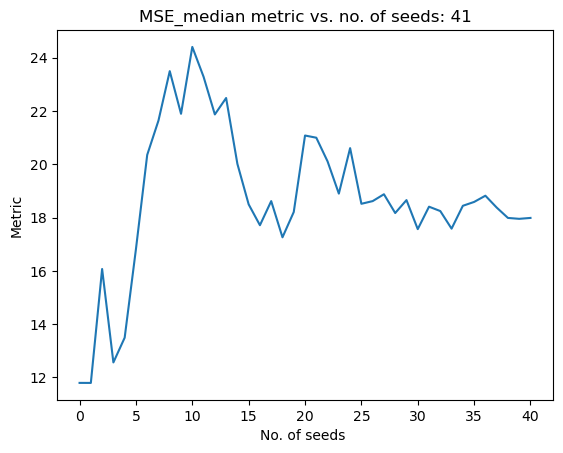

Time required: 2241.516852617264
Best solution found: 
X = [ 0.10285941  7.56410206  7.77001071  1.16751572  8.69602491  8.84165973
  8.99999998  2.76367328  8.85015418  8.83774702  8.71679683  8.76559152
  2.73132558  8.63764846  8.08336598  8.96231191  8.78057914  2.90732752
  8.93001707  1.52460302  8.5702096   8.56316055  8.53146737  7.53007571
  2.84498524  8.86897124  1.28065109  4.29380164  6.3180194   6.2835251
  0.25272836  7.26220164 -1.30103     0.73393738]
F = [11.79374982]
CV = [0.]
R2: 0.8970846250414456
R: 0.9471455141853576
-log10(1-R2): 0.9875197393205316
Mean solution thus far: 
 [0.5933658612815536, 8.054894668442941, 8.25977251715878, 0.6851724411713864, 8.060074410734325, 8.217785772007792, 8.38587444735214, 1.4210905305292247, 7.509879172136255, 7.464238785408339, 7.105021026112757, 7.424928507309788, 1.6753798234131736, 7.609055195856441, 6.940770888015152, 7.9080553550290995, 7.717993521859657, 1.8062005286880687, 7.828978193950317, 1.1196032214814342, 8.1656197

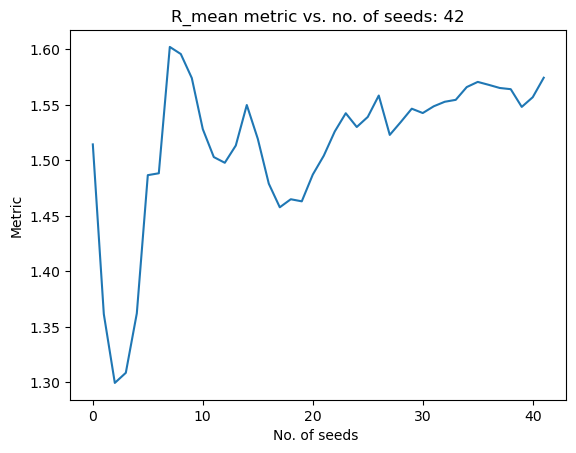

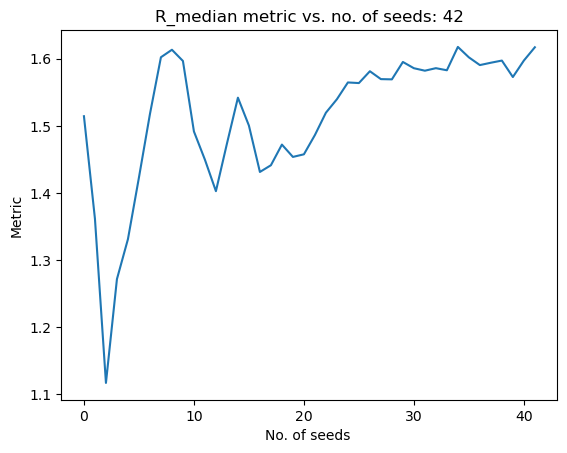

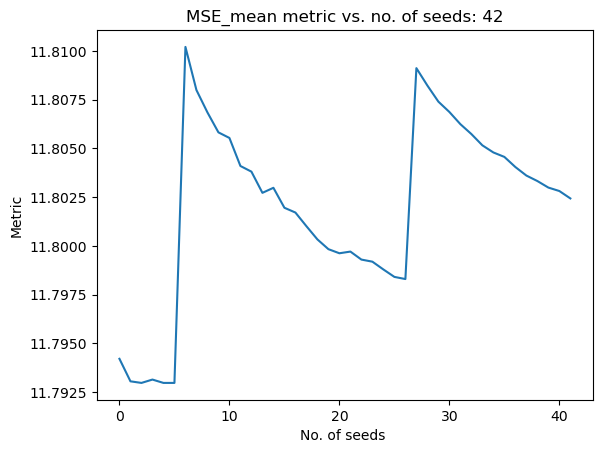

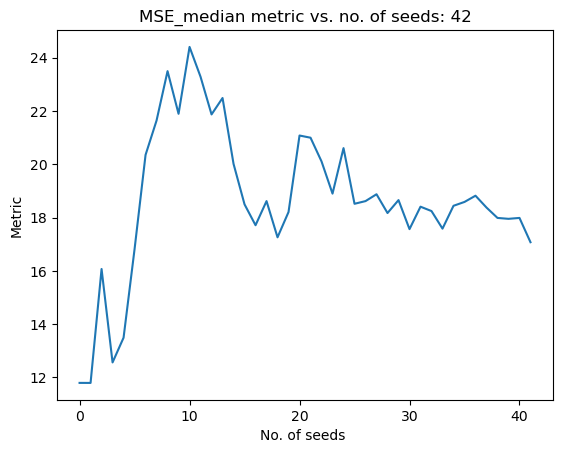

Time required: 2245.755803823471
Best solution found: 
X = [ 0.27903147  7.7399441   7.94694186  0.23227082  8.06896506  8.21141423
  8.3624403   2.62855749  8.69160973  8.69486511  8.53573614  8.64030528
  1.7804274   7.72845771  7.21498143  8.01874551  7.82147106  2.68126466
  8.70394613  0.92614937  7.97231977  7.96538914  7.93256958  6.93136056
  0.25377399  6.27766167  3.4809921   6.49361774  8.51799579  8.48443418
  0.01123879  7.02066589 -1.30103     1.0388593 ]
F = [11.79311613]
CV = [0.]
R2: 0.9511815507403576
R: 0.97528536887434
-log10(1-R2): 1.3114160202624745
Mean solution thus far: 
 [0.5860557591603628, 8.047570236720539, 8.252497385710656, 0.674639845428186, 8.060281170126038, 8.217637596525462, 8.385329467127862, 1.4491711574951958, 7.5373612782294055, 7.492858002272735, 7.138293470613463, 7.4531930834186095, 1.677822790387921, 7.611831998468025, 6.947147877436461, 7.910629544628481, 7.720399976146921, 1.8265508572160862, 7.849326285594492, 1.1151042946493719, 8.1611243

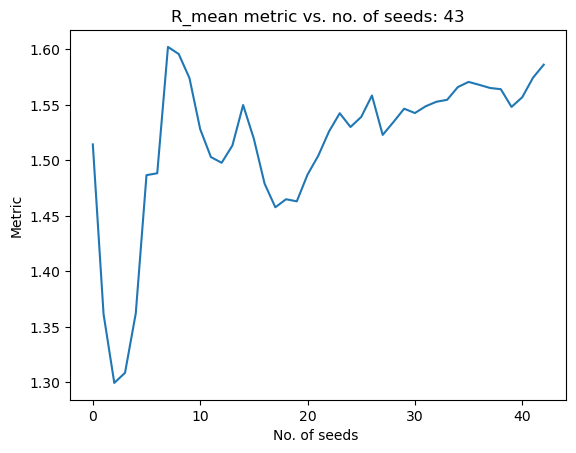

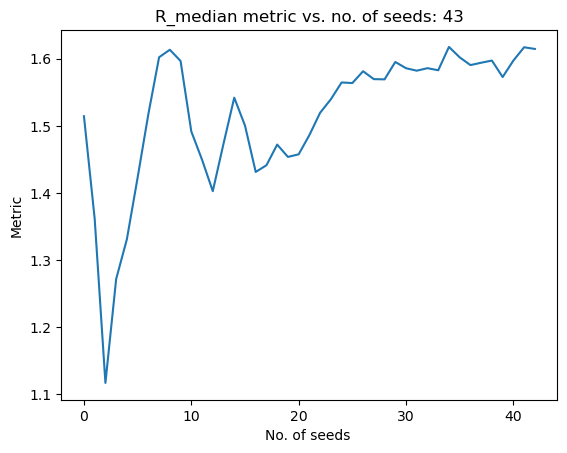

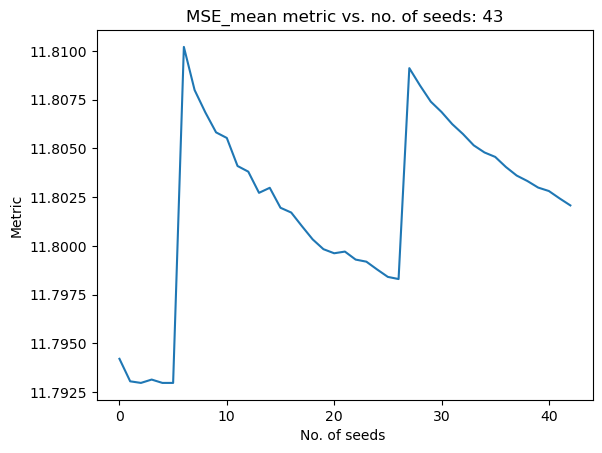

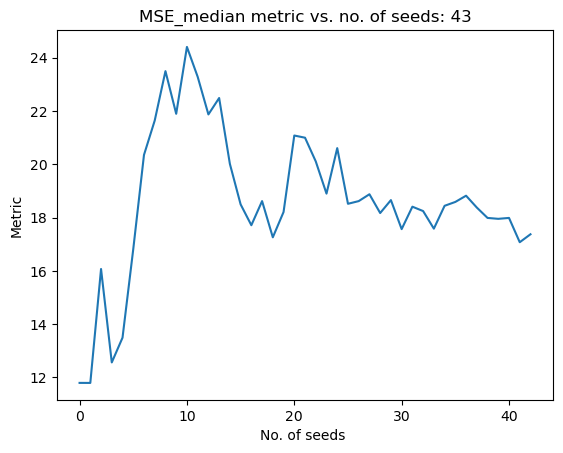

Time required: 2239.409856557846
Best solution found: 
X = [ 0.53418461  7.99574615  8.20114141  0.77466621  7.76380534  7.95373316
  8.14601015  2.10792604  8.25234457  8.07508832  8.16467105  8.09892366
  2.40310802  8.31642666  7.74991582  8.63811632  8.45102346  2.83026906
  8.85280906  0.73403497  7.7792878   7.7721675   7.74091185  6.73960838
  2.88535583  8.90911501  3.37404954  6.38675083  8.4119117   8.37653282
  0.47102093  7.48031989 -1.30103     0.23327131]
F = [11.79483578]
CV = [0.]
R2: 0.9464596524897128
R: 0.9728615793059734
-log10(1-R2): 1.2713188142975662
Mean solution thus far: 
 [0.584876869516628, 8.046392416650981, 8.251330204548555, 0.676913171792668, 8.05354308314128, 8.211639768310384, 8.379890391736643, 1.4641428594169184, 7.553610898550844, 7.506090509576264, 7.16162023377509, 7.467868778248155, 1.6943065455293407, 7.6278455136101595, 6.9653926035003675, 7.927163334865674, 7.737005055365485, 1.8493626345361802, 7.872132712381799, 1.1064436282369767, 8.1524462

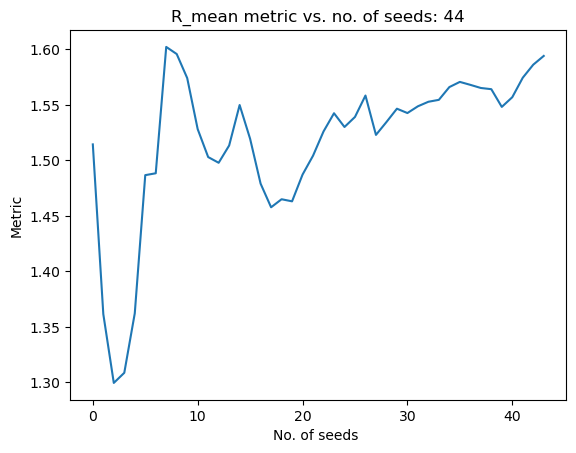

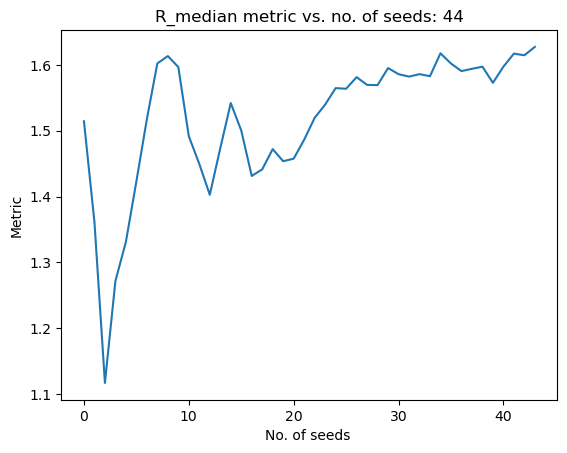

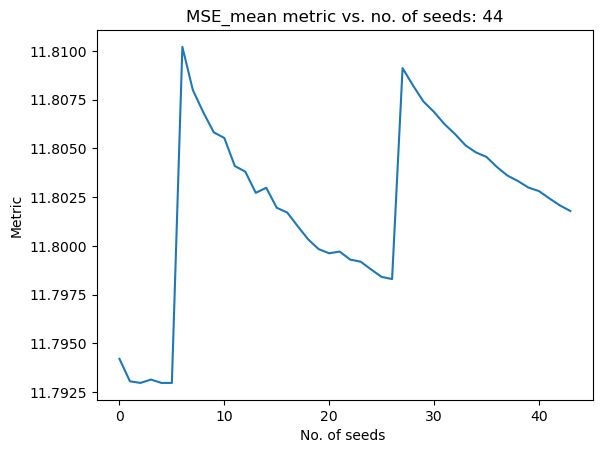

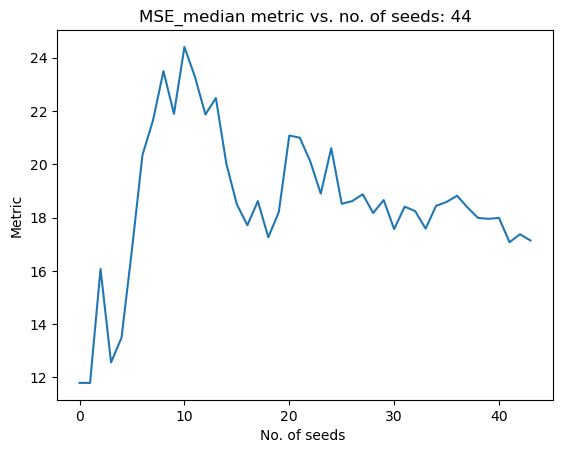

Time required: 2263.2741663455963
Best solution found: 
X = [ 0.33268153  7.79564589  7.99644932  0.44143479  7.58213467  7.76452319
  7.94716461  1.7707123   7.89924309  7.75240237  7.76614451  7.76837362
  1.47685485  7.38992865  6.85873482  7.70526446  7.52499356  0.51434573
  6.53713964  0.95802852  8.00652491  7.99874267  7.96331289  6.96231829
  0.93060745  6.95460945  3.63123542  6.63882516  8.66462499  8.64072395
  0.88630157  7.89548719 -1.30103     0.37772123]
F = [11.79435787]
CV = [0.]
R2: 0.9454174971283106
R: 0.9723258184005558
-log10(1-R2): 1.2629465537075013
Mean solution thus far: 
 [0.5792725285811203, 8.04082027164115, 8.245666184911075, 0.6716803187602601, 8.043067340617776, 8.201703844264816, 8.370274263208112, 1.4709555136425274, 7.56129161385822, 7.511564106405666, 7.175054106622395, 7.4745466635841735, 1.6894742856389908, 7.622558472169322, 6.96302243062936, 7.922232248777167, 7.732293688742728, 1.819695592291501, 7.842466199769905, 1.1031455146962177, 8.1492035

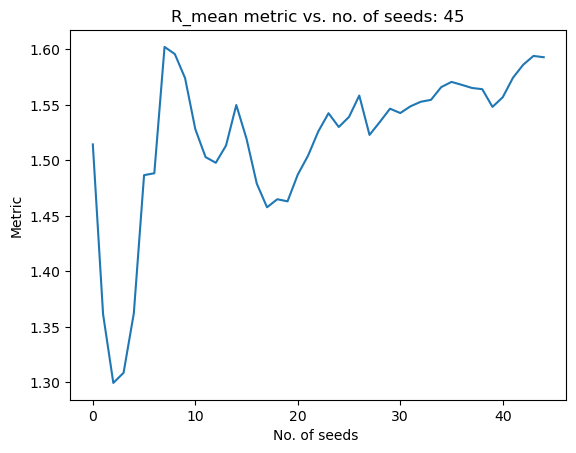

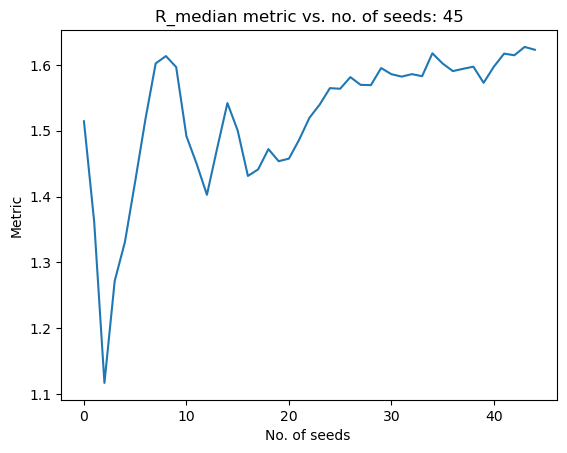

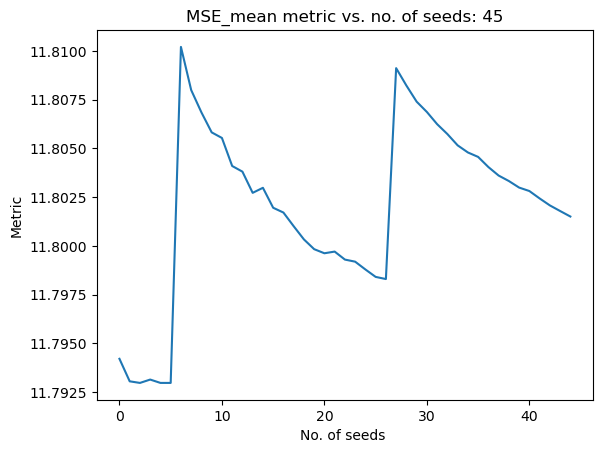

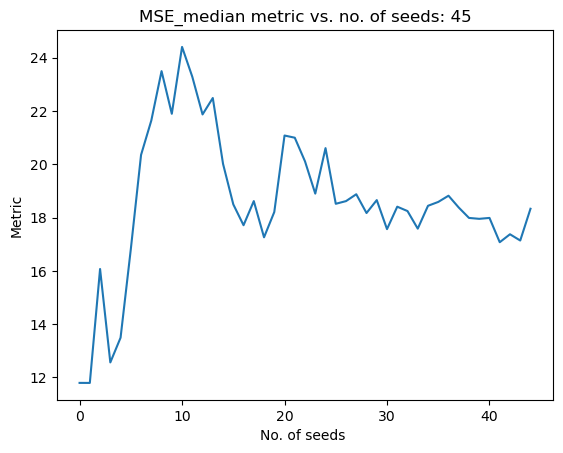

Time required: 2269.234228372574
Best solution found: 
X = [ 0.15701243  7.61746941  7.82582158  0.23942651  7.88333937  8.02572737
  8.18564066  0.74618175  6.76400563  6.84559569  6.48739093  6.77066833
  0.39741351  6.36153609  5.89039328  6.63549991  6.43459496  1.46287114
  7.48569023  0.55638072  7.60265213  7.59570302  7.56291467  6.56166101
  1.92566804  7.94963327  3.62727454  6.64021676  8.66514921  8.63012565
  0.75901861  7.76853248 -1.30103     0.84720882]
F = [11.79401753]
CV = [0.]
R2: 0.8846456242297128
R: 0.9405560186558336
-log10(1-R2): 0.9379659266145336
Mean solution thus far: 
 [0.5700929611414132, 8.031616991997687, 8.236539128266424, 0.6622834968579001, 8.039594993334985, 8.19787826876323, 8.366260489271754, 1.4551995621968767, 7.543959309918708, 7.497086532199928, 7.160104907065943, 7.459244960657511, 1.6613860078385112, 7.595144942117271, 6.93970440559993, 7.8942598065996945, 7.704082846876282, 1.8119385389817935, 7.834710200342135, 1.0912593235219596, 8.137322

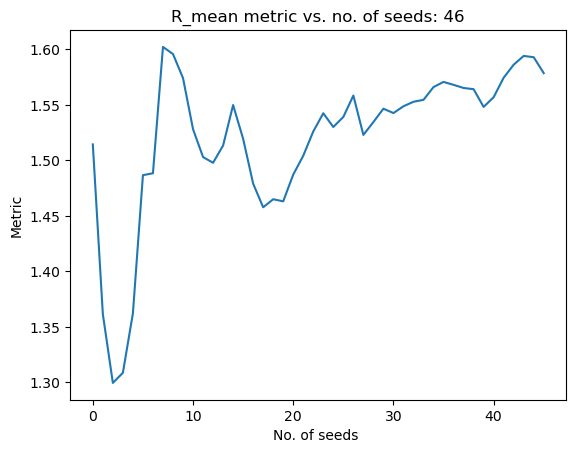

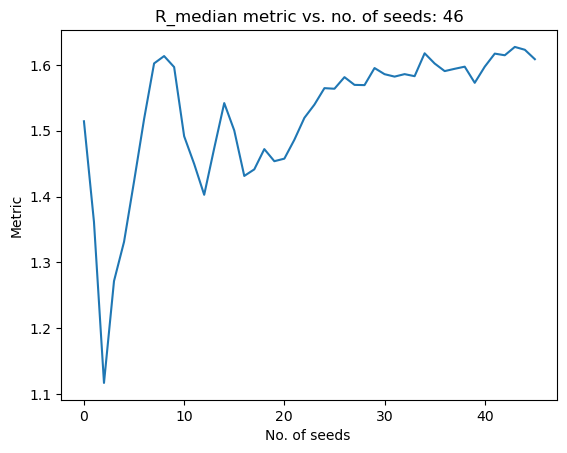

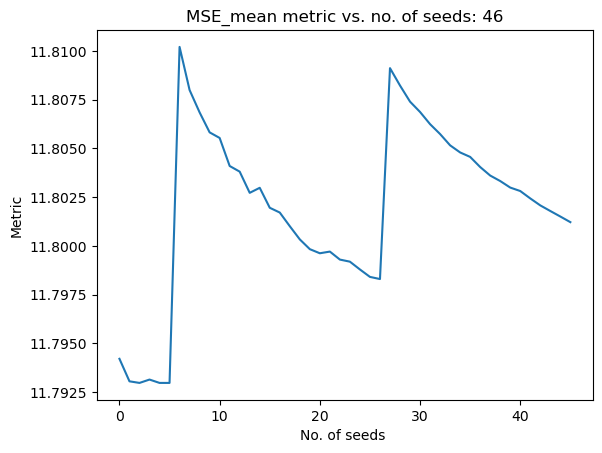

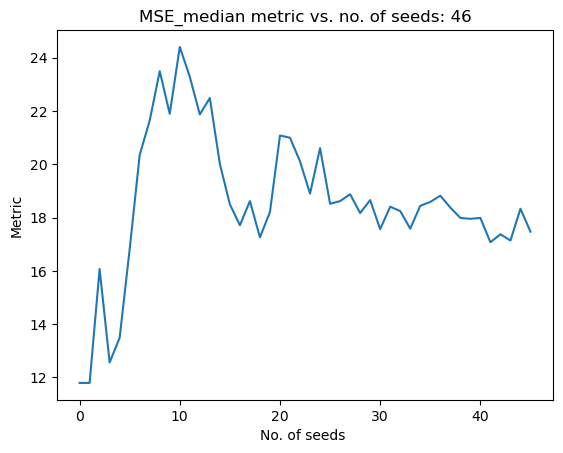

Time required: 2276.968385219574
Best solution found: 
X = [ 0.04188868  7.50340139  7.70862794  0.80329856  8.03178186  8.20548217
  8.41230984  1.76755002  7.8770873   7.83485846  7.71584262  7.76499101
  1.66067585  7.51409825  0.92412797  7.91177618  7.72360338  0.43983199
  6.46212658  0.60148268  7.64622717  7.63884005  7.60855747  6.60734944
  1.11252648  7.13628487  3.84236261  6.8602782   8.88387598  8.83865396
  1.58926397  8.598947   -1.30103     0.46135662]
F = [11.80023602]
CV = [0.]
R2: 0.786782750712995
R: 0.8870077512135928
-log10(1-R2): 0.6711776637771126
Mean solution thus far: 
 [0.5588545721881134, 8.020378362242292, 8.22530697523328, 0.6652838173794872, 8.039428756390743, 8.198040053886038, 8.367240262763266, 1.4618453167007244, 7.551047139456839, 7.504273168872244, 7.171929113727188, 7.465750195755574, 1.6613708980903539, 7.593420544391274, 6.811713417694316, 7.894632495469161, 7.704498177322862, 1.7827447826587361, 7.805506293494752, 1.0808385439344441, 8.1268732

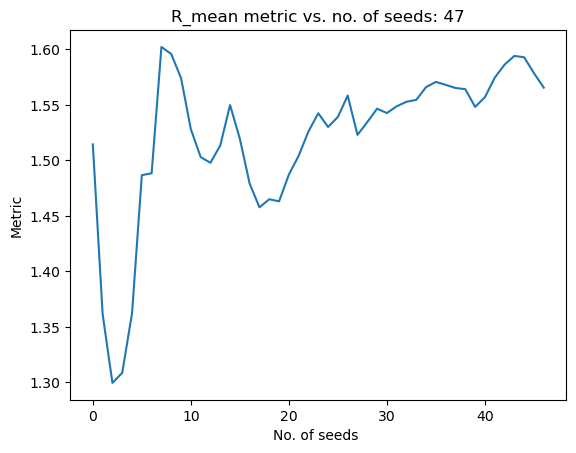

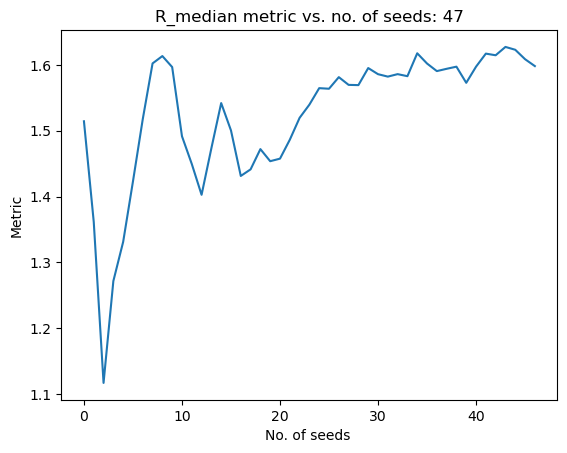

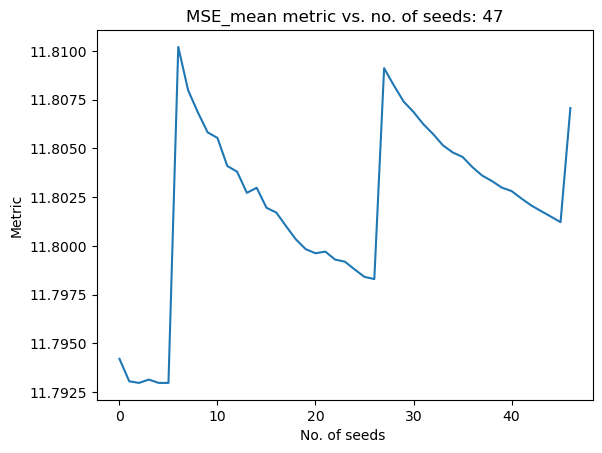

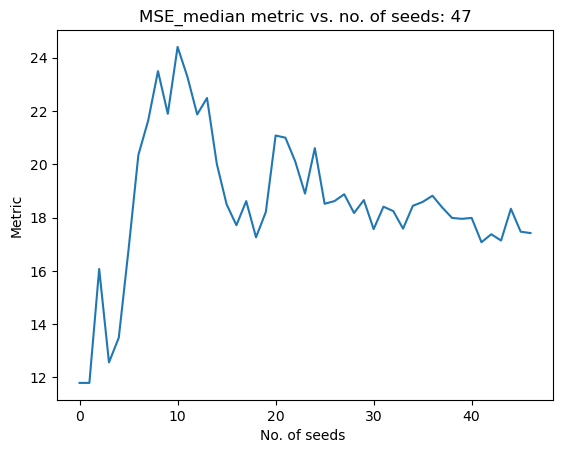

Time required: 2268.4203794002533
Best solution found: 
X = [ 1.02797478  8.49240339  8.68791583  0.58598894  7.6024901   7.75417182
  7.9305153   1.16976186  7.26491824  7.20749745  7.15154649  7.17307102
  0.71029854  6.66866738  6.23236892  6.9394573   6.74873427  0.27825976
  6.30139386  0.68156342  7.72709116  7.71920634  7.68909558  6.68782391
  2.47542527  8.49973328  3.92981609  6.94982701  8.97462488  8.92275427
  0.24475184  7.25452528 -1.30103     0.2287632 ]
F = [11.79309421]
CV = [0.]
R2: 0.8880214415406206
R: 0.9423488958663986
-log10(1-R2): 0.9508651276355218
Mean solution thus far: 
 [0.5686279097723127, 8.030212216933029, 8.234944659713713, 0.6636318407471327, 8.030325867770754, 8.188792799091933, 8.358141826088426, 1.4557602447777482, 7.54508612065117, 7.498090341445828, 7.171504475667519, 7.459652713030141, 1.6415568906973876, 7.574154853376768, 6.79964374060568, 7.874733012207301, 7.684586429290744, 1.751401344651651, 7.774170617774186, 1.0725203122505913, 8.1185444

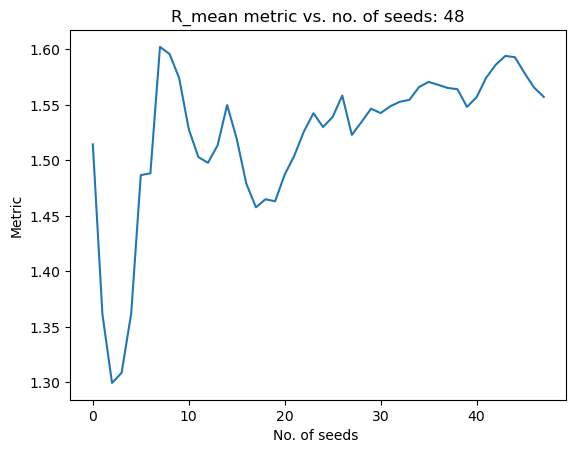

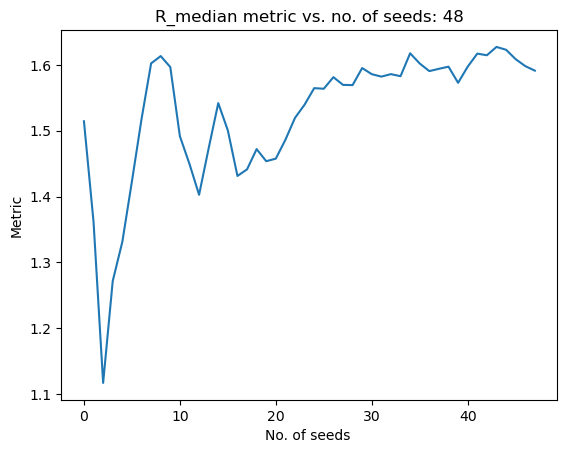

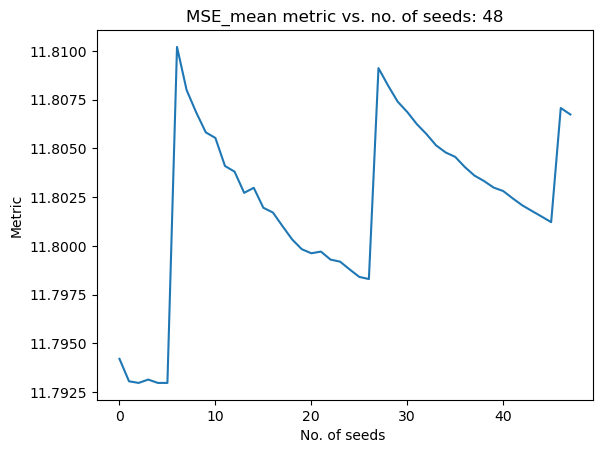

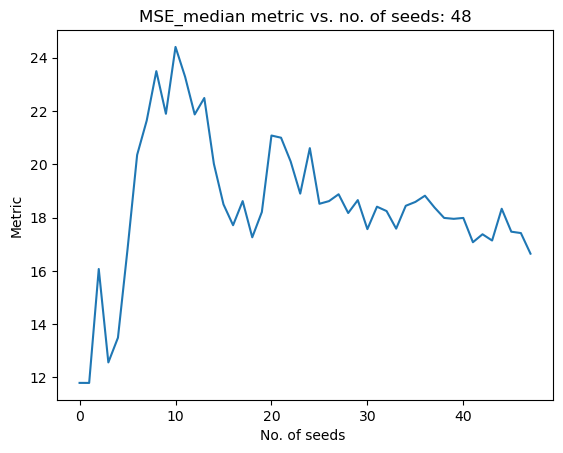

Time required: 2277.0532562732697
Best solution found: 
X = [ 0.70399073  8.16681887  8.36744263  0.76976898  8.06725139  8.17329476
  8.28679673  2.03831768  8.0583187   8.1261194   7.93054564  8.05959523
  1.79356144  7.78591249  7.36269446  8.03009807  7.82440836  1.13548606
  7.15855649  0.90390902  7.94878957  7.94162759  7.91178715  6.91008549
  1.31192318  7.33614167  1.98361876  4.99763975  7.02062528  6.98659544
  1.70521132  8.71484325 -1.30103     0.46759973]
F = [11.79448099]
CV = [0.]
R2: 0.9637489224163958
R: 0.9817071469722505
-log10(1-R2): 1.4406790792541617
Mean solution thus far: 
 [0.571390416243165, 8.03300010779234, 8.237648699852498, 0.6657979048364225, 8.031079449896566, 8.188476512629423, 8.356685803717218, 1.4676491719784819, 7.55556025485679, 7.51090726101849, 7.186995111615138, 7.471896437799971, 1.6446590242795562, 7.578476437793256, 6.811134571640139, 7.877903727754062, 7.687439938036568, 1.738831644966966, 7.761607064132677, 1.069079265467461, 8.1150800373

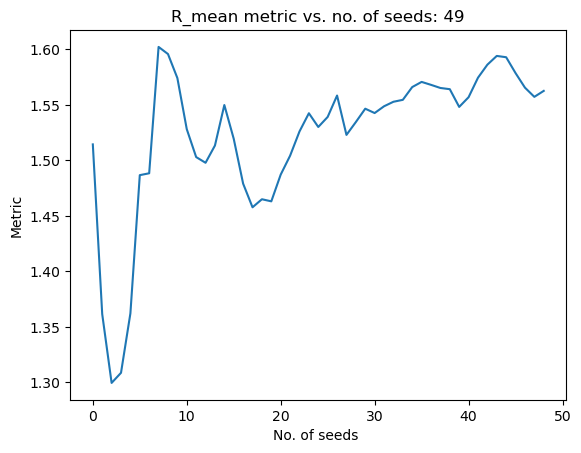

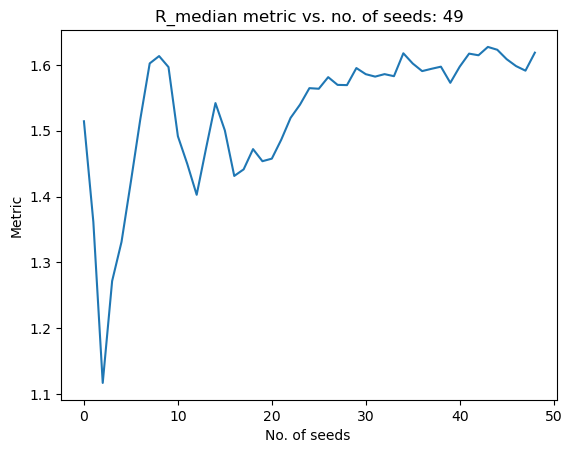

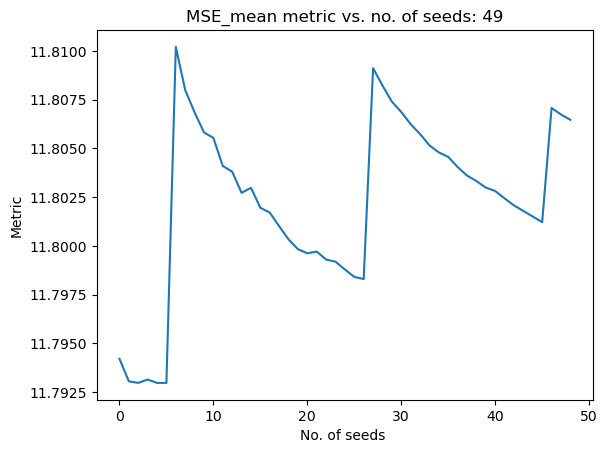

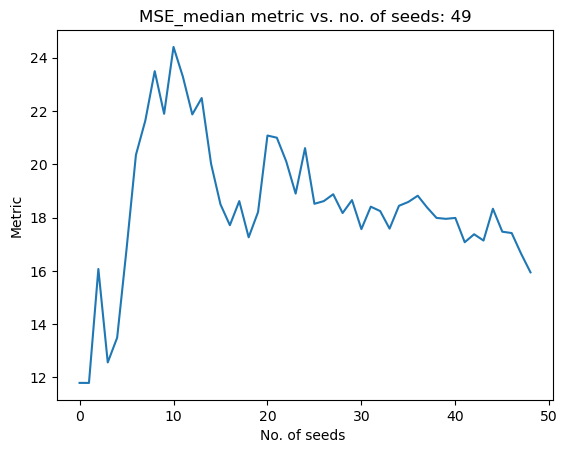

Time required: 2275.502132177353
Best solution found: 
X = [ 0.18301773  7.64459011  7.84950543  1.68873494  8.53734977  8.68860002
  8.84174081  0.96566131  7.08047684  6.97988672  7.03561675  6.96048388
  0.64485864  6.60922571  6.24305048  6.86436456  6.68091176  0.92028435
  6.94377941  1.7385546   8.78547665  8.77769043  8.74552181  7.74448333
  2.34946463  8.37401539  2.79250406  5.80696252  7.83058732  7.79496922
  0.84799769  7.85769192 -1.30103     0.05772297]
F = [11.79348596]
CV = [0.]
R2: 0.9153726970348365
R: 0.9567511155127213
-log10(1-R2): 1.0724894996781003
Mean solution thus far: 
 [0.5636229625234304, 8.025231907854796, 8.22988583455389, 0.6862566455181178, 8.041204856395545, 8.19847898271399, 8.366386903942198, 1.457609414675464, 7.546058586639901, 7.500286850148728, 7.1839675444089774, 7.461668186653815, 1.624663016572495, 7.559091423311196, 6.799772889795815, 7.857632944316423, 7.667309374387881, 1.7224606991275064, 7.745250511084751, 1.0824687722545903, 8.12848796

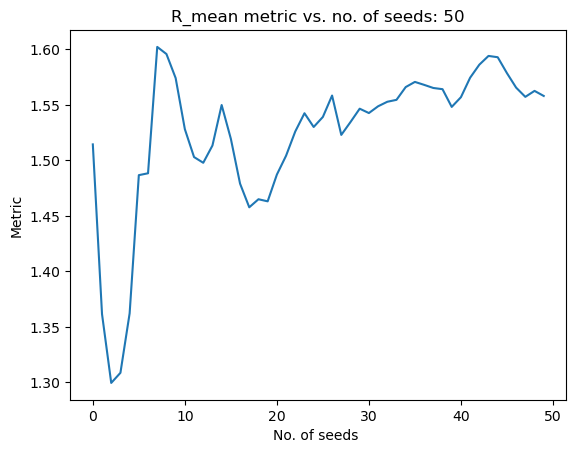

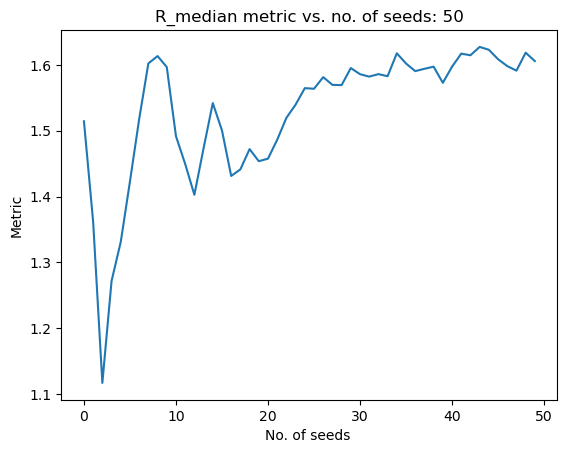

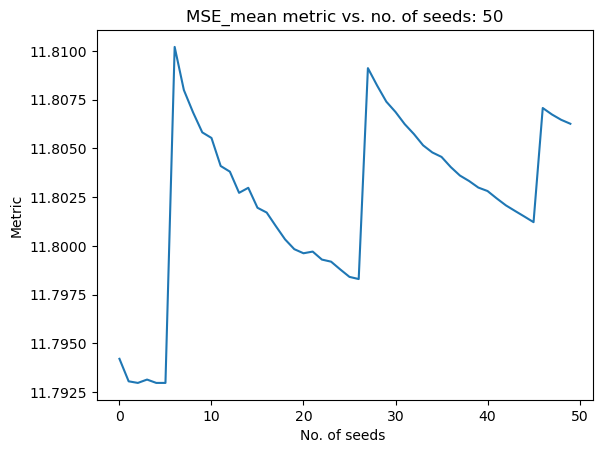

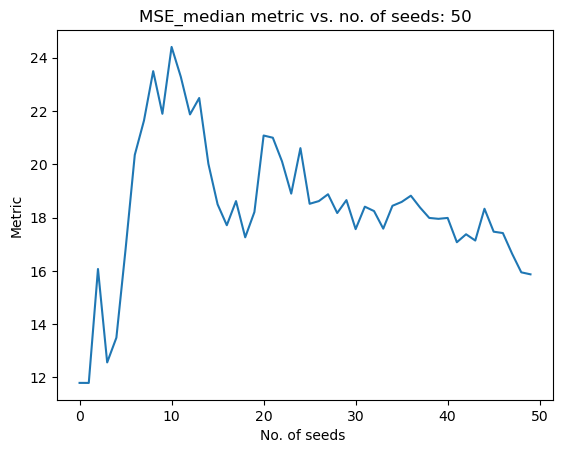

Time required: 2276.2489750385284
Best solution found: 
X = [ 0.27492905  7.73730315  7.94039806  0.40437828  7.38890385  7.58512951
  7.79490042  1.23077794  7.33398558  7.26282268  7.12166712  7.23547204
  2.65969391  8.5753897   8.01493407  8.89444003  8.70733193  0.69041624
  6.71311654  0.65359005  7.69949331  7.69215127  7.66018488  6.65874774
  1.77944953  7.80308618  3.56192787  6.57524002  8.59950772  8.56427096
  1.82710458  8.83658505 -1.30103     0.23631455]
F = [11.7945734]
CV = [0.]
R2: 0.9259377829032238
R: 0.9622566096957837
-log10(1-R2): 1.1304032912268474
Mean solution thus far: 
 [0.5579622975850396, 8.01958624602392, 8.224209603672778, 0.680729618701217, 8.028414640582152, 8.186452522554662, 8.355181286583587, 1.453161738638903, 7.541900292474236, 7.495630689919892, 7.182745967517524, 7.457232968180341, 1.6449577399461937, 7.579018840460233, 6.823599579573009, 7.877962495045477, 7.687701973453744, 1.7022245332326822, 7.725012590120198, 1.0740593855831038, 8.12007630

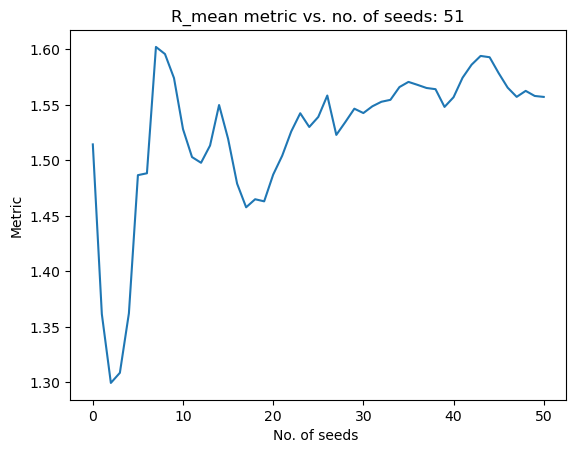

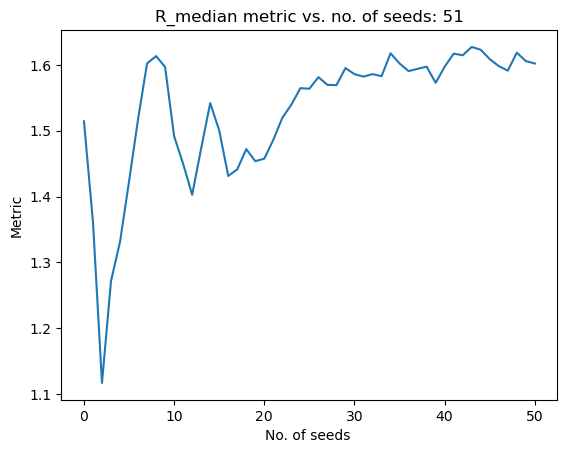

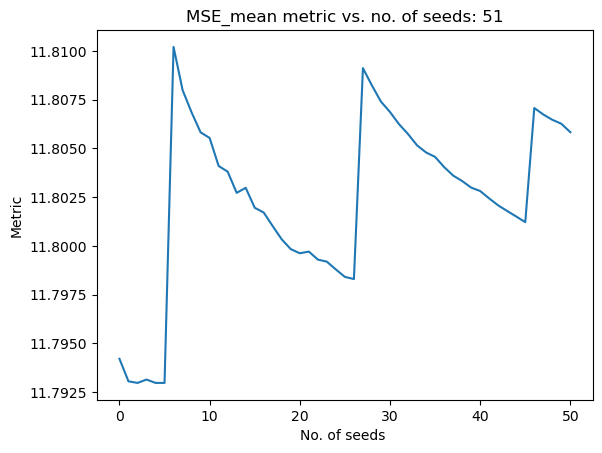

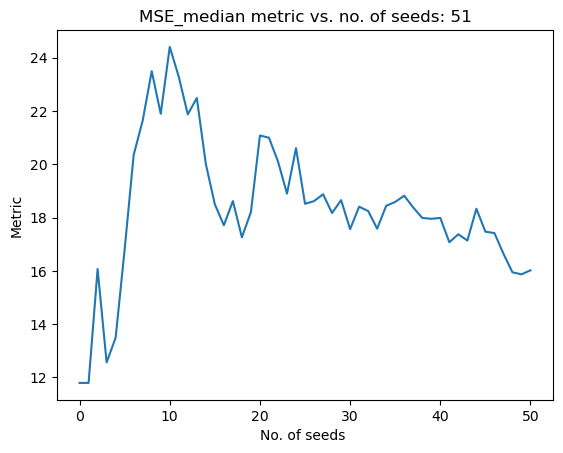

Time required: 2276.8863365650177
Best solution found: 
X = [ 1.24817518  8.7096501   8.91503157  0.53371909  8.02344678  8.18500776
  8.40183774  2.02027213  8.03975352  8.17433018  7.68442933  8.03575467
  0.88587512  6.8231612   6.42395389  7.10909735  6.92692628  1.3541638
  7.37723174  0.84037651  7.88622314  7.87981427  7.8472331   6.84623032
  0.48654783  6.51080282  3.56061337  6.5742435   8.59927659  8.56254186
  1.01807855  8.02763671 -1.30102998  0.71559189]
F = [11.79522882]
CV = [0.]
R2: 0.9524710274180499
R: 0.9759462215809076
-log10(1-R2): 1.3230415736036707
Mean solution thus far: 
 [0.5712356221622215, 8.032856704705788, 8.237494641472582, 0.6779024932140594, 8.028319104790842, 8.186424738676239, 8.35607852605353, 1.464067707747214, 7.551474393051488, 7.508682603223597, 7.192393724520594, 7.4683583855893065, 1.6303599972337608, 7.564483116611383, 6.815914085510378, 7.863176626935009, 7.673071671696162, 1.6955310575046831, 7.718324496839987, 1.0695654840608473, 8.115579

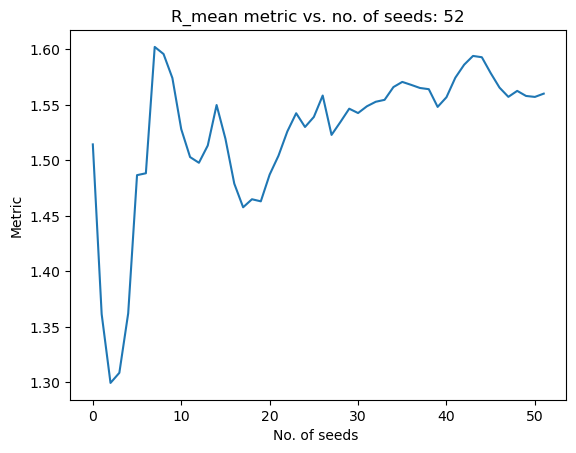

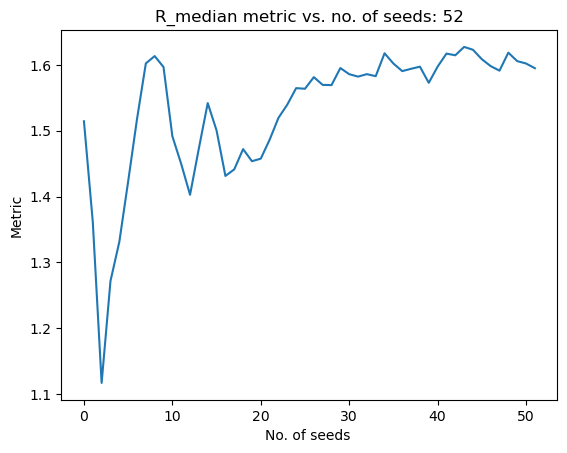

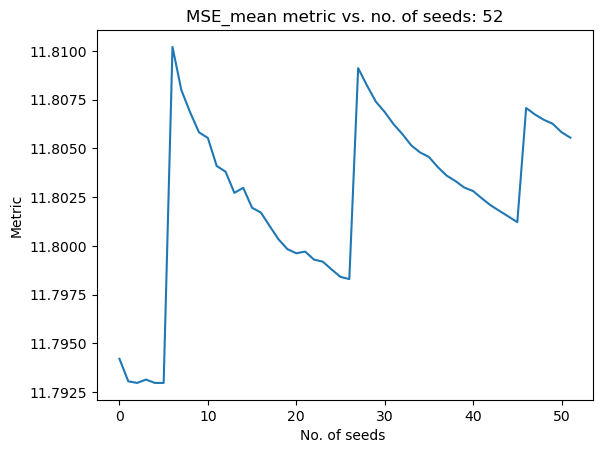

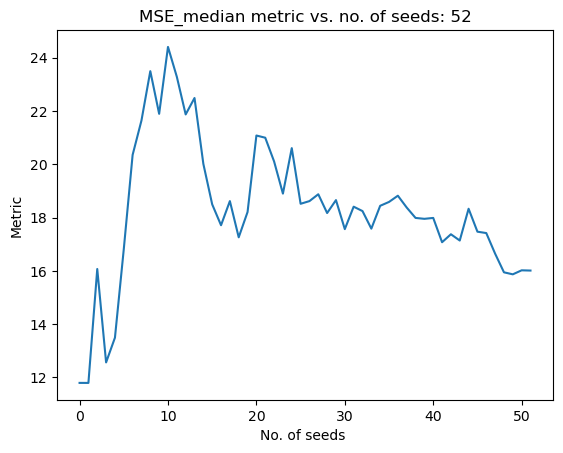

Time required: 2262.2488543987274
Best solution found: 
X = [ 0.0417542   7.50304734  7.70948685  0.02869691  8.48977881  8.67070843
  8.85483777  0.77376237  6.93054724  6.73046701  6.8984865   6.75661471
  1.38206422  7.31548447  6.81248133  7.6160066   7.42539523  2.19139332
  8.2140721   1.69325952  8.73899028  8.73240599  8.69966902  7.69867807
  1.30986158  7.33385153  2.53494976  5.54834518  7.57325874  7.53673121
  1.55856964  8.56791197 -1.30103     1.69721357]
F = [11.79458069]
CV = [0.]
R2: 0.924329225963121
R: 0.9614204210246009
-log10(1-R2): 1.1210718236084065
Mean solution thus far: 
 [0.5612454067144874, 8.022860301555024, 8.227532230374656, 0.6656533313295113, 8.037025891729801, 8.195562166810829, 8.365489077738932, 1.4510430788160353, 7.539758786402125, 7.4939992901808, 7.186848305129739, 7.454929259626362, 1.6256751712941575, 7.559785028963025, 6.815849316610365, 7.858513041488988, 7.668398531374275, 1.7048869493270598, 7.727678225165441, 1.081333296148372, 8.12734160

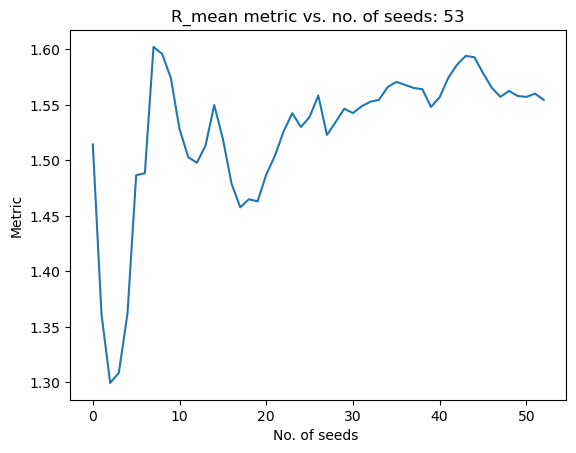

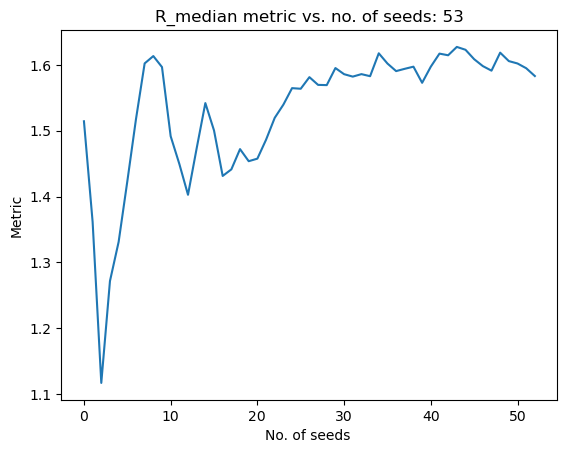

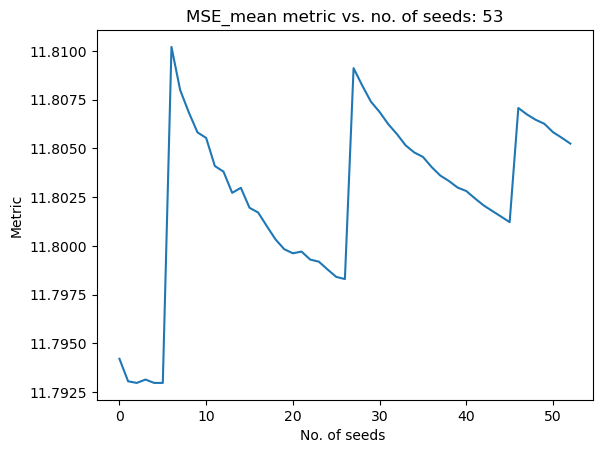

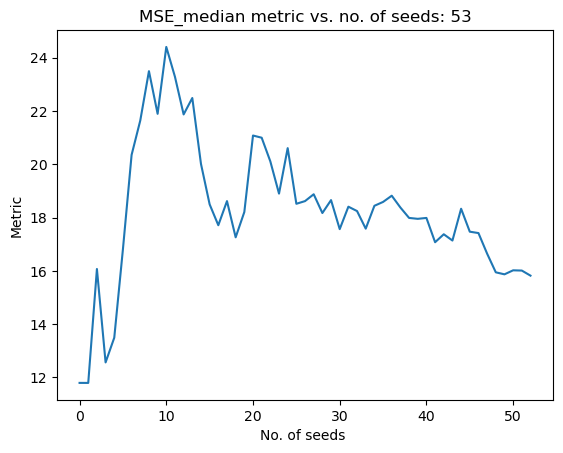

Time required: 2250.7811772823334
Best solution found: 
X = [ 1.29407701  8.75479247  8.96243246  0.39582314  8.38954361  8.5017301
  8.60978236  1.21121136  7.24921548  7.26500407  7.18154757  7.22927929
  0.67835723  6.69537396  6.29657684  6.91696924  6.70334105  0.66072117
  6.68394929  1.35464226  8.40158518  8.39421177  8.36112045  7.36014699
  1.57936718  7.60369447  3.00312243  6.01647096  8.04029454  8.00668267
  0.46495746  7.47462734 -1.30103     1.16801985]
F = [11.79456587]
CV = [0.]
R2: 0.9271203341789547
R: 0.9628708813641395
-log10(1-R2): 1.1373936274237617
Mean solution thus far: 
 [0.574816362407489, 8.036414600941024, 8.24114149385702, 0.6606564758957655, 8.04355399753547, 8.20123194335282, 8.370013027349847, 1.446601750636627, 7.53437835486315, 7.4897586379489605, 7.186750143300275, 7.450750556417891, 1.608132246452798, 7.543777416525581, 6.806233159717625, 7.841077045241133, 7.650527096617459, 1.6855505459680407, 7.708349911503545, 1.0863945732587175, 8.13242019245

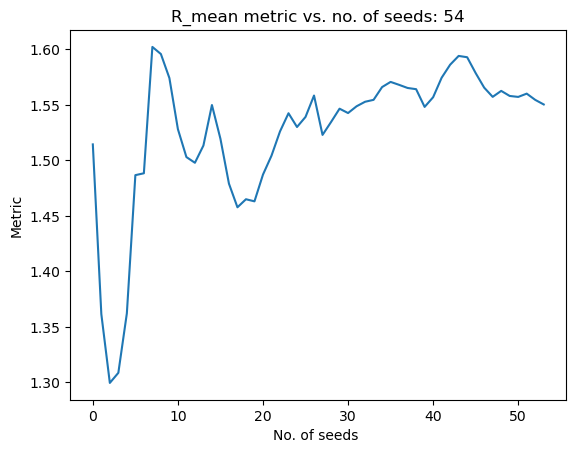

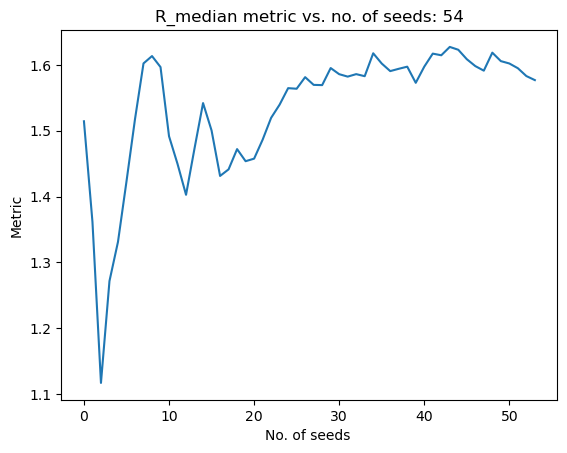

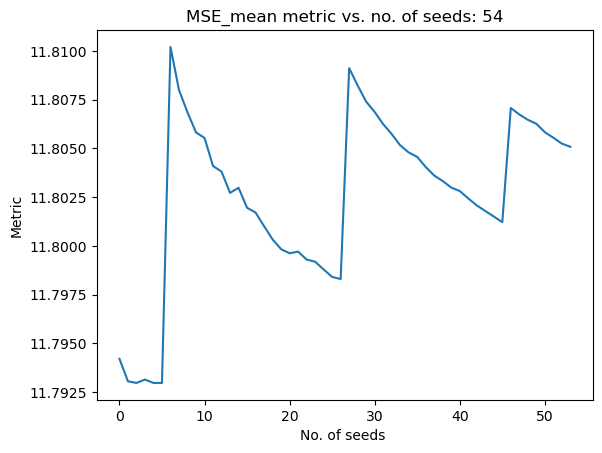

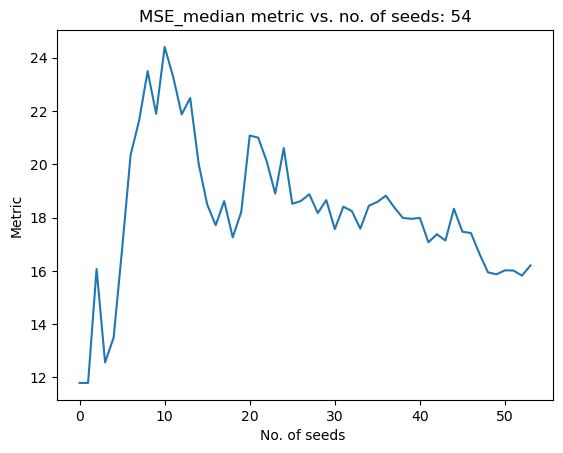

Time required: 2278.6597290039062
Best solution found: 
X = [ 0.45886572  7.92132383  8.12319455  0.9629803   8.11098009  8.25702495
  8.40358678  1.90162373  7.98375647  7.93198472  7.86715258  7.91018149
  1.66634784  7.62663759  7.16030531  7.90056564  7.70466379  2.3061429
  8.32898447  1.39053535  8.43315926  8.4267838   8.39924041  7.39774525
  0.52156936  6.54573631  3.86818877  6.88940269  8.91157441  8.86136531
  0.12664796  7.13650208 -1.30103     0.35233691]
F = [11.7929917]
CV = [0.]
R2: 0.9650690582789357
R: 0.9823792843290904
-log10(1-R2): 1.4567897058382009
Mean solution thus far: 
 [0.5727081688618738, 8.034322041558312, 8.238997004001806, 0.6661532727091155, 8.044779926446578, 8.202246361666761, 8.370623459149604, 1.4548748775545697, 7.542548865974056, 7.497799112139547, 7.199121096779917, 7.459103846193501, 1.6091907117640132, 7.545283965152498, 6.812670835135617, 7.8421586560431935, 7.651511400158111, 1.6968340433190832, 7.719634176150772, 1.0919244056530961, 8.13788

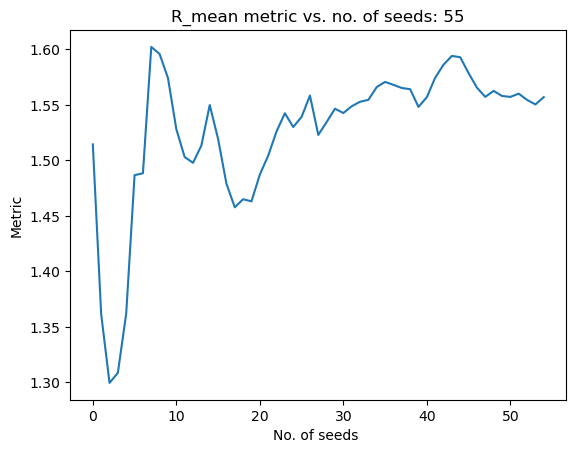

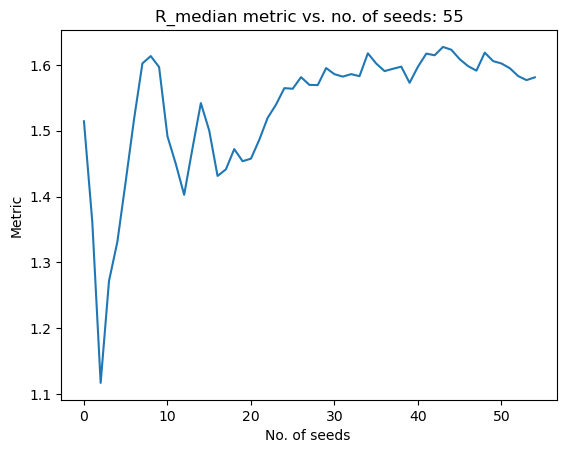

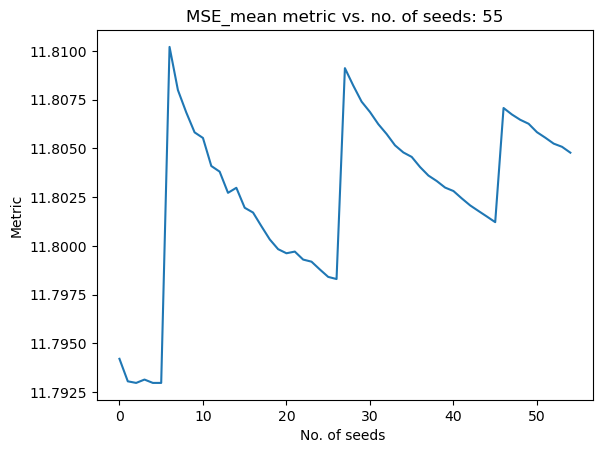

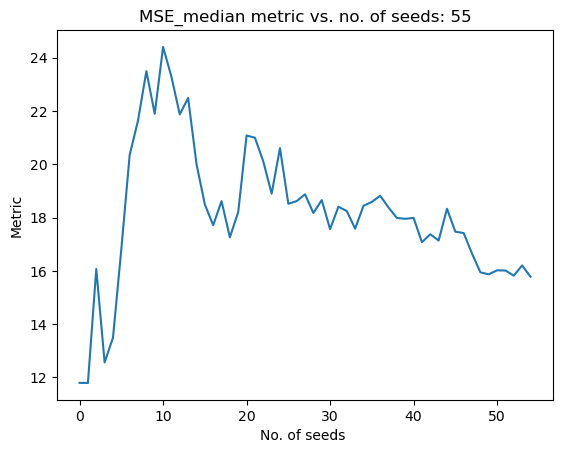

Time required: 2266.51100564003
Best solution found: 
X = [ 0.46045864  7.92237057  8.12582543  0.70072491  8.25312137  8.39115172
  8.53235449  2.07606674  8.23481027  8.06437474  8.28980173  8.04678464
  1.35677624  7.29694611  6.76570984  7.59495394  7.39951559  2.65480601
  8.67746297  1.64381551  8.68902889  8.68246203  8.65069528  7.64954093
  1.83005922  7.85410203  3.88863981  6.9048874   8.9286993   8.8874239
  0.19630932  7.2058983  -1.30103     0.74992315]
F = [11.79489733]
CV = [0.]
R2: 0.947711509927787
R: 0.9735047559862186
-log10(1-R2): 1.2815938990533795
Mean solution thus far: 
 [0.5707037129785627, 8.03232290812534, 8.236976082964237, 0.6667706233902898, 8.048500309359795, 8.205619671607973, 8.3735115132815, 1.465967589369868, 7.554910676713731, 7.50791653402773, 7.218597536674322, 7.469598146050353, 1.6046833105664802, 7.540849360577979, 6.811832245881346, 7.837744286131388, 7.64701147495363, 1.7139406856331827, 7.736738261786209, 1.1017796039631185, 8.14772997397045

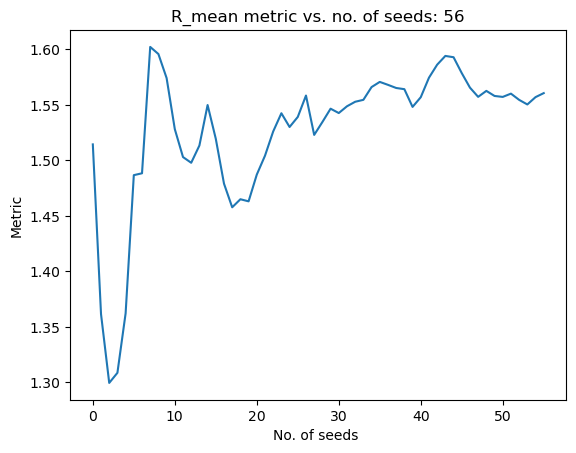

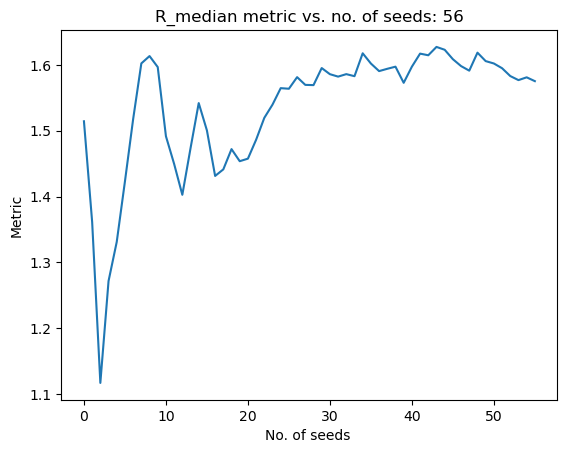

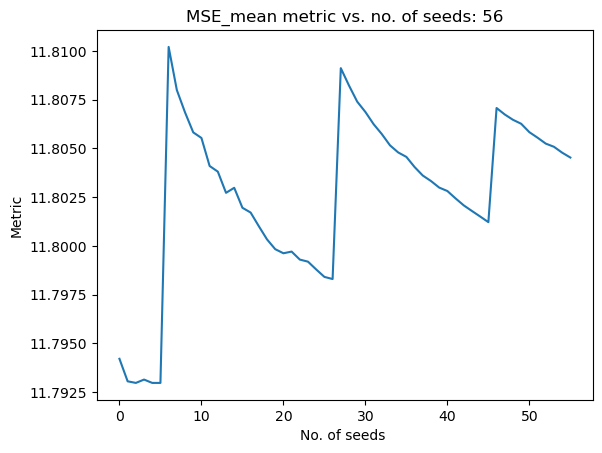

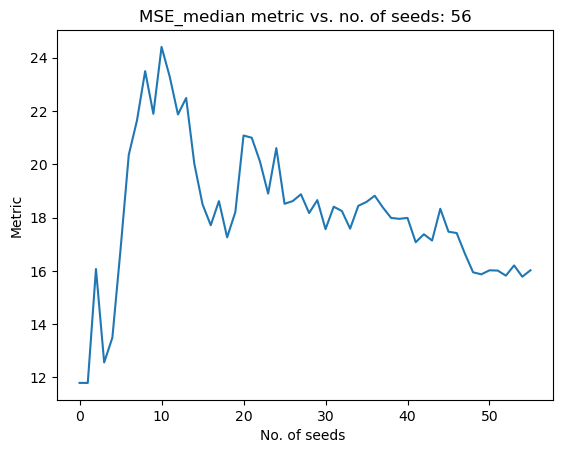

Time required: 2248.3575823307037
Best solution found: 
X = [ 0.58291479  8.04349413  8.25155274  1.59116109  8.4113107   8.54647829
  8.67247718  1.78795569  7.96919177  7.68986886  8.06286971  7.75591174
  0.72987422  6.71288283  6.25874573  6.96673482  6.76377039  1.09653692
  7.11959852  1.21961905  8.26599693  8.25876126  8.22630473  7.22513246
  0.08865281  6.11284082  3.18345735  6.19496587  8.2194804   8.18882316
  1.53723879  8.5467172  -1.30103     0.01353314]
F = [11.79630136]
CV = [0.]
R2: 0.9527233106644118
R: 0.9760754636115037
-log10(1-R2): 1.325352943582536
Mean solution thus far: 
 [0.5709179423916747, 8.032518894503623, 8.237231813832047, 0.6829879999967656, 8.05486540396871, 8.211599647448505, 8.378756524950834, 1.4716165033944475, 7.562178766106262, 7.511108680176408, 7.233409329244091, 7.4746211915508605, 1.5893357827181729, 7.526323631945081, 6.8021289736762585, 7.822463418258543, 7.631516017252377, 1.703109040579632, 7.725911248705853, 1.1038469627097778, 8.14980

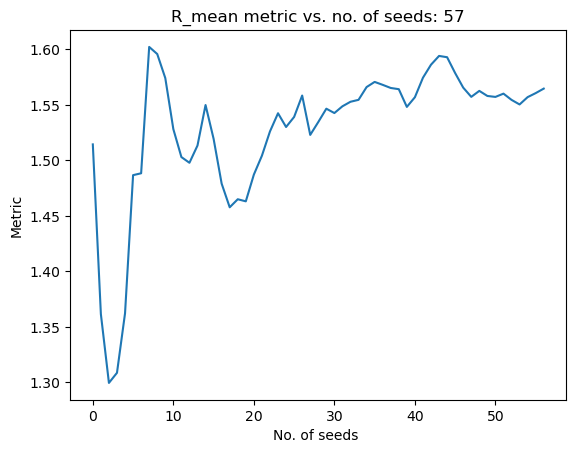

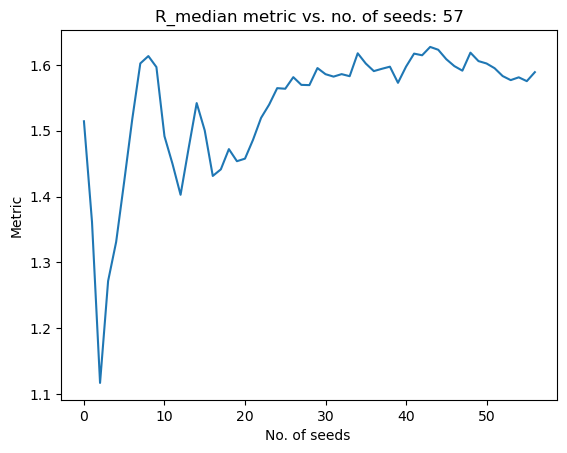

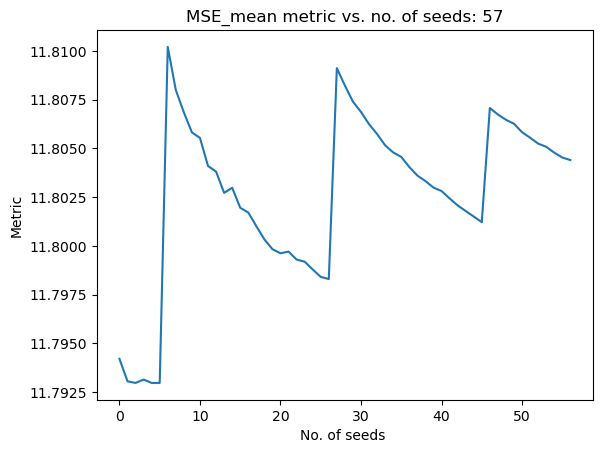

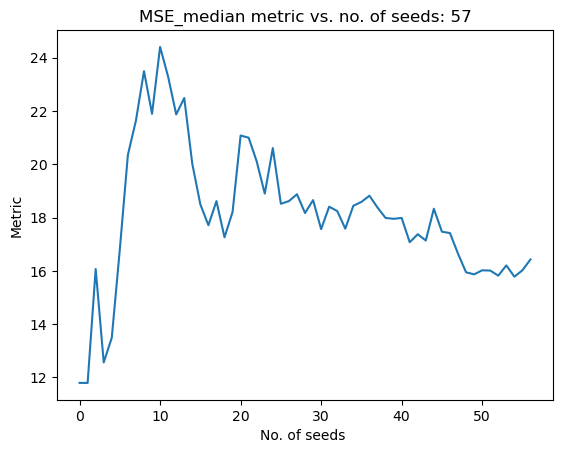

Time required: 2276.196488380432
Best solution found: 
X = [ 0.88126645  8.3429315   8.54729809  0.5113044   7.60906134  7.76214212
  7.94805841  1.76842559  7.79452289  7.89243034  7.54254601  7.78650832
  0.68525088  6.65914942  6.29206528  6.90508366  6.71977247  2.1263721
  8.15001033  1.31620856  8.36286793  8.35614835  8.32317578  7.32216379
  0.35040536  6.37500233  2.52788856  5.54099475  7.56506552  7.53206573
  1.8190678   8.82880773 -1.30103     0.31233442]
F = [11.79441848]
CV = [0.]
R2: 0.9348900713176967
R: 0.966897135851429
-log10(1-R2): 1.1863527803542109
Mean solution thus far: 
 [0.5762687786520605, 8.037870835899808, 8.242577784159776, 0.680027937972996, 8.047179126935788, 8.203850379767282, 8.371330695433732, 1.4767339014226393, 7.566184699255983, 7.517683191601163, 7.238739271979711, 7.479998555897244, 1.5737481119694772, 7.511372352403305, 6.79333477204155, 7.806646525939713, 7.615796300972741, 1.7104066795018391, 7.733223301854048, 1.1075083695734047, 8.153478334

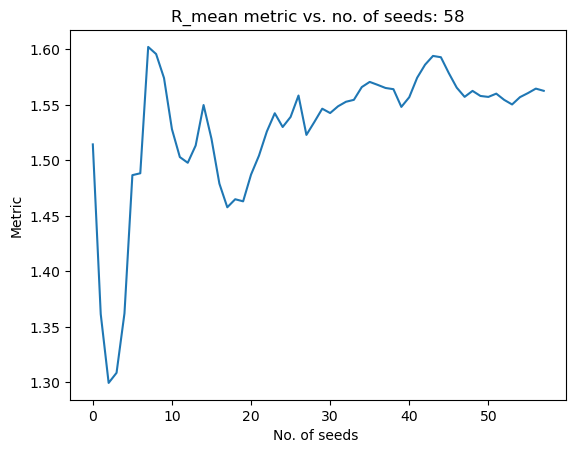

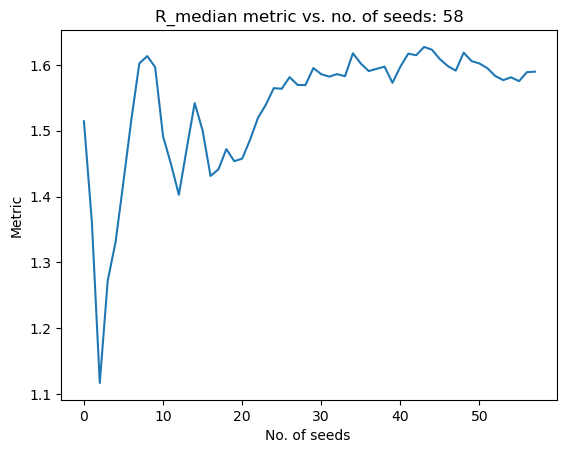

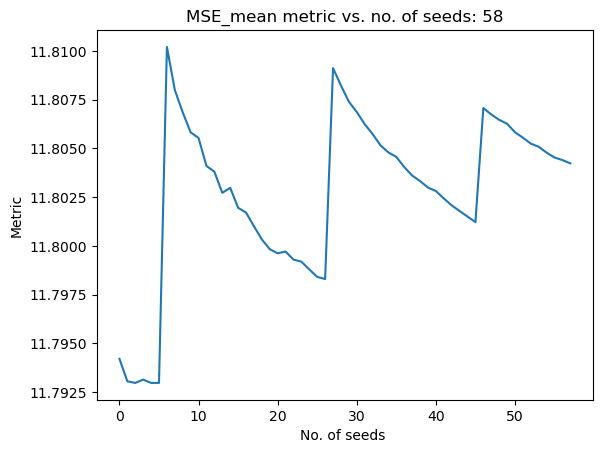

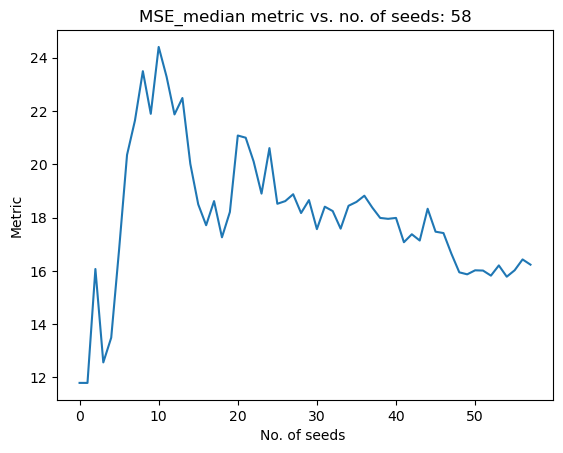

Time required: 2277.337904214859
Best solution found: 
X = [ 1.12163276  8.584637    8.78487512  0.60344358  7.54438109  7.70510638
  7.87605617  1.02202434  7.17746463  7.00157458  7.16343152  7.00204395
  1.73163762  7.62360022  7.02319737  7.96418071  7.78339571  2.52134107
  8.5438285   1.45121509  8.49692442  8.49020304  8.45755816  7.45640189
  0.17884586  6.20251444  0.04532357  3.05765807  5.08211645  5.04867034
  0.76552322  7.77488316 -1.30103     0.15937709]
F = [11.79527934]
CV = [0.]
R2: 0.8371623610049341
R: 0.9149657704006933
-log10(1-R2): 0.7882452031413736
Mean solution thus far: 
 [0.5855122359939227, 8.047138058964023, 8.251769264386215, 0.6787298980248079, 8.038657126380969, 8.195397091641565, 8.362936211886778, 1.4690269596965708, 7.559596223528201, 7.5089355879529265, 7.2374628693880565, 7.471897630372445, 1.5764242052504114, 7.513274519567501, 6.797230748336555, 7.8093165968918825, 7.618636968880129, 1.7241513302714364, 7.746962372960805, 1.1133339071312034, 8.15

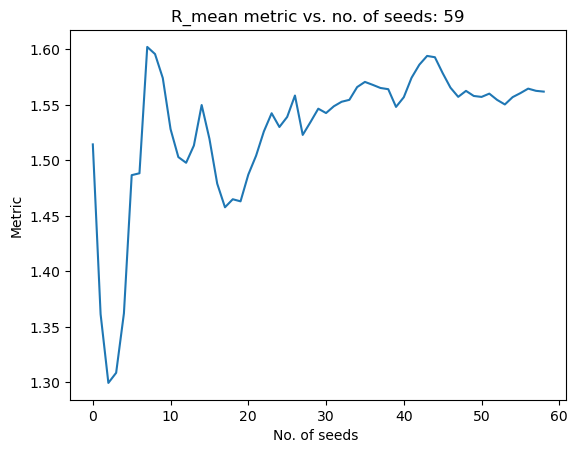

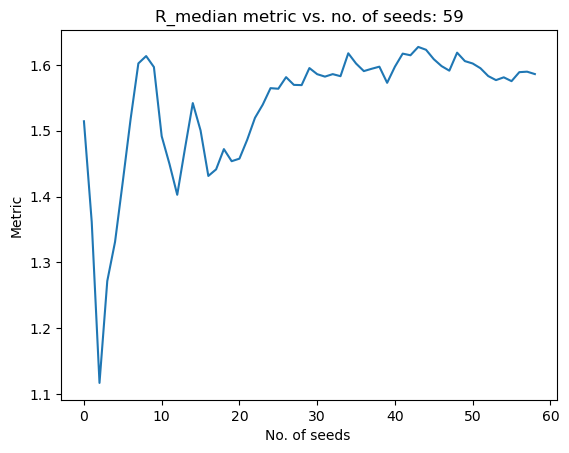

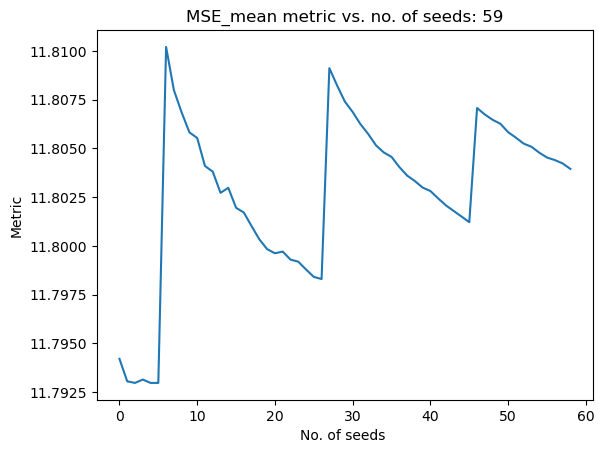

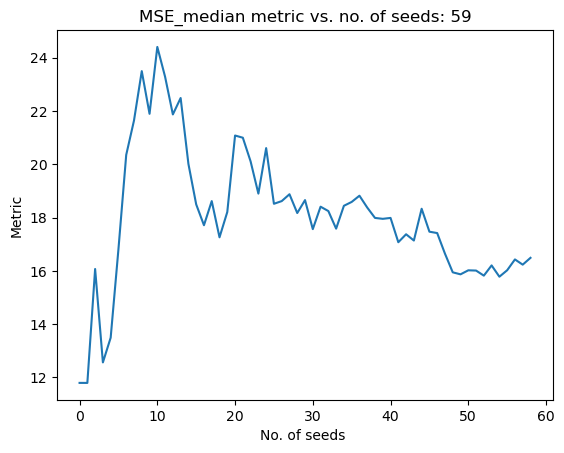

Time required: 2246.248547554016
Best solution found: 
X = [ 3.83622595e-03  7.46422405e+00  7.67286510e+00  1.33064914e+00
  8.34100653e+00  8.47669515e+00  8.58930665e+00  1.08471473e+00
  7.23948238e+00  7.03829782e+00  7.27985196e+00  7.06462751e+00
  1.15122697e+00  7.10282634e+00  6.57975379e+00  7.39018451e+00
  7.19205628e+00  2.31617333e+00  8.33894143e+00  5.04857960e-01
  7.54922297e+00  7.54213529e+00  7.51259719e+00  6.51120885e+00
  2.70687542e+00  8.73094888e+00  1.25187970e+00  4.26953628e+00
  6.29281835e+00  6.24920804e+00  8.17187875e-01  7.82683426e+00
 -1.30103000e+00  2.02723481e-01]
F = [11.79471724]
CV = [0.]
R2: 0.89737609207314
R: 0.9472993677149478
-log10(1-R2): 0.9887514513961279
Mean solution thus far: 
 [0.5758176358265058, 8.037422825547972, 8.242120861697307, 0.6895952187924668, 8.043696283040548, 8.200085392645953, 8.366709052477463, 1.4626217558577468, 7.554260992828417, 7.501091625158062, 7.238169354166323, 7.465109795107892, 1.5693375847252453, 7.506

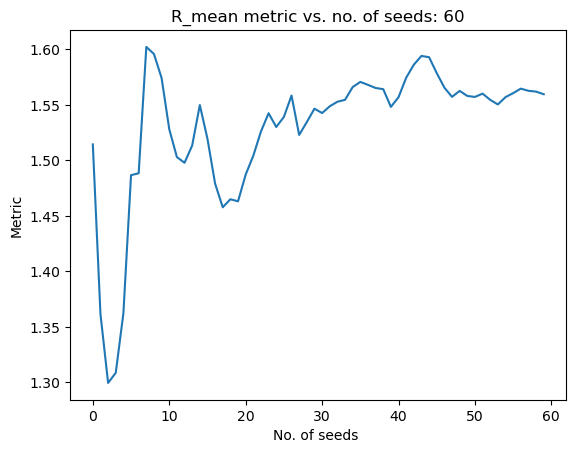

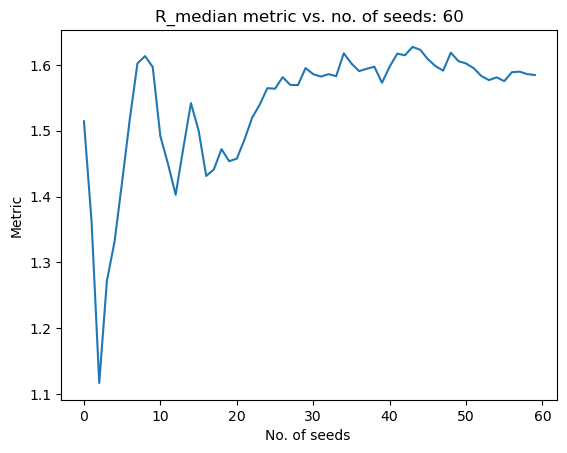

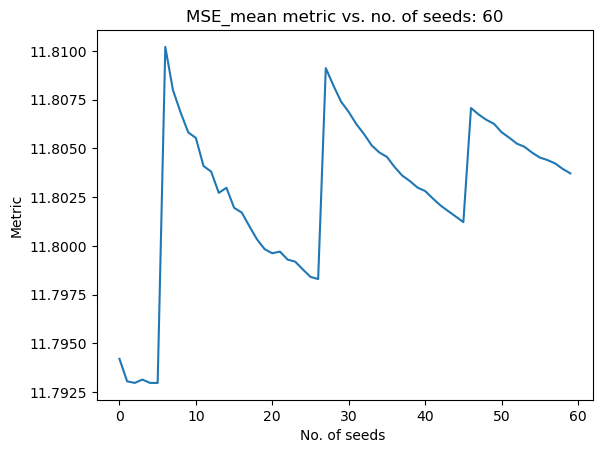

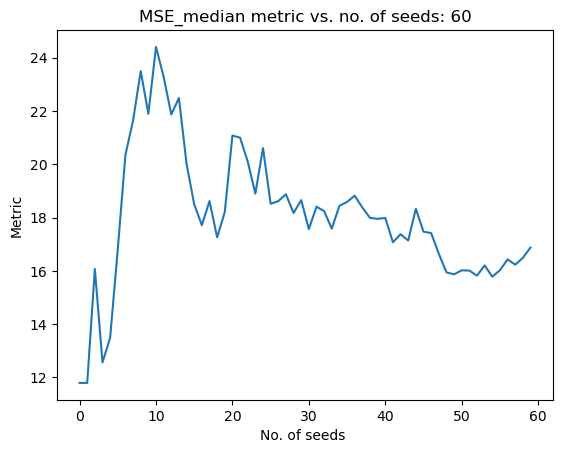

Time required: 2269.04386305809
Best solution found: 
X = [ 1.32016513  8.78222623  8.98539704  0.25786456  7.66334596  7.8468962
  8.03474447  1.79200371  7.97581573  7.69259618  7.97502245  7.76591018
  1.51437694  7.42203912  6.84471203  7.75034535  7.56263233  0.95186626
  6.97404991  1.40181362  8.44737179  8.44039855  8.40841415  7.40674946
  2.26566103  8.28937063  3.77844115  6.79214833  8.81588853  8.78041206
  0.1152122   7.12453708 -1.30103     0.64411553]
F = [11.7966561]
CV = [0.]
R2: 0.933684497059911
R: 0.9662735104823639
-log10(1-R2): 1.178384932314896
Mean solution thus far: 
 [0.5880200537627498, 8.049632717486196, 8.25430571703015, 0.6825176670818904, 8.037461031873809, 8.194295405827672, 8.361267010152769, 1.4680214601058226, 7.561171726184458, 7.504231044111441, 7.250248913156202, 7.470040949008008, 1.5684365906020927, 7.5050501985728655, 6.7944439340875125, 7.801478837201505, 7.6107257340752135, 1.7211961978411514, 7.743996251461764, 1.1080880672595619, 8.15402069

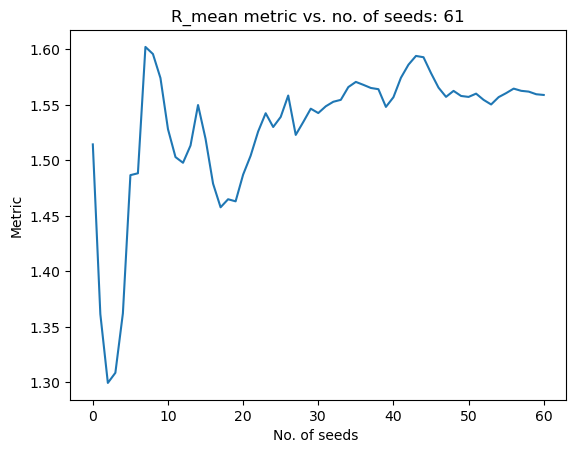

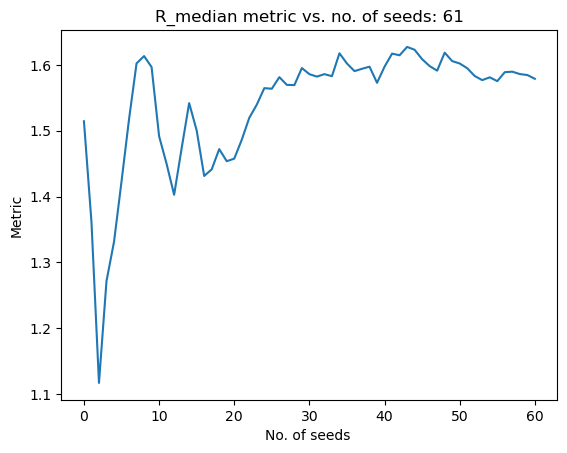

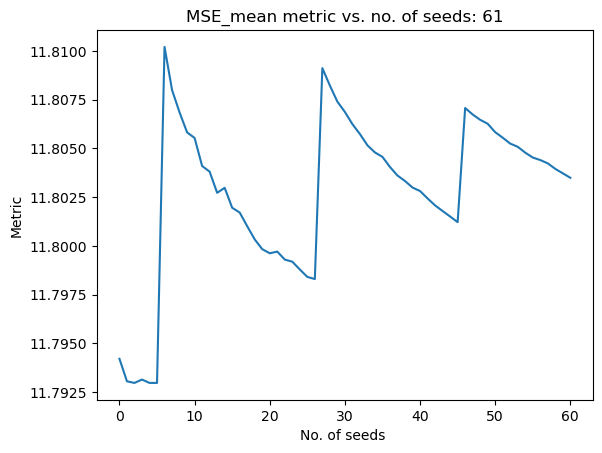

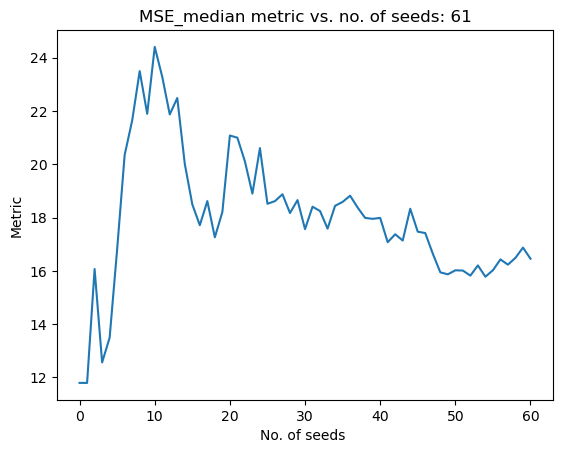

Time required: 2288.4696905612946
Best solution found: 
X = [ 0.67495864  8.13693834  8.34034878  0.25795362  7.45572989  7.63283446
  7.84770905  2.07919986  8.13517738  8.19845702  7.85508026  8.08954205
  1.09932748  7.02084149  6.58538302  7.3210677   7.14451256  0.01220526
  6.03531288  0.92756684  7.97346898  7.96639953  7.93469276  6.93334915
  1.06967249  7.09392978  2.92328575  5.93774336  7.96185589  7.92487188
  1.37246719  8.38210879 -1.30103     0.43493672]
F = [11.79441083]
CV = [0.]
R2: 0.9282485937557767
R: 0.9634565863368089
-log10(1-R2): 1.1441695828431464
Mean solution thus far: 
 [0.5894222889505687, 8.051040872767143, 8.255693508404883, 0.6756698598985572, 8.0280782715452, 8.185239584100193, 8.352983817301615, 1.4778791761563483, 7.570429881874893, 7.515428237313992, 7.2600042574275, 7.4800329021798015, 1.560870314608917, 7.497240380617701, 6.791071983924827, 7.793730270458146, 7.603206166824164, 1.69363182790671, 7.716436842299332, 1.1051764345049957, 8.1511085734

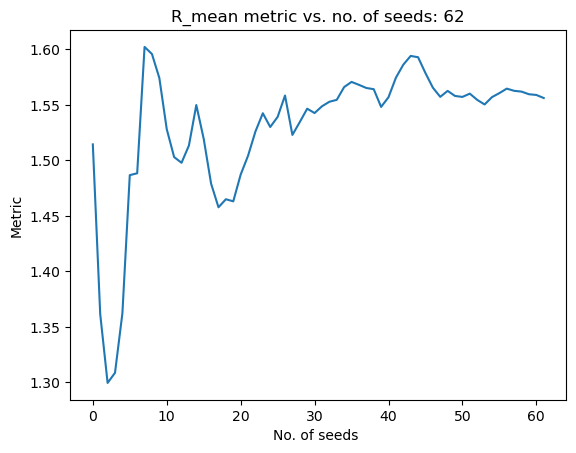

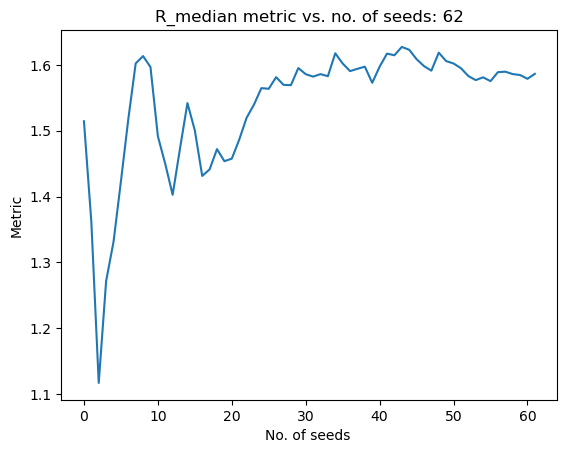

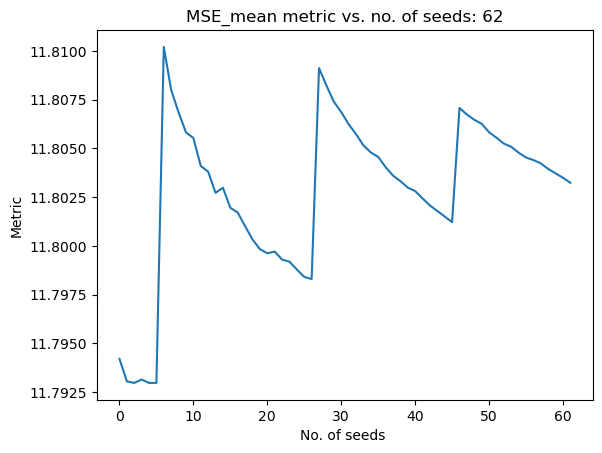

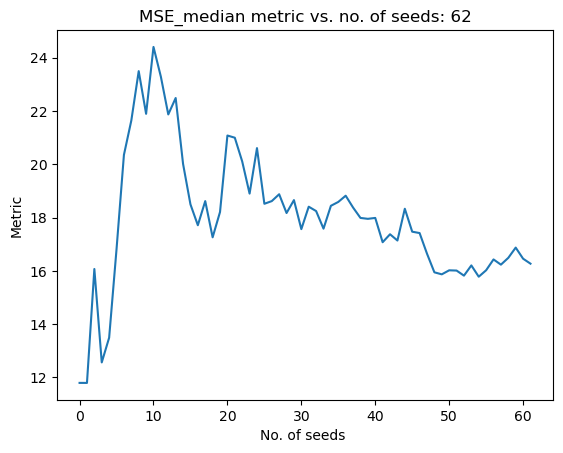

Time required: 2255.344785451889
Best solution found: 
X = [ 0.90708129  8.36815963  8.57445211  0.64053166  7.97330727  8.09701298
  8.22163022  1.73507342  7.77647618  7.80702638  7.59491184  7.75407729
  1.94000016  7.89499825  7.41954854  8.17641158  7.97900636  1.95402945
  7.97681201  1.56442053  8.61115776  8.60398295  8.57062281  7.56951502
  0.09041031  6.11437715  0.15935894  3.1712864   5.19560701  5.16401181
  0.78030514  7.78972686 -1.30103     0.5171034 ]
F = [11.79365484]
CV = [0.]
R2: 0.8684462520104084
R: 0.9319046367576505
-log10(1-R2): 0.8808967742752718
Mean solution thus far: 
 [0.5944644953891665, 8.056074503877197, 8.26075316870758, 0.6751121106979955, 8.027208890573934, 8.183839161781597, 8.350898839621292, 1.481961624528004, 7.573700458073134, 7.520056779260478, 7.265320250723867, 7.484382813096775, 1.566888248691359, 7.503553997616039, 6.801047802273039, 7.799804576958324, 7.609171249245645, 1.6977651235567455, 7.72056978150747, 1.1124660232907726, 8.158410941

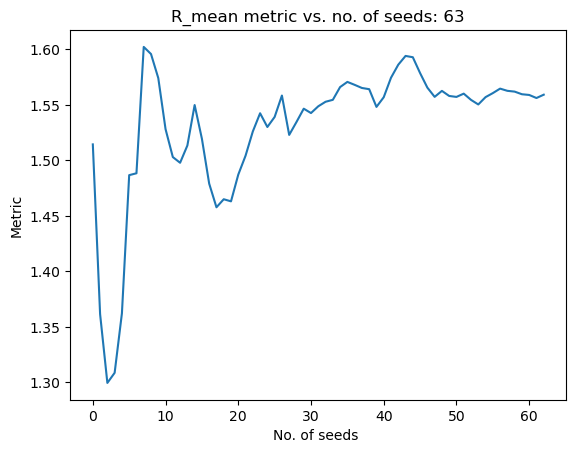

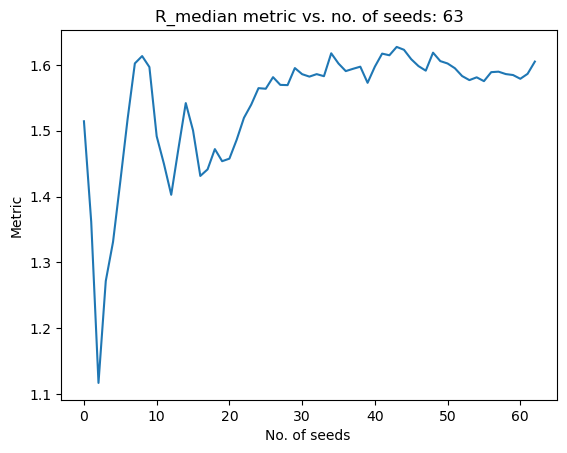

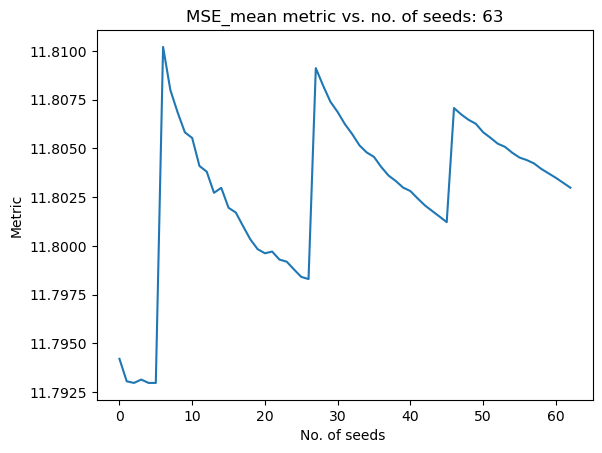

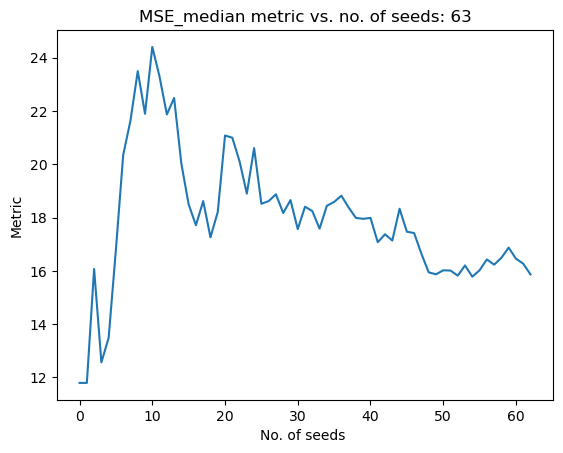

Time required: 2250.8227338790894
Best solution found: 
X = [ 0.51098158  7.97310101  8.17621157  1.58470096  8.67984832  8.81417385
  8.94232772  1.59532775  7.72646931  7.52118512  7.75608224  7.58954033
  1.60931616  7.60705428  7.17123588  7.84573216  7.64006042  0.40990321
  6.43312173  1.51885603  8.56584803  8.55903296  8.52515667  7.52425057
  0.64305645  6.66734171  2.35169699  5.36457964  7.38961941  7.35483314
  0.29527949  7.30481384 -1.30103     0.28823531]
F = [11.79428291]
CV = [0.]
R2: 0.9609412687826409
R: 0.9802761186434366
-log10(1-R2): 1.4082818684278189
Mean solution thus far: 
 [0.5931600748581459, 8.054778043113325, 8.259432206273207, 0.6893244365234544, 8.037406381696991, 8.193688141254853, 8.360139915932686, 1.4837329702708775, 7.576087471319615, 7.52007440962574, 7.2729884067394766, 7.486025899290026, 1.56755118481193, 7.505171189488278, 6.806831991040654, 7.800522195386514, 7.609653892481394, 1.6776422811889913, 7.7004534057643514, 1.1188158671851947, 8.16477

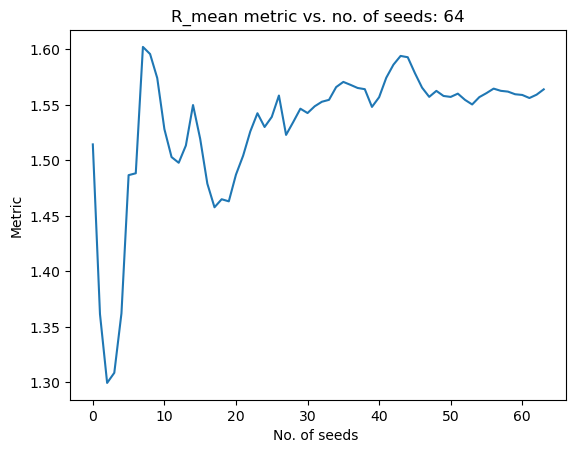

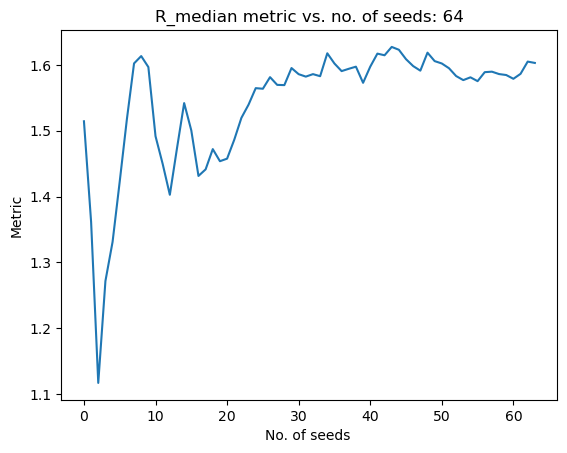

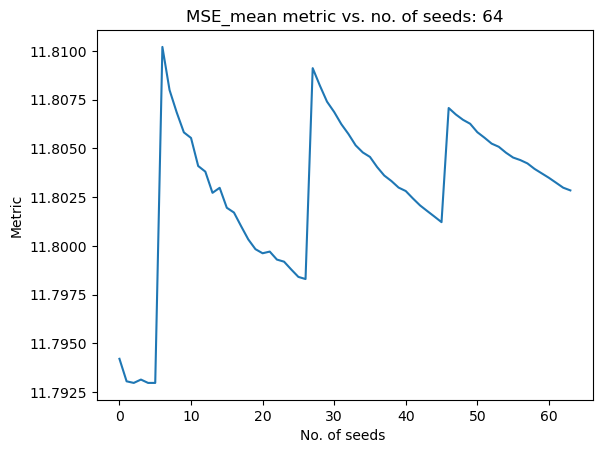

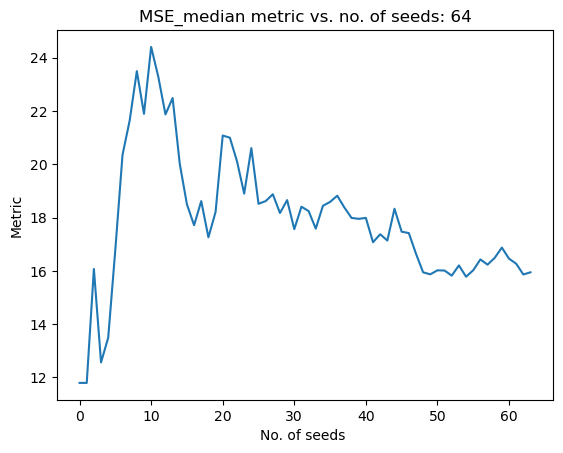

Time required: 2251.516830921173
Best solution found: 
X = [ 1.21025117  8.67163772  8.87697455  1.26134916  8.36390295  8.48981197
  8.59807567  2.16936582  8.29711292  8.13886307  8.31990729  8.1601537
  1.63508615  7.6063064   7.11098712  7.87742112  7.67124561  1.96750489
  7.99018982  1.73391614  8.77901333  8.77218303  8.74110985  7.73959811
  0.17758609  6.20157556  3.28801345  6.30265472  8.32669308  8.28893166
  1.12592012  8.13545612 -1.30103     0.28715671]
F = [11.79383064]
CV = [0.]
R2: 0.9752947468431943
R: 0.9875701224941924
-log10(1-R2): 1.607210691499702
Mean solution thus far: 
 [0.6026537839534598, 8.06426819200361, 8.268932857724918, 0.6981248169156644, 8.042429405807127, 8.19824389242368, 8.363800466029385, 1.4942811678844867, 7.587180170502276, 7.529594235211436, 7.289094851109092, 7.496397096282889, 1.5685901842795587, 7.506727115781064, 6.811511300739871, 7.80170525583475, 7.61060145742101, 1.682101705937172, 7.7049108890378815, 1.1282789482715994, 8.17422693344

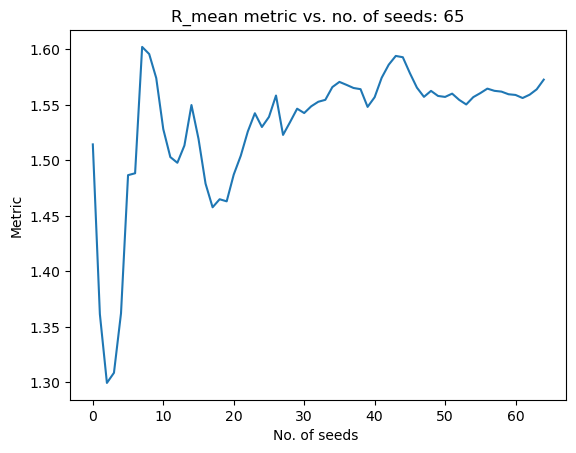

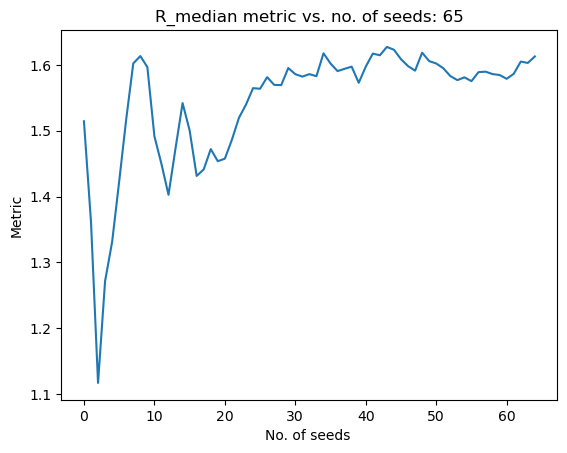

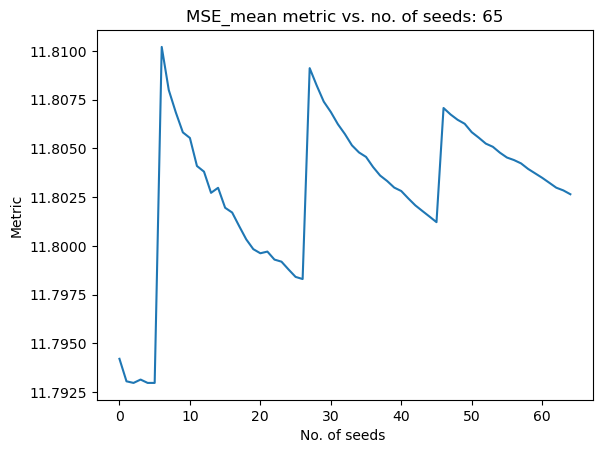

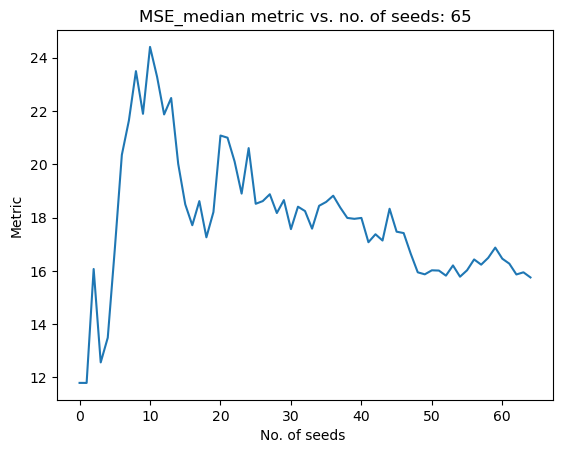

Time required: 2256.4252099990845
Best solution found: 
X = [ 1.33435748  8.7962358   8.99999999  0.1887601   8.28774324  8.43308637
  8.62570666  0.41686706  6.49260848  6.52387323  6.37985998  6.41607461
  2.54376141  8.50793746  8.15490238  8.7630161   8.57920473  2.68622945
  8.70957517  0.93150299  7.97650166  7.97027256  7.9391923   6.93779062
  2.52008331  8.54445971  0.5301301   3.54542424  5.56938355  5.5307978
  1.79686713  8.80656402 -1.30103     1.30850672]
F = [11.79373773]
CV = [0.]
R2: 0.835596425124043
R: 0.9141096351773363
-log10(1-R2): 0.7840887431705317
Mean solution thus far: 
 [0.6137402036028501, 8.075358610361818, 8.280009632492774, 0.690407169735703, 8.04614628208302, 8.201802111805655, 8.367768741706271, 1.4779567116571914, 7.5705957509124735, 7.514356038131919, 7.275318565214538, 7.480028573758343, 1.5833655058667102, 7.521896969483414, 6.831865710976285, 7.8162705716426295, 7.625277264625249, 1.6973157626828579, 7.720133075076382, 1.1252974943531244, 8.171231

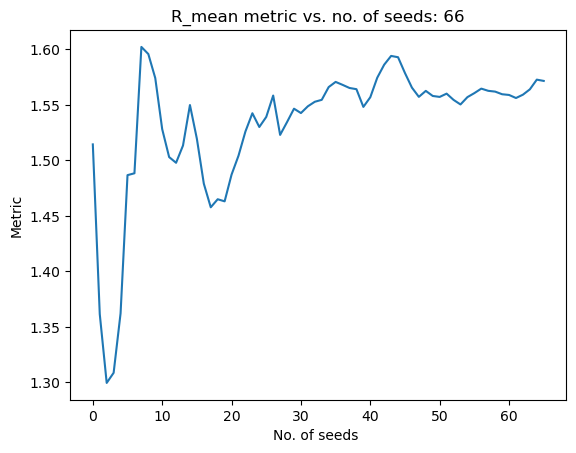

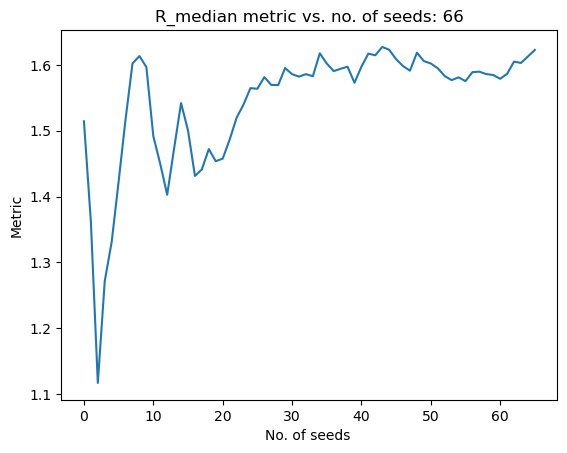

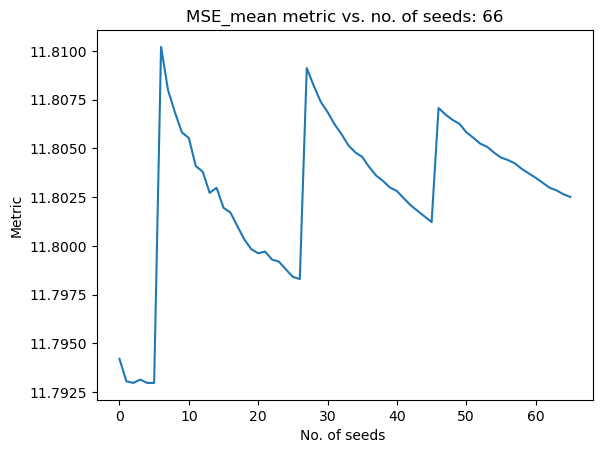

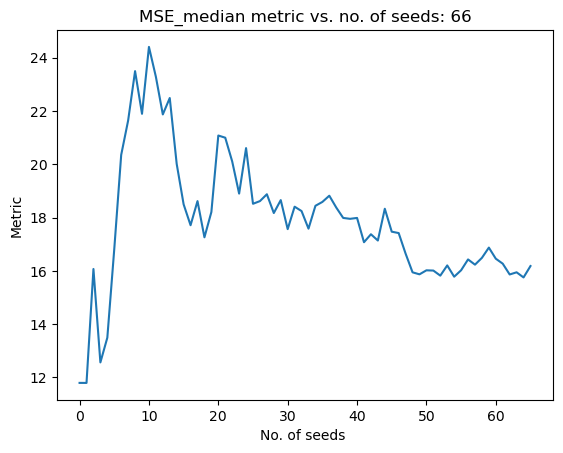

Time required: 2252.387795448303
Best solution found: 
X = [ 0.43176598  7.895642    8.09318864  1.32394733  8.26574952  8.44091178
  8.64944204  0.9306612   6.99565878  7.02768559  6.78718556  6.93874425
  2.36399489  8.31371891  7.90227408  8.59050183  8.40306724  0.43551038
  6.45860455  1.04348434  8.09014527  8.08290482  8.05001856  7.04911844
  1.28129517  7.30548276  3.42229913  6.43769357  8.46138765  8.42296714
  0.19539577  7.20517057 -1.30103     0.17706506]
F = [11.79379252]
CV = [0.]
R2: 0.948924759473524
R: 0.974127691564881
-log10(1-R2): 1.2917895794860121
Mean solution thus far: 
 [0.611024170438961, 8.07267627289456, 8.277221259530762, 0.6998629929840565, 8.049423942417022, 8.205370912891466, 8.371972820723212, 1.469788121903838, 7.562014602045916, 7.5070923001334116, 7.2680329980298675, 7.471949703293503, 1.595016690724289, 7.533715207429857, 6.847841955331294, 7.827826262071078, 7.636886070207657, 1.6784828465034725, 7.701304291181692, 1.1240764025569554, 8.170020859

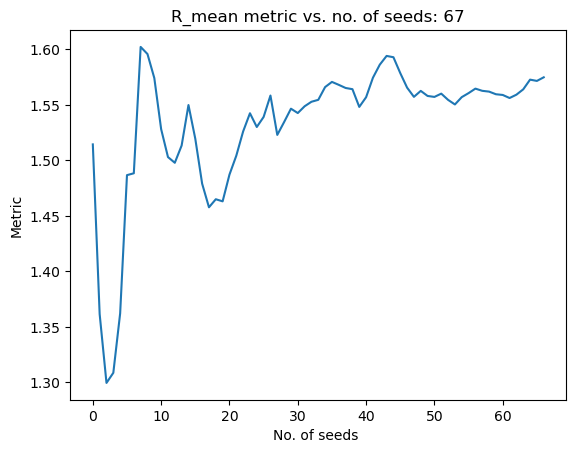

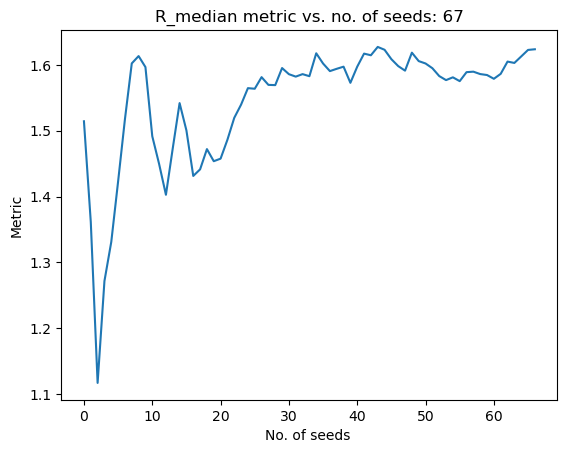

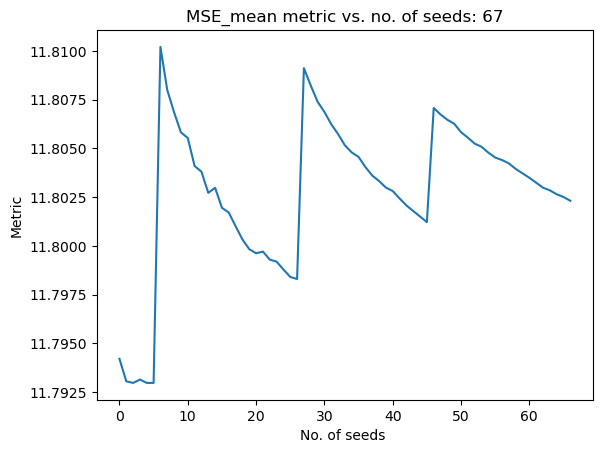

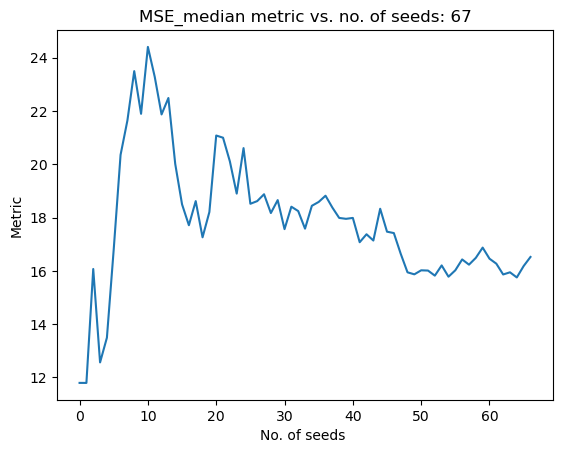

Time required: 2275.676924943924
Best solution found: 
X = [ 0.7193293   8.1801306   8.38721313  0.68093638  7.91618844  8.08611294
  8.29997385  0.69634051  6.72556095  6.82840434  6.38788682  6.71389532
  2.36356271  8.31551612  7.91530281  8.58887409  8.40216621  1.08064382
  7.10387125  0.98568257  8.03282265  8.02536452  7.99218421  6.99072741
  2.3046791   8.3289219   3.68268057  6.69326389  8.71749003  8.68971801
  1.70736514  8.71687974 -1.30103     0.46673337]
F = [11.79472833]
CV = [0.]
R2: 0.927782769234513
R: 0.9632148094970887
-log10(1-R2): 1.1413591690014988
Mean solution thus far: 
 [0.6126168929152439, 8.074256483606455, 8.278838787066089, 0.6995846604534046, 8.047464596774164, 8.20361711918231, 8.370914012290976, 1.4584138922663636, 7.54971381298684, 7.497111594824734, 7.255089671869452, 7.460801844653951, 1.606318838025118, 7.545212279645289, 6.863539909117016, 7.839018141898502, 7.648140189871545, 1.6696910961672855, 7.692518511112276, 1.1220411991163144, 8.168003239

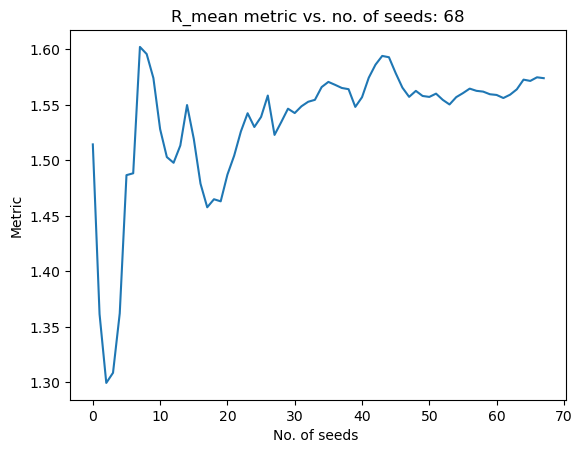

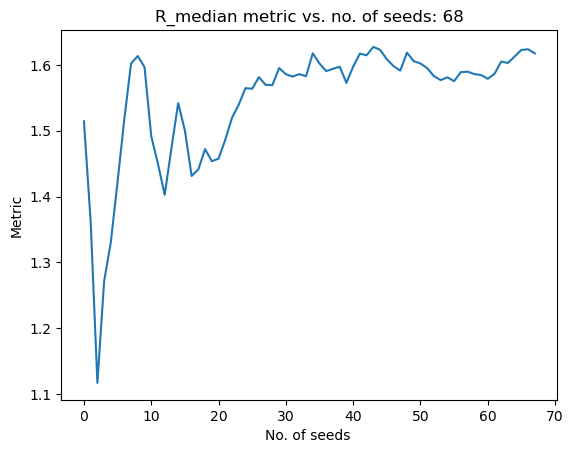

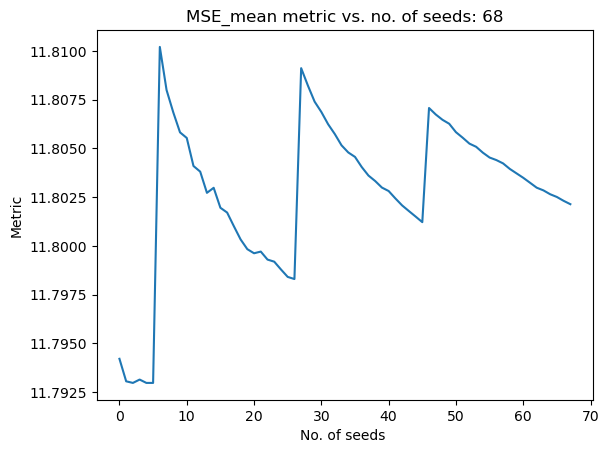

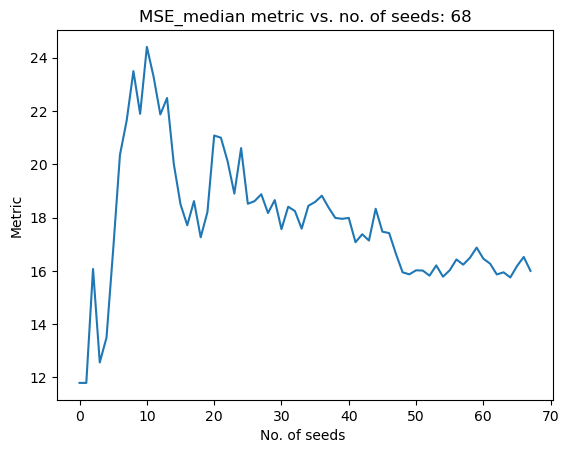

Time required: 2251.8138015270233
Best solution found: 
X = [ 0.18681505  7.64850913  7.85287527  0.3187565   8.39969908  8.57352639
  8.76892916  2.5106179   8.58026218  8.57437781  8.35656012  8.52262368
  0.65278589  6.6084885   6.21612605  6.87616026  6.69061616  1.851029
  7.87421047  1.79912619  8.84445147  8.83807854  8.80663057  7.80500276
  0.25561017  6.27992092  3.83993607  6.85402645  8.87817078  8.84216764
  0.46771584  7.47730854 -1.30103     1.31302992]
F = [11.79360478]
CV = [0.]
R2: 0.9163440077961724
R: 0.9572585898262665
-log10(1-R2): 1.077502945462478
Mean solution thus far: 
 [0.6064458516534067, 8.068086232175514, 8.272665402797351, 0.6940654117846051, 8.052569444293685, 8.208978123173715, 8.376682347748499, 1.4736632256736582, 7.5646492966329015, 7.5127241486683545, 7.27105301169964, 7.4761905668788415, 1.59249951990122, 7.531636572639457, 6.854157099587876, 7.825063679774789, 7.6342630299847825, 1.6723191817051746, 7.695151727900185, 1.1318540250397375, 8.177806

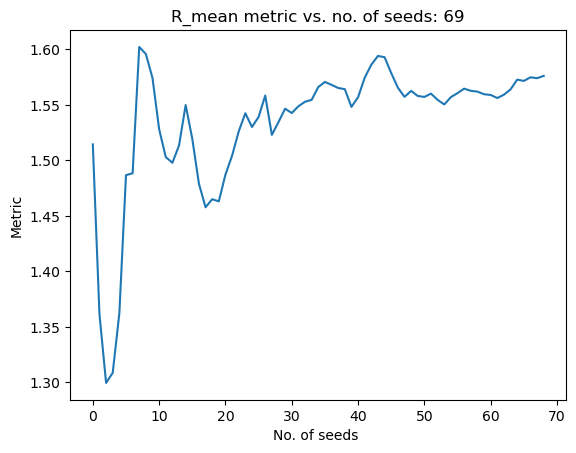

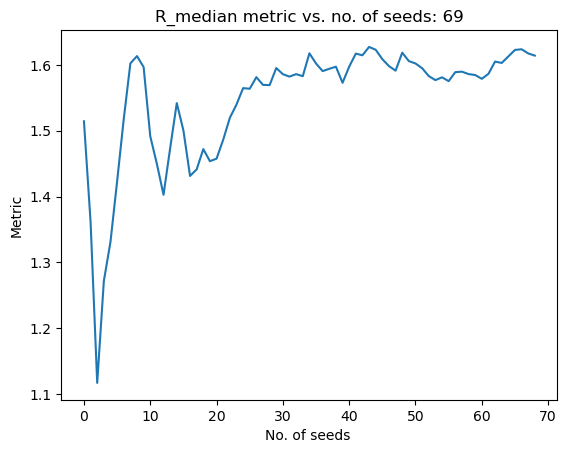

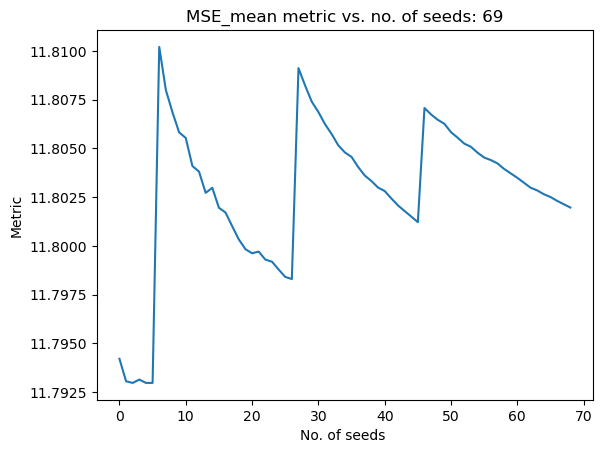

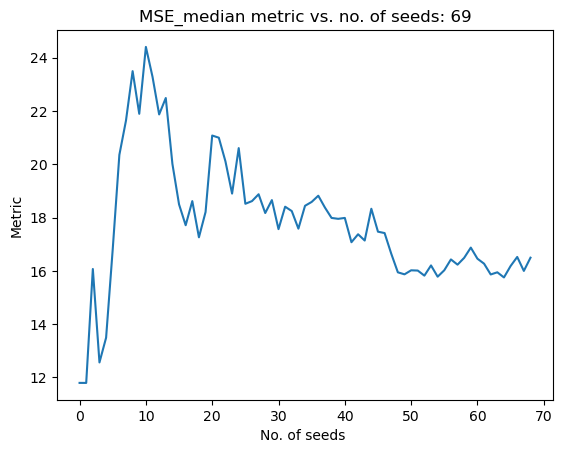

Time required: 2253.3972067832947
Best solution found: 
X = [ 0.32219036  7.78311194  7.98964613  1.23358186  8.28291378  8.42973509
  8.561254    0.58074188  6.72581169  6.54028765  6.73520272  6.56667037
  1.10642753  7.07468263  6.59248273  7.34393617  7.14370647  1.86589351
  7.88886627  0.87800618  7.92336595  7.91627839  7.88530812  6.88378327
  2.16013212  8.18426903  0.78160614  3.7968159   5.82100631  5.78195419
  0.27066985  7.28025377 -1.30103     0.25235506]
F = [11.79388619]
CV = [0.]
R2: 0.8692913843705385
R: 0.9323579700793782
-log10(1-R2): 0.8836957850513364
Mean solution thus far: 
 [0.6023850589026533, 8.064015170884757, 8.268622270389434, 0.7017727896278527, 8.05586007765639, 8.212131794058894, 8.379319085622322, 1.460907206465076, 7.552665902319179, 7.498832198665697, 7.26339800747364, 7.463197421263832, 1.5855556342825987, 7.5251086592016305, 6.850418894311239, 7.818190429628134, 7.627255079151794, 1.6750845292958236, 7.69791907849697, 1.1282276272572591, 8.1741719

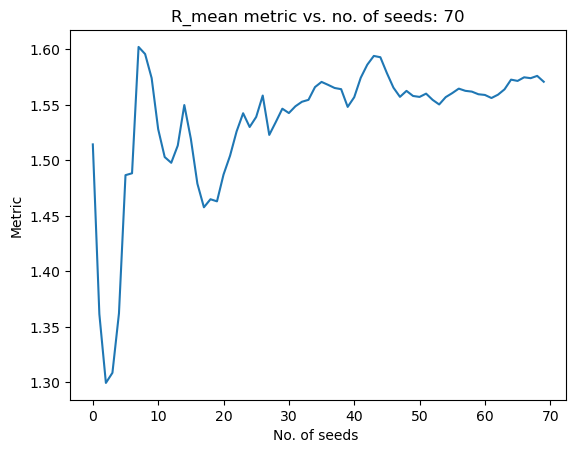

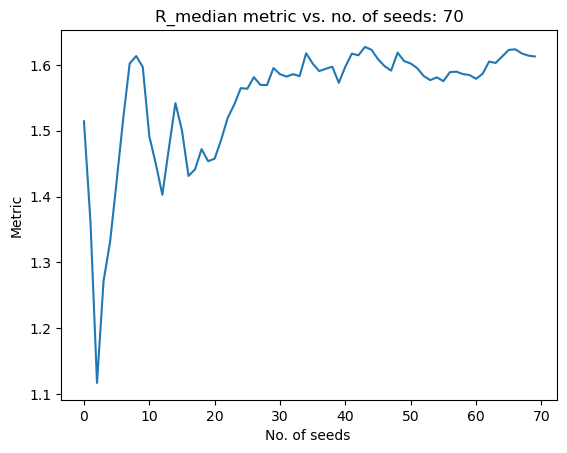

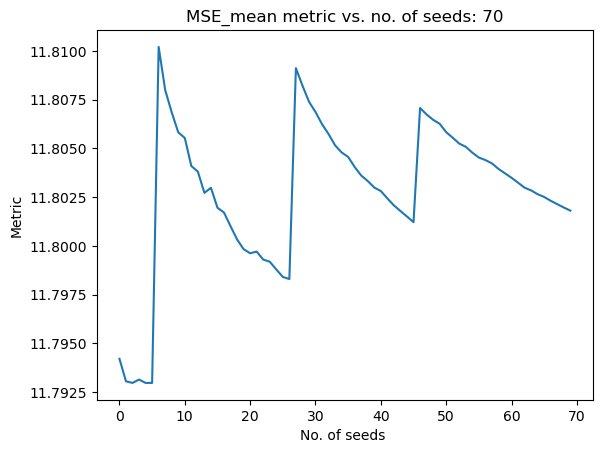

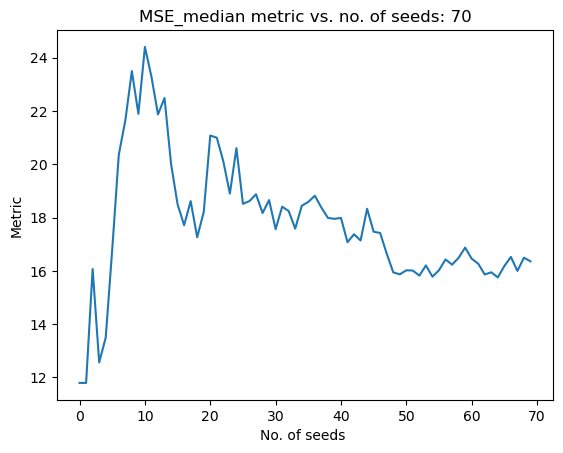

Time required: 2247.5386505126953
Best solution found: 
X = [ 0.45510525  7.91698951  8.12086955  1.36523098  8.40584774  8.53340372
  8.67067666  0.43497362  6.47856158  6.49391519  6.31870212  6.45399927
  0.39670367  6.39950079  6.02722624  6.62709351  6.42439444  1.31009888
  7.33347759  0.68694737  7.73347184  7.72633629  7.69392078  6.69283753
  2.15738596  8.18184783  2.44377245  5.45804513  7.48178046  7.44639113
  1.09419948  8.10386595 -1.30103     0.22977042]
F = [11.79406101]
CV = [0.]
R2: 0.8939241038757142
R: 0.945475596657954
-log10(1-R2): 0.9743832906460645
Mean solution thus far: 
 [0.6003106953486038, 8.061944386903384, 8.266541246192098, 0.7111172711341196, 8.060789481282105, 8.216656750776135, 8.383422713374374, 1.4464574376672132, 7.537537672473084, 7.484678437943851, 7.250092431651213, 7.448983362774807, 1.5688112403998922, 7.509255027292537, 6.838824631576312, 7.801414416708561, 7.6103133799559135, 1.6699438863485374, 7.692786099814349, 1.1220124123312327, 8.1679

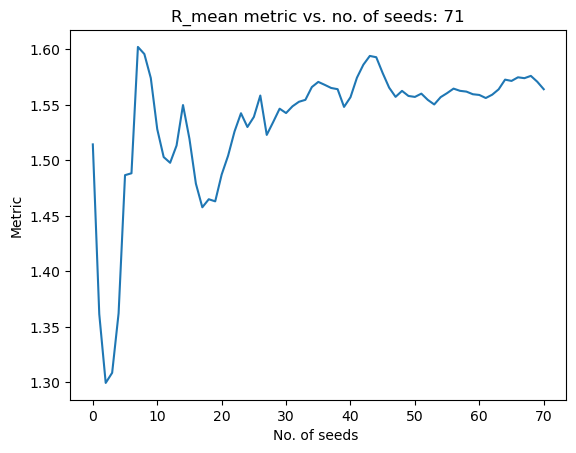

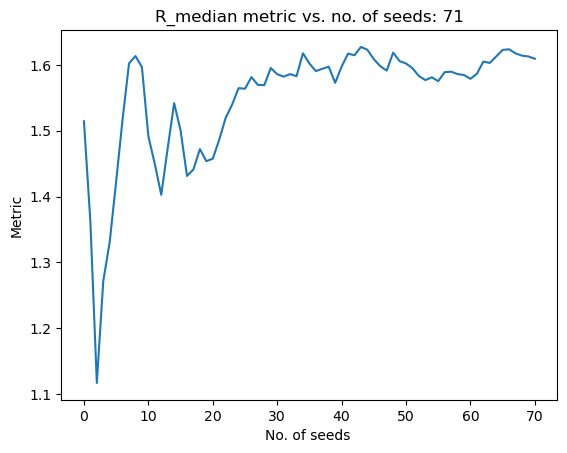

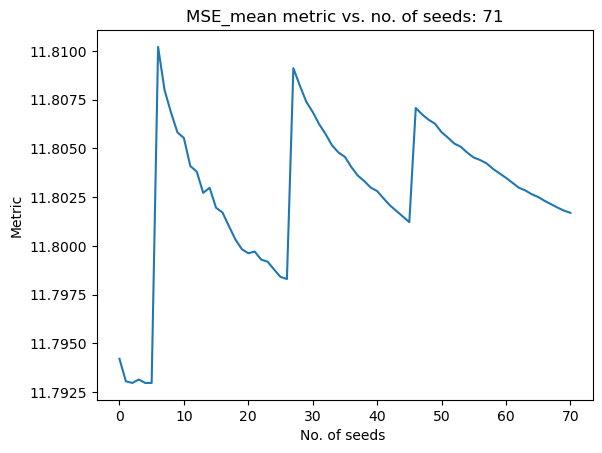

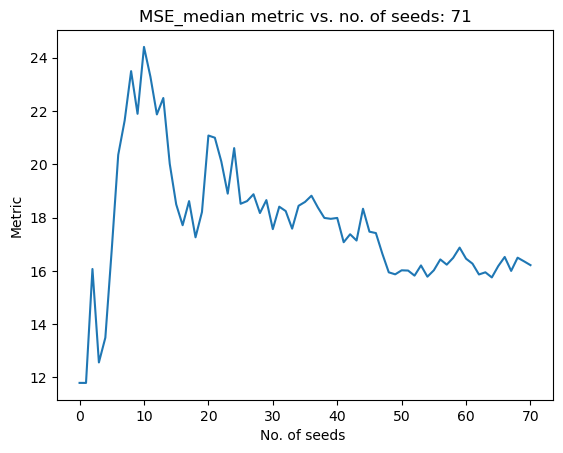

Time required: 2254.55992269516
Best solution found: 
X = [ 0.37637121  7.83827667  8.04206981  0.30359356  8.65436394  8.80543305
  8.95794579  2.62311838  8.67448793  8.6732625   8.49229474  8.64203294
  2.12546523  8.11295052  7.69866165  8.35969414  8.1572196   1.86275856
  7.8858766   1.10037773  8.14724232  8.13991519  8.10691129  7.1056569
  2.48926796  8.51348553  3.51122217  6.52401517  8.54842659  8.5147763
  0.36169076  7.37119854 -1.30103     1.55954117]
F = [11.79339688]
CV = [0.]
R2: 0.9516706821444144
R: 0.9755360998673572
-log10(1-R2): 1.3157893346696392
Mean solution thus far: 
 [0.5972004247660964, 8.058837890817054, 8.263423587407596, 0.7054572195548219, 8.069033570960748, 8.224834199324565, 8.391402200554273, 1.4627999507904663, 7.553328648223523, 7.501186549906953, 7.26734524151837, 7.465553495846058, 1.5765425457940818, 7.517639686866411, 6.850766812352934, 7.809168301728407, 7.617909299684858, 1.6726218679365028, 7.695467912256611, 1.1217119305655359, 8.167677108

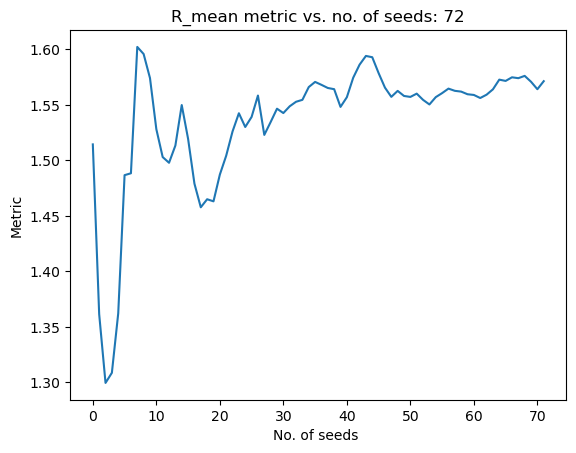

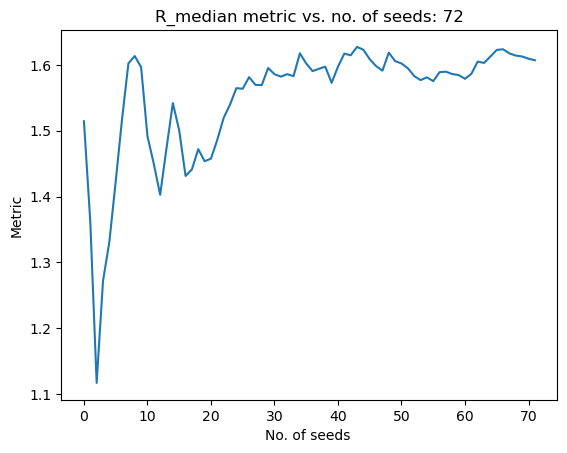

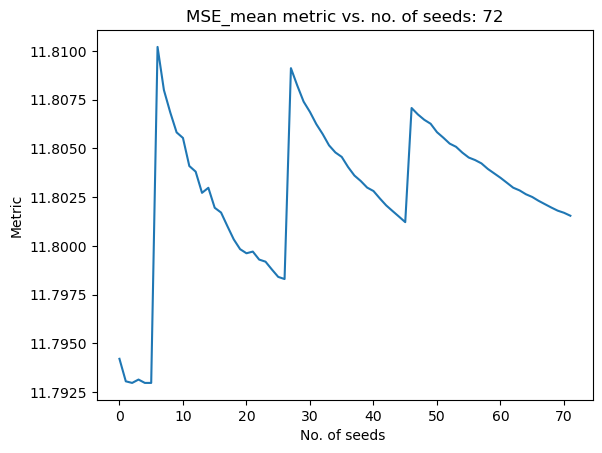

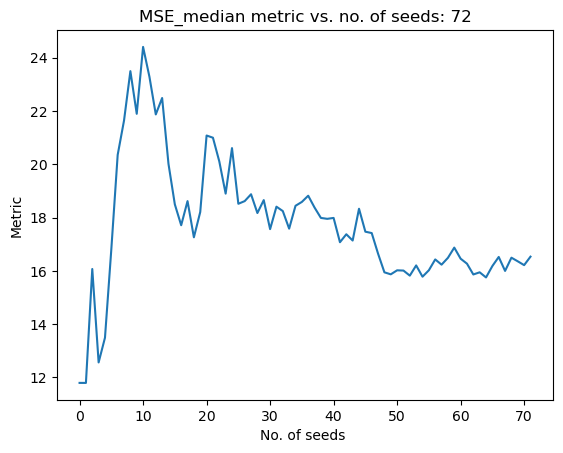

Time required: 2251.0730063915253
Best solution found: 
X = [ 0.88355951  8.34575212  8.54853059  0.74801948  8.5503883   8.70639617
  8.89210889  2.59421073  8.71041786  8.63634601  8.69821718  8.58242596
  1.70585245  7.68502363  7.27941441  7.93616681  7.73916631  2.18692666
  8.21020955  1.1890319   8.23571712  8.22870054  8.19562933  7.19467934
  0.81517539  6.83951325  3.96393737  6.97695722  9.          8.96853557
  1.36866869  8.37829919 -1.30103     1.01914833]
F = [11.79348349]
CV = [0.]
R2: 0.9674137991162987
R: 0.9835719592974876
-log10(1-R2): 1.4869662695262977
Mean solution thus far: 
 [0.6011231519516067, 8.062768222717636, 8.26732916283055, 0.7060402641661582, 8.075627471294013, 8.231430938682244, 8.398261196338991, 1.47829872861683, 7.569179185407124, 7.516736679497864, 7.2869462270436145, 7.480853118642209, 1.5783139143279257, 7.519932617623334, 6.856638697200996, 7.810908007256944, 7.619570354553544, 1.6796671390423488, 7.702519167502995, 1.1226341219227243, 8.168609

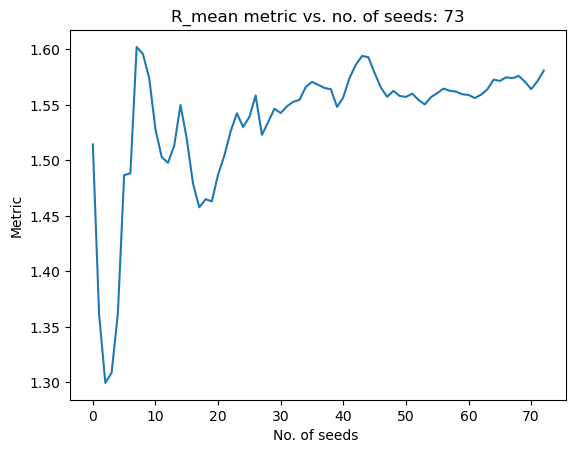

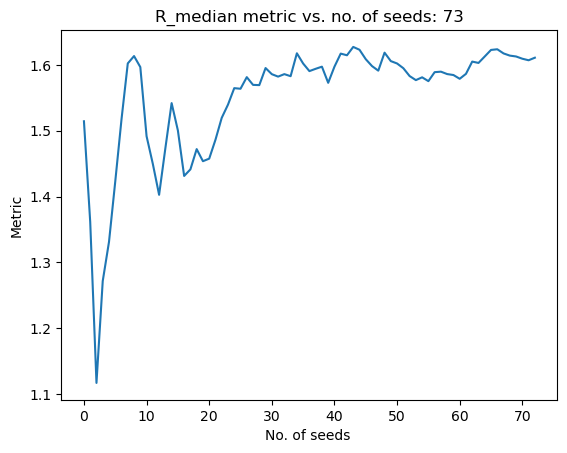

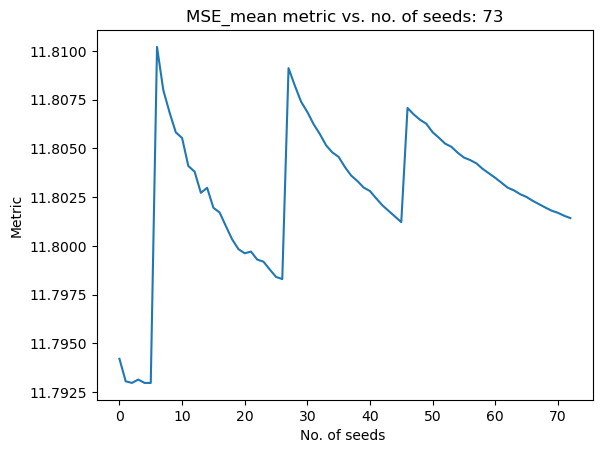

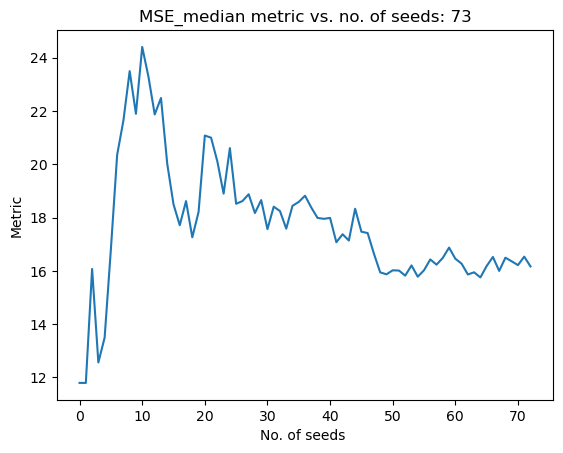

Time required: 2255.236883163452
Best solution found: 
X = [ 0.74729924  8.20921896  8.41268357  0.50448471  7.84474737  7.97246611
  8.07432174  1.78376618  7.95665512  7.6955338   8.02962346  7.75664645
  1.12398742  7.09393198  6.58722202  7.36463118  7.16128039  2.59792939
  8.62083542  1.40498767  8.45102264  8.44424368  8.4116712   7.41054768
  0.43521412  6.45935271  3.55009173  6.56535697  8.58947443  8.55037173
  0.28307682  7.29258007 -1.30103     0.52526783]
F = [11.79590639]
CV = [0.]
R2: 0.9506658514667523
R: 0.9750209492450674
-log10(1-R2): 1.3068523629618798
Mean solution thus far: 
 [0.603098504489838, 8.064747286773661, 8.269293411597454, 0.7033165404487598, 8.072507469885506, 8.227931414033913, 8.393883636053939, 1.4824266672050643, 7.574415346674323, 7.519152856779413, 7.296982405876844, 7.484580055587811, 1.5721743671493946, 7.5141758522030955, 6.852997931351965, 7.804877239284009, 7.613377246862483, 1.6920760884334165, 7.7149288465987045, 1.12644971045352, 8.172425

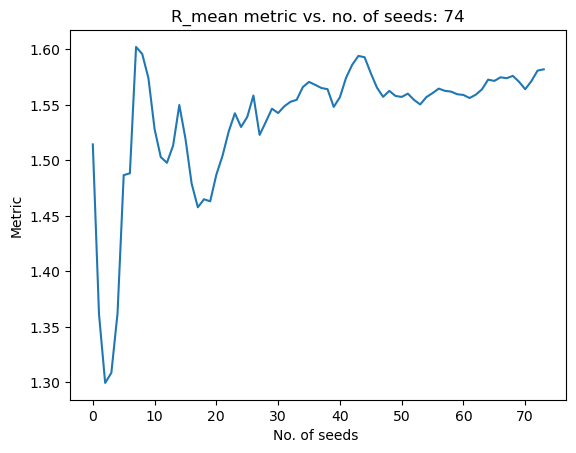

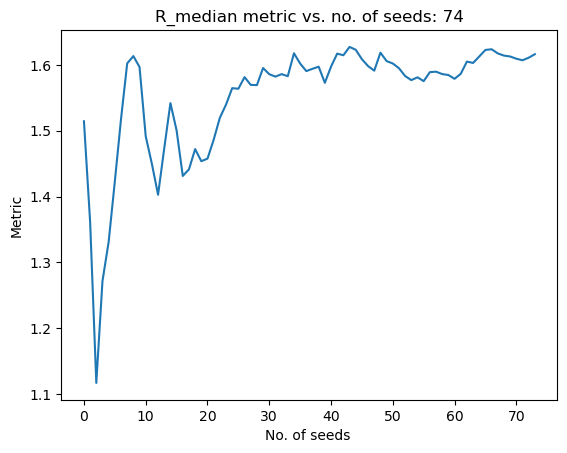

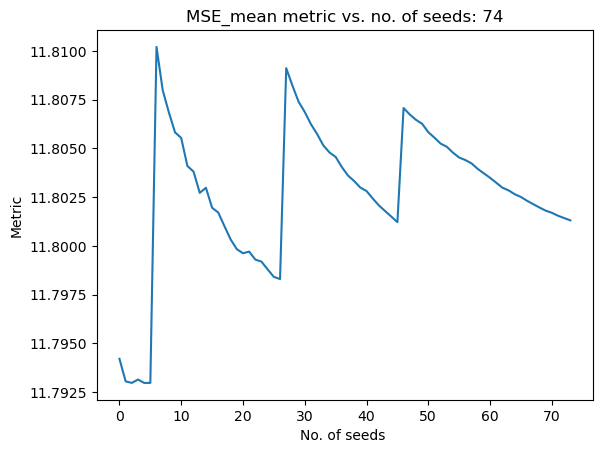

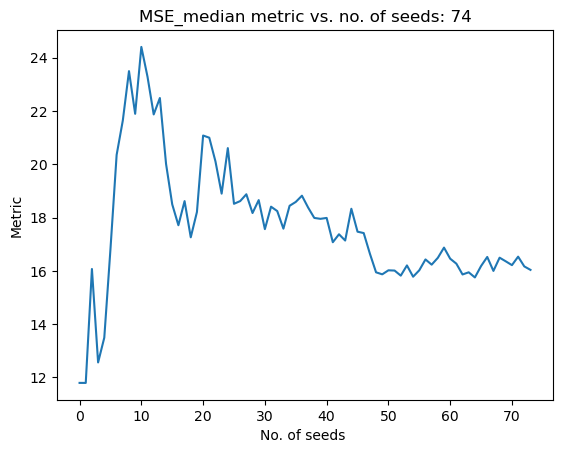

Time required: 2245.5923347473145
Best solution found: 
X = [ 0.70928018  8.1703575   8.37675938  0.60650092  8.19107369  8.28556988
  8.36675919  1.35696525  7.43803506  7.37751041  7.48153425  7.35890715
  1.97375394  7.98340083  7.5853766   8.20800392  8.0008816   0.80774447
  6.8310333   0.91074781  7.95717823  7.94972497  7.91786435  6.91619352
  1.08647828  7.11068539  2.31907141  5.33210365  7.35682344  7.32211683
  1.48459545  8.49420065 -1.30102998  0.74259002]
F = [11.79489876]
CV = [0.]
R2: 0.9636650180735741
R: 0.9816644121458077
-log10(1-R2): 1.439675051495365
Mean solution thus far: 
 [0.6045142602247654, 8.066155422890052, 8.270726291136643, 0.7020256655582344, 8.07408835287311, 8.228699926894572, 8.393521976763592, 1.4807538483717164, 7.572596942858401, 7.517264290862889, 7.29944309713886, 7.4829044168096726, 1.5775287614508686, 7.520432185209218, 6.862762980333819, 7.810252261747634, 7.6185439715876875, 1.6802850002107435, 7.70314357269043, 1.1235736851183733, 8.169555

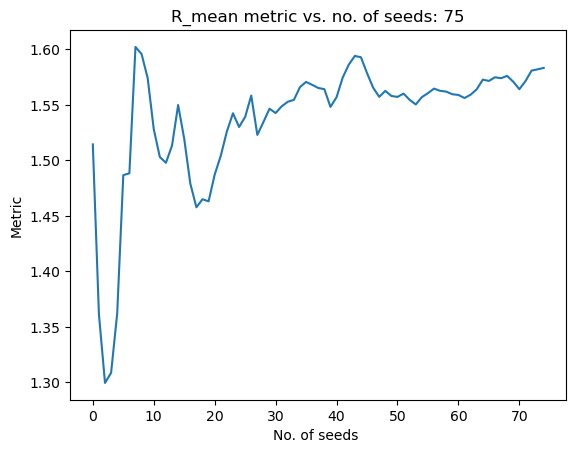

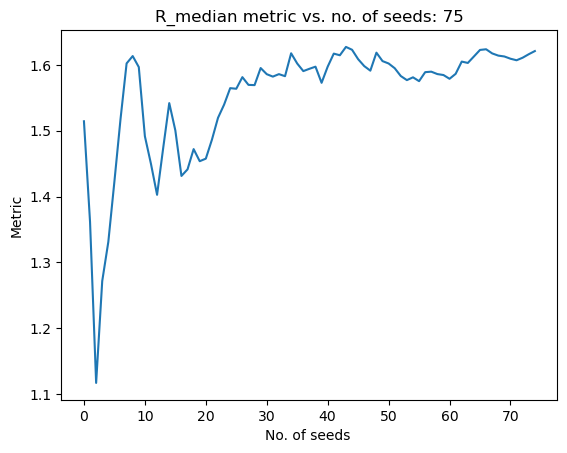

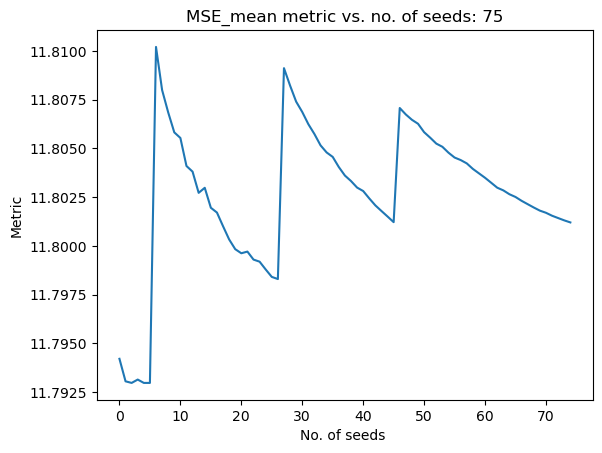

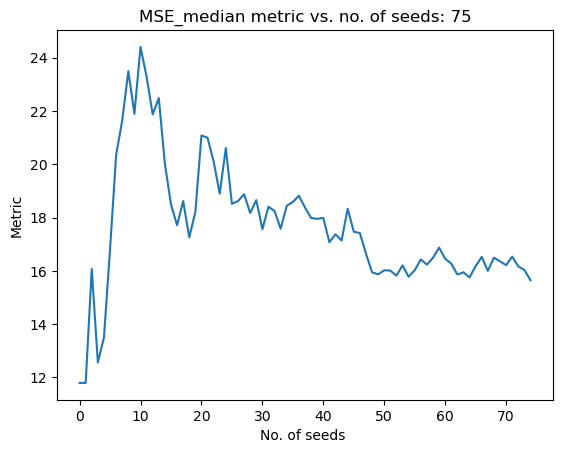

Time required: 2251.32447886467
Best solution found: 
X = [ 1.25595632  8.71766053  8.92207885  0.76892145  8.03805748  8.20768549
  8.41429106  1.86789672  7.96459381  7.9638417   7.7820929   7.86423082
  0.80512173  6.66672399  6.10223312  7.03059639  6.86059246  2.11908893
  8.14150022  1.49344245  8.53834856  8.5311573   8.50043754  7.49907673
  2.13551036  8.15931315  0.92133831  3.93537932  5.95949793  5.92280765
  1.66056402  8.67004201 -1.30103     0.49941937]
F = [11.79538041]
CV = [0.]
R2: 0.8870811297467136
R: 0.941849844586022
-log10(1-R2): 0.9472334755943538
Mean solution thus far: 
 [0.6130858662598281, 8.074727858541674, 8.27929671952715, 0.7029058731855808, 8.073614262479634, 8.22842342111324, 8.393795254174501, 1.485847833480335, 7.577754796428003, 7.523140309449353, 7.305793752447773, 7.487921869459538, 1.5673655110391298, 7.509199182680972, 6.852756008427653, 7.799993631911202, 7.608570925387176, 1.6860587361493042, 7.708911423325949, 1.1284403793304907, 8.1744081367

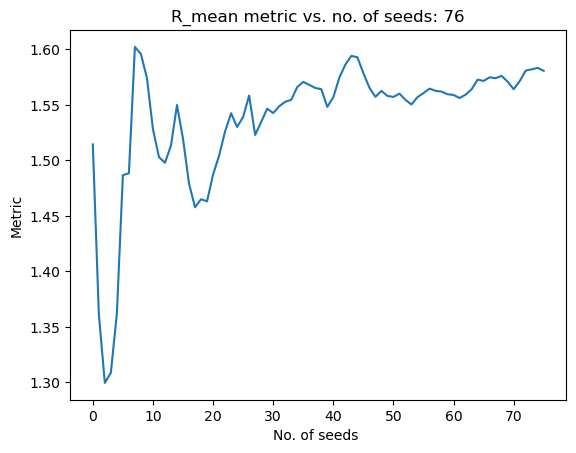

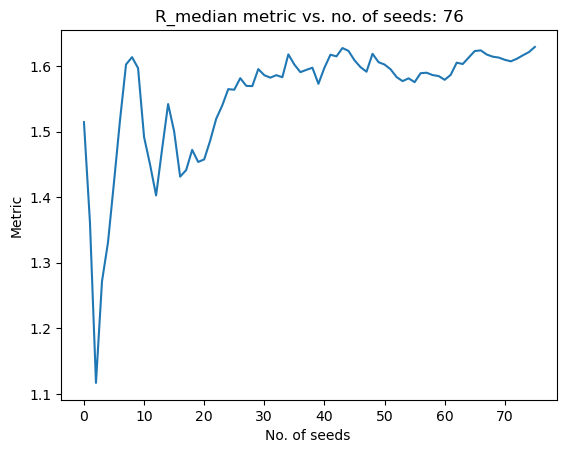

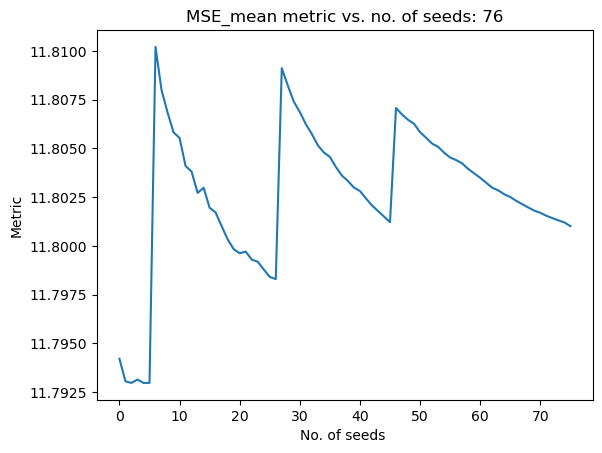

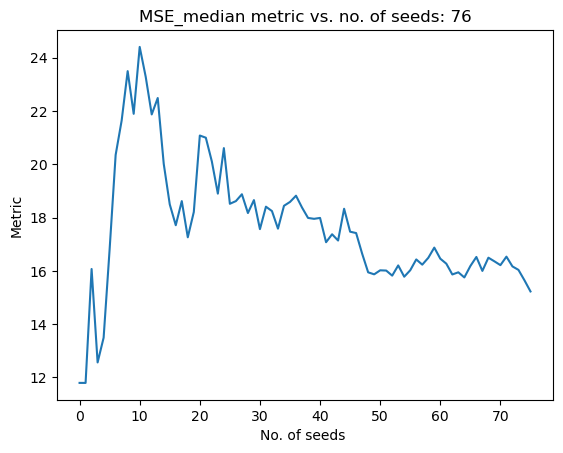

Time required: 2250.954558134079
Best solution found: 
X = [ 0.7758464   8.2370634   8.44290017  0.41232096  7.45255223  7.62074381
  7.83101232  0.76454705  6.83945515  6.90169831  6.61109365  6.76362839
  2.77709053  8.64123361  8.12866241  8.99956027  8.83152762  0.90149911
  6.92402625  1.21492902  8.26121135  8.25386799  8.22127366  7.22008968
  1.65605868  7.67999849  0.8815251   3.89485788  5.91961719  5.88353296
  0.87532501  7.88477501 -1.30103     0.26981246]
F = [11.7956838]
CV = [0.]
R2: 0.8710386509358172
R: 0.9332945145750173
-log10(1-R2): 0.8895404323622956
Mean solution thus far: 
 [0.6151996394559264, 8.076836112345134, 8.281421439625513, 0.699132043199004, 8.065548521824004, 8.220531478095097, 8.386486384914956, 1.4764802907872667, 7.568166489380921, 7.515069634109806, 7.296771673130293, 7.4785154606115105, 1.5830762255406423, 7.523900928500247, 6.869326221441337, 7.815572419482742, 7.6244534798883175, 1.6758696500550103, 7.6987181093947274, 1.1295636084631882, 8.1755

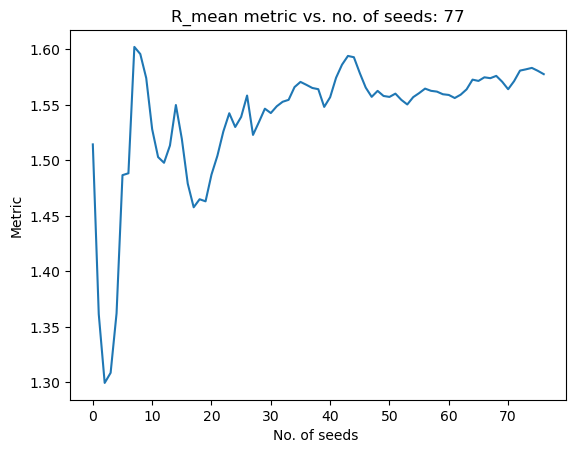

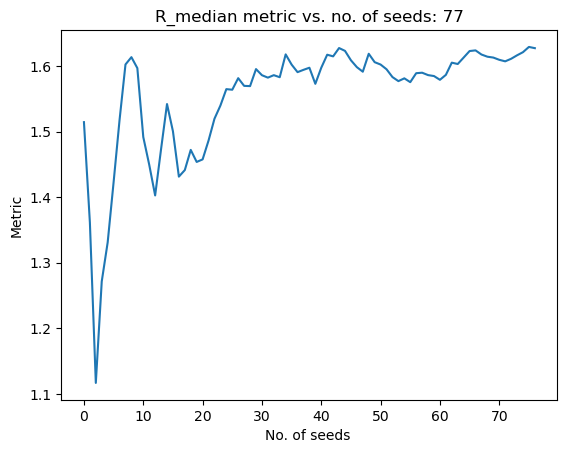

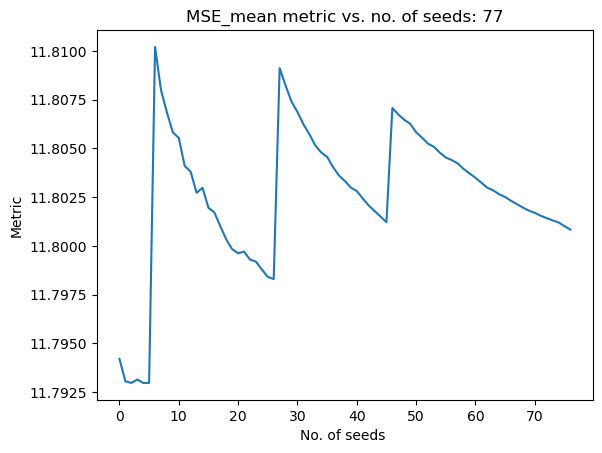

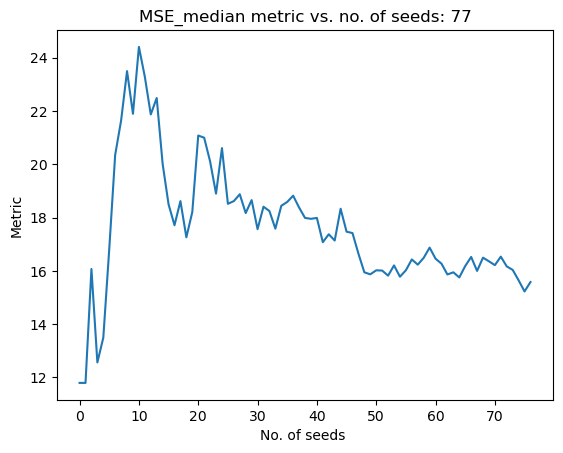

Time required: 2253.786842107773
Best solution found: 
X = [ 0.12892233  7.59023832  7.79583173  0.1910415   8.37439636  8.52895246
  8.695416    1.42710389  7.56843731  7.41546092  7.61109148  7.40805006
  2.60629257  8.56441359  8.11741741  8.83808793  8.64457317  2.77922842
  8.80222304  1.73211368  8.77869266  8.77237493  8.73827893  7.73745364
  0.30086203  6.32500842  0.04841239  3.06219478  5.08604287  5.05107636
  0.43562915  7.44517933 -1.30103     1.39662053]
F = [11.79385181]
CV = [0.]
R2: 0.8347847433826285
R: 0.913665553352335
-log10(1-R2): 0.78194985072751
Mean solution thus far: 
 [0.608965314914638, 8.070597679161448, 8.27519593052904, 0.6926180618770951, 8.06950810943855, 8.224485593270385, 8.390447020954866, 1.47584726000145, 7.568169961409992, 7.513792599284932, 7.300801414235688, 7.477612058045245, 1.5961943837837034, 7.5372408344749084, 6.885327390472393, 7.8286815927390805, 7.637531937492344, 1.6900152753497515, 7.712865608474715, 1.137288609353601, 8.183268235820

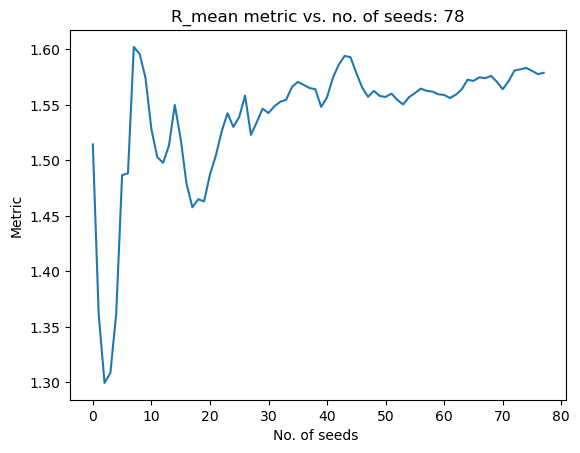

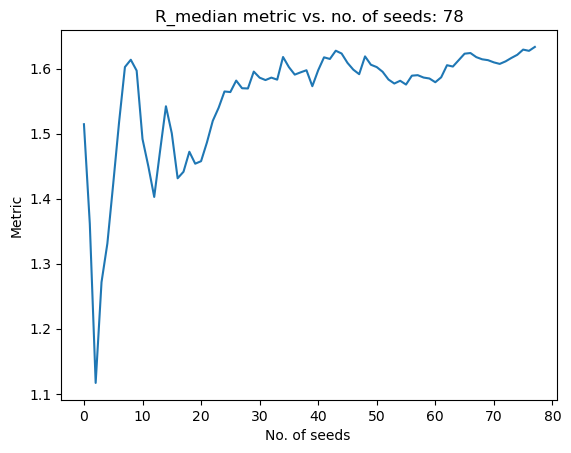

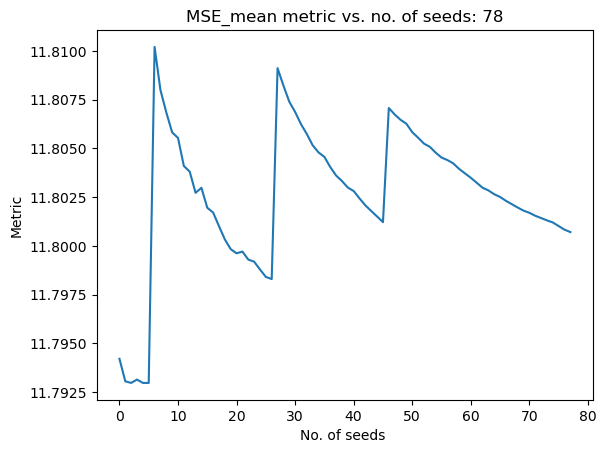

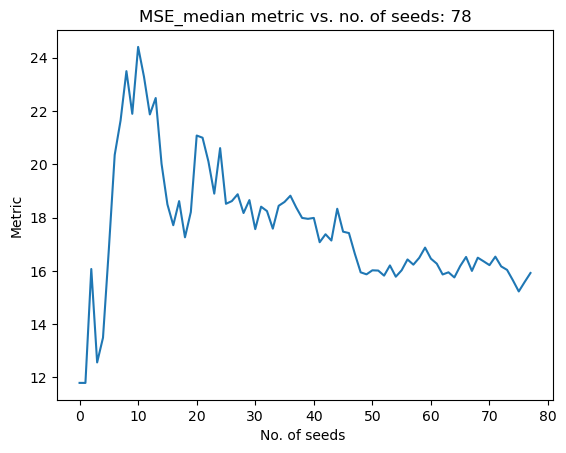

Time required: 2254.51034283638
Best solution found: 
X = [ 0.4310644   7.89191672  8.09896363  1.47078461  8.36419058  8.53433137
  8.72563258  1.13610475  7.28051426  7.13429869  7.23506835  7.12037178
  2.73273009  8.64958317  8.12819662  8.96600987  8.77908306  0.28855568
  6.31116224  0.78963139  7.83568201  7.8282622   7.79622892  6.79486305
  1.46877908  7.49267047  0.89285093  3.90744403  5.93110126  5.89404236
  0.33220844  7.34178407 -1.30103     0.12199809]
F = [11.79423569]
CV = [0.]
R2: 0.8947195607886917
R: 0.9458961680801397
-log10(1-R2): 0.9776523119268362
Mean solution thus far: 
 [0.6067134046589787, 8.068335894897027, 8.272965141856464, 0.7024682713554362, 8.073238267245245, 8.228407691686105, 8.394689876073064, 1.471546721882884, 7.564528749979124, 7.508988878884869, 7.29996935018104, 7.473090029236917, 1.6105809117206893, 7.551321117175548, 6.901059912352475, 7.8430781531674, 7.651981951660031, 1.6722752804854741, 7.6951225279098745, 1.1328878850803008, 8.178868410

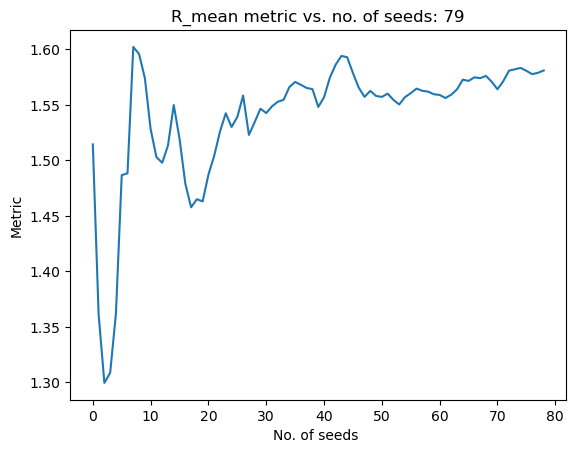

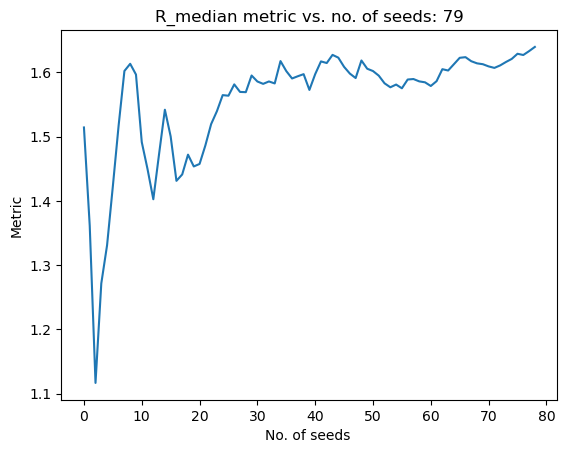

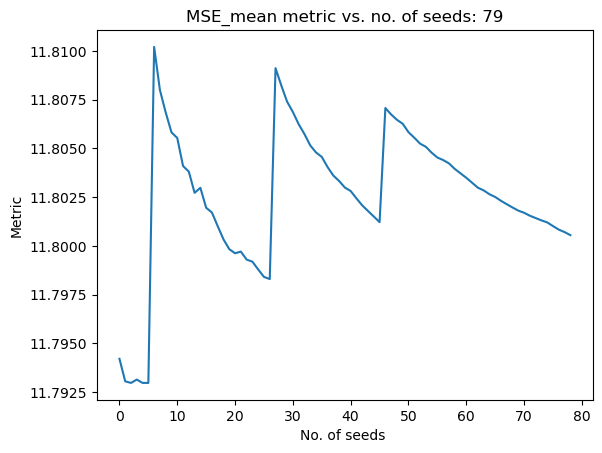

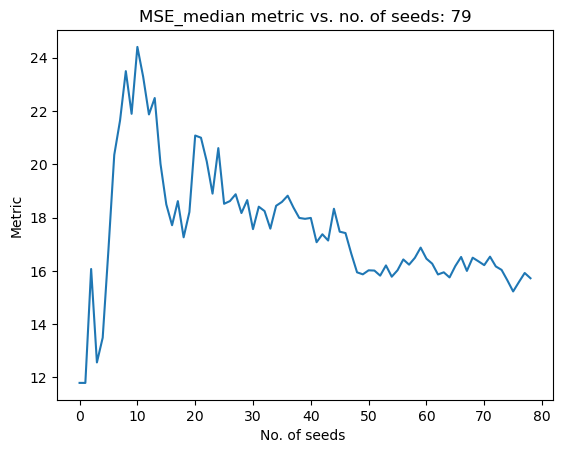

Time required: 2251.112767457962
Best solution found: 
X = [ 0.10438938  7.56526058  7.77237478  1.03265406  8.17654969  8.3478646
  8.52784289  2.54768398  8.68605617  8.53002124  8.60221698  8.53921351
  0.42892308  6.34296797  5.75606148  6.66434552  6.4771938   2.85345087
  8.87599404  0.79501602  7.84132478  7.83401434  7.80135825  6.80001232
  2.448484    8.47231586  3.96345549  6.97505289  8.9999949   8.96774081
  1.87441819  8.88373922 -1.30103     0.37186538]
F = [11.79433741]
CV = [0.]
R2: 0.8968702546241278
R: 0.9470323408543807
-log10(1-R2): 0.9866160545085342
Mean solution thus far: 
 [0.600434354341793, 8.06204745345402, 8.266707762302412, 0.7065955937356498, 8.074529660039602, 8.229900903055183, 8.39635428872912, 1.4849984375975613, 7.578547842707148, 7.521751783413897, 7.316247445598341, 7.486416572782201, 1.5958101888743037, 7.536216702817806, 6.886747431965185, 7.8283439952212275, 7.637297099752193, 1.687039975375765, 7.709883421814496, 1.1286644867131428, 8.174649114

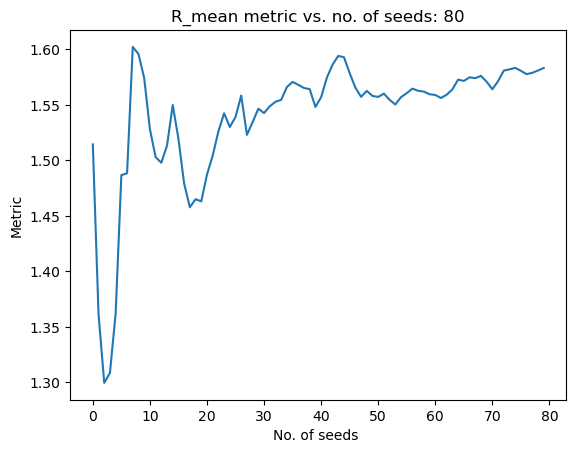

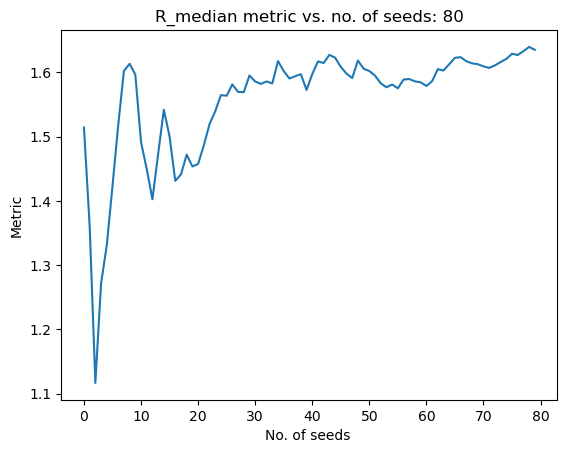

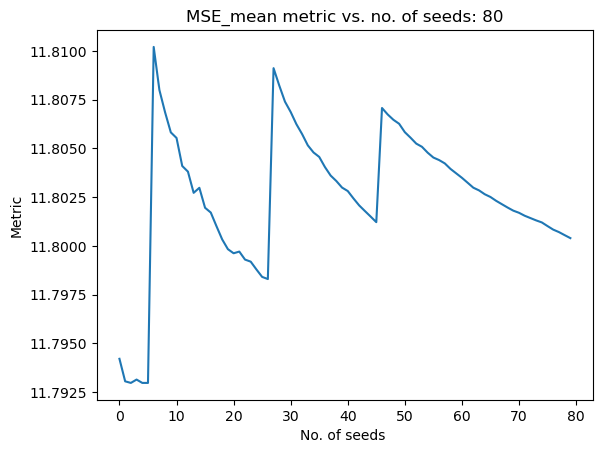

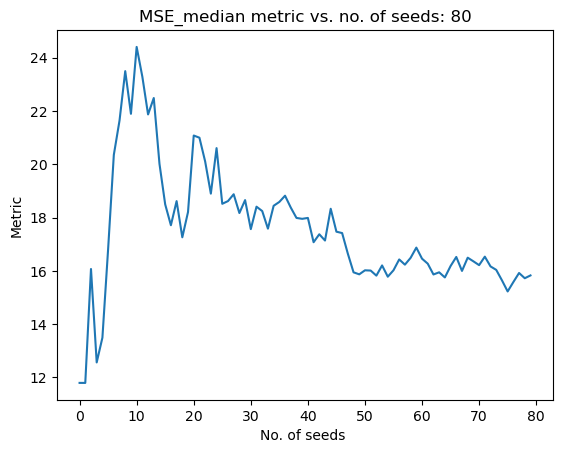

Time required: 2250.6658120155334
Best solution found: 
X = [ 1.08773128  8.54881921  8.75490266  1.54847548  8.55467683  8.66620496
  8.77232327  1.03031023  7.14528548  7.02271701  7.17638276  7.02355556
  0.52552096  6.52052763  6.12106831  6.754382    6.55644477  2.78218895
  8.80561568  1.73518106  8.78045603  8.77353065  8.74294575  7.74168671
  1.32662734  7.35116412  3.83676084  6.85443381  8.87790872  8.83466172
  1.65154705  8.66143264 -1.30103     0.17953502]
F = [11.7942832]
CV = [0.]
R2: 0.9206729798620235
R: 0.9595170555347223
-log10(1-R2): 1.1005788593649
Mean solution thus far: 
 [0.6064503657674823, 8.068056981371482, 8.272734859830985, 0.7169891725908071, 8.080457402926523, 8.235287372888752, 8.40099588111765, 1.4793850028909306, 7.573198924624801, 7.515590860266701, 7.314520721139831, 7.480702239318236, 1.5825967415503668, 7.523677331583487, 6.877294603290755, 7.815085205218094, 7.623953243872294, 1.700560333025745, 7.7234109805340285, 1.136152345677837, 8.1821282126

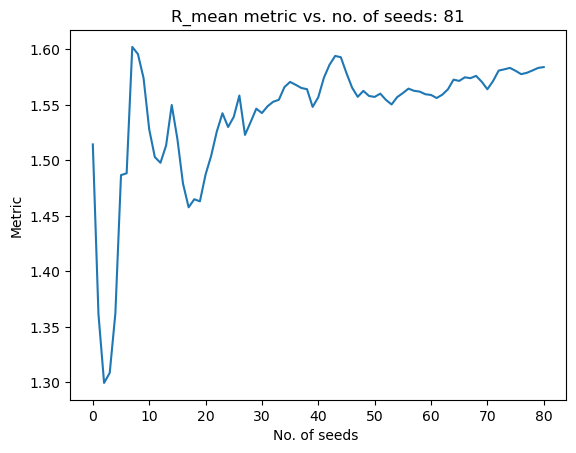

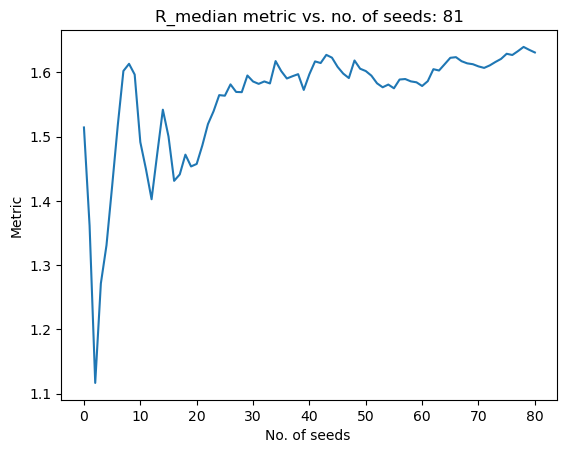

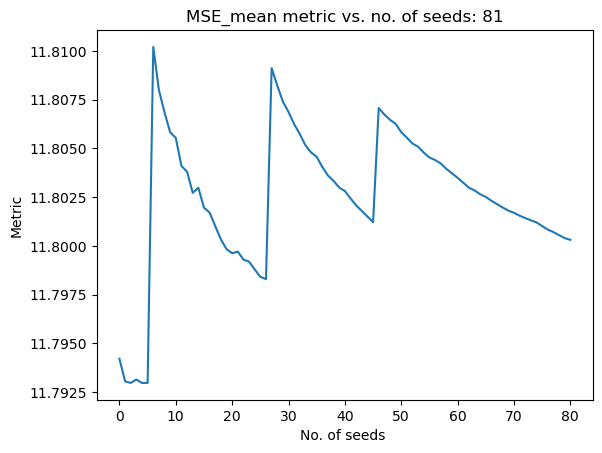

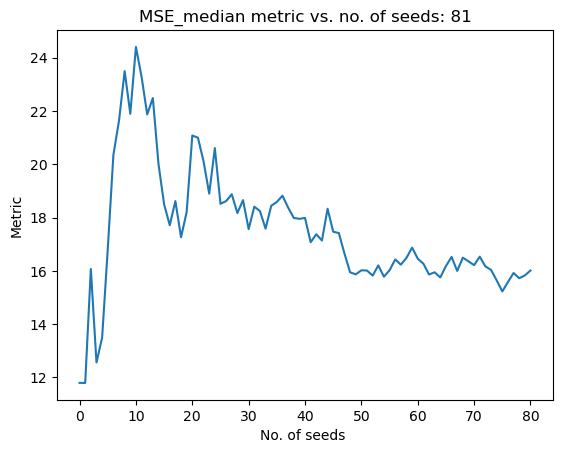

Time required: 2249.0217730998993
Best solution found: 
X = [ 1.3153973   8.77584459  8.98436724  0.2919817   7.85857196  7.97423209
  8.0900239   1.72031317  7.70101975  7.84166153  7.34266001  7.75393108
  1.1398437   7.14457775  6.74861604  7.37360797  7.1682289   1.48087979
  7.50437564  1.06561193  8.11202946  8.10538493  8.07248966  7.07160344
  0.98165453  7.00616993  1.87860412  4.8921333   6.91615113  6.8820769
  1.63294208  8.64265321 -1.30103     0.74419132]
F = [11.79614247]
CV = [0.]
R2: 0.9417681343158167
R: 0.9704473887418198
-log10(1-R2): 1.2348392953570997
Mean solution thus far: 
 [0.615096060088587, 8.076688537590702, 8.281413303442978, 0.7118061546025494, 8.07775148292049, 8.23210377193787, 8.397203539853276, 1.4823231512369166, 7.5747577151894845, 7.519567331867383, 7.314863883225902, 7.484034298343233, 1.577197314208962, 7.519054165920918, 6.875725352472552, 7.809701336512165, 7.61839562987162, 1.6978813020228358, 7.720739817863539, 1.135292096665816, 8.1812733497

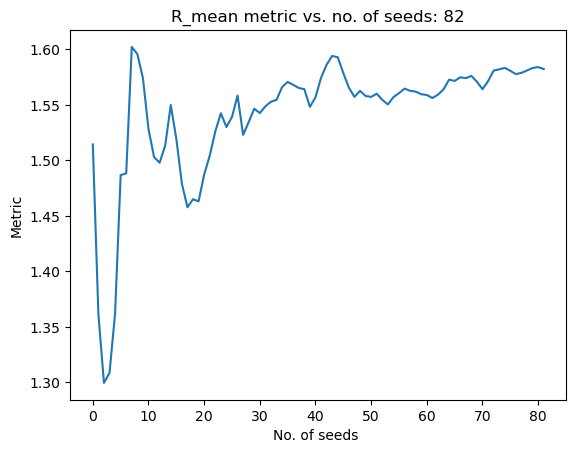

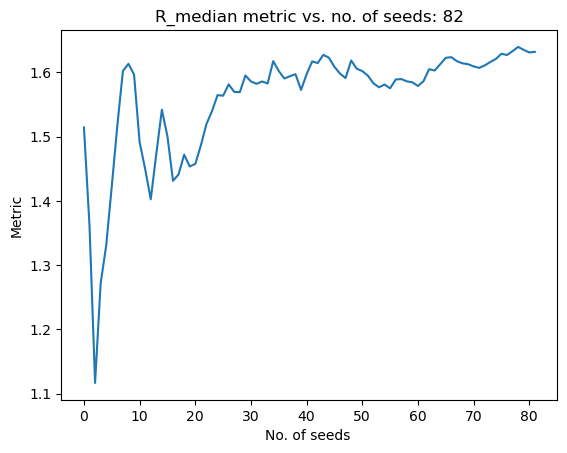

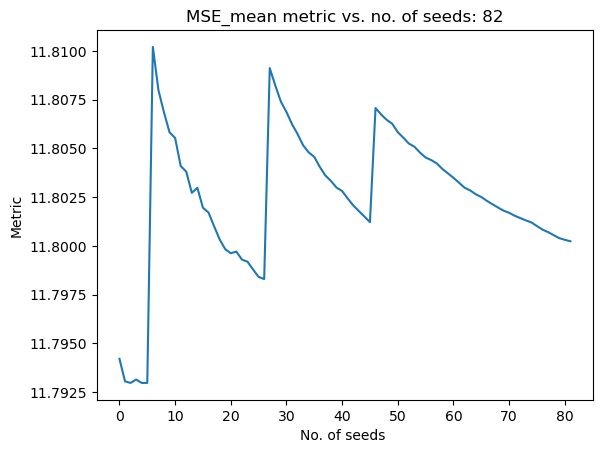

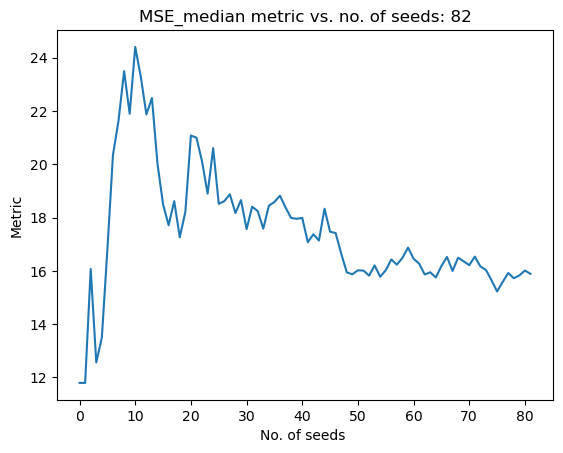

Time required: 2247.9665536880493
Best solution found: 
X = [ 0.22203481  7.68201413  7.89184456  1.71423162  8.81259526  8.9194756
  9.          1.44176543  7.44730352  7.5462934   7.2848082   7.4662951
  1.86387445  7.86971348  7.48521198  8.09612548  7.89164135  1.40366811
  7.42720046  1.03207657  8.07917746  8.07131029  8.03901814  7.03795857
  1.20267003  7.22716617  3.95851079  6.9724504   8.99716864  8.96083051
  1.70595801  8.71560087 -1.30103     0.26578619]
F = [11.79582437]
CV = [0.]
R2: 0.9698652937792075
R: 0.9848173910828381
-log10(1-R2): 1.5209330380540627
Mean solution thus far: 
 [0.6103603824084581, 8.07193342422465, 8.276719704130523, 0.7238835698780104, 8.086605022390227, 8.240385360227908, 8.4044661478018, 1.4818345039546887, 7.573222122473529, 7.519889332729783, 7.314501766567709, 7.483820573085877, 1.5806512556520638, 7.523278976877472, 6.883068564877231, 7.8131522297670575, 7.621687746958722, 1.6943365648040436, 7.717203199147852, 1.1340485361451242, 8.18004327

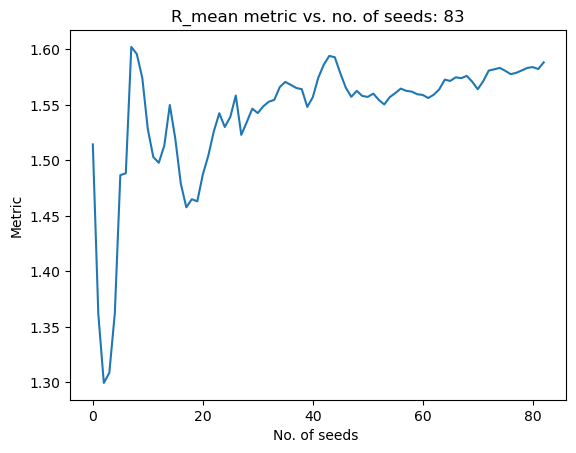

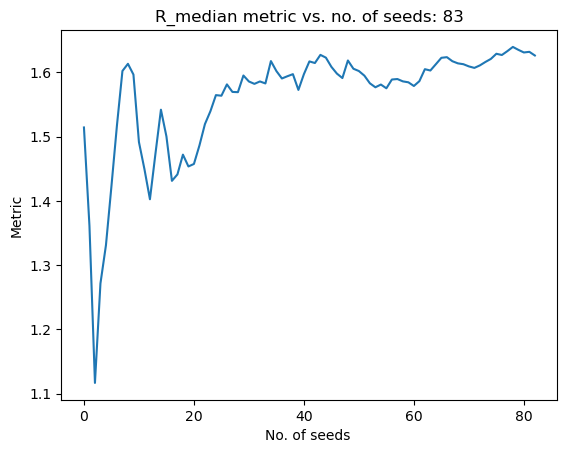

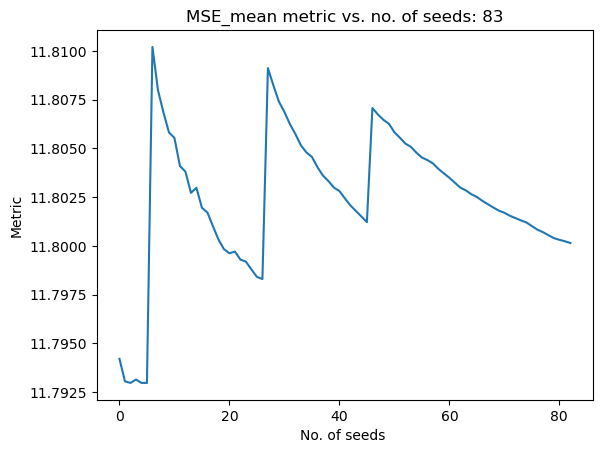

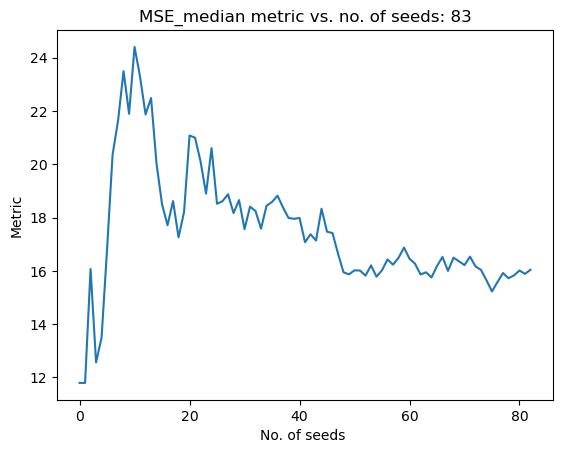

Time required: 2247.030972957611
Best solution found: 
X = [ 0.86613361  8.32874109  8.52993643  0.98544226  8.05325048  8.15375848
  8.21361779  1.84729171  7.91080247  7.84247859  7.88893338  7.8626565
  0.11188834  6.12372209  5.67051825  6.35632136  6.13955788  2.58682611
  8.60985984  1.63005495  8.67578458  8.66833926  8.63730651  7.63598305
  0.55668221  6.58103583  3.0717116   6.08588047  8.10975553  8.07398028
  0.5194347   7.52907031 -1.30103     0.22823236]
F = [11.79507467]
CV = [0.]
R2: 0.9166791031768033
R: 0.957433602489908
-log10(1-R2): 1.0792460641771309
Mean solution thus far: 
 [0.6134053018234775, 8.074990658318914, 8.279734188989083, 0.7269973637910179, 8.086207944465063, 8.239354087880496, 8.402194143487513, 1.486185184960698, 7.577240936189102, 7.523729680989244, 7.32134023815742, 7.488330524622842, 1.5631659828574207, 7.506617585393623, 6.86863344204406, 7.7958090050834885, 7.6040433438124895, 1.7049614403551883, 7.727830063921597, 1.1399533744426147, 8.18594496

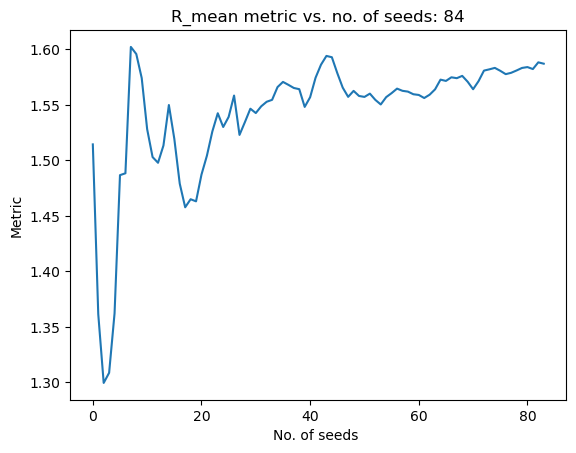

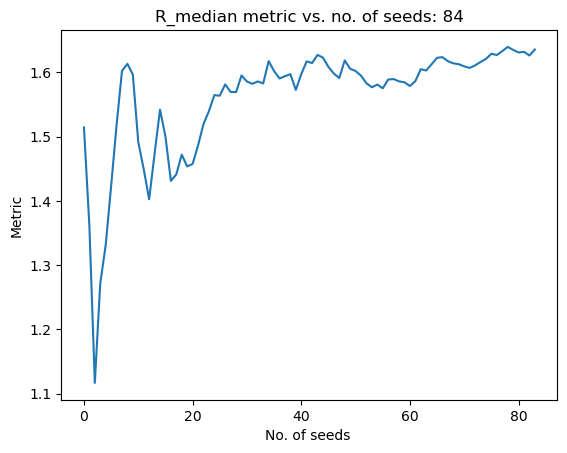

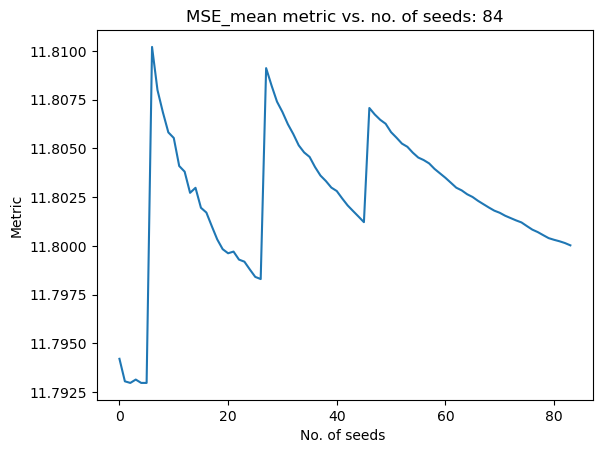

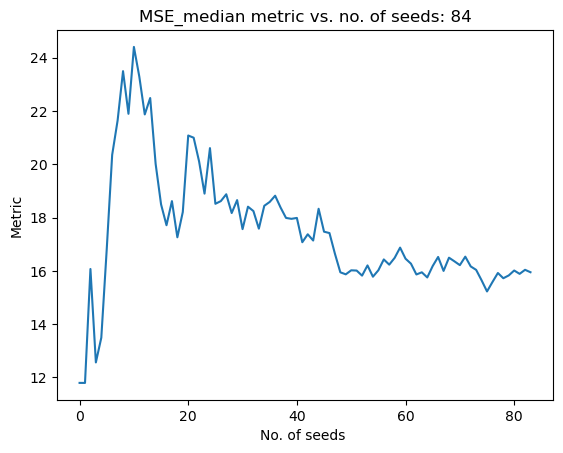

Time required: 2248.4432244300842
Best solution found: 
X = [ 0.79023165  8.2528247   8.45431801  0.4575482   8.05496263  8.16450621
  8.2445816   1.03836897  7.09963793  7.06130168  7.0641637   7.05218725
  1.12954495  7.14281038  6.73122357  7.3694423   7.15549753  0.81135045
  6.8343499   0.72902531  7.77368223  7.76703513  7.73706372  6.73471538
  1.24804186  7.27216587  3.31508982  6.32740579  8.35383414  8.317537
  1.74054979  8.7499192  -1.30103     0.76601243]
F = [11.79462895]
CV = [0.]
R2: 0.9402974734837297
R: 0.9696893695837496
-log10(1-R2): 1.2240072898277947
Mean solution thus far: 
 [0.6154856117645278, 8.077082823486789, 8.281788116344297, 0.72382737368164, 8.0858403525234, 8.238473524552942, 8.400339878309852, 1.4809167589036256, 7.571622077311456, 7.51828935158387, 7.318314631796117, 7.483199427251201, 1.5580645589013002, 7.5023375006457895, 6.867016855350923, 7.790792926258318, 7.598766334245623, 1.6944483699049175, 7.71731853260438, 1.135118926644101, 8.181094811252

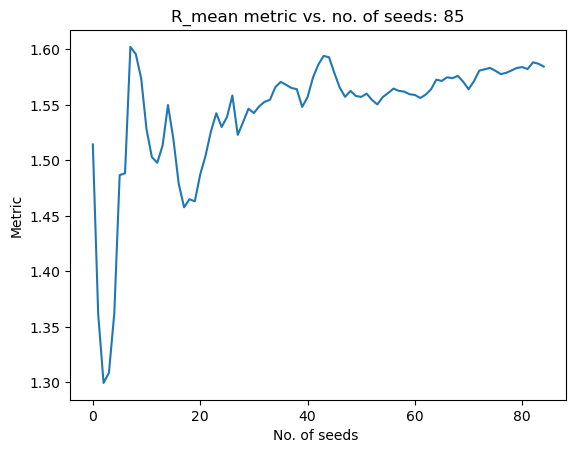

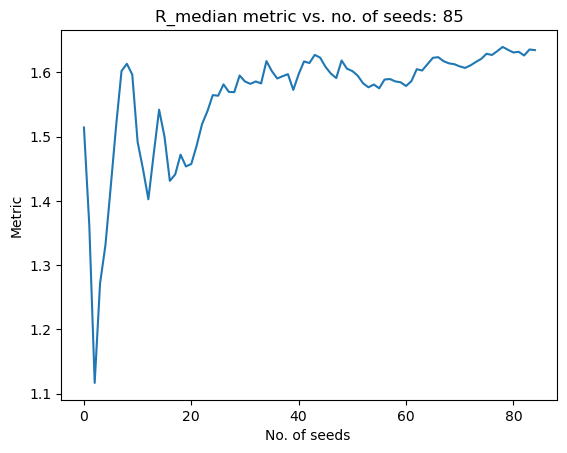

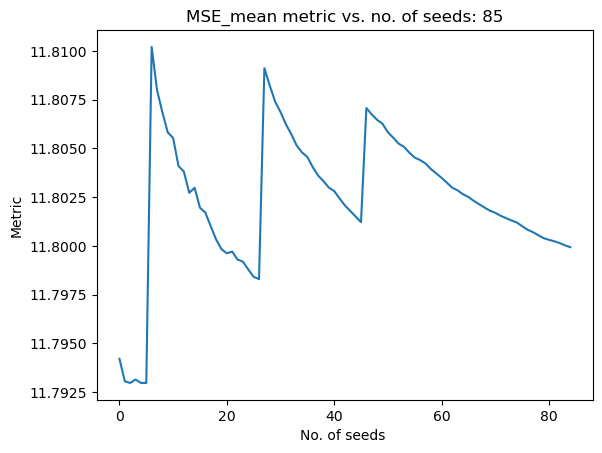

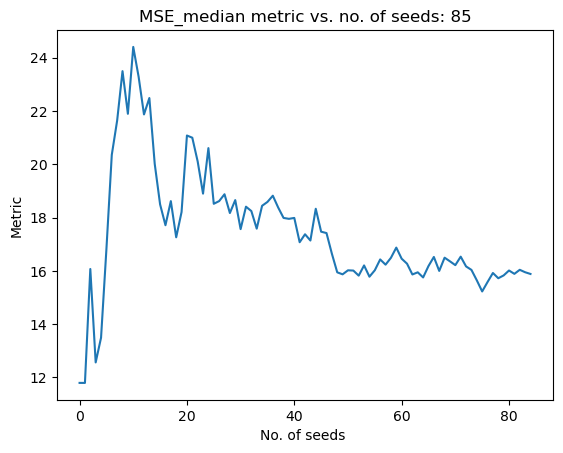

Time required: 2249.2857224941254
Best solution found: 
X = [ 0.33127332  7.79399936  7.99540129  0.6214749   7.57351294  7.73142163
  7.92875758  0.27429646  6.30402888  6.41106687  6.00221099  6.2912991
  1.70941083  7.66446094  7.25185274  7.93672587  7.74775868  2.61462717
  8.63772879  1.28708614  8.33215492  8.32531766  8.29459685  7.29319205
  2.66706278  8.69127497  3.10740349  6.12320184  8.14676258  8.10745012
  1.39988843  8.40962068 -1.30103     0.17188423]
F = [11.79431435]
CV = [0.]
R2: 0.8988126556988567
R: 0.9480573061259835
-log10(1-R2): 0.9948738021590681
Mean solution thus far: 
 [0.612180817644704, 8.073791155341087, 8.278458037011541, 0.7226372286040406, 8.079883056986533, 8.232577572256014, 8.394856363225992, 1.4668862903239304, 7.5568826215642435, 7.505414671605706, 7.303011101126052, 7.469340121166434, 1.5598243992796963, 7.5042226569737815, 6.871491691225648, 7.792489820958527, 7.600498803373477, 1.705148123432091, 7.728020977494048, 1.1368859872477988, 8.18285

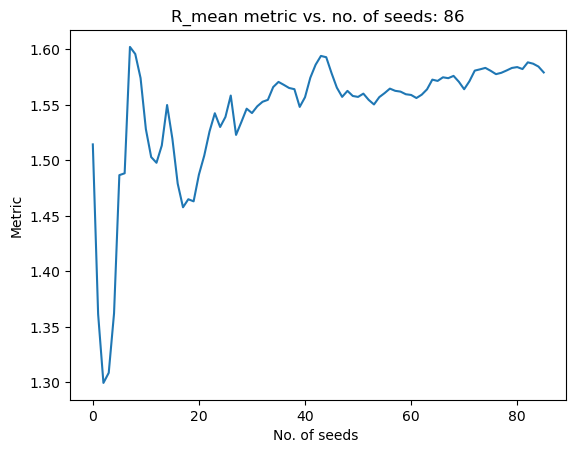

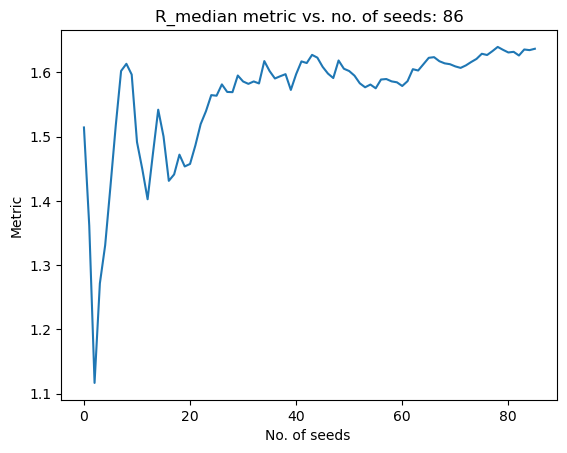

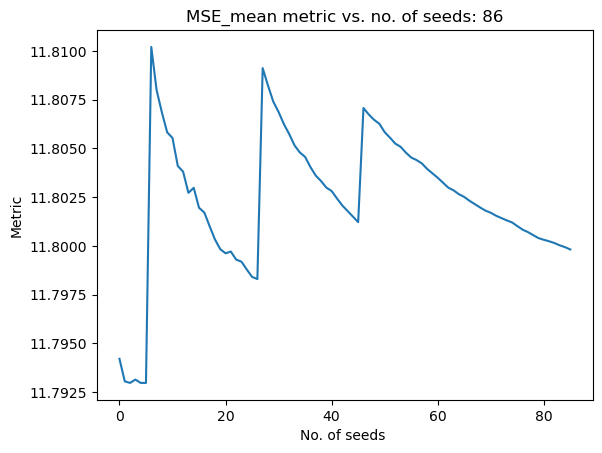

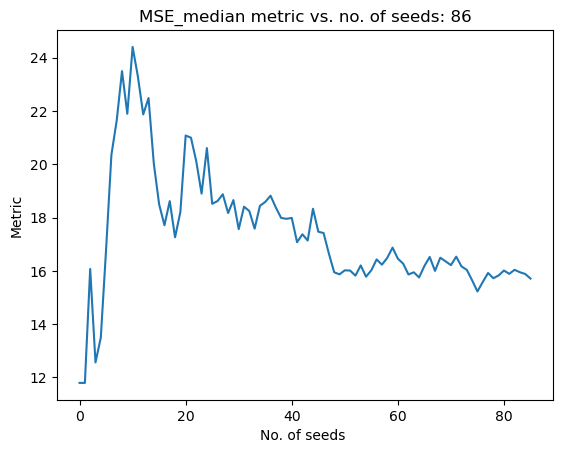

Time required: 2252.4594461917877
Best solution found: 
X = [ 0.1170981   7.57815792  7.78460931  0.5798636   8.59158209  8.7533391
  8.94339094  2.72231792  8.79679653  8.82304606  8.57112255  8.72748736
  0.54025051  6.42879743  5.89190602  6.76939016  6.5913779   1.4715563
  7.49415003  0.45854957  7.50476187  7.49754187  7.46515781  6.46361584
  2.76167735  8.78566792  1.49039535  4.50294381  6.52724915  6.49408793
  0.39730054  7.40680678 -1.30103     1.23366161]
F = [11.79441923]
CV = [0.]
R2: 0.8746433122603795
R: 0.9352236696429254
-log10(1-R2): 0.9018524916145281
Mean solution thus far: 
 [0.6064902117363573, 8.068094221561394, 8.272781614810734, 0.7209961523706233, 8.085764655044496, 8.238563336960107, 8.401161358335735, 1.4813165389887315, 7.5711345055793915, 7.520559860027918, 7.317587094819823, 7.483801583701509, 1.5481051592004968, 7.491861447448769, 6.860232085757445, 7.780730054750035, 7.588899712492119, 1.7024631599843632, 7.725332805707419, 1.1290890169854932, 8.17505

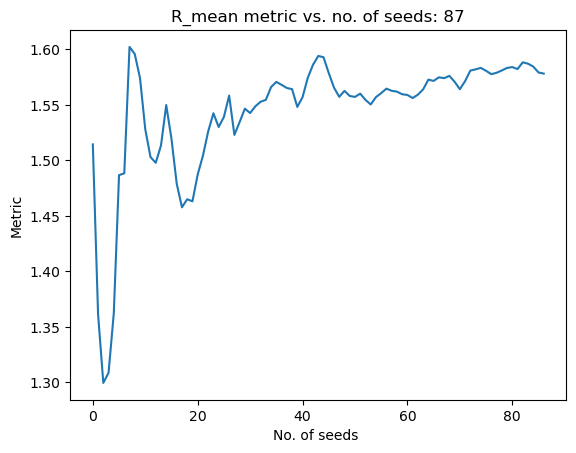

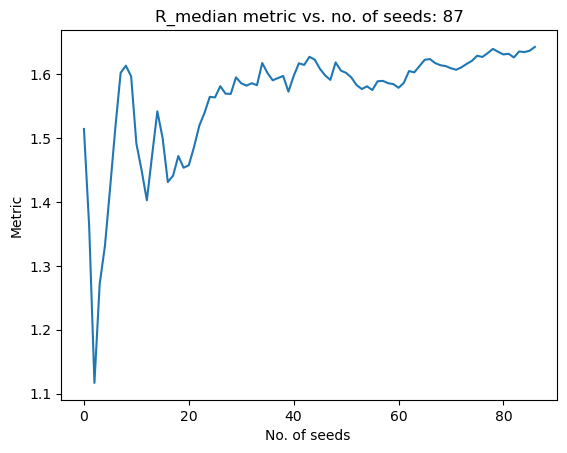

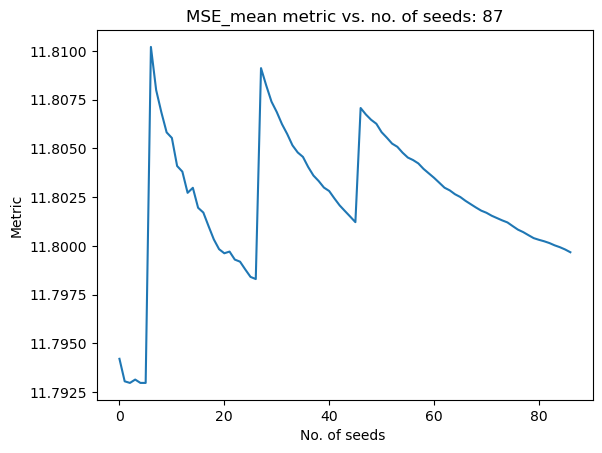

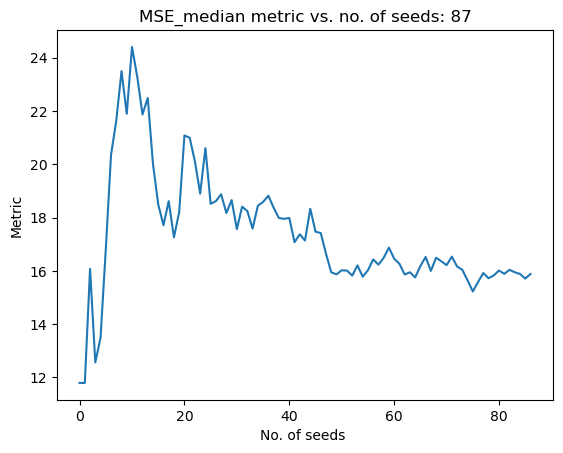

Time required: 2252.340099096298
Best solution found: 
X = [ 0.09154213  7.55287544  7.75841852  0.28768184  7.09689555  7.26081784
  7.45782188  1.72884489  7.79730228  7.82037619  7.60240434  7.73657184
  0.75000598  6.69861332  6.28471509  6.97466944  6.78983404  2.44490359
  8.46809721  1.69624014  8.7428705   8.735433    8.70322329  7.70172164
  0.44770289  6.47205265  3.96326212  6.97622733  8.99998924  8.96738297
  0.09386474  7.10350281 -1.30103     0.03371121]
F = [11.7933705]
CV = [0.]
R2: 0.895468686460701
R: 0.9462920724917339
-log10(1-R2): 0.9807535922303319
Mean solution thus far: 
 [0.6006385289582974, 8.062239462648584, 8.266936579613924, 0.7160721261141529, 8.074527506102417, 8.227452592641978, 8.390441591522437, 1.4841293611679667, 7.573704593976843, 7.523966863759235, 7.320823654436828, 7.486673972921219, 1.5390358503091874, 7.482847264214101, 6.8536921198947445, 7.771570275040849, 7.579819420805854, 1.7108999831035632, 7.733773310330628, 1.1355339161666238, 8.181509

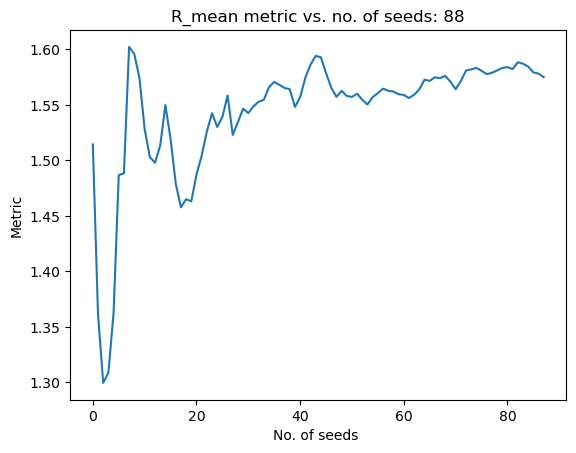

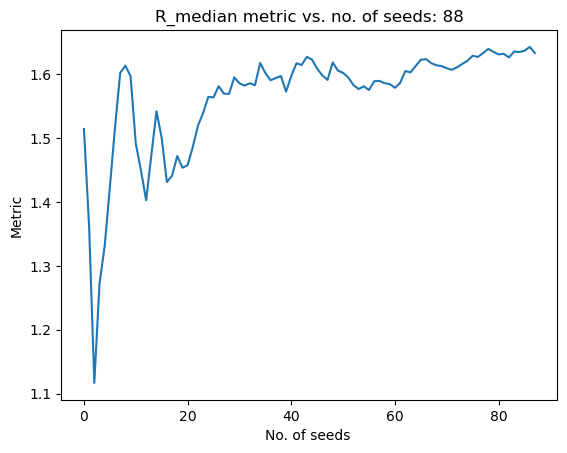

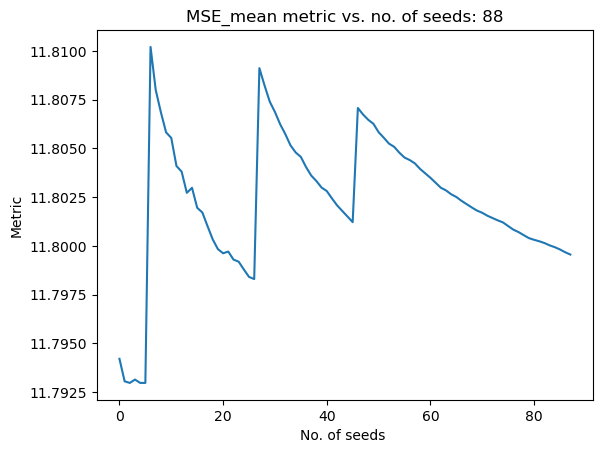

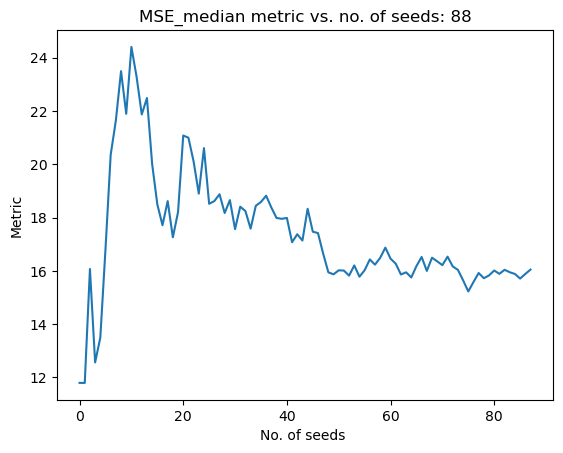

Time required: 2250.702511072159
Best solution found: 
X = [ 0.2226684   7.68298737  7.89182952  0.81619288  8.48360544  8.6477242
  8.84886943  1.73897386  7.86238608  7.79874089  7.81413341  7.72362198
  2.40234391  8.33072559  7.88746074  8.62805152  8.44594319  2.87618938
  8.89906512  1.74413874  8.78862474  8.78186053  8.75200048  7.75009985
  2.20362555  8.22770976  3.80002696  6.81378549  8.83824444  8.80194874
  1.49767303  8.50722763 -1.30103     0.89254683]
F = [11.79372222]
CV = [0.]
R2: 0.9489103308717693
R: 0.9741202856278938
-log10(1-R2): 1.2916669099278157
Mean solution thus far: 
 [0.5963916735339434, 8.057978203153516, 8.262721893588903, 0.7171970784199841, 8.079123887367153, 8.232174745544055, 8.395592466085116, 1.486992782476298, 7.576948206126143, 7.52705421233816, 7.326366460725084, 7.4893363100366885, 1.5487359408240755, 7.492373986953188, 6.8653074976717114, 7.78119365982257, 7.589551148537354, 1.723993122344045, 7.746866476777212, 1.1423721726345735, 8.18833113

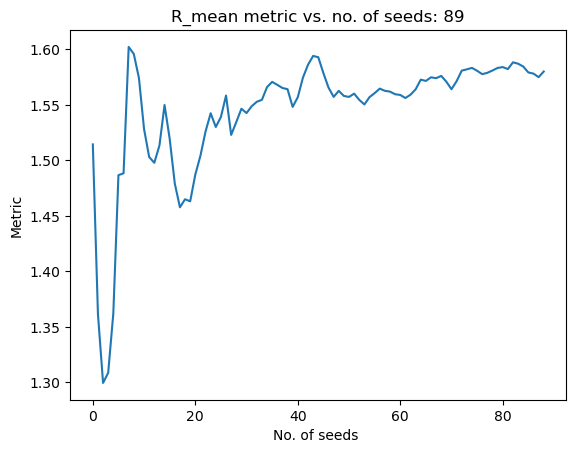

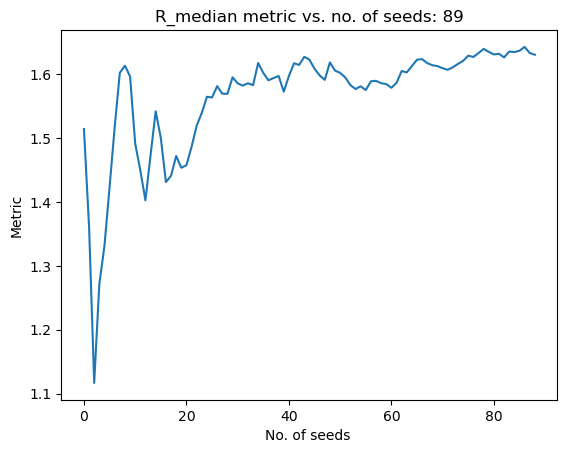

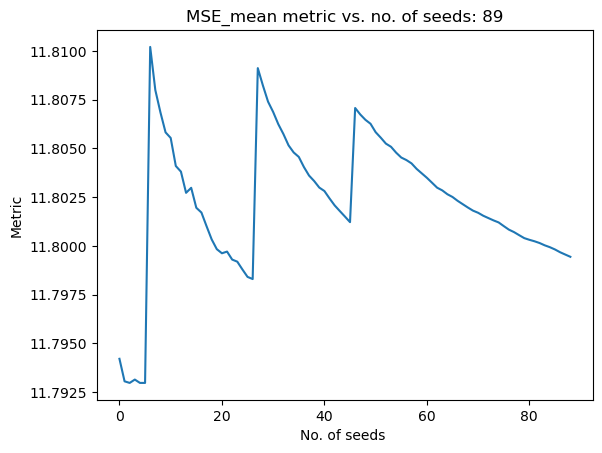

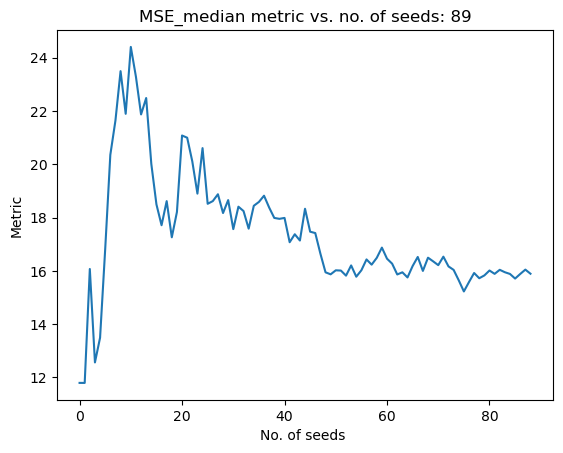

Time required: 2244.9793469905853
Best solution found: 
X = [ 0.22371093  7.68454803  7.89179321  0.40087831  7.6983275   7.86429056
  8.04520312  1.97106618  8.0852487   7.98050215  7.99227979  7.96943589
  2.41127175  8.34698554  7.79848599  8.64931808  8.45516846  0.51918766
  6.54175619  1.69657575  8.74034017  8.73398262  8.70416093  7.70274527
  2.61853169  8.64238257  3.87507658  6.8918453   8.9167197   8.87192439
  0.05185369  7.06130063 -1.30103     0.52138125]
F = [11.79349101]
CV = [0.]
R2: 0.9147145874093535
R: 0.9564071242987233
-log10(1-R2): 1.069125245188312
Mean solution thus far: 
 [0.5922507763952995, 8.053828978973188, 8.258600463761478, 0.7136824254455932, 8.074892816444738, 8.228087143504204, 8.39169925110979, 1.492371375836239, 7.58259598939087, 7.5320925227042395, 7.333765497753281, 7.494670749763345, 1.558319672035216, 7.501869670858288, 6.875676147600204, 7.790839486693849, 7.599169118639297, 1.7106063949623347, 7.733476362505761, 1.1485299901951274, 8.19446456

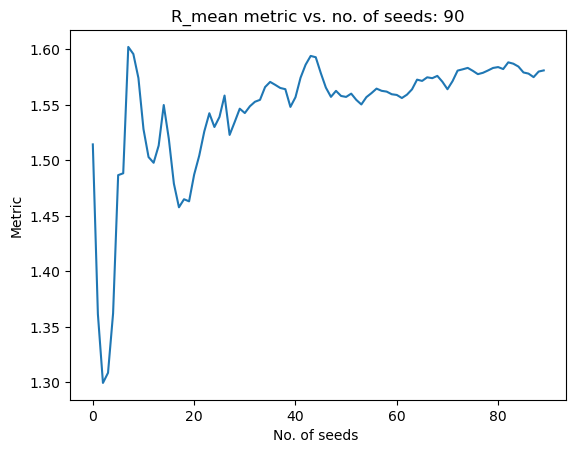

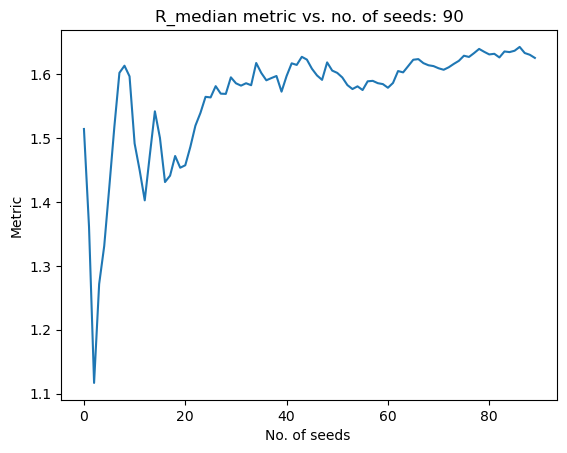

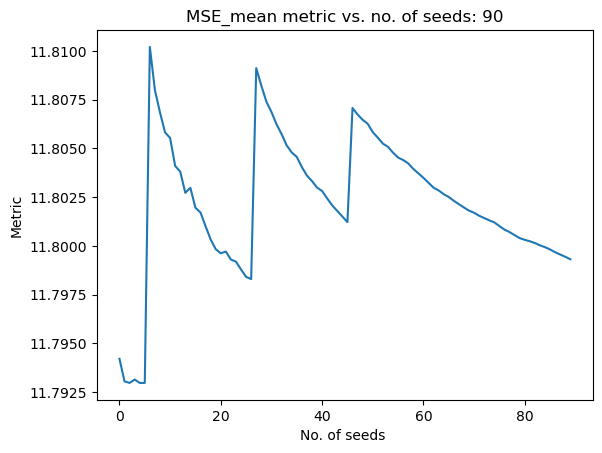

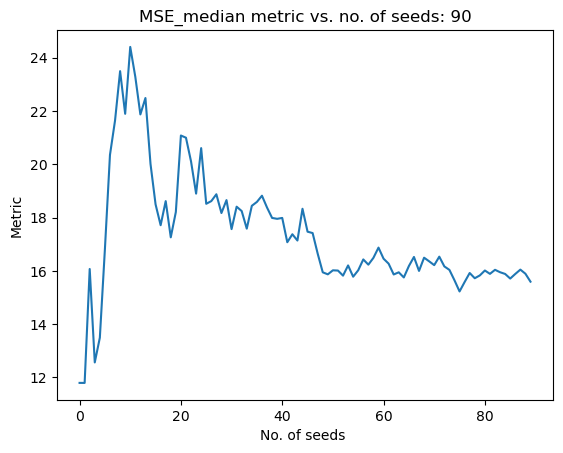

Time required: 2249.941413164139
Best solution found: 
X = [ 0.62677631  8.08760301  8.29490652  0.03726805  7.34121584  7.47076031
  7.6081367   1.13649014  7.16716033  7.21485558  6.95671855  7.15877752
  1.16923424  7.16639218  6.76422414  7.40360598  7.19888936  1.94559556
  7.96890668  1.68132956  8.72598592  8.71896949  8.68927871  7.68815719
  0.67960511  6.70405084  3.92346441  6.94195193  8.96549014  8.91998344
  0.65949406  7.66931542 -1.30103     0.49460553]
F = [11.7940581]
CV = [0.]
R2: 0.9174086952307288
R: 0.9578145411460033
-log10(1-R2): 1.0830656728915034
Mean solution thus far: 
 [0.5926301778520158, 8.054200122183511, 8.258999431432844, 0.7062493004770414, 8.066830432116813, 8.219764870637542, 8.383088673598575, 1.488460593057245, 7.578030762347985, 7.5286064024096655, 7.329622124719895, 7.490979615373506, 1.5540440079178899, 7.498183105068241, 6.874451400264098, 7.786584173462496, 7.594770440021352, 1.713188693447871, 7.73606350882032, 1.1543849304942841, 8.20030546

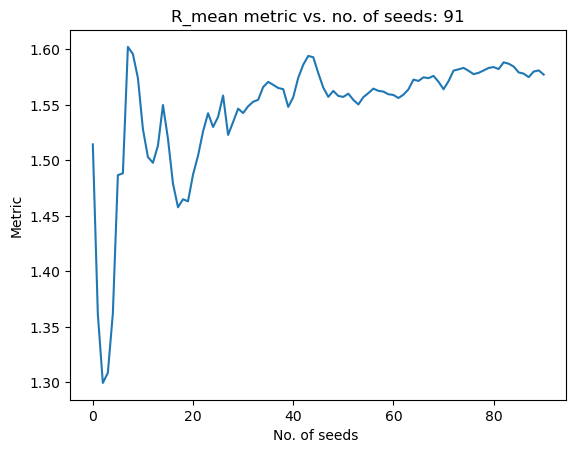

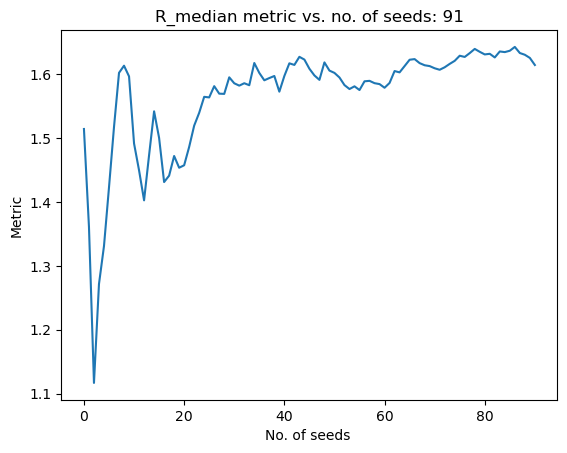

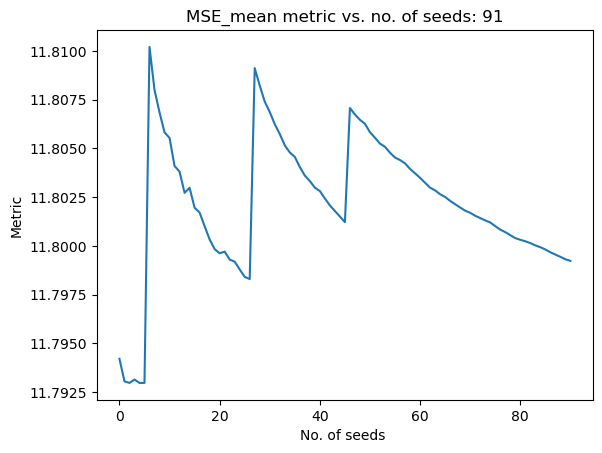

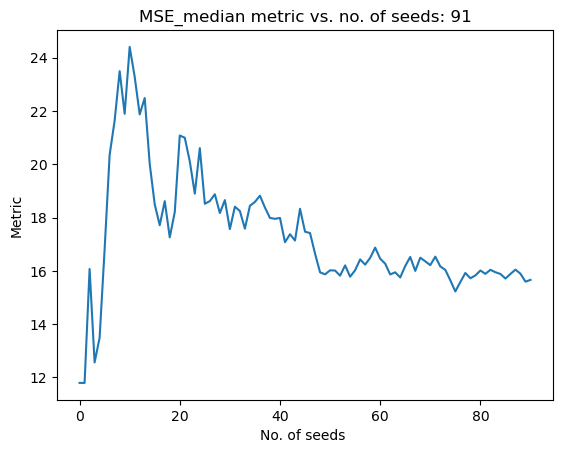

Time required: 2250.6778643131256
Best solution found: 
X = [ 0.0982821   7.55937623  7.76555842  0.33068533  7.27699599  7.47516326
  7.69875335  1.32082908  7.42169147  7.3747228   7.19296877  7.32394751
  2.02154329  7.92447502  7.37095511  8.25479022  8.07113602  2.79923552
  8.8218439   0.40416338  7.44977974  7.44255014  7.41107533  6.40965689
  2.76579002  8.78976596  3.23680233  6.25181403  8.27633001  8.23682699
  1.46850323  8.47804093 -1.30103     0.20134602]
F = [11.79502788]
CV = [0.]
R2: 0.9198526898732543
R: 0.9590895108764637
-log10(1-R2): 1.096111048689929
Mean solution thus far: 
 [0.5872568291704381, 8.048821601580476, 8.253635942202324, 0.7021670834347801, 8.058245275107419, 8.21167137485464, 8.375650246146405, 1.486638511389188, 7.576331422186809, 7.5269337545495025, 7.328136762196929, 7.4891640490368045, 1.559125521834771, 7.5028167127938445, 6.879848179683636, 7.791673369638184, 7.599948326742956, 1.7249935503046934, 7.747865469598798, 1.1462303484526166, 8.19214

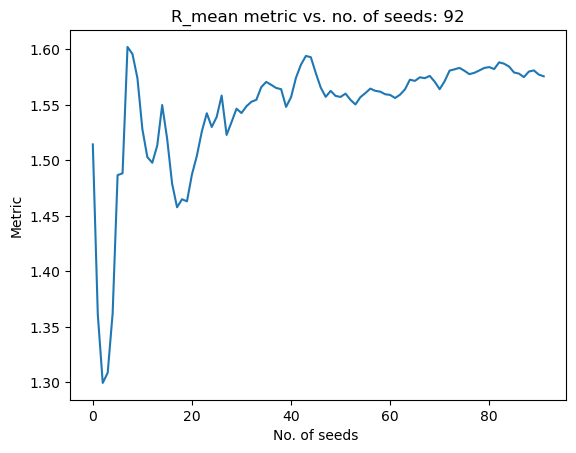

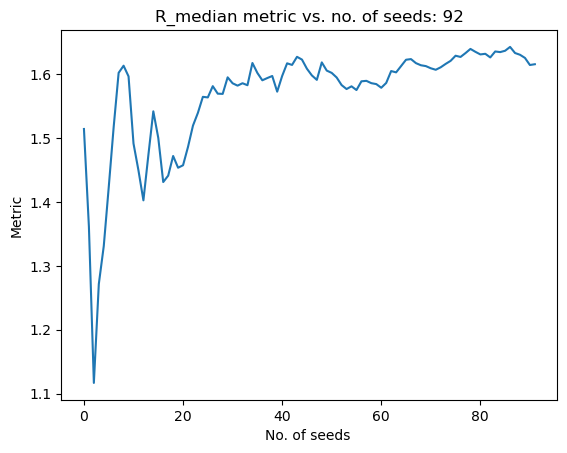

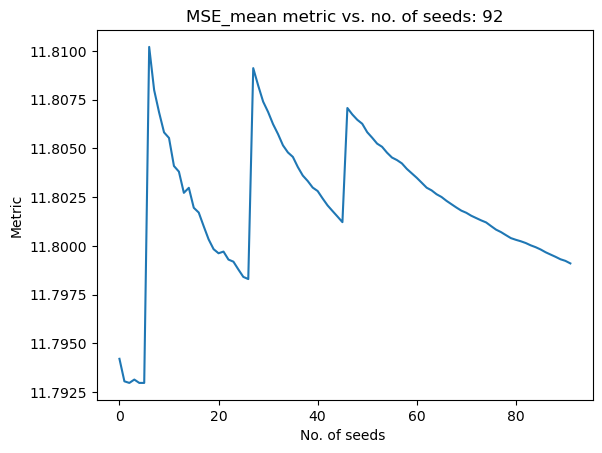

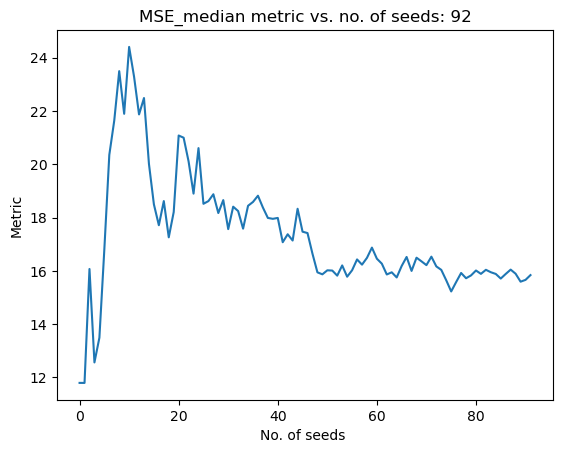

Time required: 2253.158192873001
Best solution found: 
X = [ 0.51423672  7.97547522  8.18119989  1.0468111   7.92042281  8.09394648
  8.3080137   1.58215108  7.65079483  7.68837227  7.40863329  7.5885269
  1.26705292  7.18307861  6.69468065  7.49545735  7.31361593  2.0854266
  8.1082718   0.54054922  7.58644306  7.57932285  7.54752714  6.54586604
  2.09009902  8.11414753  1.51871099  4.5317768   6.55605829  6.52186826
  0.07920189  7.08873923 -1.30102999  0.10785995]
F = [11.79417141]
CV = [0.]
R2: 0.928056700589367
R: 0.9633569954016875
-log10(1-R2): 1.1430096487669752
Mean solution thus far: 
 [0.5864716667180921, 8.04803293078369, 8.252857059910204, 0.7058729330502781, 8.056763313077468, 8.210405515732951, 8.374922971435254, 1.4876655282705358, 7.57713210397607, 7.528669652556491, 7.329002316246982, 7.490232466745689, 1.5559849562528234, 7.499378668721427, 6.877857130929715, 7.788488251134134, 7.596869483794821, 1.7288691744609677, 7.7517408064547135, 1.1397176480950015, 8.185634622

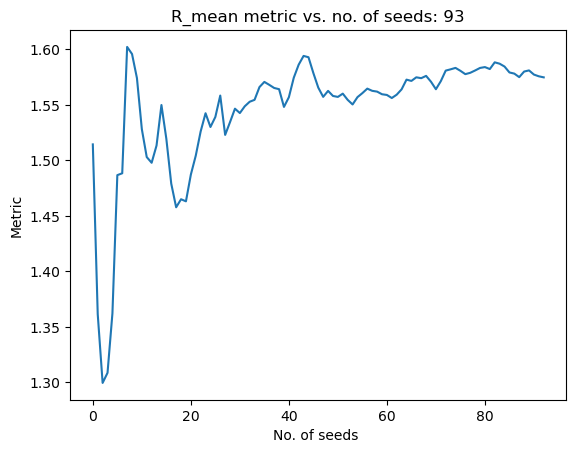

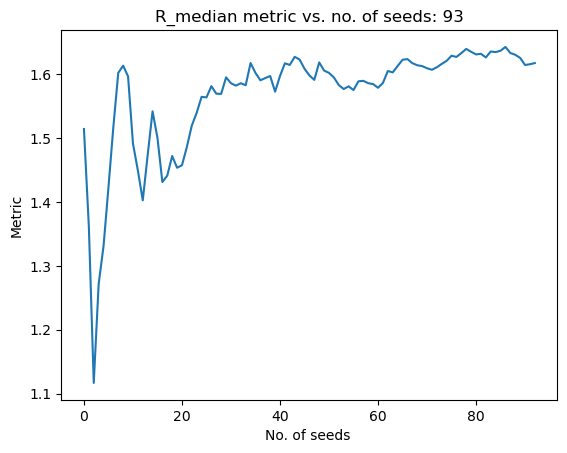

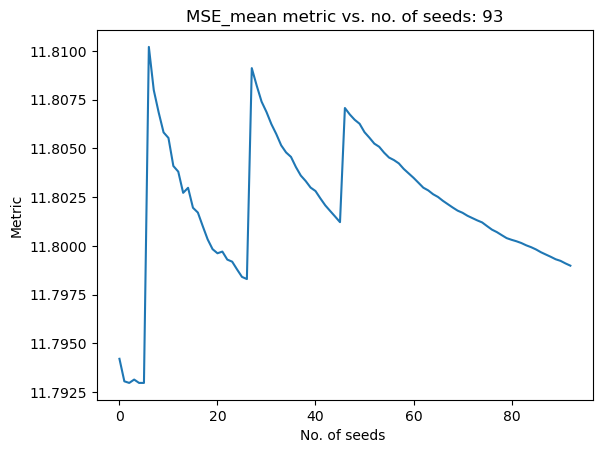

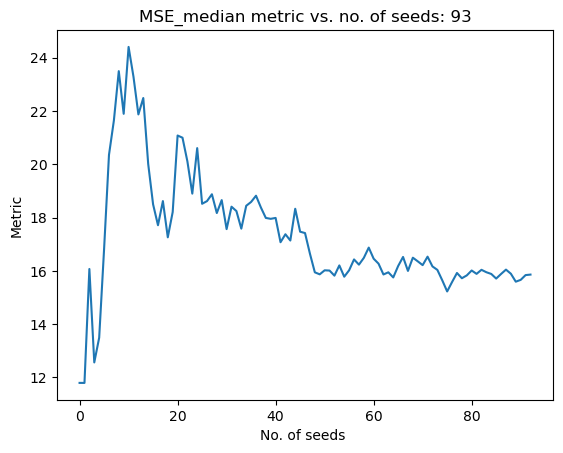

Time required: 2247.7956187725067
Best solution found: 
X = [ 0.72528673  8.18669486  8.39188276  0.64267296  7.90861592  8.06279823
  8.20429371  0.67071036  6.79308942  6.62596308  6.75792467  6.66907368
  1.79116024  7.78504673  7.3615585   8.02757427  7.82184244  1.47634765
  7.49944759  1.60039883  8.64524877  8.63845691  8.60817719  7.60654525
  1.49994275  7.52416643  3.95940955  6.97489413  8.99877067  8.95973175
  0.68655135  7.69625376 -1.30103     0.47596072]
F = [11.7937256]
CV = [0.]
R2: 0.93281350710917
R: 0.9658227099779597
-log10(1-R2): 1.1727180283240521
Mean solution thus far: 
 [0.5879484227456759, 8.049508057705378, 8.254336056698138, 0.705200592920213, 8.055187277013012, 8.208835225418788, 8.373107766497395, 1.478974515799137, 7.5687912243439674, 7.519066391139246, 7.322927022172808, 7.481496734969178, 1.5584868209816902, 7.50241769069005, 6.883002890196678, 7.791031719446853, 7.599262813153815, 1.7261827752134287, 7.749056836097184, 1.144618511717416, 8.1905241345

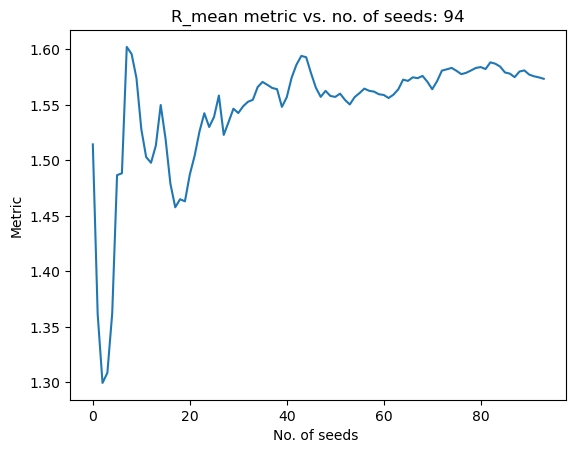

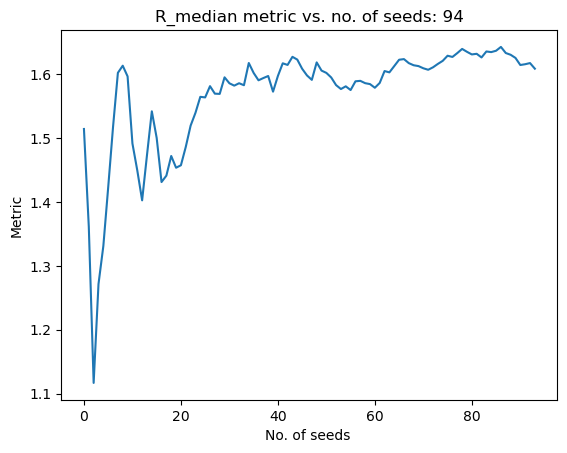

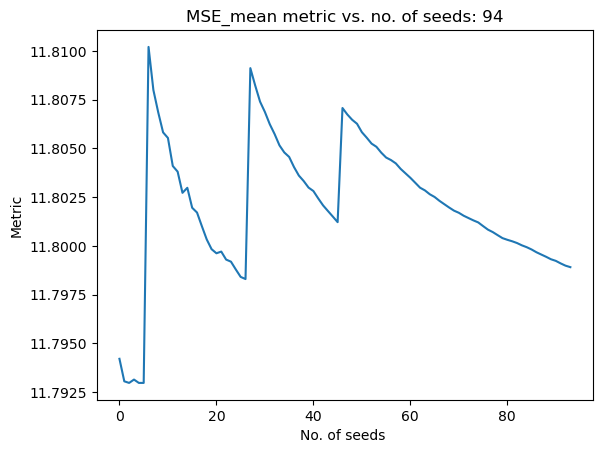

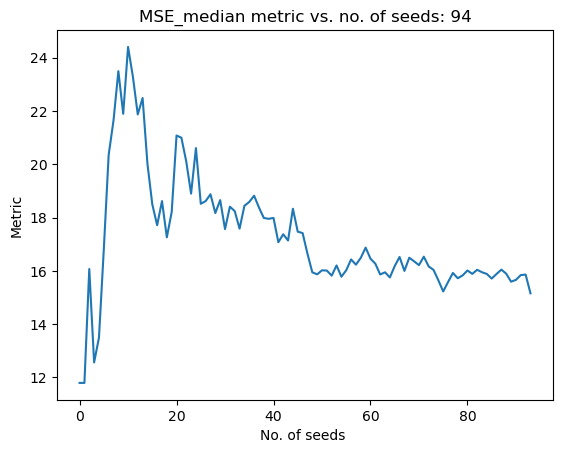

Time required: 2247.8458523750305
Best solution found: 
X = [ 0.47660711  7.93804374  8.14333973  0.25397407  8.13743533  8.25849279
  8.39583188  0.70736754  6.69954385  6.834551    6.44851165  6.73411216
  1.10323914  7.09593783  6.7261735   7.331507    7.13316131  2.65401996
  8.67749828  0.56182955  7.60833054  7.60127351  7.56897531  6.56769586
  0.82907913  6.85357362  0.13382373  3.14788354  5.17153144  5.13668602
  0.05633707  7.06603138 -1.30103     1.06772153]
F = [11.79537673]
CV = [0.]
R2: 0.8200334140701857
R: 0.9055569634596079
-log10(1-R2): 0.7448081220821521
Mean solution thus far: 
 [0.5867764088972969, 8.048334749066724, 8.253167674328239, 0.7004508400521358, 8.056053046025529, 8.209357936582308, 8.373346967681117, 1.4708523371002358, 7.559641252008681, 7.5118609659969575, 7.31372264984306, 7.473629528942311, 1.5536947401661387, 7.498138955319856, 6.88135205449098, 7.786194617087779, 7.594356481524533, 1.7359494823814143, 7.7588299039429405, 1.1384838910532538, 8.1843

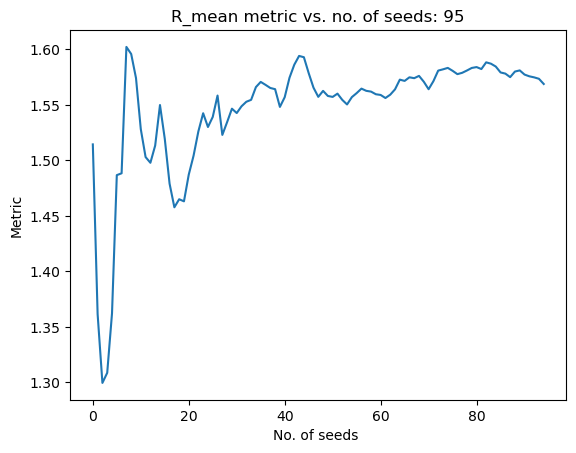

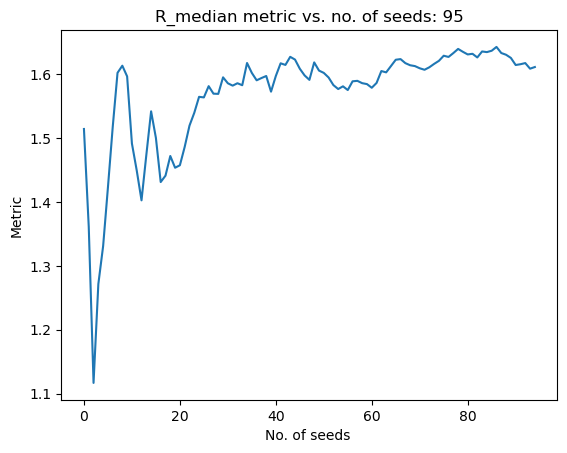

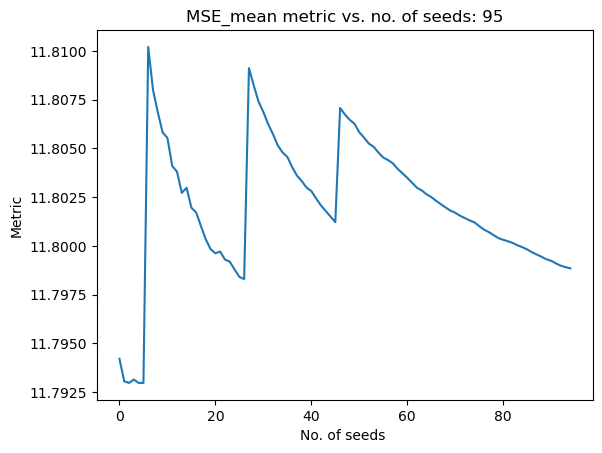

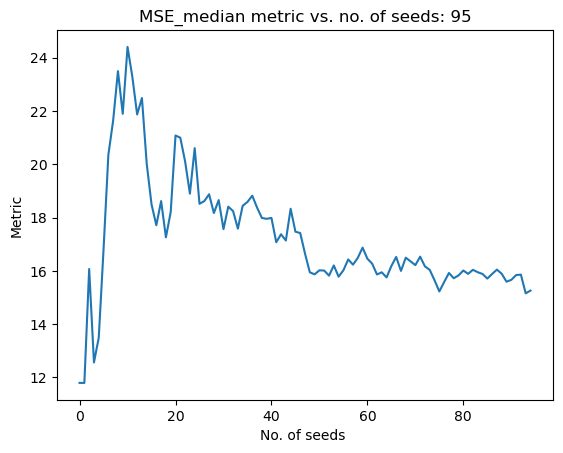

Time required: 2257.3670647144318
Best solution found: 
X = [ 1.04760611  8.50863063  8.71512846  0.95392497  8.62270293  8.73130665
  8.86282533  1.24306455  7.266097    7.33098128  7.11690684  7.2644392
  2.39799283  8.39894099  7.9940726   8.63253912  8.42716643  1.29331981
  7.31673372  0.9792188   8.02521774  8.01825817  7.98674334  6.98511282
  2.77737996  8.80189881  0.70534981  3.71926679  5.74315825  5.70823557
  1.16415905  8.17383906 -1.30103     0.8428157 ]
F = [11.79443684]
CV = [0.]
R2: 0.8902198552454234
R: 0.9435146290574531
-log10(1-R2): 0.9594762008993444
Mean solution thus far: 
 [0.5915767182356415, 8.053129497798524, 8.257979765836419, 0.703091195623394, 8.061955648993195, 8.21479490237862, 8.378445700668737, 1.4684795477000805, 7.556583499334359, 7.50997680260111, 7.311672485111173, 7.471450463067039, 1.5624895118937172, 7.507522309835921, 6.892942893460121, 7.795010705610775, 7.603031585205645, 1.7313387565865865, 7.754224735339283, 1.1368248797044311, 8.18273767

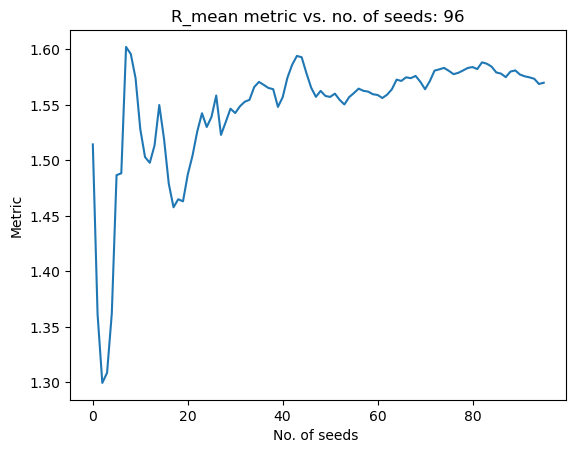

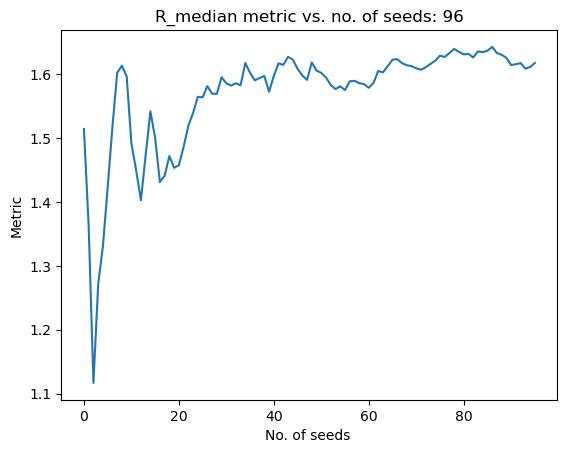

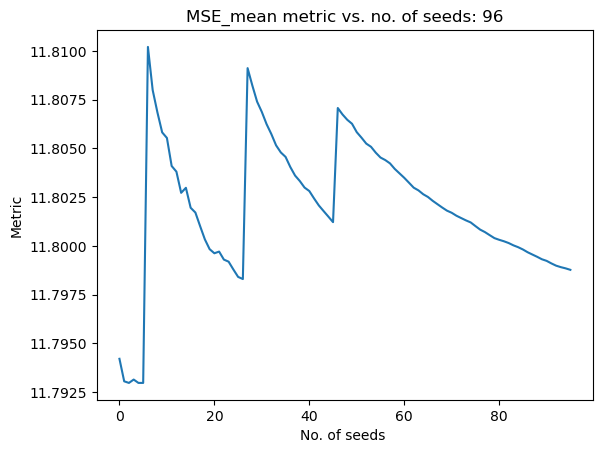

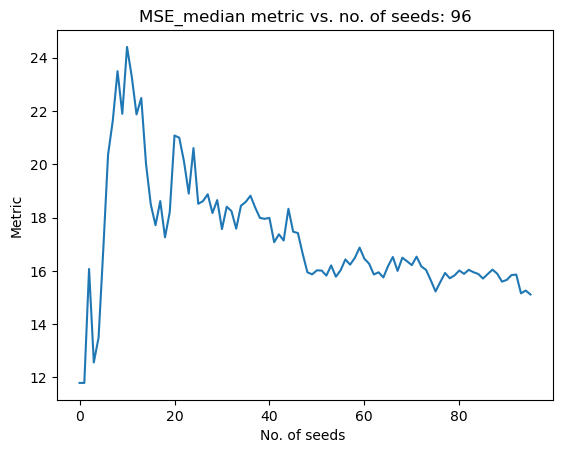

Time required: 2247.9537467956543
Best solution found: 
X = [ 1.17772695  8.63912949  8.8443481   0.36416235  7.48395906  7.61167815
  7.75552466  2.57543012  8.57130355  8.70207631  8.29451359  8.60219349
  1.62702496  7.60301004  7.175078    7.86141275  7.66145654  0.75485592
  6.77797845  1.67987559  8.72477325  8.71789082  8.68762032  7.68617705
  1.42449653  7.44875647  2.95172682  5.96842831  7.99247227  7.95022861
  1.830385    8.84013374 -1.30103     0.30978831]
F = [11.79484397]
CV = [0.]
R2: 0.9397040424486365
R: 0.9693833310144323
-log10(1-R2): 1.219711803481508
Mean solution thus far: 
 [0.5976195040787721, 8.059170734807438, 8.264024800245691, 0.6995970838136208, 8.055996921256442, 8.208577203943438, 8.37202383423588, 1.479891409274678, 7.567044530806099, 7.522266488264478, 7.321804867660184, 7.483107607654167, 1.563154825831326, 7.508506719465752, 6.895851502831384, 7.795695262726635, 7.603633904281978, 1.7212719231701097, 7.744160340655015, 1.1424233406630733, 8.18832567

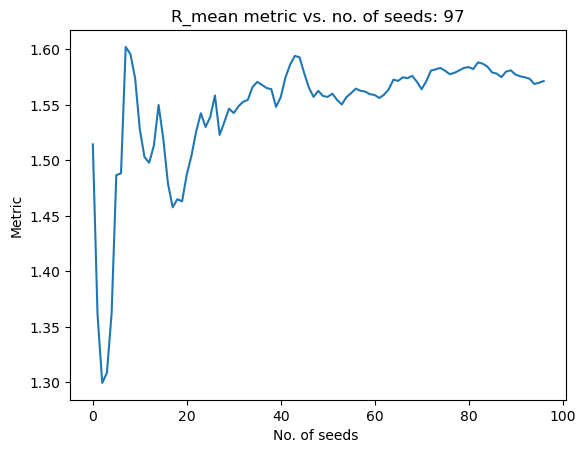

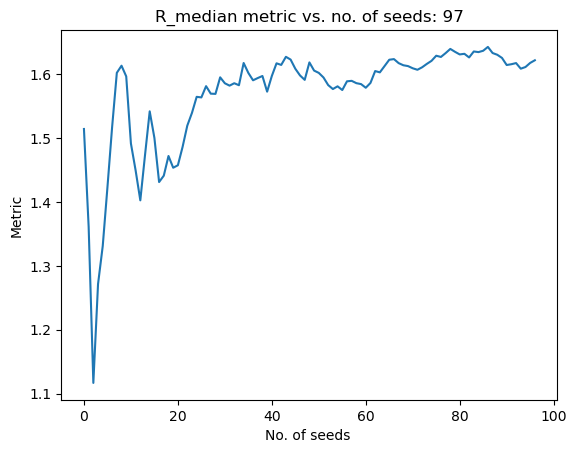

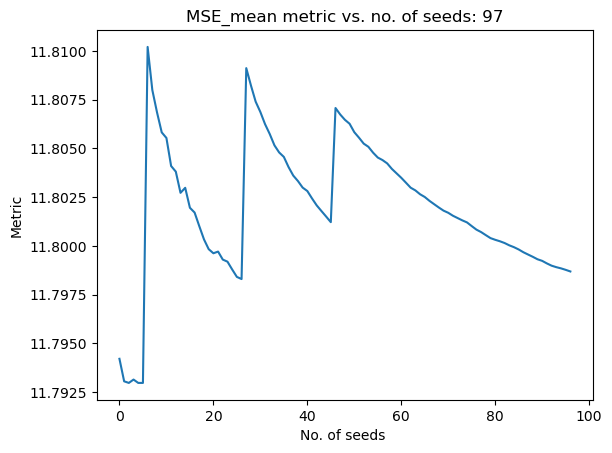

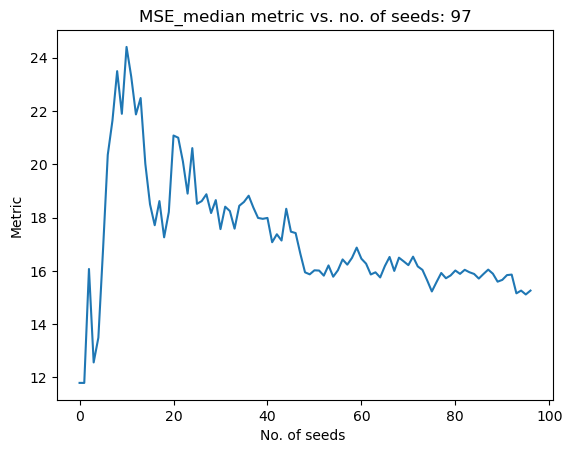

Time required: 2249.3172268867493
Best solution found: 
X = [ 0.93845921  8.40006573  8.60442367  0.51622237  7.74321351  7.91264866
  8.12104075  1.06457957  7.1402151   7.15868428  6.92949533  7.06980925
  2.33728233  8.23876524  7.73289746  8.56478735  8.38620397  0.26912612
  6.29175463  0.75298232  7.7973765   7.79074308  7.76041777  6.75892488
  1.32202118  7.345926    3.85522188  6.87186994  8.89471503  8.8540737
  1.69438808  8.70387544 -1.30103     0.45732951]
F = [11.79423001]
CV = [0.]
R2: 0.931032480181258
R: 0.9649002436424493
-log10(1-R2): 1.1613553916477388
Mean solution thus far: 
 [0.6010974602543655, 8.062649255199963, 8.267498258118211, 0.6977259132172814, 8.05280525382864, 8.2055575249608, 8.369462782348894, 1.4756535333314187, 7.562689128468377, 7.518556465769226, 7.3178017090942555, 7.478890277463352, 1.5710540860313364, 7.515958337063087, 6.904392788149297, 7.803543141214652, 7.611619313077145, 1.706454108811619, 7.729339874231107, 1.1384494527187174, 8.184336394

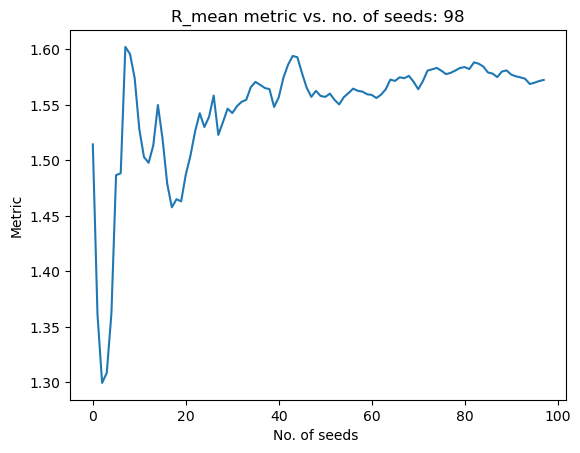

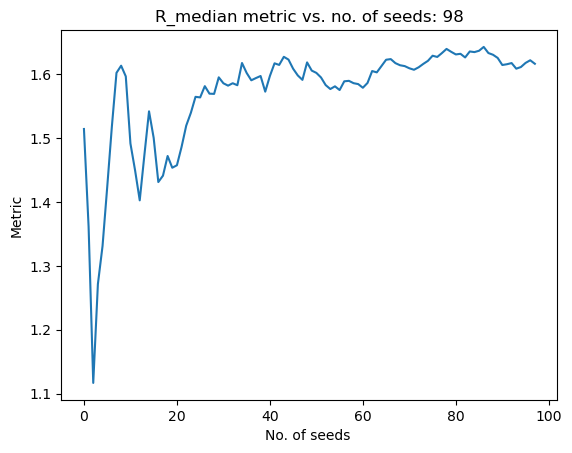

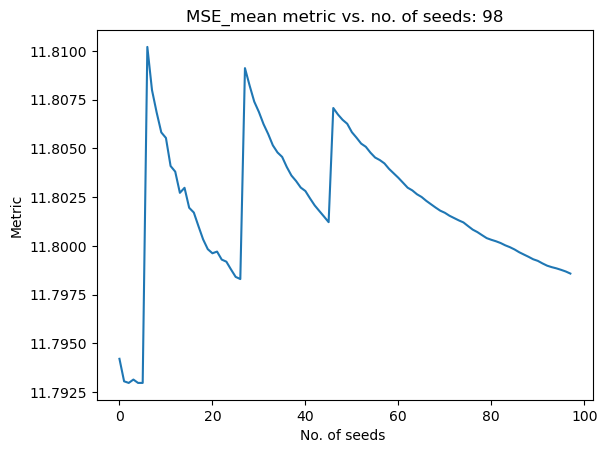

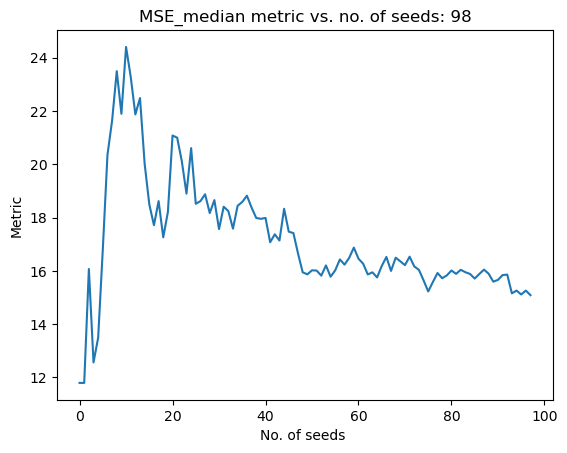

Time required: 2253.6947300434113
Best solution found: 
X = [ 0.03541977  7.495983    7.70405681  0.88156139  8.12969678  8.25573047
  8.38902763  1.82306673  7.8409263   7.91388625  7.64812648  7.84669604
  2.04711337  8.03769867  7.6405053   8.27798334  8.07822872  2.21514544
  8.23854643  0.72875413  7.7748978   7.76839236  7.73594346  6.73461785
  1.76021758  7.78468204  3.91411719  6.92804142  8.95235432  8.91667392
  1.91484288  8.92450043 -1.30103     0.43568063]
F = [11.79423256]
CV = [0.]
R2: 0.9586174714626544
R: 0.9790901242800146
-log10(1-R2): 1.3831829767861115
Mean solution thus far: 
 [0.5953835442111489, 8.056925353638045, 8.261806930361733, 0.6995828371766846, 8.053581935869952, 8.206064322397737, 8.36966040706046, 1.4791627575034512, 7.565499604931697, 7.522549695932703, 7.321138322912866, 7.482605487229581, 1.575862765671519, 7.521228441393319, 6.911828268100593, 7.808335466501961, 7.616332539425846, 1.7115924050399607, 7.734483374777137, 1.1343111161574353, 8.180200

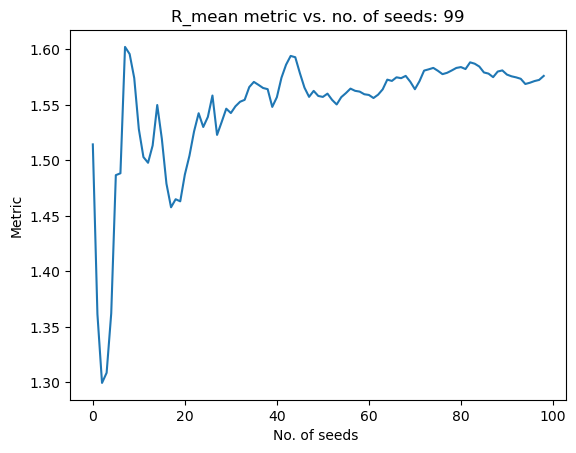

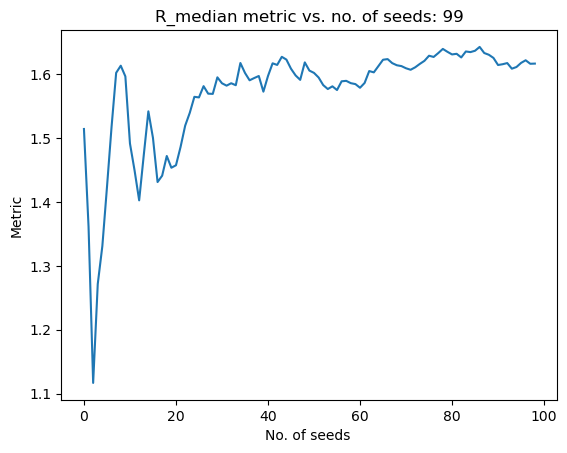

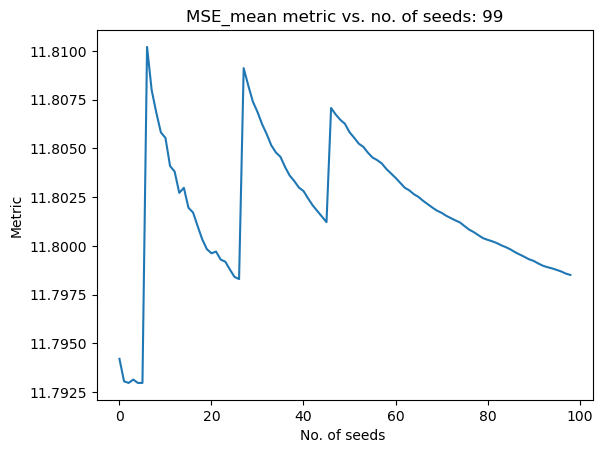

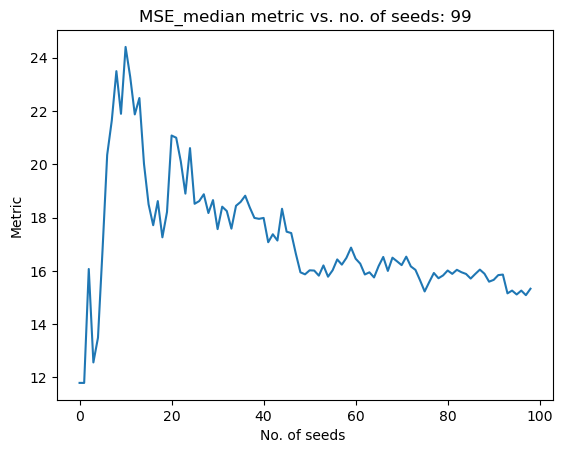

Time required: 2250.2002046108246
Best solution found: 
X = [ 0.32832662  7.78847237  7.99771572  0.58839013  7.91031272  8.06616652
  8.26137611  0.62138881  6.7141119   6.7019015   6.64425111  6.6171806
  2.09384456  8.05658492  7.67938404  8.31320599  8.13099129  2.30859174
  8.33214526  0.56411341  7.60880432  7.60153854  7.57238293  6.57108332
  2.95215312  8.97673573  2.57095589  5.59029862  7.61228113  7.56772311
  0.55759067  7.56758039 -1.30103     0.53975319]
F = [11.79355038]
CV = [0.]
R2: 0.918891806833844
R: 0.9585884449720036
-log10(1-R2): 1.090935273197892
Mean solution thus far: 
 [0.5927129749430151, 8.0542408238449, 8.259166018209052, 0.6984709101030426, 8.052149243725786, 8.204665344415638, 8.368577564100267, 1.470585017983646, 7.556985727908831, 7.514343213931991, 7.314369450752544, 7.473951238375505, 1.5810425836478346, 7.526582006220004, 6.919503825861449, 7.813384171762119, 7.621479126912196, 1.7175623984322135, 7.740459993593756, 1.1286091391353086, 8.1744866878

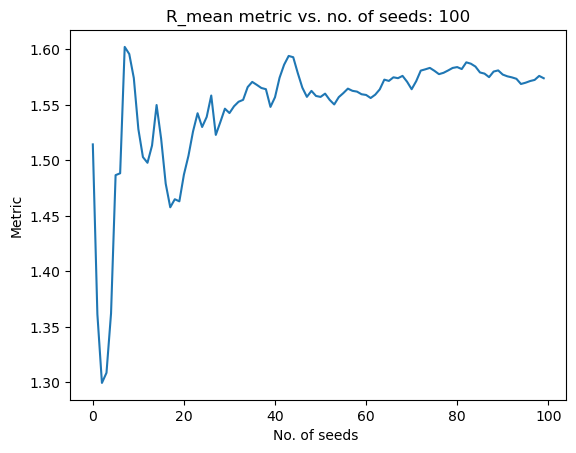

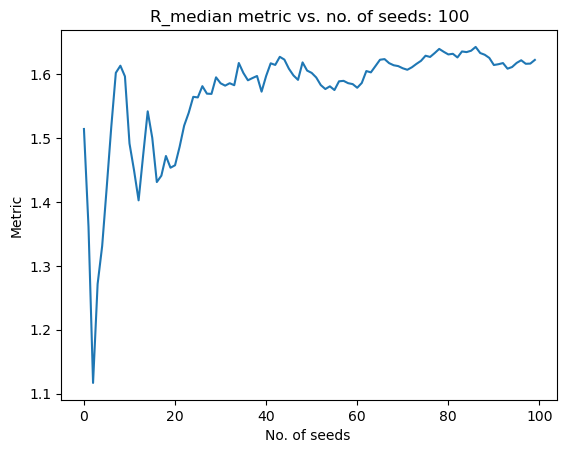

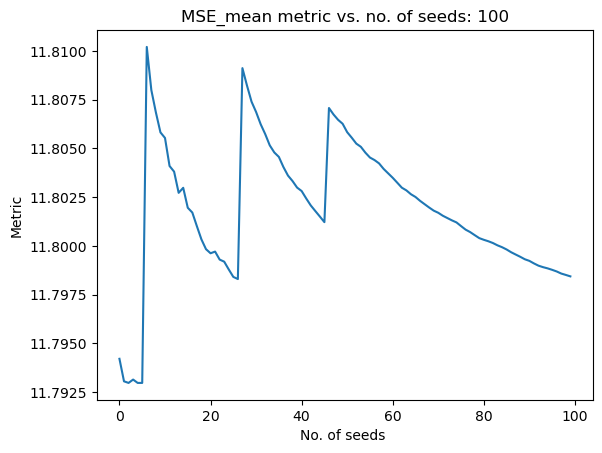

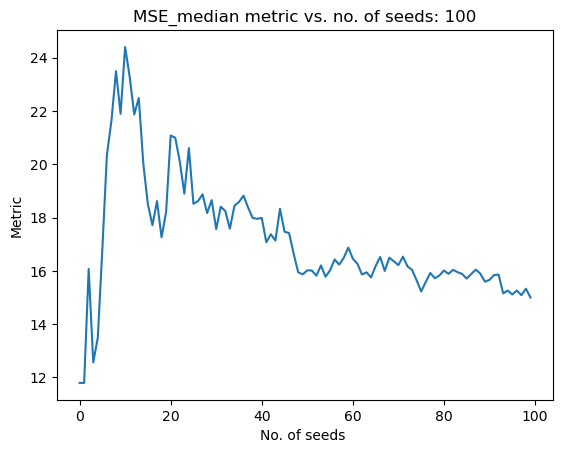

In [72]:
noSeed=100

import random
from pymoo.optimize import minimize
print ('Algorithm in use: ' + algo + '\n') # Opt algorithim in use

# To evaluate MSE
problemInstance = MyProblem()
problemInstance._derivatives_error_fcn_gen(X,y)
OUT = {} # For storing MSE as OUT["F"]

resX_list=[] #1 initiate list to store kr of each seed
MSE_resX_list=[]#2.1 initiate list to store MSE of each seed
R_each_seed_list=[] #2.2 initiate list to store R2 of each seed

averaged_arrays = [] #3 Initialize list to store averaged kr TIL CURRENT SEED
MSE_mean_list=[] # 4.1
R_mean_list=[] #4.2 store R2 of mean kr til current seed

median_arrays=[] #5  Initialize list to cummulatively store median kr TIL CURRENT SEED
MSE_median_list=[] #6.1
R_median_list=[] #6.2 store R2 of mean kr til current seed

for i in range(0,noSeed): # for each seed = 0,1,2,...,noSeed-1
    
    ####1 Calculate kr for current seed
    f_min_history = [] # for storing convergence profile of objective function for current optimization
    def callback(res):
        f_min_history.append(res.opt.get("F").min())
    # The optimization
    res = minimize(problem,
               algorithm,
               termination, 
               callback=callback, parallel=True,                
               seed=i,
               verbose=False)
    resX_list.append(res.X) ####1 store kr for current seed
    MSE_resX_list.append(res.F) ####2.1 store MSE for current seed
    pool.close()
    print('Time required:', res.exec_time)
    print("Best solution found: \nX = %s\nF = %s\nCV = %s" % (res.X, res.F, res.CV))

    
    ####2.2 Calculate & store R-based metric for CURRENT seed
    resX=np.ndarray.tolist(res.X)
    del resX[-2]
    R2, R, neglog = computeR2(resX,logkr)
    R_each_seed_list.append(neglog) ####2.2
    
    
    ####3 Calculate average kr til current seed
    averages = [] # inititate list of mean kr[i]
    for value_idx in range(len(resX_list[0])): # iter thru index of first available kr: 0,1,2,...,len-1
        # calculate average kr[value_idx]
        avg_value = sum(   array[value_idx] for array in resX_list[: len(resX_list) ]   ) / len(resX_list) # [:10] : 0,1,2...,9
        # add average kr[value_idx] to average kr
        averages.append(avg_value) # store average for kr[value_idx] into 'average kr til current seed'
    averaged_arrays.append(averages) # store average kr till current seed 
    print( "Mean solution thus far: \n %s" % (averages) )
    
    ####4.1 Calculate & store MSE from mean kr
    problemInstance._evaluate(averages,OUT)
    MSE_mean= OUT["F"]
    MSE_mean_list.append(MSE_mean[0]) 
    ####4.2 Calculate & store -log10(1-R2) of mean krs til current seed
    del averages[-2]
    mean_R2, mean_R, mean_neglog = computeR2(averages,logkr)
    R_mean_list.append(mean_neglog)
        
    ####5 Calculate median kr til current seed
    medians = [] # inititate list of median kr[i]
    for value_idx in range(len(resX_list[0])): # iter thru index of first available kr: 0,1,2,...,len-1
        # calculate median kr[value_idx]
        XXX=[]
        for array in resX_list[ : len(resX_list) ]:
            XXX.append( array[value_idx] )
        XX=np.array(XXX)
        median_value = np.median(XX)
        # add median kr[value_idx] to median kr
        medians.append(median_value) # store median kr[value_idx] into 'median kr til current seed'
    median_arrays.append(medians) # store median kr till current seed
    print( "Median solution thus far: \n %s" % (medians) )
    
    ####6.1 Calculate MSE from median kr
    problemInstance._evaluate(medians,OUT)
    MSE_median= OUT["F"]
    MSE_median_list.append(MSE_median[0])
    ####6.2 Calculate & store -log10(1-R2) of median kr til current seed
    del medians[-2]
    median_R2, median_R, median_neglog = computeR2(medians,logkr)
    R_median_list.append(median_neglog)

    
    #Create folders with given name to store cummulative R2 plots
    plot_neglog(R_mean_list,"R_mean")# \mean folder
    plot_neglog(R_median_list,"R_median")# \median folder
    
    plot_neglog(MSE_mean_list,"MSE_mean")# \mean folder
    plot_neglog(MSE_median_list,"MSE_median")# \median folder
    
    
    with open('50noise_G3PCX_MM_neglogR_values_HC5.txt', 'w') as file: # OUTPUT file name
        
        ####2.1 MSE of each seed
        file.write("MSE of each kr solution \n\n")
        for item in MSE_resX_list:
            file.write(str(item[0]) + '\n')
        
        ####2.2 R-based metric of each seed
        file.write("-log(1-R2) metric of each kr solution \n\n")
        for item in R_each_seed_list:
            file.write(str(item) + '\n')

        ####4.1 MSE of mean krs
        file.write("\n MSE metric of mean kr \n\n")
        for item in MSE_mean_list:
            file.write(str(item) + '\n')
        ####4.2 R-based metric of mean krs
        file.write("\n -log(1-R2) metric of mean kr \n\n")
        for item in R_mean_list:
            file.write(str(item) + '\n')
            
        ####6.1 MSE of median krs
        file.write("\n MSE metric median kr \n\n")
        for item in MSE_median_list:
            file.write(str(item) + '\n')
        ####6.2 R-based metric of median kr
        file.write("\n -log(1-R2) metric of median kr \n\n")
        for item in R_median_list:
            file.write(str(item) + '\n')
        
        ####1 kr for each seed
        file.write("\n Kr solution for each Seed \n\n")
        for item in resX_list:
            file.write(str(item) + '\n\n')

# Final median Kr & R2 value

In [ ]:
median_Kr_final = median_arrays[noSeed-1]
del median_Kr_final[-2]
median_Kr_R2, median_Kr_R, median_Kr_neglog=computeR2(median_Kr_final,logkr)

for i in range(len (median_Kr_final)):
    print (median_Kr_final[i])

# Final mean Kr & R2 value

In [ ]:
average_Kr_final = averaged_arrays[noSeed-1]
del average_Kr_final[-2]
average_Kr_R2, average_Kr_R, average_Kr_neglog=computeR2(average_Kr_final,logkr)

for i in range(len (average_Kr_final)):
    print (average_Kr_final[i])

## pre-existing things

In [ ]:
# Use stored solution
kr = [1e+01, 10**8.5,10**8.5, # AtoB
      1e+02, 10**9, 10**9, 10**9, # HMGS
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # HMGR
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # MK        
      1e+02, 1e+08, # PMK
      1e+01, 1e+08, 1e+08, 1e+08, 1e+07, # PMD
      1e+01, 1e+07, # IDI 
      1e+03, 1e+06, 1e+08, 1e+08, # GPPS
      1e+01, 1e+08, # LS
      10**0.1] # Vin set to 0.05, ks3
    
import numpy as np
logkr=np.log10(kr)
logkr

In [ ]:
y_mean = np.mean(logkr)
del median_Kr_final[-2]

RSS = 0 # initiate residual sum of square
TSS = 0 # intiate total sum of square
for y,y_hat in zip(logkr,resX):
    print( str(y) + ': ' + str (y_hat) ) 
    RSS = RSS + (y - y_hat)**2
    TSS = TSS + (y - y_mean)**2

# coeff of determination for y = y_hat
R2= 1 -(RSS/TSS)
print ('coeff fit: ' +str(R2) )
print ('r: ' + str(R2**(0.5)) )

In [ ]:
# Use stored solution
kr = [1e+01, 10**8.5,10**8.5, # AtoB
      1e+02, 10**9, 10**9, 10**9, # HMGS
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # HMGR
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # MK        
      1e+02, 1e+08, # PMK
      1e+01, 1e+08, 1e+08, 1e+08, 1e+07, # PMD
      1e+01, 1e+07, # IDI 
      1e+03, 1e+06, 1e+08, 1e+08, # GPPS
      1e+01, 1e+08, # LS
      10**0.1] # Vin set to 0.05, ks3

import numpy as np
logkr=np.log10(kr)
logkr=np.ndarray.tolist(logkr)
y_mean = np.mean(logkr)


# average of log kr of 3 seeds
krseed1 = np.ndarray.tolist(res.X)
krseed10 = [ 1.34677445,  8.86459508,  8.72068479,  0.22732033,  7.85253032,
        7.79052595,  7.57409756,  2.28870365,  5.21379597,  8.55752348,
        6.80313645,  8.34938564,  0.05158923,  6.14696743,  5.28246214,
        6.43955587,  6.04312662,  0.69587499,  6.70823182,  1.68624638,
        8.66839026,  8.67534794,  8.71450485,  7.70616042,  0.32295689,
        6.33111515,  3.68889542,  6.74533321,  8.75261333,  8.6639745 ,
        1.10099455,  8.11054405, -1.30103   ,  0.67166518]
krseed101 = [ 1.40208756,  8.88655455,  9.        ,  0.98327069,  8.20437647,
        8.1250088 ,  7.98346734,  0.43319408,  4.5563004 ,  6.36989142,
        7.16580366,  6.49188593,  1.09328354,  7.24392182,  6.41222964,
        7.43638798,  7.08185726,  1.16658744,  7.18173278,  0.7812721 ,
        7.47752308,  7.71475652,  7.9070189 ,  6.82344891,  0.89933335,
        6.90576415,  1.49347143,  4.59783142,  6.66141546,  6.40750649,
        1.80743151,  8.81286993, -1.30103   ,  0.25513891]

krs = np.array([ krseed1, krseed10, krseed101])

meankr=np.average(krs, axis=0)

meankr=np.ndarray.tolist(meankr)
del meankr[-2]

# R2 of fitting actual logkr =  modeled logkr

RSS = 0 # initiate residual sum of square
TSS = 0 # intiate total sum of square
for y,y_hat in zip(logkr,meankr):
    #print( str(y) + ': ' + str (y_hat) ) 
    RSS = RSS + (y - y_hat)**2
    TSS = TSS + (y - y_mean)**2

# coeff of determination for y = y_hat
R2= 1 -(RSS/TSS)
print ('coeff fit: ' +str(R2) )
print ('r: ' + str(R2**(0.5)) )

for i in range(len (meankr)):
    print (meankr[i])

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a scatter plot using Seaborn
sns.scatterplot(x=logkr, y= meankr, color='blue') #, label='Data Points')

# Add labels and title
#plt.xlabel('True parameter values (log10)')
#plt.ylabel('Fitted parameter values (log10)')

plt.xlim([0, 10])
plt.ylim([0, 10])

plt.xticks(fontsize=18)
plt.yticks(fontsize=18) 

# Add a diagonal line
plt.plot([-15, 15], [-15, 15], color='grey', linestyle='--', label='Diagonal Line')


# Display the plot
plt.show()

# Getting all the array values from the output text file into a list again

In [ ]:
#first copy out only the solutions from the output text file into a new file.

import numpy as np

# Read the data from the file
with open('50noise_G3PCX_MM_neglogR_SolutionsOnly.txt', 'r') as file: #rename this to the NEW FILE WITH ONLY SOLUTIONS
    data = file.read()

# Split the data into individual arrays based on empty lines
blocks = data.strip().split('\n\n')

# Clean and convert each block into a NumPy array
arrays = []
for block in blocks:
    # Remove '[' and ']' characters and split by whitespace to get numeric values
    numeric_values = block.replace('[', '').replace(']', '').split()
    # Convert the list of strings to a NumPy array of floats
    array = np.array(list(map(float, numeric_values)))
    arrays.append(array)
    
krs= arrays
#Now arrays has the list of solutions for all the seeds from the loop, can be visualised/studied further

# calculate R2 of mean Kr

In [ ]:
# Use stored solution
kr = [1e+01, 10**8.5,10**8.5, # AtoB
      1e+02, 10**9, 10**9, 10**9, # HMGS
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # HMGR
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # MK        
      1e+02, 1e+08, # PMK
      1e+01, 1e+08, 1e+08, 1e+08, 1e+07, # PMD
      1e+01, 1e+07, # IDI 
      1e+03, 1e+06, 1e+08, 1e+08, # GPPS
      1e+01, 1e+08, # LS
      10**0.1] # Vin set to 0.05, ks3

import numpy as np
logkr=np.log10(kr)
logkr=np.ndarray.tolist(logkr)
y_mean = np.mean(logkr)

meankr=np.average(krs, axis=0)

meankr=np.ndarray.tolist(meankr)
del meankr[-2]

# R2 of fitting actual logkr =  modeled logkr
RSS = 0 # initiate residual sum of square
TSS = 0 # intiate total sum of square
for y,y_hat in zip(logkr,meankr):
    #print( str(y) + ': ' + str (y_hat) ) 
    RSS = RSS + (y - y_hat)**2
    TSS = TSS + (y - y_mean)**2

# coeff of determination for y = y_hat
R2= 1 -(RSS/TSS)
print ('coeff fit: ' +str(R2) )
print ('r: ' + str(R2**(0.5)) )

for i in range(len (meankr)):
    print (meankr[i])

# Calculate R2 of median Kr

In [ ]:
# Use stored solution
kr = [1e+01, 10**8.5,10**8.5, # AtoB
      1e+02, 10**9, 10**9, 10**9, # HMGS
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # HMGR
      1e+02, 1e+08, 1e+08, 1e+08, 1e+08, # MK        
      1e+02, 1e+08, # PMK
      1e+01, 1e+08, 1e+08, 1e+08, 1e+07, # PMD
      1e+01, 1e+07, # IDI 
      1e+03, 1e+06, 1e+08, 1e+08, # GPPS
      1e+01, 1e+08, # LS
      10**0.1] # Vin set to 0.05, ks3

import numpy as np
logkr=np.log10(kr)
logkr=np.ndarray.tolist(logkr)
y_mean = np.mean(logkr)

mediankr=np.median(krs, axis=0)

mediankr=np.ndarray.tolist(mediankr)
del mediankr[-2]

# R2 of fitting actual logkr =  modeled logkr
RSS = 0 # initiate residual sum of square
TSS = 0 # intiate total sum of square
for y,y_hat in zip(logkr,mediankr):
    #print( str(y) + ': ' + str (y_hat) ) 
    RSS = RSS + (y - y_hat)**2
    TSS = TSS + (y - y_mean)**2

# coeff of determination for y = y_hat
R2= 1 -(RSS/TSS)
print ('coeff fit: ' +str(R2) )
print ('r: ' + str(R2**(0.5)) )

for i in range(len (mediankr)):
    print (mediankr[i])